<a href="https://colab.research.google.com/github/tommydb26/datasci112-playlist-generator/blob/main/Final_Project_Machine_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import make_pipeline
from sklearn.cluster import KMeans, AgglomerativeClustering

In [2]:
df = pd.read_csv("/content/spotify.csv")
df.set_index("track.name", inplace=True)
df

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,3,4,5,6,7,8,9,10,11,12
track.name,,,,,,,,,,,,,,,,,,,,,
You,'Miley Cyrus',False,6FAsJDkg4y5JSWP9ZMKlDj,72,0.625,0.5680,11,-5.663,1,0.0324,...,11.539323,-12.510097,23.383751,-16.174316,8.328809,-2.556505,-4.282422,-3.378086,-10.891944,2.584110
Easy (LIke Sunday Morning),'Charles Givings',False,5lnLxpRxCDlqedyWgkBLOh,46,0.584,0.4350,10,-11.736,0,0.0263,...,18.214885,-0.140513,24.040165,-24.511405,-3.840630,-6.885928,-2.012070,-1.377134,-7.607562,1.503317
Baby I'm-a Want You,'Bread',False,7IX2e7pEShera9T1QIMvi7,63,0.613,0.2890,8,-16.529,1,0.0305,...,-12.316468,-12.847976,25.861839,-19.737157,-10.335721,-1.827133,-7.192570,-1.878703,-7.335082,-1.149978
Everything I Own,'Bread',False,52VIdyKqp1pJRSyUQaxKUA,69,0.365,0.3380,2,-13.406,1,0.0322,...,2.044856,-5.262738,31.014177,-18.898640,-13.315408,-2.899277,-7.657300,-0.368305,-6.512232,-6.191590
Apocalypse,'Cigarettes After Sex',False,3AVrVz5rK8Hrqo9YGiVGN5,80,0.369,0.4670,5,-9.018,1,0.0274,...,-16.650313,-22.373093,-1.733394,-29.764263,7.681281,-1.659771,-2.585452,-2.547789,-8.395570,-1.803018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Godspeed,'Frank Ocean',False,34xTFwjPQ1dC6uJmleno7x,71,0.399,0.0969,6,-12.578,1,0.0509,...,5.840797,-22.330447,25.515002,-17.792400,-15.280099,1.405760,-9.261899,-9.622248,-5.609669,2.967544
Writer In The Dark,'Lorde',False,193Dm5SqYy3hTSbuzxbwKc,64,0.325,0.2710,7,-8.069,1,0.0418,...,20.611754,-9.098635,29.450032,-13.189979,-17.050438,-2.646305,-14.314003,-4.656721,-10.477538,-4.439217
Mood Ring,'Lorde',False,6FE9EXi8TYg09hR4xv5PWJ,0,0.709,0.4590,5,-11.193,1,0.0654,...,-33.694737,-19.618376,30.164256,-24.133622,-19.055563,-6.317596,-6.653428,-2.188997,-8.915563,-1.431539


A metric I came up with for evaluating a playlist is the sum of the standard deviation of each variable within a playlist, averaged over all of the clusters with more than 10 songs. Further, these will be the clusters I actually consider "playlists" — clusters with more than 10 songs.

In [3]:
# the goodness of one playlist with all of the songs according to this metric

df.std().sum()

<ipython-input-3-4b5e714ddb73>:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.std().sum()


61233.73013994849

In [4]:
df.columns

Index(['artists', 'explicit', 'id', 'popularity', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'time_signature', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10',
       '11', '12'],
      dtype='object')

# Column Transformers

The following are all of the different combinations of variables I tested as training data.

In [5]:
# uses everything

col_transformer_everything = make_column_transformer(
    ('drop', ['artists', 'id']),
    (OneHotEncoder(), ["explicit", "time_signature", "mode", "key"]),
    remainder=StandardScaler()
)

In [6]:
# uses everything except popularity

col_transformer_nopop = make_column_transformer(
    ('drop', ['artists', 'id', 'popularity']),
    (OneHotEncoder(), ["explicit", "time_signature", "mode", "key"]),
    remainder=StandardScaler()
)

In [7]:
# uses only timbre vector

col_transformer_timbre = make_column_transformer(
    ('drop', ['artists', 'explicit', 'id', 'popularity', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'time_signature']),
    remainder=StandardScaler()
)

In [8]:
# uses everything except the timbre vector

col_transformer_notimbre = make_column_transformer(
    (StandardScaler(), ['popularity', 'danceability', 'energy', 'loudness', 'speechiness', 
                        'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']),
    (OneHotEncoder(), ["explicit", "time_signature", "mode", "key"]),
    remainder="drop"
)

In [9]:
# uses only "vibe" metrics

col_transformer_vibes = make_column_transformer(
    (StandardScaler(), ['danceability', 'energy', 'loudness', 'speechiness', 
                        'acousticness', 'instrumentalness', 'valence']),
    remainder="drop"
)

# Heirarchical Clustering - Hyperparamer Tuning

I began with a heirarchical clustering model thinking its increased flexibility would help capture less obvious similarity between songs.

In [10]:
model = AgglomerativeClustering(n_clusters=20, linkage="single")

pipeline = make_pipeline(
    col_transformer_everything,
    model
)

In [11]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You,'Miley Cyrus',False,6FAsJDkg4y5JSWP9ZMKlDj,72,0.625,0.5680,11,-5.663,1,0.0324,...,-12.510097,23.383751,-16.174316,8.328809,-2.556505,-4.282422,-3.378086,-10.891944,2.584110,0
Easy (LIke Sunday Morning),'Charles Givings',False,5lnLxpRxCDlqedyWgkBLOh,46,0.584,0.4350,10,-11.736,0,0.0263,...,-0.140513,24.040165,-24.511405,-3.840630,-6.885928,-2.012070,-1.377134,-7.607562,1.503317,0
Baby I'm-a Want You,'Bread',False,7IX2e7pEShera9T1QIMvi7,63,0.613,0.2890,8,-16.529,1,0.0305,...,-12.847976,25.861839,-19.737157,-10.335721,-1.827133,-7.192570,-1.878703,-7.335082,-1.149978,0
Everything I Own,'Bread',False,52VIdyKqp1pJRSyUQaxKUA,69,0.365,0.3380,2,-13.406,1,0.0322,...,-5.262738,31.014177,-18.898640,-13.315408,-2.899277,-7.657300,-0.368305,-6.512232,-6.191590,0
Apocalypse,'Cigarettes After Sex',False,3AVrVz5rK8Hrqo9YGiVGN5,80,0.369,0.4670,5,-9.018,1,0.0274,...,-22.373093,-1.733394,-29.764263,7.681281,-1.659771,-2.585452,-2.547789,-8.395570,-1.803018,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Godspeed,'Frank Ocean',False,34xTFwjPQ1dC6uJmleno7x,71,0.399,0.0969,6,-12.578,1,0.0509,...,-22.330447,25.515002,-17.792400,-15.280099,1.405760,-9.261899,-9.622248,-5.609669,2.967544,0
Writer In The Dark,'Lorde',False,193Dm5SqYy3hTSbuzxbwKc,64,0.325,0.2710,7,-8.069,1,0.0418,...,-9.098635,29.450032,-13.189979,-17.050438,-2.646305,-14.314003,-4.656721,-10.477538,-4.439217,0
Mood Ring,'Lorde',False,6FE9EXi8TYg09hR4xv5PWJ,0,0.709,0.4590,5,-11.193,1,0.0654,...,-19.618376,30.164256,-24.133622,-19.055563,-6.317596,-6.653428,-2.188997,-8.915563,-1.431539,0


1
59430.55192266661


<ipython-input-11-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


The songs are basically all in one playlist as you can see. So, I tried complete linkage.

In [12]:
model = AgglomerativeClustering(n_clusters=20, linkage="complete")

pipeline = make_pipeline(
    col_transformer_nopop,
    model
)

In [13]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Apocalypse,'Cigarettes After Sex',False,3AVrVz5rK8Hrqo9YGiVGN5,80,0.369,0.467,5,-9.018,1,0.0274,...,-22.373093,-1.733394,-29.764263,7.681281,-1.659771,-2.585452,-2.547789,-8.395570,-1.803018,0
Breathe (In the Air),'Pink Floyd',False,2ctvdKmETyOzPb2GiJJT53,71,0.431,0.373,11,-15.142,0,0.0346,...,-9.831567,2.595320,-26.626682,15.169157,3.284423,-18.406311,-6.058646,-6.216700,-5.683783,0
The Great Gig in the Sky,'Pink Floyd',False,2TjdnqlpwOjhijHCwHCP2d,74,0.274,0.217,5,-13.814,1,0.0345,...,-7.628442,23.606507,-26.378052,16.328114,5.325174,-21.299671,-10.384733,-4.311208,2.909533,0
Come to Atlanta,'Faye Webster',False,1MenPeY2vhqhoKgCkUgFtc,50,0.613,0.589,2,-9.849,1,0.0360,...,-1.703759,3.884974,-21.327019,-1.261567,-16.758691,-1.870225,-4.885464,-17.696538,-4.633790,0
Amandla's Interlude,'Steve Lacy',False,13HOw2SzGkOKUMV35K6yhs,47,0.182,0.249,0,-11.835,1,0.0395,...,-7.444740,22.568149,-24.776931,1.513368,1.166242,-14.127439,-8.008103,-2.173724,7.420383,0
I Know I'm Funny haha,'Faye Webster',True,3V66T9O5aOycr8raWMpyLP,49,0.725,0.376,5,-10.421,1,0.0307,...,-13.207320,0.090990,-17.106229,4.819024,2.621044,-4.401433,-13.108581,-14.571984,-1.954839,0
Chamber Of Reflection,'Mac DeMarco',False,7H7NyZ3G075GqPx2evsfeb,81,0.538,0.557,11,-8.678,1,0.0914,...,-0.705324,15.130860,-24.281612,28.803211,2.359978,-14.113843,-12.746236,-7.452734,11.502374,0
My Kind of Woman,'Mac DeMarco',False,6jgkEbmQ2F2onEqsEhiliL,78,0.501,0.765,6,-7.063,0,0.0281,...,-19.646230,3.227777,-31.000927,2.514629,-1.994745,7.201086,1.194598,-7.236184,5.170745,0
Symphony,'Maggie Rogers',False,7IFkBotMhW6cSOxdVNZIZN,46,0.505,0.761,11,-6.279,1,0.0454,...,-22.190999,-7.665351,-32.054432,-4.237189,-4.394320,-5.327399,-0.824493,-6.912384,2.569166,0


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Easy (LIke Sunday Morning),'Charles Givings',False,5lnLxpRxCDlqedyWgkBLOh,46,0.584,0.435,10,-11.736,0,0.0263,...,-0.140513,24.040165,-24.511405,-3.840630,-6.885928,-2.012070,-1.377134,-7.607562,1.503317,1
Alaska - Acoustic,'Maggie Rogers',False,3rST7c7KrUNLAmWGb8ZKUI,40,0.505,0.107,9,-9.303,0,0.0321,...,-15.039087,26.548692,-7.165759,-10.329625,-6.594339,0.660608,-0.502576,-11.331909,5.556848,1
Take Me to the Mardi Gras,'Paul Simon',False,2qQrVJQ7zXAyvqX1IkwsS2,38,0.688,0.473,9,-14.042,1,0.0268,...,-5.788051,29.894477,-24.377553,1.874058,-10.516541,-1.424960,-3.069251,-7.416675,2.123859,1
PURE/HONEY,'Beyoncé',True,4DByEumlGTZKSzuVEZ35eo,69,0.857,0.558,1,-7.888,1,0.1340,...,-4.509294,10.079480,-18.892160,-3.137488,2.504739,-12.542666,3.791499,-15.666113,-1.763098,1
AMERICA HAS A PROBLEM,'Beyoncé',True,2XMAWynSTIst5KmLSv0Npf,76,0.789,0.614,1,-6.491,1,0.0579,...,-8.232917,-1.314313,-24.915222,1.380918,-2.126728,-12.379290,4.188867,-14.875809,-2.542633,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Dress,'Taylor Swift',False,6oVxXO5oQ4pTpO8RSnkzvv,72,0.719,0.469,0,-8.792,1,0.0533,...,-17.679044,5.128420,-14.355740,19.835607,4.401788,-12.890652,0.656674,-19.155159,-10.763164,1
...Ready For It?,'Taylor Swift',False,2yLa0QULdQr0qAIvVwN6B5,73,0.613,0.764,2,-6.509,1,0.1360,...,-10.215074,25.399699,-27.558179,-0.327923,2.166066,-5.297062,3.954811,-12.064231,-1.923371,1
Jealous,'Beyoncé',False,63wKtmUg754umO8SglEL79,51,0.452,0.540,8,-10.087,1,0.2290,...,-11.962286,21.994435,-26.406162,9.142615,5.104391,5.571042,-0.425184,-13.516335,-6.014332,1


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Fuck Me Pumps,'Amy Winehouse',True,3ku4ScVEkZvurrcjmMrOAL,47,0.876,0.487,7,-6.454,1,0.0926,...,-5.076380,36.470302,-0.694807,-16.096645,-6.650556,-1.577161,-3.189312,-19.151842,-7.000035,3
I Didn't Change My Number,'Billie Eilish',True,7bcy34fBT2ap1L4bfPsl9q,70,0.849,0.480,9,-5.835,1,0.2260,...,4.274446,23.203406,-15.667673,1.600034,3.760706,1.545560,1.070542,-15.831174,7.384048,3
2AM,'SZA',True,3vZGtceCbJVh5aDT4XhE0p,67,0.504,0.267,9,-13.678,0,0.4060,...,-6.514807,43.008392,-13.355151,-11.460120,-3.480171,-5.274240,-2.401803,-17.762636,0.912189,3
Be Your Girl (Kaytranada Edition),"'Teedra Moses', 'KAYTRANADA'",False,38spM0LahLUfQhOMAqA7AI,62,0.864,0.682,6,-6.730,0,0.3860,...,-6.609855,26.798237,-8.862518,8.467867,-8.369029,-7.060277,-0.328501,-18.966348,2.905395,3
Poetic Justice,"'Kendrick Lamar', 'Drake'",True,2P3SLxeQHPqh8qKB6gtJY2,70,0.779,0.572,6,-9.985,0,0.3780,...,4.703164,21.746998,-10.060300,-12.693603,1.798533,-10.839872,2.882803,-16.408318,-5.965143,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Garden (Say It Like Dat),'SZA',True,19woxaSpjOefa2JnAOoqW5,69,0.730,0.457,9,-7.260,1,0.2830,...,-1.374062,32.290624,-14.145124,-8.472219,1.145756,6.258106,3.049975,-14.689747,-2.306378,3
Ain't Shit,'Doja Cat',True,5lAnYvAIkSDNXqfo7DyFUm,76,0.855,0.488,3,-4.601,1,0.2080,...,-4.891175,58.898424,-2.694682,-24.595662,1.884141,0.312172,2.984452,-17.284402,0.732499,3
Jerome,'Lizzo',False,2kKwohMyKCOAEDXRuW9CeF,40,0.674,0.542,8,-6.983,1,0.2530,...,-1.425272,42.814977,-13.867581,-3.841455,2.428762,-8.136310,-4.203674,-12.650935,2.221358,3


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Curl up & Die,'Matt Maltese',False,0mDn9q0XZBVI3xICivkTY1,63,0.615,0.281,11,-8.468,1,0.0273,...,-12.258352,24.548194,-20.577788,4.670543,-4.982490,-9.091635,-8.309989,-8.090082,4.942454,4
Sound & Color,'Alabama Shakes',False,26HaY4D7AV0gVxmkz11bIz,54,0.547,0.430,2,-7.393,1,0.0667,...,-16.297593,25.765727,-20.365159,-2.395332,-2.873722,-0.571137,0.914253,-10.946740,0.932937,4
lakes,'Gia Margaret',False,7BB3xvwxys9mkGM58jDgiD,50,0.391,0.335,5,-22.744,1,0.0577,...,-22.565103,38.232155,-29.199009,-23.203958,-9.989709,-1.864549,-4.570601,-3.513723,7.811869,4
Thanksgiving in Sacramento,'Jon Brion',False,5y6tawMZjDF9ztCmfWZYYd,39,0.466,0.176,10,-19.604,1,0.0415,...,-31.230993,5.969221,-27.660537,-0.431529,-9.916191,-5.753721,-3.301912,-8.115912,7.185316,4
Labyrinth,'Taylor Swift',False,0A1JLUlkZkp2EFrosoNQi0,72,0.406,0.306,0,-15.480,1,0.0517,...,-10.823584,32.520697,-29.085792,2.605896,3.117490,-6.370856,-5.145419,-4.242358,-2.053022,4
Static,'Steve Lacy',True,4OmfWzukSVD140NiAIEjem,78,0.335,0.305,1,-12.661,1,0.0741,...,-28.731210,7.055721,-23.020032,20.826957,0.134523,-0.928799,-3.382233,-14.527352,0.596719,4
Like Real People Do,'Hozier',False,57V4uc2b2diZ4RPHXWecb9,69,0.539,0.179,7,-14.330,1,0.0309,...,-38.145081,10.505367,-17.633911,-15.585200,-4.173442,7.177093,-2.523945,-11.225324,-1.655005,4
Never Gonna Be Alone (feat. Lizzy McAlpine & John Mayer),"'Jacob Collier', 'Lizzy McAlpine', 'John Mayer'",False,5m9OR6G4lNt9Da6dy1xpHx,60,0.576,0.423,0,-9.218,1,0.0265,...,-24.100464,30.677182,-33.041598,3.559498,-4.891214,-6.506677,-5.629098,-8.232735,-3.990417,4
Buzzcut Season,'Lorde',False,51QEyJI5M7uyd8DOh9tqQY,68,0.733,0.620,1,-10.525,1,0.0750,...,-2.183714,26.048225,-26.028048,19.985397,-0.005687,-8.661440,-6.822114,-8.872283,1.135759,4


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Left Side,'Eloise',False,3yAlkOEMjk2rH2hZTgvfoH,54,0.713,0.2350,0,-13.420,1,0.0856,...,-25.358827,39.515453,-20.415297,-19.803366,-3.504027,-7.624029,1.492522,-12.024376,1.143748,5
Bruises,'Reneé Rapp',True,5kUqU9uLc98ndpJiqieN8K,68,0.496,0.3450,9,-7.893,1,0.1500,...,-17.555120,55.312258,-15.671605,-9.482742,-1.774066,-5.522894,-5.355880,-12.504603,2.670728,5
(There Is) No Greater Love,'Amy Winehouse',False,4VbqUDBWyK15pTal9THtFu,43,0.388,0.2380,1,-12.887,0,0.0492,...,-29.314434,39.451872,-19.159932,-15.630462,3.956874,6.671161,2.664601,-11.111639,8.049123,5
Maybe It's You,'Carpenters',False,6Gqb3fskMAjy90VmIe0nVG,32,0.204,0.2210,10,-15.813,1,0.0333,...,-11.985624,33.561260,-23.332915,-15.190248,0.426539,-5.476458,-4.139676,-4.045510,4.463520,5
Desert Song,'säje',False,1j800qQ0uge8cVdw9BQ3dp,39,0.354,0.1670,3,-14.403,1,0.0341,...,-28.879311,41.553912,-26.518224,-16.693557,-0.337459,-1.856066,-1.086457,-4.480118,5.215382,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
happier,'Olivia Rodrigo',True,2tGvwE8GcFKwNdAXMnlbfl,81,0.395,0.4430,6,-9.720,1,0.1330,...,-17.111960,35.173572,-17.311833,-11.785512,-0.219723,0.160862,-1.330753,-11.071262,5.217078,5
favorite crime,'Olivia Rodrigo',False,5JCoSi02qi3jJeHdZXMmR8,81,0.369,0.2720,9,-10.497,1,0.0364,...,-17.756666,30.323662,-17.491887,-4.369034,-2.906642,-11.171012,-0.601364,-10.454034,6.273300,5
Daylight,'Taylor Swift',False,1fzAuUVbzlhZ1lJAx9PtY6,72,0.557,0.4960,0,-9.602,1,0.0563,...,-17.016736,40.313781,-22.851701,-6.844774,-0.395348,0.511132,-3.146382,-8.639239,0.342921,5


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Baby I'm-a Want You,'Bread',False,7IX2e7pEShera9T1QIMvi7,63,0.613,0.289,8,-16.529,1,0.0305,...,-12.847976,25.861839,-19.737157,-10.335721,-1.827133,-7.192570,-1.878703,-7.335082,-1.149978,6
Stop This Train,'John Mayer',False,3E6iea9uEmB7gRru4lyP6h,62,0.619,0.437,7,-11.756,1,0.0314,...,-17.882009,21.435657,-26.115263,4.878741,-8.452971,1.205798,-2.966991,-7.885502,5.457850,6
Only A Fool Would Say That,'Steely Dan',False,7GVvj4zJNVuBJSl6StEfn5,59,0.759,0.367,0,-19.024,1,0.0367,...,-14.769276,42.728007,-15.361392,-14.763137,-0.110749,-10.414754,7.690538,-8.753886,-1.784999,6
America,'Simon & Garfunkel',False,6dfhF1BDGmhM69fnCb6wSC,61,0.259,0.241,2,-15.955,1,0.0420,...,-26.960199,12.660513,-23.816712,-12.845377,-7.151621,-3.897267,2.686917,-8.505786,11.071975,6
Just a Song Before I Go,"'Crosby, Stills & Nash'",False,4dAN7KcWCWx5jV6dpwtfvN,61,0.671,0.233,11,-18.003,0,0.0378,...,-21.906276,29.690000,-18.886262,-9.041748,-6.579756,-6.785675,-2.744198,-10.568795,2.276254,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FourFiveSeconds,"'Rihanna', 'Kanye West', 'Paul McCartney'",False,78TTtXnFQPzwqlbtbwqN0y,77,0.582,0.272,2,-5.662,1,0.0501,...,-23.871628,26.510451,8.321819,-9.755032,-3.476820,-4.844084,2.471720,-18.797968,-1.101783,6
Mariners Apartment Complex,'Lana Del Rey',True,6OG05bPAwUuV3OMvy2Vy1P,69,0.531,0.252,9,-12.765,1,0.0280,...,-19.857716,19.416237,-17.261066,-13.717659,-3.997515,0.784167,-3.587965,-9.944322,-5.942815,6
Bartender,'Lana Del Rey',False,5USsRaiqL1RNKRm1fTJ3JM,59,0.582,0.102,9,-14.712,0,0.0391,...,-23.439687,47.237034,-10.782470,-16.121247,-7.543464,-3.012081,-12.978333,-11.163526,7.816581,6


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Sure Don't Miss You,'The Dip',False,0lEWIegMNMQ7W1ooB1zWT2,58,0.667,0.586,4,-7.985,0,0.0283,...,7.141838,17.602777,-16.949370,5.803725,1.487693,-7.088532,1.833925,-11.248653,-5.126440,7
Only If,'Steve Lacy',False,7wNAM0qzErN5Dr9uV6B3fW,64,0.811,0.402,4,-4.908,1,0.0406,...,21.626860,20.837118,-30.786725,-19.152424,-3.919753,-13.550126,4.227772,-12.493969,-2.935933,7
Wedding Band,'Lake Street Dive',False,0oXfFA2wbjKbdW759qwzUZ,42,0.733,0.530,4,-10.337,0,0.3890,...,28.752643,30.197502,-3.624667,-8.134906,12.312890,-10.157298,-4.088259,-10.051192,-1.624106,7
girlfriend,'hemlocke springs',False,0Dl965SLJGi9bB0SrvtPRx,67,0.763,0.759,11,-3.925,0,0.0906,...,12.767528,26.145541,-19.238472,-17.504663,2.378365,-2.712303,8.671527,-12.939443,3.798030,7
Evil Woman,'Electric Light Orchestra',False,777NOXupZkFdg8zlPMoVqc,60,0.677,0.619,9,-7.446,0,0.0334,...,5.303665,12.044768,-13.054630,-5.449227,2.030700,-0.335132,3.523585,-9.518182,0.678700,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Good Form,'Nicki Minaj',True,5AHu27TVFUg0ANQUrFDMr0,46,0.880,0.775,7,-5.133,1,0.0940,...,33.820305,48.642938,-18.201247,9.696227,4.056578,-5.873223,2.721059,-24.768156,0.281073,7
Fantasy,'Mariah Carey',False,6xkryXuiZU360Lngd4sx13,73,0.669,0.727,7,-7.588,1,0.0353,...,6.055986,30.915392,-19.991660,-0.414222,9.028205,-7.083375,7.485621,-6.467584,-5.242343,7
Get Into It (Yuh),'Doja Cat',True,0W6I02J9xcqK8MtSeosEXb,76,0.912,0.655,8,-6.029,0,0.1620,...,35.368770,44.596248,0.497797,-8.246937,-3.466846,5.432780,9.160604,-25.953665,3.691396,7


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You,'Miley Cyrus',False,6FAsJDkg4y5JSWP9ZMKlDj,72,0.625,0.568,11,-5.663,1,0.0324,...,-12.510097,23.383751,-16.174316,8.328809,-2.556505,-4.282422,-3.378086,-10.891944,2.584110,9
Let Me Roll It,'Lake Street Dive',False,5E0SgbqqtE9XfxHpBcwcPG,40,0.503,0.480,6,-7.677,0,0.0360,...,-5.505430,5.571051,-23.511016,13.764366,3.975761,2.792744,-1.525222,-10.319039,-2.202398,9
Good Days,'SZA',True,4PMqSO5qyjpvzhlLI5GnID,77,0.461,0.651,1,-8.810,0,0.0568,...,-5.006291,28.559686,-23.969238,-3.177056,-1.526091,-0.503772,0.759327,-8.303766,-0.974827,9
death bed (coffee for your head),"'Powfu', 'beabadoobee'",False,7eJMfftS33KTjuF7lTsMCx,80,0.726,0.431,8,-8.765,0,0.1350,...,-2.049977,62.663324,-12.836786,-12.275224,-9.930251,-1.920463,0.117087,-15.480447,7.321413,9
Right Side of My Neck,'Faye Webster',False,3cxZT78mZDyLsLPJKcTu3U,65,0.716,0.515,1,-9.073,1,0.0261,...,-12.952471,-1.133523,-24.986442,-2.406328,-4.693118,-7.471986,-7.669108,-11.079981,-10.494492,9
Woman To Woman,'Shirley Brown',False,4vrOAcjaNkGkV2ZswUZHC1,47,0.595,0.309,8,-10.422,1,0.0593,...,-3.306014,24.447567,-11.871679,-6.396959,-4.058391,-1.510790,-4.790483,-11.977746,-2.253508,9
If It All Goes South,'Sammy Rae & The Friends',False,59Ifqne89u4pP1klfB6Ze5,46,0.293,0.840,6,-6.219,1,0.0861,...,-10.640851,17.018665,-23.853074,10.491307,4.402862,-0.009605,1.710034,-11.460017,1.406724,9
Karma,'Taylor Swift',True,5oqDgw5VGBln5dSIOPWyBq,73,0.649,0.622,8,-7.054,1,0.0582,...,-9.278941,17.127417,-18.539169,3.101722,1.466598,-3.373493,4.456894,-14.619923,-8.138004,9
PUPPET,"'Tyler, The Creator'",True,0wEC0GNF74lAqrEFZJMl1m,66,0.508,0.557,8,-8.967,0,0.0478,...,-17.570354,-2.412712,-25.805940,10.538809,-0.803843,-10.833363,-3.693213,-12.385521,-9.484128,9


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Everything I Own,'Bread',False,52VIdyKqp1pJRSyUQaxKUA,69,0.365,0.338,2,-13.406,1,0.0322,...,-5.262738,31.014177,-18.898640,-13.315408,-2.899277,-7.657300,-0.368305,-6.512232,-6.191590,17
Moves,'Suki Waterhouse',False,6TT7B4MigCJCc0tqKYEpZC,62,0.574,0.440,0,-8.274,1,0.0240,...,-17.688940,37.799244,-16.807983,-13.438572,-0.338684,-1.990628,0.303318,-9.364455,-0.896016,17
A Song For You,'Carpenters',False,6q2TZbqEnDh5elzJlQEWwv,51,0.439,0.205,5,-11.160,1,0.0342,...,-13.367442,21.968203,-13.870951,-13.957415,-3.985419,-4.677261,-6.855761,-9.434168,1.962122,17
I Call Your Name,'The Mamas & The Papas',False,46RVIZHY0PgIHT4Wbj1Swr,46,0.408,0.430,2,-11.287,1,0.0342,...,0.766309,40.086124,-14.466022,-11.132178,-0.101446,1.188200,1.058380,-8.382107,2.315081,17
Like the Movies,'Laufey',False,1hUXDEqjNIIbfjTcaz3jzb,63,0.575,0.274,0,-10.242,1,0.0350,...,-14.267159,31.710042,-12.275739,-17.662580,-1.201004,-1.097629,-5.156495,-8.489672,7.366283,17
Rainy Days And Mondays,'Carpenters',False,5cbZDpFu1hTwaU7hDQpf13,59,0.351,0.235,10,-11.513,1,0.0323,...,-14.575410,35.419233,-19.273722,-19.643940,-1.106281,3.116680,-1.310095,-7.141020,2.936588,17
Let It Be - Remastered 2009,'The Beatles',False,7iN1s7xHE4ifF5povM6A48,75,0.443,0.403,0,-8.339,1,0.0322,...,-10.453213,24.082825,-10.394385,-6.244232,-2.718723,-5.882124,-6.272378,-11.765555,-0.516137,17
Nobody Gets Me,'SZA',True,5Y35SjAfXjjG0sFQ3KOxmm,86,0.358,0.284,7,-8.285,1,0.0285,...,-14.367110,35.742663,-14.390449,-5.669527,-1.427196,-6.401531,-3.752929,-8.405433,2.679743,17
She's Leaving Home - Remastered 2009,'The Beatles',False,3PjMtNzwhDHqxoKudm6GvF,54,0.381,0.214,4,-11.629,1,0.0337,...,-14.050999,22.018472,-11.370492,-27.721783,-4.458371,-9.089721,-1.787596,-8.140978,-3.752056,17


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
If Not for You - 2014 Remaster,'George Harrison',False,5zUP3RRw1vmZAsswtE3GrP,55,0.606,0.749,7,-7.014,1,0.0316,...,-6.276201,6.130412,-18.977198,3.630856,2.102971,-8.694818,-3.045781,-5.684349,5.286520,18
Not Strong Enough,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,72GNW1xKoi5BAhMYAW6e7e,67,0.502,0.800,1,-5.853,1,0.0402,...,-18.502723,1.667702,-26.567047,-2.029480,0.868425,-5.913867,-3.491868,-7.916559,-9.501641,18
Linger,'Lake Street Dive',False,3sXYULhZaeZSjScbf2E0KJ,44,0.721,0.744,7,-6.797,1,0.0289,...,-2.719055,24.608014,-25.819949,5.867470,-1.551038,-6.503730,0.604471,-10.395783,-2.731240,18
Biding My Time,'Pink Floyd',False,1mLSXiRGgDqjkMJ8tskhVg,28,0.381,0.712,0,-13.023,0,0.0926,...,-7.457064,-1.819883,-26.220053,18.219125,10.134371,-17.827656,-2.958164,-6.371361,-2.296257,18
How Sweet It Is (To Be Loved By You) - 2019 Remaster,'James Taylor',False,75Nlnd9AJ4CYrLXgWGsuTF,62,0.764,0.628,0,-10.961,1,0.0480,...,4.647786,14.112611,-12.679528,-5.167304,3.255018,0.623574,4.190891,-10.356480,-5.855967,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Open Season,'High Highs',False,6XPC7ZNTJcnWzQaLZYe3od,49,0.622,0.483,2,-5.947,1,0.0283,...,-9.339891,31.331577,-21.587378,-5.603923,-10.540116,-1.960747,-3.537348,-7.986192,5.506409,18
Come Back...Be Here,'Taylor Swift',False,4qyalTRMRH5YuEntvvMvq0,45,0.483,0.548,4,-6.291,1,0.0254,...,-14.398080,15.298600,-22.618403,5.911688,3.351560,1.523611,1.343299,-9.348590,1.993541,18
Young And Beautiful,'Lana Del Rey',False,2nMeu6UenVvwUktBCpLMK9,80,0.324,0.416,11,-8.920,0,0.0368,...,-28.647441,24.610746,-26.284428,12.094777,2.923249,4.954563,-3.853058,-10.455180,0.296535,18


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


10
57530.86517903679


<ipython-input-13-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


This still had a similar problem, so I tried a different approach: a distance_threshold.

The purpose of the distance_threshold parameter is to counteract the fact that all of the songs previously had to be included in one of the n playlists, which was causing some weird things. This parameter allows you to control the maximum distance at which clusters will be merged. This also ensures that no two songs which are too different will be put in the same playlist.

As a consequence of this, you have to set the n_clusters param to none because otherwise it might contradict the max distance. The compute_full_tree param says continue making new clusters as necessary until all observations are "clustered."

In [14]:
# this is one of the best ones

model = AgglomerativeClustering(n_clusters=None, 
                                compute_full_tree=True, 
                                distance_threshold=5, 
                                linkage="complete")

pipeline = make_pipeline(
    col_transformer_everything,
    model
)

In [15]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Stars,'Grace Potter & The Nocturnals',False,6s7sq2Quh4TxHRfdk6eFxk,47,0.432,0.496,0,-6.918,1,0.0274,...,-14.514827,27.768490,-27.495690,11.591215,-2.102729,1.167032,-2.951084,-7.852234,5.241776,8
The Joke,'Brandi Carlile',False,18k8IlS52uxRWObykDUZFG,54,0.236,0.578,7,-5.477,1,0.0404,...,-19.374823,28.753613,-26.959181,-1.945063,-2.384409,-4.607525,-4.452262,-7.754648,-0.008043,8
cowboy like me,'Taylor Swift',True,52OkpDsU6MmPx1AwGOb6Ap,61,0.604,0.517,0,-9.014,1,0.0347,...,-23.444631,25.791837,-22.001170,-0.179637,-1.765923,-4.463326,-3.549750,-7.687468,3.551281,8
Satellite,'Harry Styles',False,0rzaRSujxA0bKyjJl6vHYq,79,0.576,0.457,0,-6.473,1,0.0304,...,-12.383302,29.352666,-29.953782,3.664691,-0.606360,-5.093533,-3.295022,-7.991820,-1.628513,8
Say It,'Maggie Rogers',False,6PyZGb1rB7oLKCICWTmGYa,56,0.557,0.496,10,-7.184,1,0.0332,...,-7.682891,33.620486,-29.198233,5.382838,-4.105608,-1.555078,-4.939011,-9.910864,1.941855,8
august,'Taylor Swift',False,3hUxzQpSfdDqwM3ZTFQY0K,80,0.532,0.623,5,-9.208,1,0.0331,...,-18.115565,25.507571,-27.005896,1.372906,-2.223654,-1.959931,-1.392852,-7.978540,1.994524,8
Rumour Has It,'Adele',False,2A73XBDBQgmdXO8VsXPWIs,65,0.612,0.749,0,-5.014,1,0.0446,...,-11.681909,33.681211,-22.473353,-10.605483,2.837684,-11.733789,-6.137226,-6.372303,1.260709,8
august,'Taylor Swift',False,6nK2pIKFcRc5frrZKHgsiT,65,0.387,0.634,5,-9.222,1,0.0363,...,-18.184349,25.207355,-27.011241,1.365061,-2.041950,-2.010645,-1.353501,-7.939773,2.011013,8
right where you left me - bonus track,'Taylor Swift',False,3zwMVvkBe2qIKDObWgXw4N,73,0.581,0.619,10,-6.524,1,0.0282,...,-11.286339,37.864311,-20.969406,-6.863379,-4.363453,-9.446321,-6.048139,-5.856065,1.572365,8


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
If Not for You - 2014 Remaster,'George Harrison',False,5zUP3RRw1vmZAsswtE3GrP,55,0.606,0.749,7,-7.014,1,0.0316,...,-6.276201,6.130412,-18.977198,3.630856,2.102971,-8.694818,-3.045781,-5.684349,5.286520,12
King of Anything,'Sara Bareilles',False,3VA8T3rNy5V24AXxNK5u9E,58,0.676,0.762,1,-4.172,1,0.0351,...,0.887503,28.354674,-17.104865,-4.284585,-5.401235,-9.868966,0.703442,-7.905075,7.032963,12
True Friend,'Hannah Montana',False,3mgawAnZJZNZTFaZPofjNC,48,0.657,0.778,4,-5.004,1,0.0329,...,-5.510516,10.083317,-27.490662,-2.859797,3.892305,-5.811375,-1.309168,-8.623092,0.063643,12
7 Things - Single Version,'Miley Cyrus',False,5ecZWU5uQOiCVSnPxBZNmT,63,0.590,0.903,1,-4.478,0,0.0363,...,-16.410573,17.317478,-26.103524,-14.754121,-1.728890,-6.457523,4.781721,-5.740721,-2.220113,12
My Church,'Maren Morris',False,1LM5zQv5pBKPyO7rm7Uz6U,67,0.517,0.743,9,-4.336,1,0.0363,...,-3.323685,23.513084,-21.972408,11.271949,2.561678,0.328753,-1.270817,-8.944336,3.432352,12
Ain't It Fun,'Paramore',False,1j8z4TTjJ1YOdoFEDwJTQa,71,0.610,0.893,9,-3.681,1,0.0921,...,0.149666,15.360106,-22.652821,3.170654,3.916075,-6.497940,2.544298,-6.386799,7.112541,12
Angel Eyes,"'Christine Baranski', 'Julie Walters', 'Amanda...",False,6ERUsU7mPnu6sUQptDACkA,58,0.710,0.841,11,-7.290,1,0.0277,...,1.132644,17.236339,-19.312345,-2.080668,-0.274771,-7.372446,1.707055,-7.230147,3.181697,12
Why Did It Have To Be Me?,"'Josh Dylan', 'Lily James', 'Hugh Skinner'",False,6rekLbbb3i42gCgFIXOFvE,57,0.550,0.780,2,-5.550,1,0.0356,...,-9.555521,6.670006,-20.139365,-10.226997,0.795108,-11.115567,0.072305,-5.208232,3.510504,12
Waterloo,"'Hugh Skinner', 'Lily James'",False,0KGOBUQSvFzufIGbQabIxr,52,0.645,0.855,2,-5.630,1,0.0356,...,-4.250691,13.000578,-17.207558,-2.996961,3.784173,-12.387306,-0.479140,-6.618320,1.279883,12


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Why Am I Like This?,'Orla Gartland',False,1VaB7rOe1mK60C2M9dUl2Y,56,0.630,0.423,2,-7.705,1,0.0318,...,-15.281494,37.773815,-17.731325,-6.864826,-3.753793,4.677788,-4.721489,-11.719216,-0.253828,26
Evergreen (You Didn’t Deserve Me At All),'Omar Apollo',False,2TktkzfozZifbQhXjT6I33,80,0.697,0.336,9,-10.395,1,0.0424,...,-6.898350,33.314357,-18.377499,8.415536,-6.036195,-5.951080,-3.586519,-13.633573,-1.305041,26
Blue (feat. Blue Ivy),"'Beyoncé', 'Blue Ivy'",False,2LjkT4gu5wO4JdeEYl0fMY,57,0.499,0.434,6,-10.140,1,0.0608,...,-9.519985,38.346728,-24.884025,-1.198698,-2.541390,6.218300,-0.300184,-10.040942,2.035377,26
Sandcastles,'Beyoncé',True,2FNPJWVdGxYhWaotd6rULS,55,0.330,0.357,10,-10.171,1,0.0348,...,-21.272206,16.760590,-13.830984,-3.181743,2.381610,-1.449314,-5.253433,-10.224573,-1.191680,26
Pluto Projector,'Rex Orange County',False,4EWBhKf1fOFnyMtUzACXEc,75,0.379,0.219,5,-11.196,1,0.0307,...,-23.244667,27.421976,-22.517436,-10.605222,-1.144696,1.412009,-1.507047,-9.889215,-1.410737,26
Make You Feel My Love,'Adele',False,5FgPwJ7Nh2FVmIXviKl2VF,72,0.317,0.172,10,-10.636,1,0.0326,...,-12.330866,16.624151,-12.295450,-6.836328,-0.891032,-2.928009,-5.209840,-9.788942,-0.097117,26
mirrorball,'Taylor Swift',False,2I8YAEA1VmCuP1wkJHMpTw,64,0.549,0.417,7,-10.064,1,0.0350,...,-15.463581,41.708416,-21.915394,1.070728,0.608190,0.465097,-6.750526,-8.434137,-3.496328,26
Mariners Apartment Complex,'Lana Del Rey',True,6OG05bPAwUuV3OMvy2Vy1P,69,0.531,0.252,9,-12.765,1,0.0280,...,-19.857716,19.416237,-17.261066,-13.717659,-3.997515,0.784167,-3.587965,-9.944322,-5.942815,26
How to disappear,'Lana Del Rey',False,4qUtC2BwFC154Ha8YQRrkk,71,0.538,0.304,9,-11.790,1,0.0352,...,-21.353203,30.867606,-26.978023,-1.843351,-3.093867,-5.319628,-4.083339,-10.487618,-6.859032,26


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Talk Too Much,'COIN',False,4djIFfof5TpbSGRZUpsTXq,68,0.598,0.888,4,-5.119,1,0.0807,...,-4.471705,9.167310,-29.638149,2.544523,2.902744,-14.465762,1.727605,-8.373042,-0.521895,32
Rooms on Fire,'Stevie Nicks',False,0QVlQTzp10Tj4Xql9ZRJzo,54,0.615,0.921,9,-4.676,0,0.0410,...,-1.667717,21.274613,-28.105635,0.612711,-0.202353,-1.657813,2.522468,-7.959909,-2.010830,32
Down The Line,'Remi Wolf',False,2ZDRA0S22sue6jpghf2qol,51,0.677,0.793,0,-4.157,0,0.0601,...,4.392020,7.040327,-17.300313,-2.724489,6.386564,-9.559851,-0.752121,-6.589360,-0.110733,32
Better Than I Know Myself,'Del Water Gap',False,4PawewnYu8lyLk3DX1RCNu,55,0.571,0.691,3,-7.027,0,0.0312,...,-10.653021,20.433314,-29.617092,-1.907219,2.801513,-3.091294,-0.540571,-6.063962,4.665199,32
Be Sweet,'Japanese Breakfast',False,0dpyzcT3RMNNSd2xKBf35I,61,0.653,0.877,2,-5.820,0,0.0275,...,-3.098063,19.944482,-37.122598,8.634377,-1.803073,-5.695588,4.708995,-8.575003,-1.181502,32
Judas,'Lady Gaga',False,0QkWikH5Z3U0f79T9iuF6c,69,0.661,0.937,10,-3.830,0,0.0744,...,-0.711782,12.143085,-30.950621,12.327373,1.058711,-6.582671,3.246843,-10.819083,0.394720,32
"Pumpin' Up The Party - From ""Hannah Montana""/Soundtrack Version",'Hannah Montana',False,3rcXcJT6Uwg1ojuCdPRjeJ,39,0.659,0.808,2,-5.079,1,0.0869,...,-0.550517,19.727548,-25.850112,12.235761,2.825315,-4.389242,0.336420,-8.045122,-1.408485,32
Kisses Of Fire,"'Panos Mouzourakis', 'Jessica Keenan Wynn', 'A...",False,6XmiE7UK0cimqiI8LKbpMb,45,0.651,0.865,4,-5.456,1,0.0436,...,-7.274035,13.912706,-20.689348,2.393507,0.945587,-10.317121,0.859879,-9.305399,0.436789,32
Gimme! Gimme! Gimme! (A Man After Midnight) - From 'Mamma Mia!' Original Motion Picture Soundtrack,"'Amanda Seyfried', 'Ashley Lilley', 'Rachel Mc...",False,7lkeI7MsLOZ5gyh9ejaf3W,65,0.631,0.838,2,-4.791,0,0.0292,...,-5.488714,10.444374,-26.705155,3.493950,-1.762942,-8.524698,-1.103963,-5.589123,2.845091,32


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Versace on the Floor,'Bruno Mars',False,0kN8xEmgMW9mh7UmDYHlJP,73,0.578,0.574,2,-6.209,1,0.0454,...,-1.337602,39.177430,-21.206663,2.714917,0.216875,-12.059656,-0.675832,-11.590965,-0.241421,34
Eyes Open,'Taylor Swift',False,7wjbSn8QHsxqKXU5M0jXGM,50,0.598,0.724,7,-7.225,1,0.0345,...,-13.823649,11.428850,-23.197870,3.986296,3.312684,-3.149047,-2.774725,-8.920519,2.795541,34
The Loneliest Time (feat. Rufus Wainwright),"'Carly Rae Jepsen', 'Rufus Wainwright'",False,1sV6bR42OhPi2PL7ZPHLNi,57,0.686,0.568,2,-6.196,1,0.0568,...,-0.218765,26.206012,-20.832169,-0.668404,3.089642,-10.207129,-0.328429,-8.080619,1.652033,34
Love,'Keyshia Cole',False,0W4NhJhcqKCqEP2GIpDCDq,76,0.688,0.519,5,-4.285,1,0.0283,...,-1.406063,33.187281,-17.833137,-0.424276,2.942652,-6.285185,-0.098447,-9.921411,-3.651389,34
If You Love Me,'Lizzo',False,52GgzMLY2W5VKqxO7nkQAN,52,0.596,0.644,11,-6.796,0,0.0366,...,-9.484465,21.484120,-21.740366,9.841478,1.521910,-7.229007,-1.529268,-11.740293,-5.616046,34
Big Girls Don't Cry (Personal),'Fergie',False,4AniPkv5vgdE1n6VKreiyI,64,0.707,0.642,7,-4.271,1,0.0337,...,-17.662231,37.944695,-23.060947,-0.135093,0.719430,-2.235459,1.242305,-12.080199,1.997731,34
Carolina,'Harry Styles',False,3Dwq1oiOFys6Sxr5SslmXw,68,0.624,0.673,4,-4.017,0,0.0268,...,-14.270387,9.920035,-23.962545,13.043048,-1.505930,-6.037638,0.369272,-14.036897,-5.330294,34
Run Away With Me,'Carly Rae Jepsen',False,5e0vgBWfwToyphURwynSXa,51,0.564,0.719,1,-5.505,1,0.0475,...,-9.841606,17.248234,-28.641239,1.076400,6.228446,-7.434882,-2.468689,-6.599099,2.809550,34
Leave The Door Open,"'Bruno Mars', 'Anderson .Paak', 'Silk Sonic'",False,4pryE6cN2gFL1FVF5fYINl,68,0.586,0.616,5,-7.964,1,0.0324,...,2.028070,35.336501,-23.366347,7.215447,3.275021,-2.628694,1.928929,-10.479846,-6.196829,34


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Flowers,'Miley Cyrus',False,0yLdNVWF3Srea0uzk55zFn,100,0.707,0.681,0,-4.325,1,0.0668,...,-8.425024,14.839168,-24.087912,3.698467,3.479607,-1.385899,2.737479,-9.423368,-3.503299,43
The Cure,'Lady Gaga',False,34oB5r0lcN3fYWCs2uA1k5,63,0.697,0.506,8,-4.863,1,0.0325,...,-5.125176,14.804375,-16.868151,4.156780,3.479345,-13.263400,-1.099761,-14.866574,-5.789369,43
Feel Like A Fool,'Kali Uchis',True,5RcuACCOhgoc4ZH57AVCLA,52,0.700,0.812,3,-4.800,1,0.0311,...,-8.606116,22.436025,-20.198054,8.839273,5.133738,-13.043699,-4.606323,-12.693289,-5.976220,43
California Gurls,"'Katy Perry', 'Snoop Dogg'",False,6tS3XVuOyu10897O3ae7bi,72,0.791,0.754,0,-3.729,1,0.0569,...,5.721018,21.937139,-24.622184,8.296830,9.406706,-1.393981,1.625773,-12.850241,-5.812122,43
The Wire,'HAIM',False,6golelYKuy85o3u0cxIxFK,55,0.547,0.635,2,-5.569,1,0.1370,...,-0.628860,2.589724,-13.626030,3.290024,1.333192,-5.924545,4.512539,-15.312198,-4.479902,43
Only Wanna Give It To You (feat. J. Cole),"'Elle Varner', 'J. Cole'",False,1C3GfIyZjaX654Tva4QNtJ,43,0.718,0.754,0,-3.918,1,0.1830,...,-6.049493,20.331193,-18.289363,-3.925900,3.111119,-6.136047,1.419670,-14.408456,-6.030574,43
Seventeen,'Lake Street Dive',False,1BVoiOaVPshpILp8ayxJzA,40,0.532,0.661,2,-5.762,1,0.0686,...,3.291082,1.641272,-15.379777,-2.293439,6.093642,-6.258305,1.028760,-12.769572,-6.808071,43
Heart Of Glass,'Blondie',False,4v2rkl1mC3zVAz0nXMx9r4,61,0.770,0.654,4,-6.108,1,0.0361,...,-0.327370,17.892813,-28.929251,-13.659290,7.908165,-1.291339,-1.624228,-10.843302,-2.560836,43
Seven Wonders - 2017 Remaster,'Fleetwood Mac',False,1VN2vWSkSmMKOhxr8lHzSx,64,0.707,0.625,4,-9.529,1,0.0303,...,-5.257216,21.623225,-23.921230,13.571152,5.602623,-3.385728,-1.884216,-7.671923,-2.399239,43


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Lonely People,'America',False,5coTcHT7K8O3G97y9T4LOU,62,0.557,0.473,7,-9.294,1,0.0262,...,-14.883034,12.459370,-21.286516,1.890933,-3.429798,-11.567862,-3.051092,-8.946903,3.468062,52
Far,'SZA',True,74NI58MQexwZjNu1Gu6GjT,73,0.612,0.549,2,-7.401,1,0.0833,...,-2.213570,15.275298,-18.127006,-6.579524,-3.390339,-16.769075,-2.101389,-9.927571,-7.490858,52
Canyon Moon,'Harry Styles',False,5IhzJOXNE7ki0IIJbZbnGq,69,0.603,0.621,2,-7.140,1,0.0267,...,-13.303296,19.584418,-20.482030,2.708370,-4.080389,-14.769315,-1.894595,-8.513027,3.483338,52
Leaning On You,'HAIM',True,1BsEKaermhlrzSQpouxlmM,49,0.662,0.575,7,-8.342,1,0.0321,...,-12.451144,13.555780,-17.169768,-12.803915,-2.242937,-6.580395,-1.668630,-7.957635,2.394417,52
Lovesong (The Way) [feat. Bluets],"'Charlie Burg', 'Bluets'",False,4JkKXuKp2RdbE5M7L4z19Z,56,0.555,0.468,9,-7.640,1,0.0592,...,-16.209375,24.429687,-16.193230,-10.975475,-2.194502,-15.299502,-4.983062,-11.808994,3.765356,52
Into the Mystic - 2013 Remaster,'Van Morrison',False,3lh3iiiJeiBXHSZw6u0kh6,71,0.608,0.524,8,-10.266,1,0.0309,...,-11.760106,16.616727,-18.404950,2.487122,-0.857026,-6.900082,1.544487,-10.005248,1.050477,52
Found (feat. Brent Faiyaz),"'Tems', 'Brent Faiyaz'",False,7quB4D2OH6Q5WwzeEga1q5,55,0.821,0.412,7,-7.795,1,0.0341,...,5.820213,24.407791,-14.964545,-3.432694,-7.476545,-7.254070,-3.751391,-10.423753,0.096877,52
Waiting for You,'The Aces',False,6y3vemZ4p8iZQoZ0VRzdws,46,0.642,0.453,9,-8.333,1,0.0466,...,-19.509119,27.227270,-20.752423,-4.035924,-0.460581,-7.076206,-3.698093,-12.079022,-4.483515,52
"Knowing Me, Knowing You","'Jeremy Irvine', 'Lily James', 'Pierce Brosnan...",False,7jicciytVTNBXYrIXHs3Hv,50,0.677,0.658,2,-7.909,1,0.0282,...,-14.594295,16.489682,-21.105896,-7.623233,-0.453292,-15.998154,-2.570801,-5.118273,-2.182441,52


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Desert Song,'säje',False,1j800qQ0uge8cVdw9BQ3dp,39,0.354,0.167,3,-14.403,1,0.0341,...,-28.879311,41.553912,-26.518224,-16.693557,-0.337459,-1.856066,-1.086457,-4.480118,5.215382,89
Summer's End - Spotify Singles,"'Phoebe Bridgers', 'Maria Taylor'",False,2lVPHHSn8elKFEf1d6evFG,50,0.471,0.302,1,-13.722,1,0.0378,...,-25.126067,20.992999,-19.352413,-12.413177,-5.463034,-0.759312,-5.349252,-7.140845,8.180936,89
Funeral,'Phoebe Bridgers',False,3rJDsZjIaCfJQSqRUvl0BM,65,0.218,0.263,11,-14.416,1,0.0376,...,-30.429774,31.461237,-28.045961,-18.506613,-4.657539,0.574708,-2.942501,-4.867864,3.862413,89
Goodbye To Love - From 'Minions: The Rise of Gru' Soundtrack,'Phoebe Bridgers',False,2Avg38Jihv1noTWBcftTYQ,35,0.332,0.275,6,-12.114,1,0.0330,...,-22.991442,30.805753,-25.275271,-14.127974,-1.495157,-4.370657,-6.331651,-4.193469,3.736577,89
Boyfriends,'Harry Styles',False,6qj02zSeEJGWZ4c0dn5QzJ,72,0.417,0.202,0,-10.976,1,0.0357,...,-33.448654,28.592488,-19.564388,-26.764358,-6.759685,-7.609470,-2.978897,-6.858514,3.227432,89
Paranoia Purple,"'stories', 'Lizzy McAlpine'",False,0kOq336SMTIa90VjHMutht,40,0.388,0.230,10,-11.752,1,0.0358,...,-33.586688,38.818742,-22.688678,-21.601133,-3.211851,-4.381953,-3.621901,-7.900994,1.800397,89
Something To Believe In,'Madison Cunningham',False,79NCNvyJMKSCVSGQZjSLf4,34,0.421,0.129,3,-11.315,1,0.0342,...,-18.534879,31.617536,-18.739929,-18.221412,-4.293866,1.420341,-2.492094,-8.122305,0.461374,89
Graceland Too,'Phoebe Bridgers',False,1WCjhRs2WBgyeGaybCX2Po,64,0.448,0.338,10,-10.373,1,0.0296,...,-28.228448,32.084269,-22.019016,-18.757226,-2.962054,-4.544530,-7.035557,-4.665488,3.123992,89
Shiny,'Sara Bareilles',False,7nqdMiUQa07WfmxHgUL6Mo,33,0.378,0.257,6,-13.937,1,0.0314,...,-26.091166,24.681068,-24.317885,-16.608504,-2.645051,-2.551506,-4.149497,-5.763954,1.122467,89


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Not Strong Enough,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,72GNW1xKoi5BAhMYAW6e7e,67,0.502,0.800,1,-5.853,1,0.0402,...,-18.502723,1.667702,-26.567047,-2.029480,0.868425,-5.913867,-3.491868,-7.916559,-9.501641,113
$20,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,6KHYVC9avWQMH40pidRtcG,62,0.555,0.613,7,-6.917,1,0.0329,...,-10.539003,5.334458,-23.403660,4.616286,-2.951474,2.001397,-3.588772,-9.504334,-7.360772,113
You Found Me,'The Fray',False,4IoYz8XqqdowINzfRrFnhi,70,0.338,0.803,8,-5.412,0,0.0413,...,-9.754941,12.234203,-27.092331,-1.127563,-3.385262,-8.382353,-1.153427,-8.912174,-6.232568,113
Would That I,'Hozier',False,37zuIvk4KBkAxxLJsxJaHq,70,0.521,0.526,5,-6.032,1,0.0281,...,-14.082331,9.591770,-25.559028,0.787614,-3.469087,-2.484963,0.822358,-8.984813,-5.529529,113
Teenage Dream,'Katy Perry',False,55qBw1900pZKfXJ6Q9A2Lc,63,0.719,0.804,10,-4.581,1,0.0355,...,-0.068517,21.123560,-23.947182,-0.535270,-1.689708,-4.194300,2.449947,-10.566387,-4.972586,113
Shatter,'Maggie Rogers',False,4MP5tSTc6LxY8xhrUOv9Ya,53,0.572,0.853,9,-2.114,1,0.0351,...,-0.157690,22.220962,-26.137482,0.493331,-3.194465,-4.360473,-3.561278,-8.888522,-6.748630,113
Brazil,'Declan McKenna',False,4sNG6zQBmtq7M8aeeKJRMQ,77,0.687,0.617,4,-5.213,1,0.0287,...,-2.736767,17.259568,-16.138093,-4.606655,-1.158385,-1.231694,-1.753646,-12.259906,-11.200571,113
Wonderwall,'Oasis',False,1qPbGZqppFwLwcBC1JQ6Vr,70,0.410,0.854,2,-5.609,1,0.0366,...,-4.308702,8.332274,-24.352987,0.878542,-4.355528,-8.838957,1.123585,-7.471616,-11.221610,113
Olivia,'One Direction',False,5dONhl6aXFuN86UBdayF6W,68,0.640,0.681,6,-5.362,1,0.0334,...,-7.627795,21.317280,-22.582003,-4.923908,-0.807352,-4.910710,4.102149,-11.035745,-8.557229,113


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Bella Donna - 2016 Remaster,'Stevie Nicks',False,67oVj9wKv1T0effsUcny7A,43,0.527,0.624,10,-7.214,1,0.0249,...,-5.972709,18.374043,-22.913909,3.716104,-1.435531,0.747805,-3.712275,-5.987118,-1.116468,166
You're the Inspiration - 2006 Remaster,'Chicago',False,36lkJSDyMEZoWTqtRj8Q8q,70,0.583,0.602,11,-6.364,1,0.0274,...,-3.639613,20.870266,-15.200361,-0.610337,-1.888506,-6.929861,-2.513081,-9.849770,-2.496445,166
River Lea,'Adele',False,3hwu7jZD2TjvWCeHzNlgSE,55,0.384,0.585,1,-5.588,1,0.0311,...,-18.085277,12.568156,-24.444404,-0.177105,0.222856,-12.937804,-4.508520,-7.912873,-6.376880,166
Only Angel,'Harry Styles',False,5Lbsc65org0b85kNsPkluY,68,0.554,0.842,5,-4.113,1,0.0397,...,-5.306330,27.540207,-25.595084,2.513840,-2.883132,-7.686022,-3.327673,-7.982126,-1.177364,166
Need You Now,'Lady Antebellum',False,0VyElz0sHFvEdh21EX0wB5,55,0.588,0.622,4,-5.535,1,0.0303,...,-6.995496,14.590860,-25.988010,9.697401,-3.109956,-7.116751,-3.986431,-7.209787,4.473444,166
Fernando,"'Cher', 'Andy Garcia'",False,1V9zWcD0PpWlFa42vCErzm,50,0.406,0.570,9,-7.764,1,0.0279,...,-4.981516,35.141478,-20.262579,-3.799602,-0.296481,-14.189288,-1.887721,-7.294360,-2.122696,166
Our Last Summer - From 'Mamma Mia!' Original Motion Picture Soundtrack,"'Colin Firth', 'Pierce Brosnan', 'Stellan Skar...",False,7bFmXanwZQm6BMV9Nka6Hk,64,0.635,0.459,7,-7.343,1,0.0244,...,-8.804519,23.284776,-16.040876,3.171801,2.853229,-8.755605,-2.686898,-9.221534,2.328645,166
Lost Stars,'Adam Levine',False,0QpSOB1HV3ueiUjqkca8qK,44,0.498,0.583,0,-4.762,1,0.0274,...,-3.804938,23.128807,-23.997324,11.138755,0.468641,-7.795025,-0.054732,-8.167177,-5.148492,166
Head over Feet - 2015 Remaster,'Alanis Morissette',False,735rjks7kQgWCjTQlIHMuH,60,0.482,0.808,0,-7.176,1,0.0650,...,-6.130501,23.079144,-24.609170,5.706133,1.035479,-6.023205,-0.965017,-10.284533,-9.378602,166


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Let It Be - Remastered 2009,'The Beatles',False,7iN1s7xHE4ifF5povM6A48,75,0.443,0.403,0,-8.339,1,0.0322,...,-10.453213,24.082825,-10.394385,-6.244232,-2.718723,-5.882124,-6.272378,-11.765555,-0.516137,179
Gone Girl,'SZA',True,2Sjx8DWZO5zaTyTAmgo2gY,75,0.428,0.439,5,-7.674,1,0.0591,...,-18.312694,22.692544,-14.375373,-0.729010,0.545518,-4.783950,-4.879261,-10.915571,-3.924366,179
dorothea,'Taylor Swift',False,66tOfHVH3aUrscg8vExRV4,60,0.605,0.488,4,-8.322,1,0.0264,...,-22.790066,29.074003,-23.295476,-5.841822,-2.970527,-11.128031,-3.300532,-8.941836,-6.070649,179
Love Of My Life,'Harry Styles',False,1mw0RgNXIpYRyyCdBQbLgA,77,0.555,0.536,7,-8.233,1,0.0452,...,-16.348955,35.979901,-27.462296,-8.682176,-0.868909,-10.353456,-2.985618,-7.212208,-4.304600,179
Sweet Creature,'Harry Styles',False,5kRPPEWFJIMox5qIkQkiz5,73,0.427,0.262,7,-8.541,1,0.0276,...,-18.082210,32.256517,-21.680058,7.709358,-1.153675,-10.688108,-1.688035,-11.896060,-1.750913,179
Easy On Me,'Adele',False,46IZ0fSY2mpAiktS3KOqds,80,0.604,0.366,5,-7.519,1,0.0282,...,-19.417324,46.388900,-18.090379,4.031660,1.795458,-5.427139,-4.099475,-10.811264,-3.577007,179
The Scientist,'Coldplay',False,75JFxkI2RXiU7L9VXzMkle,82,0.557,0.442,5,-7.224,1,0.0243,...,-11.631880,28.934546,-15.765017,-12.458087,-3.989437,-9.636453,-4.732022,-5.956195,2.704645,179
You Say,'Lauren Daigle',False,6Up545NUflOiXo8cEraH49,73,0.494,0.632,5,-6.890,1,0.0342,...,-10.341700,25.600614,-22.693191,-4.758875,-0.292386,-10.969597,-4.906802,-6.911883,-2.148172,179
Make Me (Cry),"'Noah Cyrus', 'Labrinth'",False,2BrzlUj1u1CtvaJDGIKpsP,63,0.588,0.471,0,-7.287,1,0.0577,...,-6.247760,11.107154,-22.403383,-2.042462,3.631181,-5.546541,-4.597129,-11.988926,-2.790857,179


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
North,'Clairo',False,0zzz9l8ZX5vDBJmNHnWOom,56,0.352,0.632,2,-6.261,1,0.0473,...,-24.056297,7.220059,-23.818194,-2.647665,-0.395262,-3.270941,-3.056311,-9.941124,-2.508583,258
Hold on You,'Valley Queen',False,4m6bWxUDZojInmwu5HzQUZ,38,0.591,0.573,4,-7.810,1,0.0307,...,-15.539708,10.201158,-20.902664,0.014210,-4.463324,-4.948824,-4.622465,-9.744593,-2.275100,258
Rather Die Young,'Beyoncé',False,7msV2z3y899aSVTithAkFn,44,0.628,0.666,4,-6.626,1,0.1110,...,-9.518191,6.923039,-16.041740,8.694733,3.944243,-1.755172,-0.732010,-12.497671,2.602678,258
Better Distractions,'Faye Webster',False,3CmcswzHOACDjooV1KLULN,49,0.701,0.520,6,-9.541,1,0.0243,...,-11.787902,-2.315888,-19.762526,3.463514,-4.576655,-2.700018,-3.869029,-11.582623,-1.054214,258
I Could Use a Love Song,'Maren Morris',False,09iyGiljLWRYXdRazFkdtJ,63,0.638,0.634,6,-6.474,1,0.0468,...,-20.581673,20.013446,-20.895928,1.773667,-0.778551,-0.105942,0.074709,-10.273269,-0.209653,258
Hate Me,'Miley Cyrus',False,0rFcav2bUNH6NC9576Viiu,63,0.652,0.597,6,-6.536,0,0.0286,...,-11.548957,15.050825,-24.050884,3.829446,3.003578,-6.577012,-3.429851,-7.124914,4.497147,258
Poetry by Dead Men,'Sara Bareilles',False,1rY7zvbYYWaj1OVa3YlwLv,41,0.626,0.644,2,-7.950,1,0.0535,...,-5.796629,10.877696,-19.462480,1.627585,-0.390855,-5.602445,-1.677865,-9.480282,2.146177,258
No Such Thing,'Sara Bareilles',False,6UpCNcYmYBrkqbNQAR9U3H,44,0.677,0.450,1,-9.352,1,0.0326,...,-11.128986,-0.774509,-22.447400,1.372209,-1.094840,-7.577894,-1.836046,-9.457256,-0.304425,258
Light On,'Maggie Rogers',False,6UnCGAEmrbGIOSmGRZQ1M2,64,0.657,0.569,2,-6.287,1,0.0542,...,-7.566193,17.813027,-23.115937,-1.643394,0.022403,-1.029550,1.083781,-10.175121,-1.523655,258


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
La La Land,'Demi Lovato',False,0M9VqYG0wVun054JIdwFO8,57,0.467,0.919,6,-2.255,0,0.0690,...,-9.677988,21.068420,-26.761382,-8.618107,4.008120,1.762059,5.758830,-7.134634,-7.072559,302
Angioplast,'Lake Street Dive',False,4wyfAfFshSYvRrvfY8SjZn,29,0.558,0.790,4,-4.681,1,0.0525,...,-1.521346,29.463574,-19.073230,1.468309,4.577479,-2.856622,-0.213298,-7.360313,-3.654841,302
There Is a Light That Never Goes Out - 2011 Remaster,'The Smiths',False,0WQiDwKJclirSYG9v5tayI,76,0.523,0.769,4,-5.855,1,0.0269,...,-8.872299,20.473001,-25.365147,5.352719,1.098817,-0.140147,3.686849,-8.610319,-2.552469,302
"Who Said - From ""Hannah Montana""/Soundtrack Version",'Hannah Montana',False,7jg5JfizOZSEipnTR6d4Nt,47,0.629,0.901,4,-3.357,1,0.0311,...,-5.964749,11.703673,-26.136685,0.955188,3.682973,4.863947,4.146811,-9.723864,-2.535115,302
You'll Always Find Your Way Back Home,'Hannah Montana',False,12wSL3tGk3MtbDEhfG7xy3,63,0.577,0.906,8,-3.673,1,0.0583,...,-6.212686,15.476905,-26.611903,6.298959,3.957265,-0.141178,4.676896,-8.512170,-4.924913,302
Rock Star,'Hannah Montana',False,6KN9atd3DRhmSRWeCSKkkL,59,0.483,0.945,2,-3.969,1,0.1240,...,-8.899143,4.389979,-20.744044,-6.075569,4.640094,-1.695241,1.750014,-8.716638,-2.663409,302
Don't Walk Away,'Miley Cyrus',False,0WzFAQkNDZqNyNjglVucWu,48,0.498,0.849,4,-4.963,1,0.1140,...,-4.383112,18.631629,-17.378783,3.320587,2.947058,1.924219,4.284167,-9.622380,-0.159449,302
Street You Live On,'Remi Wolf',False,0Rg7gsv3kLviC7jW6Jemv3,44,0.542,0.667,4,-7.001,1,0.0581,...,-13.325785,11.247693,-33.920504,0.295539,4.614862,-3.299259,6.040071,-9.181594,-1.184249,302
One Way Or Another,'Blondie',False,59CLe8stbcx4XYBWdsfbwK,60,0.442,0.922,2,-5.086,1,0.0655,...,-6.681274,-1.508419,-16.023008,-2.448558,5.890211,-2.717477,1.093231,-10.356302,0.152335,302


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Linger,'Lake Street Dive',False,3sXYULhZaeZSjScbf2E0KJ,44,0.721,0.744,7,-6.797,1,0.0289,...,-2.719055,24.608014,-25.819949,5.867470,-1.551038,-6.503730,0.604471,-10.395783,-2.731240,351
Wet Tennis,'Sofi Tukker',False,5Sw2EtNVnhiR4nVAD5tsNw,47,0.615,0.798,7,-6.483,1,0.0660,...,-10.296265,16.020922,-20.513485,-8.003536,-1.190537,-7.104388,2.286006,-9.798885,5.305673,351
Los Angeles,'HAIM',False,3RXozqS8icK2YGcIggW7KM,45,0.713,0.691,11,-5.011,1,0.0381,...,-6.265137,-1.206551,-20.014309,-5.857630,-1.460758,0.293718,0.824185,-11.219744,0.181724,351
Saturday in the Park - 2002 Remaster,'Chicago',False,4OJFkrRQqol4FsPesF8eu4,60,0.670,0.763,7,-6.864,1,0.0341,...,-3.680087,21.235947,-15.756132,-2.020529,1.613230,-5.994457,-2.063794,-8.732767,-3.430658,351
Almost (Sweet Music),'Hozier',False,7uttm8Iurm5uK67Vr9G2Sp,62,0.523,0.687,7,-5.601,1,0.1050,...,-14.784805,1.329960,-18.598841,-0.793825,-0.551922,-4.718101,1.954744,-13.008433,-1.395294,351
Treat People With Kindness,'Harry Styles',False,03mMSLEJCPoGJwQhHpN5y0,70,0.653,0.869,5,-3.725,1,0.0382,...,-7.823722,15.999566,-19.939392,-3.427595,0.477634,-7.166508,-6.086083,-7.865136,-3.144044,351
Dream,'Miley Cyrus',False,3RfNQMIeuL2QC9l4VxOMoj,49,0.684,0.675,0,-5.886,1,0.0387,...,-3.224018,3.121151,-20.936267,2.065054,-3.488972,1.137448,3.648108,-14.218219,-3.342499,351
High Horse,'Kacey Musgraves',False,2U2Z1IXnmJIvlknWizFykZ,60,0.725,0.674,11,-5.254,0,0.0363,...,-6.033807,24.107113,-24.555254,-3.546259,0.900543,-2.331845,-1.523690,-7.976224,0.817098,351
Music For a Sushi Restaurant,'Harry Styles',False,5LYMamLv12UPbemOaTPyeV,80,0.720,0.715,11,-4.652,1,0.0400,...,9.803008,23.999417,-21.585470,6.274442,0.988246,-3.522021,2.687741,-10.603116,3.110067,351


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Me & My Dog,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,74uoN2UfgdUAzwVeFaRUE2,61,0.487,0.509,0,-9.051,1,0.0241,...,-14.030922,14.971636,-22.669846,-4.958637,-5.998590,-0.928781,-2.706319,-5.840820,6.598171,436
Begging for Rain,'Maggie Rogers',False,7GZsRf95nGjdm5APIdS2iM,48,0.485,0.492,6,-6.169,1,0.0343,...,-19.399672,17.296815,-22.582178,-2.136069,-1.667219,-7.022943,-3.832616,-6.599839,4.444343,436
"Oh, What A World",'Kacey Musgraves',False,5ToJzoVfLYyF7ohMOBNObi,53,0.503,0.536,4,-7.229,1,0.0259,...,-17.607249,20.215283,-21.505913,-8.704159,-7.477367,-1.884192,-5.048222,-5.131203,6.636768,436
Moon in the Morning,'Adam Melchor',False,1Lfr9YBRpeSwCS14kBoTAg,46,0.458,0.464,5,-9.126,0,0.0310,...,-15.255187,37.566247,-24.693697,-11.921534,-4.673378,-5.205800,-4.085585,-4.910516,8.125092,436
"The Winner Takes It All - From ""Mamma Mia!""",'Meryl Streep',False,4uytiW8D73yWQHkg1PzYlB,62,0.427,0.377,5,-8.136,1,0.0334,...,-13.762326,32.621030,-21.920650,-10.079926,-3.060754,-3.833659,-1.742552,-7.425927,6.398103,436
Slipping Through My Fingers - From 'Mamma Mia!' Original Motion Picture Soundtrack,"'Meryl Streep', 'Amanda Seyfried'",False,1QRKeAlaLqJUeCWMBRP20A,66,0.463,0.489,2,-7.968,1,0.0288,...,-15.145728,33.947177,-21.276442,-7.574539,-1.747454,-7.965349,-3.041673,-7.750960,0.488975,436
Lost Stars,'Keira Knightley',False,1cPtMErymxlrj7pssAB03r,50,0.531,0.322,1,-8.824,1,0.0265,...,-12.106362,27.465455,-18.162743,-3.397488,-4.759893,-4.382258,-2.128248,-6.887528,11.664603,436
Just Ask,'Lake Street Dive',False,18o8olJ411QoVrLbQQlcOV,36,0.427,0.467,9,-6.614,1,0.0293,...,-5.967614,24.191382,-19.505782,-7.182761,1.459757,-1.179570,-3.821975,-6.049076,3.693757,436
Just A Little Bit Of Your Heart,'Ariana Grande',False,5lvnGiTAH9BVlJLHc0DXZz,60,0.439,0.322,9,-5.959,1,0.0280,...,-19.213961,46.613751,-25.565605,-2.128838,1.355021,-5.086046,-3.917176,-7.359770,4.222139,436


15
32415.302584839086


<ipython-input-15-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


As you can see below, if you decrease the distance threshold too far, they songs will just all be their own playlist or playlists of two or three really similar songs will form.

In [16]:
model = AgglomerativeClustering(n_clusters=None, 
                                compute_full_tree=True, 
                                distance_threshold=3, 
                                linkage="complete")

pipeline = make_pipeline(
    col_transformer_everything,
    model
)

In [17]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_5_playlists = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 3:
    num_5_playlists += 1
  if len(df[df["cluster"] == i].index) > 1:
    num_playlists += 1

print(num_playlists)
print(num_5_playlists)

191
0


If you start to increase the distance threshold too far, the songs will all agregate into a few huge playlists again.

In [18]:
model = AgglomerativeClustering(n_clusters=None, 
                                compute_full_tree=True, 
                                distance_threshold=15, 
                                linkage="complete")

pipeline = make_pipeline(
    col_transformer_everything,
    model
)

In [19]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Breathe (In the Air),'Pink Floyd',False,2ctvdKmETyOzPb2GiJJT53,71,0.431,0.373,11,-15.142,0,0.0346,...,-9.831567,2.595320,-26.626682,15.169157,3.284423,-18.406311,-6.058646,-6.216700,-5.683783,0
Luna - 2011 Remaster,'The Smashing Pumpkins',False,5Q6Xzp25aXYxNJ4B6vBkcf,57,0.574,0.274,9,-13.553,1,0.0286,...,-33.876252,-31.058454,-18.245363,-18.124936,-7.304199,8.069372,2.291816,-11.827102,-8.111887,0
The Great Gig in the Sky,'Pink Floyd',False,2TjdnqlpwOjhijHCwHCP2d,74,0.274,0.217,5,-13.814,1,0.0345,...,-7.628442,23.606507,-26.378052,16.328114,5.325174,-21.299671,-10.384733,-4.311208,2.909533,0
Curl up & Die,'Matt Maltese',False,0mDn9q0XZBVI3xICivkTY1,63,0.615,0.281,11,-8.468,1,0.0273,...,-12.258352,24.548194,-20.577788,4.670543,-4.982490,-9.091635,-8.309989,-8.090082,4.942454,0
Patience,'The Lumineers',False,5ONbCAFFnAJ0YGClEeddcU,48,0.477,0.236,4,-16.991,1,0.0458,...,25.101592,32.858262,-25.944680,14.965582,3.967490,-10.391003,-9.496544,-3.909735,8.969561,0
10x Stronger,'Dominic Fike',False,3xLU29XDzxUllbDjLumKf7,65,0.420,0.391,4,-6.450,0,0.0291,...,-0.768278,19.151317,-23.657222,-16.264674,0.236622,-19.202748,-6.525722,-4.394617,-7.240852,0
Shake It,'INNDRIVE',False,5otdjL2CJnNLbY3WqHJzMD,46,0.725,0.988,7,-5.201,1,0.0729,...,33.701013,8.650502,-39.752302,-1.136946,-5.267952,-27.476376,-3.270544,-16.329067,-1.346834,0
Come to Atlanta,'Faye Webster',False,1MenPeY2vhqhoKgCkUgFtc,50,0.613,0.589,2,-9.849,1,0.0360,...,-1.703759,3.884974,-21.327019,-1.261567,-16.758691,-1.870225,-4.885464,-17.696538,-4.633790,0
Sound & Color,'Alabama Shakes',False,26HaY4D7AV0gVxmkz11bIz,54,0.547,0.430,2,-7.393,1,0.0667,...,-16.297593,25.765727,-20.365159,-2.395332,-2.873722,-0.571137,0.914253,-10.946740,0.932937,0


<ipython-input-19-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You,'Miley Cyrus',False,6FAsJDkg4y5JSWP9ZMKlDj,72,0.625,0.568,11,-5.663,1,0.0324,...,-12.510097,23.383751,-16.174316,8.328809,-2.556505,-4.282422,-3.378086,-10.891944,2.584110,1
Easy (LIke Sunday Morning),'Charles Givings',False,5lnLxpRxCDlqedyWgkBLOh,46,0.584,0.435,10,-11.736,0,0.0263,...,-0.140513,24.040165,-24.511405,-3.840630,-6.885928,-2.012070,-1.377134,-7.607562,1.503317,1
Everything I Own,'Bread',False,52VIdyKqp1pJRSyUQaxKUA,69,0.365,0.338,2,-13.406,1,0.0322,...,-5.262738,31.014177,-18.898640,-13.315408,-2.899277,-7.657300,-0.368305,-6.512232,-6.191590,1
Sure Don't Miss You,'The Dip',False,0lEWIegMNMQ7W1ooB1zWT2,58,0.667,0.586,4,-7.985,0,0.0283,...,7.141838,17.602777,-16.949370,5.803725,1.487693,-7.088532,1.833925,-11.248653,-5.126440,1
PURE/HONEY,'Beyoncé',True,4DByEumlGTZKSzuVEZ35eo,69,0.857,0.558,1,-7.888,1,0.1340,...,-4.509294,10.079480,-18.892160,-3.137488,2.504739,-12.542666,3.791499,-15.666113,-1.763098,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Rocket,'Beyoncé',True,0755vnFQZLSgHHWbR1qCjY,56,0.495,0.403,1,-9.732,1,0.2990,...,-13.002583,27.341100,-10.873807,-13.715081,-0.878701,1.475218,-1.105761,-13.778136,-0.253162,1
Jealous,'Beyoncé',False,63wKtmUg754umO8SglEL79,51,0.452,0.540,8,-10.087,1,0.2290,...,-11.962286,21.994435,-26.406162,9.142615,5.104391,5.571042,-0.425184,-13.516335,-6.014332,1
Partition,'Beyoncé',True,5hgnY0mVcVetszbb85qeDg,68,0.418,0.441,11,-11.522,0,0.2830,...,-14.424957,-0.248903,-22.737168,4.818187,2.185855,2.475761,2.323534,-15.501950,-5.163976,1


<ipython-input-19-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Baby I'm-a Want You,'Bread',False,7IX2e7pEShera9T1QIMvi7,63,0.613,0.2890,8,-16.529,1,0.0305,...,-12.847976,25.861839,-19.737157,-10.335721,-1.827133,-7.192570,-1.878703,-7.335082,-1.149978,2
Alaska - Acoustic,'Maggie Rogers',False,3rST7c7KrUNLAmWGb8ZKUI,40,0.505,0.1070,9,-9.303,0,0.0321,...,-15.039087,26.548692,-7.165759,-10.329625,-6.594339,0.660608,-0.502576,-11.331909,5.556848,2
Left Side,'Eloise',False,3yAlkOEMjk2rH2hZTgvfoH,54,0.713,0.2350,0,-13.420,1,0.0856,...,-25.358827,39.515453,-20.415297,-19.803366,-3.504027,-7.624029,1.492522,-12.024376,1.143748,2
Take Me to the Mardi Gras,'Paul Simon',False,2qQrVJQ7zXAyvqX1IkwsS2,38,0.688,0.4730,9,-14.042,1,0.0268,...,-5.788051,29.894477,-24.377553,1.874058,-10.516541,-1.424960,-3.069251,-7.416675,2.123859,2
Stop This Train,'John Mayer',False,3E6iea9uEmB7gRru4lyP6h,62,0.619,0.4370,7,-11.756,1,0.0314,...,-17.882009,21.435657,-26.115263,4.878741,-8.452971,1.205798,-2.966991,-7.885502,5.457850,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Bad Religion,'Frank Ocean',False,2pMPWE7PJH1PizfgGRMnR9,63,0.359,0.3670,9,-7.684,1,0.0335,...,-17.921191,29.802700,-19.303089,-20.096063,-1.797450,-6.147153,-6.624596,-8.405698,-3.179178,2
Godspeed,'Frank Ocean',False,34xTFwjPQ1dC6uJmleno7x,71,0.399,0.0969,6,-12.578,1,0.0509,...,-22.330447,25.515002,-17.792400,-15.280099,1.405760,-9.261899,-9.622248,-5.609669,2.967544,2
Writer In The Dark,'Lorde',False,193Dm5SqYy3hTSbuzxbwKc,64,0.325,0.2710,7,-8.069,1,0.0418,...,-9.098635,29.450032,-13.189979,-17.050438,-2.646305,-14.314003,-4.656721,-10.477538,-4.439217,2


3
62435.33745340704


<ipython-input-19-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


# Variable Selection

I then set out to decide which variables to train on.

In [20]:
model = AgglomerativeClustering(n_clusters=None, 
                                compute_full_tree=True, 
                                distance_threshold=5, 
                                linkage="complete")

pipeline = make_pipeline(
    col_transformer_everything,
    model
)

In [21]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Kill Bill,'SZA',False,3OHfY25tqY28d16oZczHc8,92,0.644,0.728,8,-5.750,1,0.0351,...,-4.105102,15.527072,-21.203735,19.005209,-2.250505,-3.895449,-4.097046,-8.144393,2.724323,2
Be Cool,'Maggie Rogers',True,13WcpETaTUAFDyhVvvXdDa,50,0.633,0.800,1,-4.276,1,0.0364,...,-2.320747,33.871946,-29.633707,3.018319,-6.878681,-9.406555,-4.305299,-8.305729,3.725154,2
Ode to a Conversation Stuck in Your Throat,'Del Water Gap',True,51Lf3l6wx008NdBxCQnD6B,69,0.570,0.804,11,-6.782,1,0.0701,...,-16.888197,10.444952,-32.900360,-0.516816,-4.452794,-7.292973,0.033790,-9.492689,4.037975,2
Drunk on Halloween,'Wallows',False,0z9dPcBhJvqO06QMaKelUE,54,0.631,0.634,6,-4.456,1,0.0247,...,-6.199682,24.719840,-20.485544,14.986280,5.382736,-7.484193,-3.611765,-7.569619,3.206490,2
My Church,'Maren Morris',False,1LM5zQv5pBKPyO7rm7Uz6U,67,0.517,0.743,9,-4.336,1,0.0363,...,-3.323685,23.513084,-21.972408,11.271949,2.561678,0.328753,-1.270817,-8.944336,3.432352,2
Thank U,'Alanis Morissette',False,3CVDronuSnhguSUguPoseM,62,0.672,0.616,0,-5.764,1,0.0258,...,4.833980,25.258882,-18.946080,4.670650,-5.891674,-0.338871,-5.602876,-8.408139,3.080424,2
Love You For A Long Time,'Maggie Rogers',False,6QTPacyXkZWG9FMwq6L1hJ,66,0.707,0.670,9,-6.137,1,0.0323,...,-11.998005,27.055527,-20.975186,10.870013,0.258310,-4.726991,-6.319154,-8.472431,2.478735,2
The Less I Know The Better,'Tame Impala',True,6K4t31amVTZDgR3sKmwUJJ,82,0.640,0.740,4,-4.083,1,0.0284,...,-5.205179,28.823501,-29.883668,5.413020,-4.875111,3.210767,-5.866258,-6.688156,2.376593,2
Homage,'Mild High Club',False,7DcJ6fEBb7BaKuYKTwiDxK,74,0.546,0.465,5,-8.167,1,0.0287,...,0.406354,12.637206,-23.255369,12.522921,-1.257725,-3.735418,-1.475929,-8.432697,-2.592252,2


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Dream A Little Dream Of Me,'The Mamas & The Papas',False,27hhIs2fp6w06N5zx4Eaa5,69,0.413,0.313,7,-13.138,1,0.0519,...,-20.167617,40.546031,-19.711438,-15.480555,-2.332146,0.667224,-2.625475,-7.854468,6.362194,4
Summer's End - Spotify Singles,"'Phoebe Bridgers', 'Maria Taylor'",False,2lVPHHSn8elKFEf1d6evFG,50,0.471,0.302,1,-13.722,1,0.0378,...,-25.126067,20.992999,-19.352413,-12.413177,-5.463034,-0.759312,-5.349252,-7.140845,8.180936,4
Cherry Wine - Live,'Hozier',False,1C042FLYy7rP3MfnkOcnha,65,0.415,0.110,1,-14.901,1,0.0388,...,-27.593026,28.357152,-19.779759,-24.274509,-10.778875,-3.132183,-2.113550,-8.719493,8.837405,4
This Feeling,'Alabama Shakes',False,6qpVj3AuwobyWyDdg7TPay,52,0.624,0.333,7,-11.413,1,0.0368,...,-13.359547,9.418145,-14.488761,-14.292094,-2.361875,-5.600334,0.395409,-10.233426,2.920395,4
Come Away With Me,'Norah Jones',False,6jGnykaS6TkWp15utXSAeI,71,0.436,0.141,0,-13.271,1,0.0308,...,-25.779139,35.878567,-19.467609,-16.736506,-3.002817,-1.835556,1.125502,-10.692877,3.175337,4
The 30th,'Billie Eilish',False,5SHpuW2qjkQtFRpE6P9Nks,73,0.387,0.135,7,-14.398,1,0.0510,...,-32.349634,37.491676,-16.094256,-25.813689,-3.280542,-0.839535,-1.564624,-10.644486,-0.004311,4
Praying for July - Spotify Singles,'Delaney Bailey',False,7wXPl3wCGlHDXXaDyr9rPq,47,0.499,0.138,11,-18.180,1,0.0352,...,-34.729395,16.242369,-23.418474,-16.469093,-4.902979,-3.477038,-5.418219,-6.624196,2.891687,4
Boyfriends,'Harry Styles',False,6qj02zSeEJGWZ4c0dn5QzJ,72,0.417,0.202,0,-10.976,1,0.0357,...,-33.448654,28.592488,-19.564388,-26.764358,-6.759685,-7.609470,-2.978897,-6.858514,3.227432,4
Paranoia Purple,"'stories', 'Lizzy McAlpine'",False,0kOq336SMTIa90VjHMutht,40,0.388,0.230,10,-11.752,1,0.0358,...,-33.586688,38.818742,-22.688678,-21.601133,-3.211851,-4.381953,-3.621901,-7.900994,1.800397,4


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Let It Be - Remastered 2009,'The Beatles',False,7iN1s7xHE4ifF5povM6A48,75,0.443,0.403,0,-8.339,1,0.0322,...,-10.453213,24.082825,-10.394385,-6.244232,-2.718723,-5.882124,-6.272378,-11.765555,-0.516137,9
Gone Girl,'SZA',True,2Sjx8DWZO5zaTyTAmgo2gY,75,0.428,0.439,5,-7.674,1,0.0591,...,-18.312694,22.692544,-14.375373,-0.729010,0.545518,-4.783950,-4.879261,-10.915571,-3.924366,9
dorothea,'Taylor Swift',False,66tOfHVH3aUrscg8vExRV4,60,0.605,0.488,4,-8.322,1,0.0264,...,-22.790066,29.074003,-23.295476,-5.841822,-2.970527,-11.128031,-3.300532,-8.941836,-6.070649,9
cowboy like me,'Taylor Swift',True,52OkpDsU6MmPx1AwGOb6Ap,61,0.604,0.517,0,-9.014,1,0.0347,...,-23.444631,25.791837,-22.001170,-0.179637,-1.765923,-4.463326,-3.549750,-7.687468,3.551281,9
Just the Way You Are,'Billy Joel',False,49MHCPzvMLXhRjDantBMVH,69,0.589,0.453,7,-8.912,1,0.0397,...,-10.553568,37.535377,-15.366749,-2.932578,-4.753046,0.437032,-5.054323,-9.571324,5.308801,9
Love Of My Life,'Harry Styles',False,1mw0RgNXIpYRyyCdBQbLgA,77,0.555,0.536,7,-8.233,1,0.0452,...,-16.348955,35.979901,-27.462296,-8.682176,-0.868909,-10.353456,-2.985618,-7.212208,-4.304600,9
Sweet Creature,'Harry Styles',False,5kRPPEWFJIMox5qIkQkiz5,73,0.427,0.262,7,-8.541,1,0.0276,...,-18.082210,32.256517,-21.680058,7.709358,-1.153675,-10.688108,-1.688035,-11.896060,-1.750913,9
Easy On Me,'Adele',False,46IZ0fSY2mpAiktS3KOqds,80,0.604,0.366,5,-7.519,1,0.0282,...,-19.417324,46.388900,-18.090379,4.031660,1.795458,-5.427139,-4.099475,-10.811264,-3.577007,9
"Rocket Man (I Think It's Going To Be A Long, Long Time)",'Elton John',False,3gdewACMIVMEWVbyb8O9sY,79,0.601,0.532,10,-9.119,1,0.0286,...,-15.192661,26.888773,-19.278095,-2.100004,-3.264999,-1.042836,-1.457121,-9.521551,9.050876,9


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Shiver,'Coldplay',False,0qksx8mV28lztYIZ1om8ml,64,0.396,0.803,4,-6.186,1,0.0487,...,-16.986202,11.606286,-26.700638,-18.502719,-3.693103,-4.132764,-0.382908,-6.850955,-8.008225,20
Breathe (2 AM),'Anna Nalick',False,5auMzVHFr5Zfw6IbKarZ56,61,0.386,0.452,2,-7.715,1,0.0278,...,-16.616891,33.335391,-24.192689,-5.351169,-5.263077,0.860813,-1.232401,-8.655739,-1.145442,20
Ever Since New York,'Harry Styles',False,5LABCxgmP7DATATIJXOh6n,67,0.389,0.537,10,-6.761,1,0.0309,...,-24.392469,1.447936,-26.849035,-8.050593,-7.198920,-3.552216,1.496360,-8.568186,-0.349955,20
This Side of Paradise,'Coyote Theory',False,79EkGysjP2dL5GdpeQjRxT,78,0.306,0.664,9,-6.070,1,0.0276,...,-10.930746,13.016196,-26.714043,-26.232222,-8.855077,-0.596942,4.014065,-6.649929,-3.570546,20
Ironic - 2015 Remaster,'Alanis Morissette',False,1d6KS9GH06JAd19uiBy9IE,69,0.408,0.582,11,-8.305,1,0.0508,...,-16.406069,31.718701,-25.245149,-7.434367,-2.988946,-4.099734,1.067741,-10.132961,-0.692688,20
Coming Home,'Leon Bridges',False,65GbQI9VDTs7vo6MJL2iJA,66,0.424,0.465,6,-6.595,1,0.0297,...,-15.865875,21.105942,-19.176745,-1.384873,0.323812,5.278794,0.660635,-11.651265,-3.063753,20
Nobody,'Mitski',False,2P5yIMu2DNeMXTyOANKS6k,74,0.398,0.717,0,-5.253,1,0.0398,...,-16.140001,26.051541,-31.459760,-10.122969,-4.184757,-0.238014,1.112714,-7.705791,3.851071,20
The Only Exception,'Paramore',False,7JIuqL4ZqkpfGKQhYlrirs,71,0.452,0.563,4,-6.607,1,0.0272,...,-23.945331,18.049244,-24.948419,-8.908365,-5.672341,0.111515,1.978695,-8.636838,-0.312653,20
Yellow,'Coldplay',False,3AJwUDP919kvQ9QcozQPxg,86,0.429,0.661,11,-7.227,1,0.0281,...,-10.881489,-2.540517,-25.850598,-9.974627,-1.620871,0.904289,1.697208,-7.160694,-7.148491,20


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Linger,'Lake Street Dive',False,3sXYULhZaeZSjScbf2E0KJ,44,0.721,0.744,7,-6.797,1,0.0289,...,-2.719055,24.608014,-25.819949,5.867470,-1.551038,-6.503730,0.604471,-10.395783,-2.731240,22
Los Angeles,'HAIM',False,3RXozqS8icK2YGcIggW7KM,45,0.713,0.691,11,-5.011,1,0.0381,...,-6.265137,-1.206551,-20.014309,-5.857630,-1.460758,0.293718,0.824185,-11.219744,0.181724,22
Saturday in the Park - 2002 Remaster,'Chicago',False,4OJFkrRQqol4FsPesF8eu4,60,0.670,0.763,7,-6.864,1,0.0341,...,-3.680087,21.235947,-15.756132,-2.020529,1.613230,-5.994457,-2.063794,-8.732767,-3.430658,22
Gasoline (feat. Taylor Swift),"'HAIM', 'Taylor Swift'",False,645Exr2lJIO45Guht3qyIa,54,0.658,0.717,1,-4.257,0,0.0633,...,-8.894302,22.759868,-20.115312,-6.186289,-2.297574,5.885354,-3.067890,-9.834114,-0.673275,22
Just A Stranger (feat. Steve Lacy),"'Kali Uchis', 'Steve Lacy'",False,1HA2V2EfAgJUBVOju4YfiB,65,0.745,0.672,9,-5.738,1,0.0346,...,-12.361163,29.301044,-16.482782,1.314490,3.516466,2.478151,3.226814,-13.899687,-1.445701,22
Treat People With Kindness,'Harry Styles',False,03mMSLEJCPoGJwQhHpN5y0,70,0.653,0.869,5,-3.725,1,0.0382,...,-7.823722,15.999566,-19.939392,-3.427595,0.477634,-7.166508,-6.086083,-7.865136,-3.144044,22
High Horse,'Kacey Musgraves',False,2U2Z1IXnmJIvlknWizFykZ,60,0.725,0.674,11,-5.254,0,0.0363,...,-6.033807,24.107113,-24.555254,-3.546259,0.900543,-2.331845,-1.523690,-7.976224,0.817098,22
You Make Me Feel Like Dancing - Remastered,'Leo Sayer',False,6gTrbqZnyljwXdYQTyBkSx,59,0.728,0.718,8,-5.281,0,0.0501,...,6.836234,19.358603,-15.231035,3.921544,2.873989,-5.082619,0.084832,-11.929415,0.448767,22
Know That I Know,'Lake Street Dive',False,4XHYJpbZL8ytyoZ5olW4nP,47,0.718,0.638,2,-4.640,1,0.0356,...,3.127149,16.725099,-20.540700,-5.674438,-2.037985,-5.122916,-1.637666,-14.328454,5.683054,22


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
I Wanna,'ella jane',False,1IXfNzFG3JdrjBt8VPDjC6,39,0.708,0.785,2,-7.963,1,0.0498,...,-4.510631,28.532793,-33.188510,6.925584,-6.340610,-4.452096,2.717898,-13.715155,-2.658653,25
How Do I Lose You,'ella jane',False,3m1NWKI1eL4dSjg1g4OE4a,12,0.748,0.628,0,-5.625,1,0.0379,...,-9.273440,20.957746,-26.569579,-9.096304,-2.022783,-10.356548,1.971718,-15.222454,-2.542680,25
Only Wanna Give It To You (feat. J. Cole),"'Elle Varner', 'J. Cole'",False,1C3GfIyZjaX654Tva4QNtJ,43,0.718,0.754,0,-3.918,1,0.1830,...,-6.049493,20.331193,-18.289363,-3.925900,3.111119,-6.136047,1.419670,-14.408456,-6.030574,25
On A Roll,'Ashley O',False,56JyMaElW79S7TDWh1Zw1m,54,0.736,0.810,5,-6.354,1,0.0906,...,-5.276824,36.143258,-28.129939,-1.398285,-0.161114,-4.457764,7.271378,-10.416297,-2.363535,25
Bottle It Up,'Sara Bareilles',False,3kfHdr2sYF2EeWEmBHquVj,41,0.621,0.717,0,-4.161,1,0.0326,...,-12.643420,25.882238,-19.677771,-11.062355,-6.341100,-4.829820,2.033647,-13.425692,1.299227,25
Silk Chiffon,"'MUNA', 'Phoebe Bridgers'",False,0BLY78hYpsH9NqP6X0N8CX,7,0.622,0.736,8,-6.219,1,0.0444,...,-5.755331,28.403642,-22.569333,-3.077760,5.074428,-10.685162,5.421141,-10.852514,-0.704370,25
Love On the Rocks,'Sara Bareilles',False,45bHK5dR8PeWcuMJqmpsP1,33,0.641,0.819,9,-4.444,1,0.0475,...,-4.073666,29.533875,-23.621141,-5.554871,-6.185522,-8.883937,-1.134948,-10.367877,-1.008194,25
Sunday Morning,'Maroon 5',False,4T5cqerbDXueYSVfXkIITo,0,0.604,0.761,0,-5.227,1,0.0468,...,-2.974149,31.387832,-29.035194,2.052254,2.294722,-7.779183,0.609767,-9.777477,-2.768423,25
Forever & Always,'Taylor Swift',False,1zxrcAk6eiytfavqriMcKT,41,0.605,0.829,10,-4.993,1,0.0549,...,-18.741953,24.065626,-24.019943,-11.040187,-2.905927,0.571031,4.304318,-11.385162,-2.656845,25


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Secrets,'OneRepublic',False,1NhPKVLsHhFUHIOZ32QnS2,73,0.516,0.764,2,-6.223,1,0.0366,...,-20.126846,21.422274,-28.566715,-6.994319,1.070842,-6.446430,0.407474,-8.824169,-4.843868,54
Eyes Open,'Taylor Swift',False,7wjbSn8QHsxqKXU5M0jXGM,50,0.598,0.724,7,-7.225,1,0.0345,...,-13.823649,11.428850,-23.197870,3.986296,3.312684,-3.149047,-2.774725,-8.920519,2.795541,54
Stop And Stare,'OneRepublic',False,48s0QHJgmiNsth3WEO6U4M,58,0.492,0.859,4,-4.274,1,0.0332,...,-7.471043,27.033476,-26.250811,1.492373,-3.609317,-1.368790,0.737922,-7.949450,-7.091049,54
Would That I,'Hozier',False,37zuIvk4KBkAxxLJsxJaHq,70,0.521,0.526,5,-6.032,1,0.0281,...,-14.082331,9.591770,-25.559028,0.787614,-3.469087,-2.484963,0.822358,-8.984813,-5.529529,54
There Is a Light That Never Goes Out - 2011 Remaster,'The Smiths',False,0WQiDwKJclirSYG9v5tayI,76,0.523,0.769,4,-5.855,1,0.0269,...,-8.872299,20.473001,-25.365147,5.352719,1.098817,-0.140147,3.686849,-8.610319,-2.552469,54
Hummingbird Heartbeat,'Katy Perry',False,089keBWJUOsI9wUeVr1uIr,43,0.596,0.896,6,-2.946,1,0.0945,...,-13.680212,4.270277,-27.034182,-6.710435,1.019916,0.994862,6.076799,-10.622835,-0.969190,54
Wake Me up When September Ends,'Green Day',False,3ZffCQKLFLUvYM59XKLbVm,74,0.546,0.814,7,-5.146,1,0.0314,...,-14.731790,22.493166,-30.431594,-6.855739,-2.923947,-3.239386,-0.249775,-5.830286,-2.129485,54
Dance for You,'Beyoncé',False,7cvkXf3AwPGT041PyOi5VX,61,0.621,0.781,2,-6.062,1,0.0636,...,-5.962253,25.534315,-25.257497,-1.932575,0.916540,0.986579,5.956091,-11.566550,-4.165017,54
Big Girls Don't Cry (Personal),'Fergie',False,4AniPkv5vgdE1n6VKreiyI,64,0.707,0.642,7,-4.271,1,0.0337,...,-17.662231,37.944695,-23.060947,-0.135093,0.719430,-2.235459,1.242305,-12.080199,1.997731,54


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Lonely People,'America',False,5coTcHT7K8O3G97y9T4LOU,62,0.557,0.473,7,-9.294,1,0.0262,...,-14.883034,12.459370,-21.286516,1.890933,-3.429798,-11.567862,-3.051092,-8.946903,3.468062,59
Hold on You,'Valley Queen',False,4m6bWxUDZojInmwu5HzQUZ,38,0.591,0.573,4,-7.810,1,0.0307,...,-15.539708,10.201158,-20.902664,0.014210,-4.463324,-4.948824,-4.622465,-9.744593,-2.275100,59
How Good It Feels,'Lake Street Dive',False,7t5CwCl8mzm5geA7bHZhRS,53,0.614,0.421,0,-7.652,1,0.0283,...,-5.368931,18.744565,-19.265569,8.340067,-0.476328,-4.278773,0.155658,-12.932914,-2.575919,59
7PM,"'Lilacs.', 'Lizzy McAlpine'",False,76tztTt7xAC6E0RZggd9xg,54,0.782,0.512,4,-8.103,1,0.0324,...,-6.597204,30.924441,-20.057217,-2.919438,-6.243088,-5.049458,-0.620952,-10.731739,-2.162499,59
Better Distractions,'Faye Webster',False,3CmcswzHOACDjooV1KLULN,49,0.701,0.520,6,-9.541,1,0.0243,...,-11.787902,-2.315888,-19.762526,3.463514,-4.576655,-2.700018,-3.869029,-11.582623,-1.054214,59
Canyon Moon,'Harry Styles',False,5IhzJOXNE7ki0IIJbZbnGq,69,0.603,0.621,2,-7.140,1,0.0267,...,-13.303296,19.584418,-20.482030,2.708370,-4.080389,-14.769315,-1.894595,-8.513027,3.483338,59
Leaning On You,'HAIM',True,1BsEKaermhlrzSQpouxlmM,49,0.662,0.575,7,-8.342,1,0.0321,...,-12.451144,13.555780,-17.169768,-12.803915,-2.242937,-6.580395,-1.668630,-7.957635,2.394417,59
I Could Use a Love Song,'Maren Morris',False,09iyGiljLWRYXdRazFkdtJ,63,0.638,0.634,6,-6.474,1,0.0468,...,-20.581673,20.013446,-20.895928,1.773667,-0.778551,-0.105942,0.074709,-10.273269,-0.209653,59
Into the Mystic - 2013 Remaster,'Van Morrison',False,3lh3iiiJeiBXHSZw6u0kh6,71,0.608,0.524,8,-10.266,1,0.0309,...,-11.760106,16.616727,-18.404950,2.487122,-0.857026,-6.900082,1.544487,-10.005248,1.050477,59


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Friday I'm in Love,'The Cure',False,263aNAQCeFSWipk896byo6,67,0.526,0.762,0,-12.437,0,0.0342,...,-9.410047,3.936954,-28.744080,7.304238,-1.257884,-10.817795,1.715803,-6.353405,-0.168748,72
Rooms on Fire,'Stevie Nicks',False,0QVlQTzp10Tj4Xql9ZRJzo,54,0.615,0.921,9,-4.676,0,0.0410,...,-1.667717,21.274613,-28.105635,0.612711,-0.202353,-1.657813,2.522468,-7.959909,-2.010830,72
Down The Line,'Remi Wolf',False,2ZDRA0S22sue6jpghf2qol,51,0.677,0.793,0,-4.157,0,0.0601,...,4.392020,7.040327,-17.300313,-2.724489,6.386564,-9.559851,-0.752121,-6.589360,-0.110733,72
Better Than I Know Myself,'Del Water Gap',False,4PawewnYu8lyLk3DX1RCNu,55,0.571,0.691,3,-7.027,0,0.0312,...,-10.653021,20.433314,-29.617092,-1.907219,2.801513,-3.091294,-0.540571,-6.063962,4.665199,72
Be Sweet,'Japanese Breakfast',False,0dpyzcT3RMNNSd2xKBf35I,61,0.653,0.877,2,-5.820,0,0.0275,...,-3.098063,19.944482,-37.122598,8.634377,-1.803073,-5.695588,4.708995,-8.575003,-1.181502,72
If I Fall You're Going Down with Me,'The Chicks',False,2MMZ1Llts0rTaU834P2Xct,39,0.722,0.810,8,-7.463,1,0.0336,...,4.622111,14.226923,-20.870781,0.940339,3.558918,-1.765351,4.034619,-7.846586,-1.625456,72
Judas,'Lady Gaga',False,0QkWikH5Z3U0f79T9iuF6c,69,0.661,0.937,10,-3.830,0,0.0744,...,-0.711782,12.143085,-30.950621,12.327373,1.058711,-6.582671,3.246843,-10.819083,0.394720,72
"Pumpin' Up The Party - From ""Hannah Montana""/Soundtrack Version",'Hannah Montana',False,3rcXcJT6Uwg1ojuCdPRjeJ,39,0.659,0.808,2,-5.079,1,0.0869,...,-0.550517,19.727548,-25.850112,12.235761,2.825315,-4.389242,0.336420,-8.045122,-1.408485,72
Kisses Of Fire,"'Panos Mouzourakis', 'Jessica Keenan Wynn', 'A...",False,6XmiE7UK0cimqiI8LKbpMb,45,0.651,0.865,4,-5.456,1,0.0436,...,-7.274035,13.912706,-20.689348,2.393507,0.945587,-10.317121,0.859879,-9.305399,0.436789,72


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You're the Inspiration - 2006 Remaster,'Chicago',False,36lkJSDyMEZoWTqtRj8Q8q,70,0.583,0.602,11,-6.364,1,0.0274,...,-3.639613,20.870266,-15.200361,-0.610337,-1.888506,-6.929861,-2.513081,-9.849770,-2.496445,77
River Lea,'Adele',False,3hwu7jZD2TjvWCeHzNlgSE,55,0.384,0.585,1,-5.588,1,0.0311,...,-18.085277,12.568156,-24.444404,-0.177105,0.222856,-12.937804,-4.508520,-7.912873,-6.376880,77
Cigarette Daydreams,'Cage The Elephant',False,2tznHmp70DxMyr2XhWLOW0,75,0.636,0.676,2,-3.442,1,0.0263,...,-10.014235,35.219226,-20.742680,7.557326,0.114818,-16.347500,-4.611172,-11.141048,-9.648032,77
Beyond,'Leon Bridges',False,1Omt5bfz1tZUCqd26HxbS0,70,0.581,0.687,6,-5.400,1,0.1050,...,-10.287665,37.469702,-18.514362,7.381405,3.159159,-12.292857,-1.928471,-14.711663,-0.331320,77
Fernando,"'Cher', 'Andy Garcia'",False,1V9zWcD0PpWlFa42vCErzm,50,0.406,0.570,9,-7.764,1,0.0279,...,-4.981516,35.141478,-20.262579,-3.799602,-0.296481,-14.189288,-1.887721,-7.294360,-2.122696,77
Our Last Summer - From 'Mamma Mia!' Original Motion Picture Soundtrack,"'Colin Firth', 'Pierce Brosnan', 'Stellan Skar...",False,7bFmXanwZQm6BMV9Nka6Hk,64,0.635,0.459,7,-7.343,1,0.0244,...,-8.804519,23.284776,-16.040876,3.171801,2.853229,-8.755605,-2.686898,-9.221534,2.328645,77
Lost Stars,'Adam Levine',False,0QpSOB1HV3ueiUjqkca8qK,44,0.498,0.583,0,-4.762,1,0.0274,...,-3.804938,23.128807,-23.997324,11.138755,0.468641,-7.795025,-0.054732,-8.167177,-5.148492,77
Head over Feet - 2015 Remaster,'Alanis Morissette',False,735rjks7kQgWCjTQlIHMuH,60,0.482,0.808,0,-7.176,1,0.0650,...,-6.130501,23.079144,-24.609170,5.706133,1.035479,-6.023205,-0.965017,-10.284533,-9.378602,77
Oh My God,'Adele',False,3Kkjo3cT83cw09VJyrLNwX,78,0.534,0.725,1,-3.906,1,0.0460,...,-12.120932,41.748094,-22.181111,5.142199,5.574971,-12.867712,-2.180920,-12.768009,-8.197585,77


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Left Side,'Eloise',False,3yAlkOEMjk2rH2hZTgvfoH,54,0.713,0.235,0,-13.420,1,0.0856,...,-25.358827,39.515453,-20.415297,-19.803366,-3.504027,-7.624029,1.492522,-12.024376,1.143748,79
Danny's Song,'Loggins & Messina',False,0ju1jP0cSPJ8tmojYBEI89,61,0.505,0.258,11,-12.193,0,0.0297,...,-36.826946,23.842882,-12.214683,-25.776282,-8.089267,-1.081851,-0.413661,-12.092746,-0.978166,79
The Bomb,'Florence + The Machine',False,6QAztdj5jtr41PL56WcgvP,58,0.634,0.198,11,-8.680,1,0.0339,...,-29.588528,35.058649,-17.114993,-6.119610,0.411864,-1.848006,-5.045618,-11.567981,1.186360,79
End of Record,'Dijon',False,4LN7QKZ1HiMd1RMUXwt0WK,41,0.374,0.238,1,-11.336,1,0.0598,...,-31.926699,23.367688,-23.925903,-15.435978,-2.180200,-2.874117,-0.623204,-11.462737,-5.071999,79
Rodeo Clown,'Dijon',False,1km9AsmFeKZpeR4VvPYsJh,47,0.460,0.291,1,-8.400,1,0.0566,...,-22.685970,17.945463,-13.720757,-22.501933,-2.143115,-7.526757,-2.009010,-12.375255,-1.677812,79
The One That Got Away - Acoustic,'Katy Perry',False,5jx8tCxiO0uIbo2uNia23K,64,0.714,0.434,4,-11.542,1,0.0396,...,-28.074093,35.552619,-13.570122,-12.305486,-2.971250,-9.885552,-4.773098,-11.860748,0.152702,79
Hearts Don't Break Around Here,'Ed Sheeran',False,2dfHh7ECGxfNqZTQno09Vk,61,0.604,0.366,7,-7.881,1,0.0267,...,-34.092073,26.453887,-16.943183,-18.779106,-3.620845,-3.978240,0.308259,-12.099264,0.414083,79
Blue Bayou,'Linda Ronstadt',False,3zxklD2EGecZre9MjEEvIU,61,0.732,0.161,11,-12.817,1,0.0306,...,-22.730773,28.375451,-11.525007,-2.385259,0.125355,-3.066053,1.324827,-13.428602,-1.435123,79
Male Fantasy,'Billie Eilish',False,4ak9GGe6afmi2HbxEjvhIC,68,0.687,0.288,2,-10.415,1,0.0450,...,-26.338926,36.656244,-14.263997,-25.244401,-2.491298,-6.509022,-0.759976,-9.486047,0.767992,79


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Not Strong Enough,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,72GNW1xKoi5BAhMYAW6e7e,67,0.502,0.800,1,-5.853,1,0.0402,...,-18.502723,1.667702,-26.567047,-2.029480,0.868425,-5.913867,-3.491868,-7.916559,-9.501641,134
North,'Clairo',False,0zzz9l8ZX5vDBJmNHnWOom,56,0.352,0.632,2,-6.261,1,0.0473,...,-24.056297,7.220059,-23.818194,-2.647665,-0.395262,-3.270941,-3.056311,-9.941124,-2.508583,134
$20,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,6KHYVC9avWQMH40pidRtcG,62,0.555,0.613,7,-6.917,1,0.0329,...,-10.539003,5.334458,-23.403660,4.616286,-2.951474,2.001397,-3.588772,-9.504334,-7.360772,134
If You Leave Me Now,'Chicago',False,0KMGxYKeUzK9wc5DZCt3HT,72,0.434,0.563,11,-6.784,1,0.0268,...,-31.477834,1.742258,-27.042041,-2.531809,-4.072575,-1.606836,-0.113603,-9.914572,-2.245180,134
"Would've, Could've, Should've",'Taylor Swift',False,0aV5uARAknQgYhBaK944FP,76,0.483,0.840,7,-6.508,1,0.1190,...,-16.097987,12.532325,-23.782639,-1.076117,-1.354676,-1.877237,-2.522685,-8.904015,-3.072384,134
Melting,'Kali Uchis',False,2kSb3wYSOV996xA2NSmpck,80,0.574,0.479,8,-7.776,1,0.0355,...,-12.248857,1.195615,-20.619744,8.329113,-0.523204,-7.594003,-3.884990,-11.055460,-4.583505,134
The Story,'Brandi Carlile',False,0EKBV6GybPtALXUgWqWrym,64,0.544,0.500,11,-8.253,1,0.0260,...,-21.519858,13.093011,-23.848742,-3.245663,-1.155013,-3.602917,-1.208617,-9.284910,-1.019779,134
Back In My Body,'Maggie Rogers',False,0DlMSBJh9uo52DieTYVXLw,50,0.442,0.753,4,-6.073,1,0.0622,...,-13.461470,19.404589,-24.871526,1.364386,-0.109199,-4.945728,-3.351838,-7.266591,0.167446,134
Telescope,'Cage The Elephant',False,0tkBOcK7oRVXQJY97zzSvr,62,0.589,0.481,0,-4.801,1,0.0285,...,-22.887184,17.091172,-20.981208,-10.444870,-6.576323,5.167449,-3.208613,-11.223384,-7.073362,134


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Love,'Keyshia Cole',False,0W4NhJhcqKCqEP2GIpDCDq,76,0.688,0.519,5,-4.285,1,0.0283,...,-1.406063,33.187281,-17.833137,-0.424276,2.942652,-6.285185,-0.098447,-9.921411,-3.651389,163
Teenage Dream,'Katy Perry',False,55qBw1900pZKfXJ6Q9A2Lc,63,0.719,0.804,10,-4.581,1,0.0355,...,-0.068517,21.123560,-23.947182,-0.535270,-1.689708,-4.194300,2.449947,-10.566387,-4.972586,163
Brazil,'Declan McKenna',False,4sNG6zQBmtq7M8aeeKJRMQ,77,0.687,0.617,4,-5.213,1,0.0287,...,-2.736767,17.259568,-16.138093,-4.606655,-1.158385,-1.231694,-1.753646,-12.259906,-11.200571,163
Late Night Talking,'Harry Styles',False,1qEmFfgcLObUfQm0j1W2CK,87,0.714,0.728,10,-4.595,1,0.0468,...,-6.687242,39.907909,-24.288716,-8.517383,-4.528800,-3.005291,1.411022,-12.715476,0.560765,163
OK - with Remi Wolf & Solomonophonic,"'Wallows', 'Remi Wolf', 'Solomonophonic'",False,2LqczHHyVkIN9WlaQyFG1R,48,0.652,0.855,10,-4.401,1,0.0434,...,-1.730627,42.976988,-20.447442,-10.784112,-1.884875,-12.021790,0.273411,-10.007663,-3.372558,163
Leave The Door Open,"'Bruno Mars', 'Anderson .Paak', 'Silk Sonic'",False,4pryE6cN2gFL1FVF5fYINl,68,0.586,0.616,5,-7.964,1,0.0324,...,2.028070,35.336501,-23.366347,7.215447,3.275021,-2.628694,1.928929,-10.479846,-6.196829,163
Angels Like You,'Miley Cyrus',False,1daDRI9ahBonbWD8YcxOIB,78,0.672,0.642,5,-4.035,1,0.0313,...,-11.996889,31.434413,-13.540094,8.948984,3.229906,-2.542972,2.651661,-10.773067,-0.009104,163
Olivia,'One Direction',False,5dONhl6aXFuN86UBdayF6W,68,0.640,0.681,6,-5.362,1,0.0334,...,-7.627795,21.317280,-22.582003,-4.923908,-0.807352,-4.910710,4.102149,-11.035745,-8.557229,163
Love Grows (Where My Rosemary Goes),'Edison Lighthouse',False,5Ts1DYOuouQLgzTaisxWYh,73,0.568,0.824,9,-4.613,1,0.0299,...,-15.323246,39.253721,-25.297802,-3.154031,-3.290292,-1.810180,2.168655,-10.258903,-6.353347,163


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
I Think I Like When It Rains,'WILLIS',False,5S5u0EWtlblH00iTNExZ6X,69,0.622,0.471,9,-7.105,1,0.0277,...,-11.031282,21.007298,-22.961825,-7.617140,1.104188,3.483669,0.593123,-12.074975,-10.343569,166
Hey Girl,"'Lady Gaga', 'Florence Welch'",False,554PnB96IltLzVlbinBstw,48,0.754,0.451,10,-7.882,1,0.0380,...,-2.523611,27.992849,-16.180121,7.780450,1.537332,-0.124059,0.033961,-11.975829,-4.611902,166
If You Love Me,'Lizzo',False,52GgzMLY2W5VKqxO7nkQAN,52,0.596,0.644,11,-6.796,0,0.0366,...,-9.484465,21.484120,-21.740366,9.841478,1.521910,-7.229007,-1.529268,-11.740293,-5.616046,166
Carolina,'Harry Styles',False,3Dwq1oiOFys6Sxr5SslmXw,68,0.624,0.673,4,-4.017,0,0.0268,...,-14.270387,9.920035,-23.962545,13.043048,-1.505930,-6.037638,0.369272,-14.036897,-5.330294,166
Saving All My Sinning,'Lake Street Dive',False,4ztkoOeY4NyhCGOx7NoYVb,29,0.652,0.577,7,-6.675,1,0.0319,...,-8.690165,18.458143,-20.038028,10.205159,1.136688,-1.254437,0.837615,-13.505333,-6.330018,166
Getaway Car,'Taylor Swift',False,0VE4kBnHJUgtMf0dy6DRmW,77,0.562,0.689,2,-6.745,1,0.1270,...,-10.240725,7.037242,-20.722120,7.513667,4.024918,-6.574485,2.751081,-14.842203,-5.184793,166
goodnight n go,'Ariana Grande',True,14kYOiFVPb7E7NfFbqhdln,67,0.708,0.454,1,-7.070,1,0.0395,...,-15.821125,27.283750,-17.549623,0.154332,-2.708137,-6.466784,-0.777049,-13.393220,-9.150583,166
Don't You Remember,'Adele',False,4RyjMERDcCJHTkFpXzgUw4,62,0.644,0.400,3,-5.713,1,0.0304,...,-11.130068,21.212686,-16.657400,2.330151,0.554357,-7.930370,-3.028754,-11.804109,-5.238752,166
The Lucky One,'Taylor Swift',False,2wtHlpYSgC7xEdD3DrSHNL,42,0.706,0.499,4,-7.675,1,0.0369,...,-20.912720,20.371560,-20.578018,-1.680348,4.897885,0.501288,-2.399885,-12.683148,-6.760796,166


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Can't Do Better,'Kim Petras',False,7t9gDWqX10tbhtriPR1Cnd,60,0.473,0.655,7,-5.144,1,0.0373,...,-12.653886,21.579978,-23.365405,-9.974739,-3.129529,-3.804136,-0.466599,-8.153372,1.527961,204
forever&more,'ROLE MODEL',False,1BzYFQWjXHLZ0c7AGJtL1Z,62,0.640,0.645,9,-5.844,1,0.1090,...,-4.280381,25.765662,-13.740278,-9.497234,-4.378370,-4.194908,-6.812952,-10.644595,0.374188,204
Better Than Me,'Doja Cat',True,1ZiJGdjNtvgngdT3wRKVqS,57,0.674,0.759,1,-5.379,1,0.0376,...,-3.739226,31.388539,-21.873896,-8.774885,-4.265409,0.764561,-0.440148,-7.741445,3.307332,204
Hurting Kind,'Del Water Gap',False,63eE1BQeJWDSQIfn4zs1Gx,42,0.590,0.598,9,-7.542,1,0.0555,...,-1.058637,32.407151,-23.156837,3.905182,0.201671,-10.426952,-0.818404,-10.774445,2.427667,204
"Kokomo, IN",'Japanese Breakfast',False,0O4sIQ728ugLlwBVaxF8UM,55,0.415,0.665,9,-6.374,1,0.0291,...,-11.464419,33.376557,-28.580716,5.641081,-3.800874,-2.953187,-0.406001,-10.116216,0.127621,204
Buzz Me In,'Remi Wolf',False,2PDbclpGtfoghWjQF0q5cW,51,0.609,0.777,9,-7.712,1,0.0636,...,-6.691661,19.537196,-23.549561,-9.296793,2.837844,-3.989668,-4.764087,-5.539124,-0.231205,204
Many the Miles,'Sara Bareilles',False,03kCR9HZpX5muU7D8xYPOL,46,0.505,0.717,8,-5.097,1,0.0457,...,-10.362331,6.170930,-20.155956,5.190295,-2.192372,-7.222767,-3.289570,-12.129099,3.945093,204
Hard Place,'H.E.R.',False,4IablJ6SqVNGY4vrseyKxu,57,0.614,0.719,9,-4.694,1,0.0955,...,-15.779366,16.101061,-19.591855,-1.594318,-2.696626,-5.982982,1.347658,-10.441590,2.229879,204
Dog Days Are Over,'Florence + The Machine',False,1YLJVmuzeM2YSUkCCaTNUB,69,0.492,0.810,7,-5.315,1,0.0847,...,-2.357198,33.620928,-25.527556,-7.567676,-3.506135,-3.138989,0.815162,-6.343789,6.617554,204


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Nobody Gets Me,'SZA',True,5Y35SjAfXjjG0sFQ3KOxmm,86,0.358,0.284,7,-8.285,1,0.0285,...,-14.367110,35.742663,-14.390449,-5.669527,-1.427196,-6.401531,-3.752929,-8.405433,2.679743,210
I've Been Waiting For You,"'Amanda Seyfried', 'Christine Baranski', 'Juli...",False,7C3xydn7tJZLCSBcV2ZFYe,54,0.491,0.373,9,-11.665,1,0.0289,...,-15.397919,37.065954,-21.731347,-14.770361,-1.813840,-5.872572,-2.339900,-6.042909,0.037228,210
I Wonder (Departure),"'Lily James', 'Jessica Keenan Wynn', 'Alexa Da...",False,2wcs7pwj5bzhVodPO21O7S,46,0.383,0.186,0,-10.759,1,0.0305,...,-13.086200,42.201381,-21.321351,-15.381406,-0.589496,-8.136569,-2.957851,-6.755263,-0.717476,210
Girls Against God,'Florence + The Machine',False,6kQlUiaTUyRW8fYQ2xDhpx,56,0.610,0.257,4,-10.946,1,0.0335,...,-17.583594,38.091920,-16.277893,-11.292206,0.147592,-10.470224,-5.935688,-8.206002,-2.724520,210
Best Part (feat. H.E.R.),"'Daniel Caesar', 'H.E.R.'",False,1RMJOxR6GRPsBHL8qeC2ux,78,0.524,0.364,7,-10.209,1,0.0367,...,-20.743933,38.989299,-17.751466,-18.956781,-2.414881,-10.161205,-5.730128,-8.215865,-4.235648,210
Sandcastles,'Beyoncé',True,2FNPJWVdGxYhWaotd6rULS,55,0.330,0.357,10,-10.171,1,0.0348,...,-21.272206,16.760590,-13.830984,-3.181743,2.381610,-1.449314,-5.253433,-10.224573,-1.191680,210
Make You Feel My Love,'Adele',False,5FgPwJ7Nh2FVmIXviKl2VF,72,0.317,0.172,10,-10.636,1,0.0326,...,-12.330866,16.624151,-12.295450,-6.836328,-0.891032,-2.928009,-5.209840,-9.788942,-0.097117,210
Tapestry,'Carole King',False,4kCS2MgX5dQFyqHy21MzJG,43,0.379,0.203,5,-11.660,1,0.0373,...,-8.601810,26.599176,-6.607487,-22.963125,-2.900137,-5.604056,-3.921289,-9.586672,4.930130,210
Happiness is a butterfly,'Lana Del Rey',False,3lG6OtGDsYAOALxEmubQQm,74,0.467,0.119,2,-10.990,1,0.0401,...,-22.872289,41.622888,-12.583115,-20.985265,-0.513043,-2.715888,-5.853292,-9.348794,0.884228,210


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
If Not for You - 2014 Remaster,'George Harrison',False,5zUP3RRw1vmZAsswtE3GrP,55,0.606,0.749,7,-7.014,1,0.0316,...,-6.276201,6.130412,-18.977198,3.630856,2.102971,-8.694818,-3.045781,-5.684349,5.286520,401
King of Anything,'Sara Bareilles',False,3VA8T3rNy5V24AXxNK5u9E,58,0.676,0.762,1,-4.172,1,0.0351,...,0.887503,28.354674,-17.104865,-4.284585,-5.401235,-9.868966,0.703442,-7.905075,7.032963,401
Angel Eyes,"'Christine Baranski', 'Julie Walters', 'Amanda...",False,6ERUsU7mPnu6sUQptDACkA,58,0.710,0.841,11,-7.290,1,0.0277,...,1.132644,17.236339,-19.312345,-2.080668,-0.274771,-7.372446,1.707055,-7.230147,3.181697,401
Why Did It Have To Be Me?,"'Josh Dylan', 'Lily James', 'Hugh Skinner'",False,6rekLbbb3i42gCgFIXOFvE,57,0.550,0.780,2,-5.550,1,0.0356,...,-9.555521,6.670006,-20.139365,-10.226997,0.795108,-11.115567,0.072305,-5.208232,3.510504,401
Waterloo,"'Hugh Skinner', 'Lily James'",False,0KGOBUQSvFzufIGbQabIxr,52,0.645,0.855,2,-5.630,1,0.0356,...,-4.250691,13.000578,-17.207558,-2.996961,3.784173,-12.387306,-0.479140,-6.618320,1.279883,401
When I Kissed The Teacher,"'Lily James', 'Jessica Keenan Wynn', 'Alexa Da...",False,1WOBzx0R3hyphrI1AUv4Zu,57,0.536,0.846,3,-4.661,1,0.0558,...,-11.202112,27.212287,-18.864273,-4.444070,3.568769,-7.452300,1.669331,-7.542845,3.507276,401
Super Trouper - From 'Mamma Mia!' Original Motion Picture Soundtrack,"'Meryl Streep', 'Julie Walters', 'Christine Ba...",False,4btKuUUEjPNVD6yOKGlY9j,61,0.701,0.686,0,-5.437,1,0.0294,...,-9.331496,29.149913,-18.872893,-5.464177,0.032119,-10.131867,2.436327,-5.625415,1.234316,401
Accidentally In Love,'Counting Crows',False,4ccM2xBxicGigjLqt6A0YY,62,0.554,0.927,7,-3.641,1,0.0378,...,-5.630815,9.037817,-25.670133,0.228694,2.564995,-12.074096,0.348303,-4.696219,4.947142,401
Share Your Address,'Ben Platt',False,74IgSPXYXx7v95NpCzGgsW,51,0.582,0.829,11,-5.054,1,0.0741,...,-12.395480,30.563351,-22.042430,-1.221663,-0.581213,-6.183476,-0.197974,-9.352578,6.367559,401


<ipython-input-21-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


17
33893.51752990887


In [22]:
model = AgglomerativeClustering(n_clusters=None, 
                                compute_full_tree=True, 
                                distance_threshold=5, 
                                linkage="complete")

pipeline = make_pipeline(
    col_transformer_notimbre,
    model
)

In [23]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Ordinary Girl,'Hannah Montana',False,2kIq7Oq6YNfdUuTrmPC4w1,59,0.411,0.847,7,-3.705,1,0.219,...,-19.097815,10.844364,-16.911923,-10.656522,2.625866,2.435582,2.612383,-11.354869,-3.457198,0
APESHIT,'The Carters',True,0E6PsO3ymCfUh7pJQjBgkj,59,0.705,0.784,2,-6.477,1,0.271,...,-3.119990,22.328855,-18.601276,1.596613,1.471573,-9.149801,1.723210,-17.540355,-4.369083,0
Endlessly,'Omar Apollo',False,4VUXAoJESfRV3ceUYtzfpQ,64,0.590,0.687,1,-7.725,1,0.101,...,-8.006770,32.253678,-24.830445,-15.005866,7.413557,-1.423015,1.219813,-8.161993,-4.245015,0
We Go Up (feat. Fivio Foreign),"'Nicki Minaj', 'Fivio Foreign'",True,3zQ61IRdlSbEyYQlwQZZxS,59,0.707,0.909,2,-3.501,1,0.261,...,2.783022,46.242122,-18.953329,1.764988,1.787447,-11.355906,4.954456,-12.199101,11.371579,0
We Got The Party,'Hannah Montana',False,6J43Tl7HpwBsSFKjiIGgGo,43,0.517,0.964,4,-3.346,1,0.198,...,-15.728998,14.093228,-20.320139,2.488195,5.726645,-2.169583,7.763734,-14.117088,-0.981017,0
Keep Driving,'Harry Styles',False,2NcQic8JxdjAlAHuNbOIRE,78,0.721,0.479,9,-9.669,1,0.226,...,-17.685339,7.249202,-23.033075,3.753955,-5.637505,-2.825099,-4.532716,-17.259585,-7.193055,0
Give A Little,'Maggie Rogers',False,3D4uUFRoYDFHbkQlTKL2Om,51,0.618,0.695,7,-5.415,1,0.189,...,9.534520,38.333202,-20.878823,-6.543372,-11.152816,-5.307765,-5.822713,-9.741780,-3.063868,0
Front Tooth,'Remi Wolf',True,15jNKKCmLjyGQnKzphBiO2,37,0.559,0.717,7,-4.854,1,0.273,...,-3.681746,15.104591,-13.945740,-1.305743,9.479221,-12.026934,2.892504,-11.108431,0.132766,0
Countdown,'Beyoncé',False,3axkNosdVQLZiq1HakuGhc,62,0.665,0.787,5,-5.730,1,0.151,...,2.253054,33.118687,-14.565448,-10.702620,1.830353,1.895283,2.292084,-13.754326,-2.858834,0


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You,'Miley Cyrus',False,6FAsJDkg4y5JSWP9ZMKlDj,72,0.625,0.568,11,-5.663,1,0.0324,...,-12.510097,23.383751,-16.174316,8.328809,-2.556505,-4.282422,-3.378086,-10.891944,2.584110,1
Lay Me Down,'Steve Lacy',False,7a60lyI9Wy3eezBpGZ37Ni,56,0.544,0.590,9,-9.378,0,0.0394,...,18.178521,53.987968,-36.537420,-6.814369,-15.600517,-20.343782,-6.355328,-8.905850,-0.715009,1
Let Me Roll It,'Lake Street Dive',False,5E0SgbqqtE9XfxHpBcwcPG,40,0.503,0.480,6,-7.677,0,0.0360,...,-5.505430,5.571051,-23.511016,13.764366,3.975761,2.792744,-1.525222,-10.319039,-2.202398,1
Karma,'Taylor Swift',True,5oqDgw5VGBln5dSIOPWyBq,73,0.649,0.622,8,-7.054,1,0.0582,...,-9.278941,17.127417,-18.539169,3.101722,1.466598,-3.373493,4.456894,-14.619923,-8.138004,1
PUPPET,"'Tyler, The Creator'",True,0wEC0GNF74lAqrEFZJMl1m,66,0.508,0.557,8,-8.967,0,0.0478,...,-17.570354,-2.412712,-25.805940,10.538809,-0.803843,-10.833363,-3.693213,-12.385521,-9.484128,1
Freedom,'Sampa the Great',False,2ziULaGXpu0eA2r66R0akP,35,0.644,0.753,4,-7.363,0,0.0778,...,-8.561966,10.340597,-18.231664,6.427995,-2.222302,-0.517861,-4.328412,-12.531236,2.791372,1
Buttons,'Steve Lacy',False,4CzLJ2wsrk1QdhXXuT16gx,59,0.779,0.372,9,-6.252,1,0.0284,...,-6.815065,15.126725,-13.857926,-3.132108,-2.949804,1.569718,-1.178426,-14.811405,-3.401131,1
Naked,'Lizzo',False,0I6PjTwqXQlsJYwwBMP1sQ,55,0.382,0.510,9,-7.635,0,0.0539,...,-8.187983,32.953638,-16.398475,-2.951890,5.007786,-9.213449,-2.316933,-10.744875,-0.783230,1
I Got the Juice (feat. Pharrell Williams),"'Janelle Monáe', 'Pharrell Williams'",True,5Yfq9uugLFchtFymQQWxgt,41,0.922,0.485,1,-7.259,1,0.0960,...,-3.306139,15.603398,-9.180030,3.460266,2.026683,-7.814005,4.325019,-19.803273,-6.722711,1


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
How Do I Lose You,'ella jane',False,3m1NWKI1eL4dSjg1g4OE4a,12,0.748,0.628,0,-5.625,1,0.0379,...,-9.273440,20.957746,-26.569579,-9.096304,-2.022783,-10.356548,1.971718,-15.222454,-2.542680,2
Cherry Wine,'grentperez',False,1a1LrfgkTvfHFykIxcv8WU,19,0.761,0.565,11,-7.016,0,0.0411,...,-9.359383,19.819759,-13.680571,-13.934140,-2.348531,-0.748547,3.381789,-14.624392,-3.993944,2
Go For It,'Djo',False,26XO4J73JHR7fxM7nUo2hm,5,0.726,0.488,10,-7.510,0,0.0531,...,8.214213,20.629168,-31.466302,3.071205,-0.796481,-4.598892,-1.114967,-12.780355,4.452731,2
End of Beginning,'Djo',False,6ZWIIawlXC4O3z9yEuJvDo,11,0.689,0.453,2,-7.640,1,0.0543,...,-2.120709,13.186296,-12.517646,-0.413737,6.344636,-0.409613,1.560833,-14.065164,-5.187225,2
Everything I Know About Love,'Laufey',False,0jG5hLQSYrNnzApAjE0uIw,2,0.659,0.329,7,-7.438,1,0.0433,...,-12.572179,35.683517,-13.119589,-8.157455,3.580356,-8.650527,-2.088256,-13.377093,-2.122320,2
an ego thing,'Lizzy McAlpine',False,5z8ogkPNl2uTBhfuilotRe,4,0.670,0.496,8,-8.860,1,0.0878,...,-4.102630,32.835347,-26.411670,-5.139737,7.147653,-1.731771,0.950417,-7.825599,-2.183634,2
The Palisades,"'Childish Gambino', 'Christian Rich'",False,7dI2aYLZuGZYLcxVOtL3pq,3,0.738,0.661,8,-7.006,1,0.0566,...,-1.751452,15.385027,-27.863636,1.283409,2.240350,-5.455912,-1.369368,-12.806527,-7.928911,2
Grow Up,'Roy Blair',True,3vwqetWRrTEz67QBY5t6Tv,28,0.690,0.346,1,-9.018,1,0.0361,...,-6.881790,7.180961,-20.589179,10.569465,3.717387,-4.213815,0.996700,-12.187019,-3.066866,2
Unbothered,'Omar Apollo',False,4p1Er46wDz4zGQI7Sxor3W,7,0.641,0.487,2,-7.098,1,0.0300,...,-19.150364,-0.561868,-19.501745,-22.855101,0.812675,7.046182,1.508034,-9.210342,-0.218294,2


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Strawberry Fields Forever - Remastered 2009,'The Beatles',False,3Am0IbOxmvlSXro7N5iSfZ,66,0.390,0.502,10,-12.277,1,0.178,...,-5.901014,24.559276,-17.064626,-0.069253,-0.020796,-13.698891,-8.067146,-10.022172,-3.700765,4
Summer Girl - Bonus Track,'HAIM',False,5pSRBmJhkfZm1eilG3VW3L,48,0.514,0.545,1,-7.960,0,0.224,...,-13.109606,22.902478,-10.906804,-9.411630,-12.035533,0.761818,-6.549697,-13.006040,2.017780,4
Glitch,'Taylor Swift',False,6wAFvJPpTZVirBKGZ4EnMW,70,0.675,0.466,11,-9.738,0,0.201,...,-36.315566,24.065370,-13.019438,-13.319577,-2.821346,2.756983,6.103231,-21.672889,-5.680818,4
Gonna Love Me,'Teyana Taylor',False,3nXrCAE44KlevAkQB2XWcN,70,0.514,0.506,10,-7.095,0,0.280,...,-16.337088,20.565784,-21.406791,-8.963105,0.588062,9.575052,0.533283,-17.914599,1.578231,4
Coffee,'Sylvan Esso',False,30GGIrrJdSNtecPiFcVP5O,58,0.455,0.456,0,-8.182,1,0.170,...,-19.592755,27.962601,-19.926120,-5.693350,-2.843703,-9.059337,-9.700705,-12.003820,1.925924,4
Girls Need Love (with Drake) - Remix,"'Summer Walker', 'Drake'",True,14SaZBTjxlorHJQxXh01Hu,77,0.656,0.432,6,-9.481,0,0.217,...,-31.494420,42.158997,-27.007903,-7.877638,-5.191154,-7.835383,-0.476382,-16.334701,-7.685670,4
I Care,'Beyoncé',False,76KTeba6u3LfBL4EsCZaTe,50,0.371,0.841,0,-6.021,1,0.297,...,-6.924589,22.441574,-24.392830,-1.654027,0.757193,5.710367,3.931768,-11.012059,3.160687,4
Spice Girl,'Aminé',True,4HW5kSQ8M2IQWZhSxERvla,61,0.693,0.460,0,-7.912,0,0.226,...,1.829336,65.475945,-13.953091,-18.774384,1.051184,-8.341106,2.962421,-17.758435,-10.815366,4
Sweet Life,'Frank Ocean',True,6MEDfjHxnVNcYmHe3mM6L2,64,0.479,0.558,11,-6.074,1,0.179,...,-4.981074,27.200018,-24.646350,-4.151968,-3.859849,-5.181224,0.780739,-12.915239,-4.877029,4


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Everything I Own,'Bread',False,52VIdyKqp1pJRSyUQaxKUA,69,0.365,0.3380,2,-13.406,1,0.0322,...,-5.262738,31.014177,-18.898640,-13.315408,-2.899277,-7.657300,-0.368305,-6.512232,-6.191590,5
A Song For You,'Carpenters',False,6q2TZbqEnDh5elzJlQEWwv,51,0.439,0.2050,5,-11.160,1,0.0342,...,-13.367442,21.968203,-13.870951,-13.957415,-3.985419,-4.677261,-6.855761,-9.434168,1.962122,5
I Call Your Name,'The Mamas & The Papas',False,46RVIZHY0PgIHT4Wbj1Swr,46,0.408,0.4300,2,-11.287,1,0.0342,...,0.766309,40.086124,-14.466022,-11.132178,-0.101446,1.188200,1.058380,-8.382107,2.315081,5
Desert Song,'säje',False,1j800qQ0uge8cVdw9BQ3dp,39,0.354,0.1670,3,-14.403,1,0.0341,...,-28.879311,41.553912,-26.518224,-16.693557,-0.337459,-1.856066,-1.086457,-4.480118,5.215382,5
Let You Break My Heart Again,"'Laufey', 'Philharmonia Orchestra'",False,709p9UGPAuyImWf1Z3vjRo,71,0.299,0.1420,2,-15.134,1,0.0369,...,-23.196437,22.971474,-24.675655,-20.796528,-2.967822,-9.891983,-7.703439,-3.449253,3.982767,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Love song,'Lana Del Rey',True,5tyMJlMqaggzvuX7TtlrTe,68,0.384,0.0701,9,-16.512,1,0.0367,...,-28.660972,35.341442,-18.958336,-13.949247,3.251051,-5.407960,-4.925757,-8.921439,-0.947324,5
Happiness is a butterfly,'Lana Del Rey',False,3lG6OtGDsYAOALxEmubQQm,74,0.467,0.1190,2,-10.990,1,0.0401,...,-22.872289,41.622888,-12.583115,-20.985265,-0.513043,-2.715888,-5.853292,-9.348794,0.884228,5
traitor,'Olivia Rodrigo',False,5CZ40GBx1sQ9agT82CLQCT,83,0.380,0.3390,3,-7.885,1,0.0338,...,-15.680712,38.521107,-17.630005,1.294881,1.027195,0.772359,-5.003174,-10.625507,1.682584,5


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Left Side,'Eloise',False,3yAlkOEMjk2rH2hZTgvfoH,54,0.713,0.235,0,-13.420,1,0.0856,...,-25.358827,39.515453,-20.415297,-19.803366,-3.504027,-7.624029,1.492522,-12.024376,1.143748,6
Like the Movies,'Laufey',False,1hUXDEqjNIIbfjTcaz3jzb,63,0.575,0.274,0,-10.242,1,0.0350,...,-14.267159,31.710042,-12.275739,-17.662580,-1.201004,-1.097629,-5.156495,-8.489672,7.366283,6
I'll Follow The Sun - Remastered 2009,'The Beatles',False,45WX2cfbL8bCIqv3rOq1G3,62,0.689,0.313,0,-10.073,1,0.0366,...,-11.686324,31.643578,-7.208309,-2.667697,-2.334581,-9.697691,-2.338713,-13.547572,5.969498,6
Make It with You,'Bread',False,7wWw7hBmErNg9u5w6Xx0vy,67,0.629,0.356,4,-11.135,1,0.0246,...,-5.347513,4.688828,-19.161653,-11.074223,-3.278890,-8.501143,-1.454292,-7.703243,3.586194,6
Interstate Vision,'Lomelda',False,348FPMPFwLA7ucpCqNXyPl,48,0.607,0.333,4,-13.890,0,0.0255,...,-26.163982,16.678680,-21.737114,-11.513127,-0.921504,2.314651,1.649682,-11.828340,-3.237787,6
Thank You - 2008 Remaster,'Bonnie Raitt',False,2zLIjfjQ8kMy7WSSLmF0I2,56,0.670,0.279,5,-15.589,1,0.0289,...,-3.689347,33.693950,-14.137659,-2.344620,-17.199952,1.256214,-6.762906,-11.312594,-2.151463,6
Lily,'Benjamin Gibbard',False,4CRzJOLezQT0Ucz3kk6lfE,47,0.549,0.469,5,-10.683,1,0.0321,...,-29.416608,14.104444,-23.454499,-17.945120,-7.060024,-13.599231,-6.800436,-6.399800,0.353763,6
Miles,'SZA',True,4pHy0gmjfpD0Fgond5c4Ta,65,0.640,0.356,7,-11.563,1,0.0612,...,3.674578,28.853526,-7.773123,-21.228768,-2.227047,-6.218114,-5.126706,-9.751171,11.813351,6
Baby,'Summer Walker',False,7aVKQJZwdqyEPkvKSyEuxj,65,0.548,0.461,9,-10.170,0,0.0397,...,-7.066812,19.329047,-24.425489,8.130072,-13.279301,-3.852608,-6.157193,-8.875464,14.178831,6


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Easy (LIke Sunday Morning),'Charles Givings',False,5lnLxpRxCDlqedyWgkBLOh,46,0.584,0.435,10,-11.736,0,0.0263,...,-0.140513,24.040165,-24.511405,-3.840630,-6.885928,-2.012070,-1.377134,-7.607562,1.503317,7
I Could Fall In Love,'Selena',False,3ACQkIMv6nGYHRpPGyS4BK,58,0.540,0.641,1,-10.124,0,0.0320,...,-10.070642,31.671658,-34.247246,6.227392,-1.891600,-1.175446,-0.146961,-8.607560,1.924402,7
Time Moves Slow,"'BADBADNOTGOOD', 'Samuel T. Herring'",False,1IqF5PUDUnaykHLs0RWbDO,67,0.591,0.376,11,-10.832,0,0.0543,...,-10.230317,12.300739,-24.090570,-17.473015,-1.881887,-0.390108,-1.349568,-9.010999,-1.843848,7
Heartbeat,'Childish Gambino',True,0zo4aX57COch7Wh3NRImTM,73,0.800,0.545,1,-7.002,0,0.1270,...,4.093025,-0.726548,-23.399533,5.742997,2.100766,-6.928897,-0.094671,-15.893999,-1.516940,7
On and On,'Djo',False,4Q0ruF0jZSAfnBVXK1DuF3,50,0.780,0.347,5,-10.369,1,0.0581,...,5.213794,37.040578,-17.786428,0.026506,-1.352291,-15.839632,-0.057655,-13.002300,1.284710,7
Something Tells Me,'BAILEN',False,6yWn9RKfL1il1b4hFe6H1i,54,0.663,0.381,5,-9.129,0,0.0346,...,-17.755134,19.503050,-20.463690,-6.927357,-1.358758,-1.230767,-0.434681,-8.759417,3.166684,7
notice me (feat. BENEE),"'ROLE MODEL', 'BENEE'",False,3WowsoNoWeMqTH2suWv9MW,56,0.720,0.481,8,-6.516,0,0.0432,...,-6.497281,15.946346,-10.740039,-0.497560,-6.869408,-6.927252,-6.773048,-11.372105,-2.039739,7
Love Galore (Alt Version),'SZA',True,3fcX3E9l1gVnfKeWaEzHHv,62,0.827,0.439,9,-10.278,0,0.0784,...,-4.053866,39.696689,-26.427758,6.205660,-6.057973,-4.685302,10.263070,-18.632211,-4.502630,7
cowboy like me,'Taylor Swift',True,52OkpDsU6MmPx1AwGOb6Ap,61,0.604,0.517,0,-9.014,1,0.0347,...,-23.444631,25.791837,-22.001170,-0.179637,-1.765923,-4.463326,-3.549750,-7.687468,3.551281,7


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
America,'Simon & Garfunkel',False,6dfhF1BDGmhM69fnCb6wSC,61,0.259,0.241,2,-15.955,1,0.0420,...,-26.960199,12.660513,-23.816712,-12.845377,-7.151621,-3.897267,2.686917,-8.505786,11.071975,8
Danny's Song,'Loggins & Messina',False,0ju1jP0cSPJ8tmojYBEI89,61,0.505,0.258,11,-12.193,0,0.0297,...,-36.826946,23.842882,-12.214683,-25.776282,-8.089267,-1.081851,-0.413661,-12.092746,-0.978166,8
Sunshine On My Shoulders,'John Denver',False,3m8lTUL5GxGUNSaycI77ND,59,0.322,0.168,10,-13.893,1,0.0336,...,-25.423070,16.941502,-19.390554,-22.709366,-3.111317,7.988149,0.620444,-7.496614,1.250526,8
We Never Change,'Coldplay',False,5TB6QgrF0RPIxSCGfRDLoe,60,0.433,0.288,6,-10.801,0,0.0296,...,-18.793787,7.389550,-19.402268,-7.409547,-11.311327,-6.446536,-1.247376,-8.893630,-0.380446,8
She's Leaving Home - Remastered 2009,'The Beatles',False,3PjMtNzwhDHqxoKudm6GvF,54,0.381,0.214,4,-11.629,1,0.0337,...,-14.050999,22.018472,-11.370492,-27.721783,-4.458371,-9.089721,-1.787596,-8.140978,-3.752056,8
TV,'Billie Eilish',False,3GYlZ7tbxLOxe6ewMNVTkw,84,0.412,0.236,4,-15.159,0,0.0379,...,-44.665842,18.191177,-26.490793,-11.285100,-2.496179,9.224339,-0.756378,-10.646110,-2.537965,8
Fade Into You,'Mazzy Star',False,1LzNfuep1bnAUR9skqdHCK,76,0.420,0.330,9,-13.925,1,0.0275,...,-25.630438,14.893077,-25.856485,0.555488,-10.241426,-8.471278,1.803891,-9.956304,-4.185647,8
Sara Smile,'Daryl Hall & John Oates',False,1qjrYozGqc7upUgfN776lZ,65,0.592,0.398,2,-10.810,0,0.0678,...,0.995089,10.783949,-11.667530,7.495438,2.718760,-4.259987,-4.598949,-10.450558,-3.208701,8
Moon Song,'Phoebe Bridgers',False,46RNrAkGsqWTDrv2ZPOAbx,68,0.339,0.243,1,-12.512,1,0.0560,...,-30.225599,13.063664,-23.453444,-3.049598,-0.384269,1.318671,-3.861097,-9.048966,-1.767878,8


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Boy's a liar,'PinkPantheress',False,3NanY0K4okhIQzL33U5Ad8,82,0.656,0.838,5,-8.407,1,0.0410,...,-16.299761,10.244884,-26.925366,-24.903643,2.570083,-4.165473,3.730053,-7.965153,0.729409,9
Me and My Husband,'Mitski',False,3pANfZVFdtuVnJsE6xa5Ox,73,0.497,0.638,1,-5.310,1,0.0274,...,-12.665809,17.887305,-27.884197,1.287325,0.352334,-9.317509,-0.243717,-6.718771,-0.484265,9
Don't Make It Harder On Me,'Chloe x Halle',False,4josbWhbCWqSYffL4sq9ym,46,0.524,0.755,3,-5.989,1,0.0845,...,-22.770205,28.285596,-27.970207,-18.958744,-7.513365,12.876300,8.075434,-11.985791,-8.729515,9
Basement Jack,'Steve Lacy',True,3NOIkyNWG0fEjkPkq9HVMW,65,0.644,0.931,8,-5.343,0,0.0689,...,2.670242,22.926743,-18.095729,1.159149,-9.115637,-1.054449,-7.508104,-11.844817,2.955573,9
"Would've, Could've, Should've",'Taylor Swift',False,0aV5uARAknQgYhBaK944FP,76,0.483,0.840,7,-6.508,1,0.1190,...,-16.097987,12.532325,-23.782639,-1.076117,-1.354676,-1.877237,-2.522685,-8.904015,-3.072384,9
Freaking Out the Neighborhood,'Mac DeMarco',False,3HlK8txWAdtKMrbsqX40pl,73,0.565,0.832,8,-5.751,0,0.1080,...,-13.172195,22.042009,-27.583727,-8.608622,-3.238685,14.633409,7.681694,-12.983402,-1.526810,9
Bad Habit,'Steve Lacy',True,5CM4UuQ9Gnd6K2YyKGPMoK,84,0.686,0.507,1,-7.097,1,0.0357,...,-17.013490,17.280394,-5.885802,-1.266358,3.242801,-0.989650,1.685021,-15.117398,-0.316589,9
Rock Star,'Hannah Montana',False,6KN9atd3DRhmSRWeCSKkkL,59,0.483,0.945,2,-3.969,1,0.1240,...,-8.899143,4.389979,-20.744044,-6.075569,4.640094,-1.695241,1.750014,-8.716638,-2.663409,9
WUSYANAME (feat. Youngboy Never Broke Again & Ty Dolla $ign),"'Tyler, The Creator', 'YoungBoy Never Broke Ag...",True,5B0kgjHULYJhAQkK5XsMoC,73,0.493,0.653,0,-5.666,0,0.0466,...,-23.039949,17.094850,-22.494573,2.056943,1.442507,-13.907647,3.278689,-11.089579,9.466364,9


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Sure Don't Miss You,'The Dip',False,0lEWIegMNMQ7W1ooB1zWT2,58,0.667,0.586,4,-7.985,0,0.0283,...,7.141838,17.602777,-16.949370,5.803725,1.487693,-7.088532,1.833925,-11.248653,-5.126440,10
Take Me to the Mardi Gras,'Paul Simon',False,2qQrVJQ7zXAyvqX1IkwsS2,38,0.688,0.473,9,-14.042,1,0.0268,...,-5.788051,29.894477,-24.377553,1.874058,-10.516541,-1.424960,-3.069251,-7.416675,2.123859,10
Far Away,'EASHA',False,0Y4xg5612xZ3vAgWEkMjw3,51,0.768,0.519,5,-8.494,1,0.0739,...,-10.134157,42.000109,-16.080491,-10.113151,-0.785099,0.961926,-0.881630,-13.120884,-6.715649,10
Only If,'Steve Lacy',False,7wNAM0qzErN5Dr9uV6B3fW,64,0.811,0.402,4,-4.908,1,0.0406,...,21.626860,20.837118,-30.786725,-19.152424,-3.919753,-13.550126,4.227772,-12.493969,-2.935933,10
Pain,'PinkPantheress',False,4S4QJfBGGrC8jRIjJHf1Ka,78,0.829,0.617,1,-8.497,1,0.1400,...,5.145739,33.905043,-24.579375,-19.476934,-6.988929,-0.795805,-3.323023,-15.229099,5.160511,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Daydream Believer,'The Monkees',False,7uEcCGtM1FBBGIhPozhJjv,68,0.510,0.488,7,-10.304,1,0.0304,...,-7.285628,8.621786,-18.575196,-10.813451,-0.456350,-2.589582,5.584665,-10.059704,-1.540949,10
Young Dumb & Broke,'Khalid',False,5Z3GHaZ6ec9bsiI5BenrbY,78,0.799,0.539,1,-6.351,1,0.0421,...,-10.666881,7.363844,-15.063266,-7.394448,-10.626873,-11.651244,-3.976592,-10.763596,-4.150846,10
Where You Lead,'Carole King',False,0APt4t1Dab58sYmGQ4jgij,58,0.784,0.459,0,-10.446,1,0.0304,...,0.857447,21.072055,-3.497582,-10.132440,3.271316,-3.220523,-3.644530,-10.218094,-0.649416,10


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Alaska - Acoustic,'Maggie Rogers',False,3rST7c7KrUNLAmWGb8ZKUI,40,0.505,0.1070,9,-9.303,0,0.0321,...,-15.039087,26.548692,-7.165759,-10.329625,-6.594339,0.660608,-0.502576,-11.331909,5.556848,12
Like A Star,'Corinne Bailey Rae',False,7aFQa52bLiHwb3BXPbmKdZ,32,0.615,0.2290,2,-10.588,0,0.0343,...,-28.659625,23.808913,-16.141757,-9.288551,-5.090706,5.826806,-1.367117,-12.546024,4.948403,12
Johanna (Reprise),'Eleri Ward',False,6RoUo43xFP6fK680FaLvnv,34,0.524,0.2620,6,-10.113,1,0.0319,...,0.531279,45.991158,-19.676470,-20.112245,-6.312371,-1.778825,-4.617635,-3.590236,4.698645,12
Kids Like Us,'Maggie Rogers',False,5dLKorIv78V9XOnI6vR824,26,0.524,0.1900,9,-9.943,1,0.0358,...,5.441470,45.228315,-18.430352,-25.805394,4.222049,-9.210588,-10.330684,-3.670889,0.819158,12
On The Page,'Maggie Rogers',False,7L777AL9ptUQytLkp4SP2h,26,0.477,0.1190,11,-13.054,0,0.0325,...,2.099582,41.583576,-15.578185,-5.504661,-0.812650,-12.239505,-5.507453,-8.160986,6.373569,12
We All Love the Same Songs,'Lake Street Dive',False,79cYu7JDRdCNP9IlhwAZOD,34,0.620,0.3610,0,-10.954,1,0.0367,...,-14.351657,38.167406,-11.340854,3.837599,0.674476,-2.128195,0.930569,-11.989030,4.635169,12
Crash Cart,'ella jane',False,18PmbxiF7kKIXuPXYRMfYj,28,0.596,0.2140,11,-10.801,1,0.0319,...,-44.422994,45.384175,-21.162409,-18.827242,-1.994161,-3.471264,-8.155932,-9.556494,5.795138,12
As We Go Along,'The Monkees',False,2uLu3SMj2w5M8W1goGWLPP,0,0.484,0.3080,3,-12.595,1,0.0326,...,-17.049523,9.287390,-13.031662,-17.721993,-13.969198,2.412866,-2.974849,-8.551624,11.272197,12
Funny Not to Care,'Lake Street Dive',False,4ZeLw0kdA91gScSuSZxy0t,25,0.728,0.3470,0,-10.522,1,0.0442,...,-4.250017,27.624526,-8.736401,-4.065078,-1.425292,0.266296,-2.582664,-10.866497,3.917757,12


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
How Sweet It Is (To Be Loved By You) - 2019 Remaster,'James Taylor',False,75Nlnd9AJ4CYrLXgWGsuTF,62,0.764,0.628,0,-10.961,1,0.0480,...,4.647786,14.112611,-12.679528,-5.167304,3.255018,0.623574,4.190891,-10.356480,-5.855967,15
Fuck Me Pumps,'Amy Winehouse',True,3ku4ScVEkZvurrcjmMrOAL,47,0.876,0.487,7,-6.454,1,0.0926,...,-5.076380,36.470302,-0.694807,-16.096645,-6.650556,-1.577161,-3.189312,-19.151842,-7.000035,15
Flowers,'Miley Cyrus',False,0yLdNVWF3Srea0uzk55zFn,100,0.707,0.681,0,-4.325,1,0.0668,...,-8.425024,14.839168,-24.087912,3.698467,3.479607,-1.385899,2.737479,-9.423368,-3.503299,15
New Light,'John Mayer',False,4T6FWA703h6H7zk1FoSARw,73,0.826,0.694,7,-7.862,1,0.0315,...,-7.468810,12.040322,-17.469729,1.523423,-8.514810,-4.529358,-4.949849,-11.926241,5.625851,15
girlfriend,'hemlocke springs',False,0Dl965SLJGi9bB0SrvtPRx,67,0.763,0.759,11,-3.925,0,0.0906,...,12.767528,26.145541,-19.238472,-17.504663,2.378365,-2.712303,8.671527,-12.939443,3.798030,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Get Into It (Yuh),'Doja Cat',True,0W6I02J9xcqK8MtSeosEXb,76,0.912,0.655,8,-6.029,0,0.1620,...,35.368770,44.596248,0.497797,-8.246937,-3.466846,5.432780,9.160604,-25.953665,3.691396,15
Woman,'Doja Cat',True,6Uj1ctrBOjOas8xZXGqKk4,84,0.824,0.764,5,-4.175,0,0.0854,...,14.563148,32.347721,-31.874995,-2.372135,-0.694714,-7.855624,2.653682,-12.974011,5.456942,15
Kiss Me More (feat. SZA),"'Doja Cat', 'SZA'",True,3DarAbFujv6eYNliUTyqtz,79,0.764,0.705,8,-3.463,1,0.0284,...,5.337682,42.101739,-22.987840,-6.921968,-12.279700,-4.103537,-0.031108,-11.201746,1.126913,15


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Mr. Sandman,'The Chordettes',False,1T3tP6HvCgDF8ewpRqwM1e,54,0.616,0.426,9,-8.399,1,0.0421,...,-12.328527,44.113022,-4.300372,-19.563429,-2.300281,0.926128,3.689637,-15.522699,1.946215,17
Time in a Bottle,'Jim Croce',False,561F1zqRwGPCTMRsLsXVtL,70,0.544,0.265,2,-11.952,1,0.0350,...,-16.355031,16.040882,-9.160519,-25.612282,-6.057625,-21.233976,-4.404650,-8.743195,2.574891,17
Scratching,'Dijon',False,2F8SyDwcgNJaM7fo5poRzn,46,0.509,0.474,9,-5.380,1,0.0471,...,2.844713,24.649182,-7.457519,-33.806041,-8.782086,-1.430946,-0.424051,-11.184369,-8.425287,17
Alright,'Gracie Abrams',False,1wXqbn4OVaYBOhgj7Z4did,54,0.584,0.199,0,-12.263,0,0.0390,...,-11.190231,37.679973,-15.528796,-31.219135,-7.319324,-15.797729,-8.898033,-8.593745,8.774878,17
Moon,'Reneé Rapp',True,3jJNg3l3NoZwQKESfr04VS,59,0.582,0.629,0,-6.578,1,0.0758,...,-19.034373,26.322162,-23.702681,-9.643063,-6.530079,-7.492332,-6.558886,-12.543403,2.752785,17
In My Mind,'Lyn Lapid',False,2W779g2UrRZtVdf3FcEOO1,68,0.668,0.392,2,-12.178,0,0.0585,...,-9.602823,37.144877,-22.395786,0.055719,0.288446,-3.312169,0.724887,-12.820026,1.693574,17
God In Wilson,'Dijon',False,7iSy3gfZSCutVNAb0StKYJ,44,0.481,0.529,8,-10.046,1,0.0503,...,-17.295490,11.055144,-25.747408,-8.362569,-2.153050,-1.581941,-5.206362,-7.320747,4.261906,17
En El Olvido,'Omar Apollo',False,46j76ZoimljoNL55h26U70,53,0.632,0.198,7,-9.281,1,0.0410,...,-2.750821,31.974549,16.178579,-3.764137,1.965877,-13.996521,-3.112002,-21.181537,6.001540,17
Love Like You (feat. Rebecca Sugar) - End Credits,"'Steven Universe', 'Rebecca Sugar'",False,3z9OnsnvM6SFN2dzrSDdVO,70,0.591,0.242,0,-10.098,0,0.0312,...,-22.761748,27.145539,-14.918064,-12.581413,-1.027434,-10.781906,-3.955788,-10.291660,5.201287,17


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Bored,"'Thomas Headon', 'Lizzy McAlpine'",False,6aIfPfQrAmgLnZOutU247J,49,0.665,0.613,2,-6.537,1,0.0754,...,-2.956379,24.177278,-20.402333,-10.512586,0.531740,-16.399512,0.012935,-11.052794,-7.019070,18
Annie,'Dijon',False,1UuyxrM0UxKxLht6vWf3lZ,46,0.654,0.571,0,-5.652,1,0.0591,...,-9.767113,16.523682,-19.293629,-5.524845,-4.137724,-10.030622,-4.545308,-12.535514,-2.509135,18
Drive My Car - Remastered 2009,'The Beatles',False,06ypiqmILMdVeaiErMFA91,63,0.754,0.571,2,-8.547,1,0.0421,...,-3.110061,1.349417,-12.814536,-1.151493,-2.856835,-20.381210,-4.481528,-12.753505,-3.044990,18
Talk Too Much,'COIN',False,4djIFfof5TpbSGRZUpsTXq,68,0.598,0.888,4,-5.119,1,0.0807,...,-4.471705,9.167310,-29.638149,2.544523,2.902744,-14.465762,1.727605,-8.373042,-0.521895,18
More Than A Woman,'Bee Gees',False,2cX2coZS1PYBfPs8wgbdWE,73,0.601,0.703,7,-6.240,1,0.0379,...,-6.028020,19.011269,-19.908572,1.423063,-0.321805,1.414602,-2.150962,-9.160495,-1.817463,18
Down The Line,'Remi Wolf',False,2ZDRA0S22sue6jpghf2qol,51,0.677,0.793,0,-4.157,0,0.0601,...,4.392020,7.040327,-17.300313,-2.724489,6.386564,-9.559851,-0.752121,-6.589360,-0.110733,18
Last Friday Night (T.G.I.F.),'Katy Perry',False,455AfCsOhhLPRc68sE01D8,72,0.649,0.815,3,-3.796,0,0.0415,...,-3.821653,9.447117,-24.522950,15.042796,0.255514,-3.604502,-1.645272,-14.388317,-1.601780,18
Beverly Hills,'Weezer',False,1yKu2MhpwzDXXH2tzG6xoa,68,0.693,0.823,5,-3.761,1,0.0726,...,-6.659361,21.399417,-14.551625,-7.743109,0.585351,-3.330198,5.461170,-11.467759,0.888047,18
Be Sweet,'Japanese Breakfast',False,0dpyzcT3RMNNSd2xKBf35I,61,0.653,0.877,2,-5.820,0,0.0275,...,-3.098063,19.944482,-37.122598,8.634377,-1.803073,-5.695588,4.708995,-8.575003,-1.181502,18


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Aeroplane,'Greer',True,0KZsNuPlsR2670u3uHJaza,47,0.254,0.651,9,-5.982,1,0.0445,...,-18.123691,13.938088,-25.948471,-13.264798,-2.737801,1.505284,1.160718,-5.860541,-7.798539,20
Real Love Baby,'Father John Misty',False,0Z57YWES04xGh3AImDz6Qr,68,0.417,0.686,7,-6.484,1,0.0373,...,-6.739007,-5.254603,-18.134557,13.102757,7.983873,-8.207064,-3.686983,-9.906320,-13.171388,20
I Can't Handle Change,'Roar',False,0I1eFRytp4XRhLCjT6tZm7,77,0.247,0.438,5,-8.478,1,0.0358,...,-13.610145,12.392524,-22.304853,1.559449,6.557071,-4.746143,0.109414,-9.787704,3.731200,20
Sports,'Beach Bunny',False,77G0k1La0c5Dw8bAFANcyp,70,0.231,0.877,9,-5.278,1,0.0574,...,-15.188966,-20.683355,-22.381046,-2.636250,5.673194,-6.932944,-0.293843,-4.241599,-0.980677,20
Michael,'Remi Wolf',True,3BEG90ffpOk0TO8PTEA4AT,45,0.555,0.697,4,-4.470,1,0.0382,...,-12.249519,20.356080,-20.009465,3.408095,4.025563,-9.904199,-2.943911,-10.139940,1.390312,20
"Kokomo, IN",'Japanese Breakfast',False,0O4sIQ728ugLlwBVaxF8UM,55,0.415,0.665,9,-6.374,1,0.0291,...,-11.464419,33.376557,-28.580716,5.641081,-3.800874,-2.953187,-0.406001,-10.116216,0.127621,20
The Climb,'Miley Cyrus',False,0V8FYVlBFuXXTIvRnMbZyS,67,0.327,0.588,4,-6.611,1,0.0336,...,-9.487126,19.479877,-18.220532,-4.844115,1.654062,-3.010373,2.725618,-7.757920,-0.790396,20
Silver Springs - 2004 Remaster,'Fleetwood Mac',False,4nZi6XNe36Ut4Nij3IQ1yC,61,0.348,0.576,0,-8.388,1,0.0289,...,-6.217291,0.413203,-21.102932,4.166395,5.118206,-4.071836,-1.310754,-7.909717,-0.127370,20
ARE WE STILL FRIENDS?,"'Tyler, The Creator'",True,5TxRUOsGeWeRl3xOML59Ai,78,0.216,0.497,10,-8.025,1,0.0371,...,-26.801582,22.564814,-30.922659,-5.643772,8.449008,-12.309267,3.746856,-8.657370,-5.946442,20


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
If Not for You - 2014 Remaster,'George Harrison',False,5zUP3RRw1vmZAsswtE3GrP,55,0.606,0.749,7,-7.014,1,0.0316,...,-6.276201,6.130412,-18.977198,3.630856,2.102971,-8.694818,-3.045781,-5.684349,5.286520,23
Trouble Sleeping,'Corinne Bailey Rae',False,7m8PDR3PRg5lPhWMdYrktc,53,0.636,0.550,5,-6.905,0,0.0237,...,-12.982364,19.171964,-25.037510,-7.084471,-7.751938,1.076101,3.360717,-11.159714,-2.749850,23
Not Strong Enough,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,72GNW1xKoi5BAhMYAW6e7e,67,0.502,0.800,1,-5.853,1,0.0402,...,-18.502723,1.667702,-26.567047,-2.029480,0.868425,-5.913867,-3.491868,-7.916559,-9.501641,23
Linger,'Lake Street Dive',False,3sXYULhZaeZSjScbf2E0KJ,44,0.721,0.744,7,-6.797,1,0.0289,...,-2.719055,24.608014,-25.819949,5.867470,-1.551038,-6.503730,0.604471,-10.395783,-2.731240,23
REGRESO - warner case Remix,"'MATVEÏ', 'warner case'",False,3U7ZzaQjslHlHybw9jXQI8,46,0.830,0.749,10,-6.893,0,0.0594,...,5.411022,51.497611,-34.326174,6.389170,-11.191600,6.242183,2.974513,-16.280384,-3.983462,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fantasy,'Mariah Carey',False,6xkryXuiZU360Lngd4sx13,73,0.669,0.727,7,-7.588,1,0.0353,...,6.055986,30.915392,-19.991660,-0.414222,9.028205,-7.083375,7.485621,-6.467584,-5.242343,23
Tongue Tied,'GROUPLOVE',False,0GO8y8jQk1PkHzS31d699N,75,0.560,0.936,3,-5.835,1,0.0439,...,-4.015709,19.637478,-32.681304,15.611866,-1.379770,-2.424116,4.812190,-8.886021,-1.551198,23
Freak,'Doja Cat',True,3aA6xB0tOilDDX17fIJ0Bl,68,0.688,0.716,7,-5.702,1,0.0385,...,-1.243013,50.664588,-30.468851,4.663608,-7.804485,-3.533992,3.098034,-10.849700,-8.766688,23


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Bella Donna - 2016 Remaster,'Stevie Nicks',False,67oVj9wKv1T0effsUcny7A,43,0.527,0.624,10,-7.214,1,0.0249,...,-5.972709,18.374043,-22.913909,3.716104,-1.435531,0.747805,-3.712275,-5.987118,-1.116468,24
You Found Me,'The Fray',False,4IoYz8XqqdowINzfRrFnhi,70,0.338,0.803,8,-5.412,0,0.0413,...,-9.754941,12.234203,-27.092331,-1.127563,-3.385262,-8.382353,-1.153427,-8.912174,-6.232568,24
Paradise,'Coldplay',False,6nek1Nin9q48AVZcWs9e9D,81,0.449,0.585,5,-6.761,1,0.0268,...,-9.398094,18.117572,-27.790985,-3.928531,-3.859928,-11.267468,-2.915866,-5.853952,-0.843975,24
Hold on You,'Valley Queen',False,4m6bWxUDZojInmwu5HzQUZ,38,0.591,0.573,4,-7.810,1,0.0307,...,-15.539708,10.201158,-20.902664,0.014210,-4.463324,-4.948824,-4.622465,-9.744593,-2.275100,24
Shiver,'Coldplay',False,0qksx8mV28lztYIZ1om8ml,64,0.396,0.803,4,-6.186,1,0.0487,...,-16.986202,11.606286,-26.700638,-18.502719,-3.693103,-4.132764,-0.382908,-6.850955,-8.008225,24
All I Wanted,'Paramore',False,1Bv3h7Vc4AaYA2BcSM3rVd,73,0.494,0.723,6,-4.559,0,0.0441,...,-13.621645,-3.190433,-29.069840,-13.897927,-8.270544,-2.643422,1.547235,-5.314698,5.397939,24
Free,'Florence + The Machine',False,7H7SHw3YWXhb4zYqyoPNa1,66,0.465,0.696,10,-6.233,0,0.0363,...,-15.987470,6.682832,-29.422375,5.499066,-0.201696,2.952328,1.333031,-9.255771,-5.249338,24
Dance for You,'Beyoncé',False,7cvkXf3AwPGT041PyOi5VX,61,0.621,0.781,2,-6.062,1,0.0636,...,-5.962253,25.534315,-25.257497,-1.932575,0.916540,0.986579,5.956091,-11.566550,-4.165017,24
Anywhere With You,'Maggie Rogers',True,4Hxcb6wDlelhZpk5fc5jmD,56,0.387,0.728,9,-5.330,1,0.0530,...,-9.177694,27.867951,-28.937497,11.423057,0.608579,-2.856378,-4.284368,-6.742100,2.514910,24


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
We Might Even Be Falling In Love (Interlude),'Victoria Monét',False,4rCuwgRRKaIiHlHDc8Bga6,72,0.768,0.506,6,-8.913,1,0.165,...,4.269823,40.408435,-9.416022,-4.475790,-16.285790,-11.100199,-3.633613,-11.453812,3.249215,25
Hello Hello Hello,'Remi Wolf',True,1xNknVNOolLB4oQeEtNBX2,53,0.736,0.669,1,-8.305,1,0.136,...,1.000322,20.764209,-18.121772,-16.097638,1.184112,-9.680526,2.490193,-12.979254,1.084331,25
Tempo (feat. Missy Elliott),"'Lizzo', 'Missy Elliott'",True,3bNsWZO3oQxRYlTMS4H7cw,40,0.833,0.722,1,-5.563,1,0.136,...,6.098079,34.780555,-18.164785,14.367563,0.999654,-7.295287,1.910757,-18.823975,-4.408302,25
Billie Bossa Nova,'Billie Eilish',False,2KnuaZYoGzDoHiBTNYOTXG,72,0.895,0.389,7,-11.036,0,0.110,...,-7.937304,13.507710,-13.327714,-7.477383,-12.531370,-1.070680,-5.859194,-16.952576,-2.623281,25
Only Wanna Give It To You (feat. J. Cole),"'Elle Varner', 'J. Cole'",False,1C3GfIyZjaX654Tva4QNtJ,43,0.718,0.754,0,-3.918,1,0.183,...,-6.049493,20.331193,-18.289363,-3.925900,3.111119,-6.136047,1.419670,-14.408456,-6.030574,25
Make Me Feel,'Janelle Monáe',True,5gW5dSy3vXJxgzma4rQuzH,61,0.859,0.413,1,-7.399,1,0.182,...,4.280240,29.407292,-8.953291,-15.525629,17.957296,-7.846474,6.569810,-16.138614,0.611738,25
So Good,"""Destiny's Child""",False,1pLJSpfeHXsIyJS1BmKrrr,53,0.882,0.683,1,-4.873,0,0.223,...,15.803599,36.253059,-19.880248,8.406143,3.351552,-10.579567,8.969735,-23.709068,-2.283460,25
Talk Dirty (feat. 2 Chainz),"'Jason Derulo', '2 Chainz'",True,6g6A7qNhTfUgOSH7ROOxTD,63,0.760,0.652,6,-7.321,1,0.232,...,6.485546,22.660986,-10.266525,-4.281937,-2.188473,-8.748831,0.766198,-19.358436,-5.049732,25
"One, Two Step (feat. Missy Elliott)","'Ciara', 'Missy Elliott'",False,7uKcScNXuO3MWw6LowBjW1,72,0.944,0.511,5,-10.960,0,0.161,...,22.207212,31.566231,-18.473360,1.679760,3.347209,-8.740191,7.858844,-16.894133,9.156351,25


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Bad Behavior,"'Austin Millz', 'Remi Wolf'",False,5QvLKIo27yVB5Rns0VXGrI,24,0.581,0.522,0,-6.707,0,0.0718,...,-25.516696,10.599029,-24.373923,4.060828,3.229429,-4.277295,0.007806,-11.557275,-2.726821,31
meet me in the pale moonlight,'princessXO',False,5FhdUaa1oks8hGkJnUBPUZ,1,0.591,0.704,10,-5.694,0,0.0301,...,-10.621084,22.278518,-25.592235,-6.029495,-6.681670,3.103328,1.689635,-7.996301,-2.927896,31
Saving All My Sinning,'Lake Street Dive',False,4ztkoOeY4NyhCGOx7NoYVb,29,0.652,0.577,7,-6.675,1,0.0319,...,-8.690165,18.458143,-20.038028,10.205159,1.136688,-1.254437,0.837615,-13.505333,-6.330018,31
I Will Wait,'Mumford & Sons',False,0hm8rgOY17z7kQJlqGKbu7,15,0.480,0.756,1,-5.399,1,0.0333,...,-8.349057,10.110489,-27.612313,2.515946,-3.295558,3.892433,4.028865,-7.775572,-2.934899,31
Just a Girl,'Hannah Montana',False,5PbFJnvgubXadHRlt4aJGJ,32,0.337,0.672,9,-3.779,1,0.0493,...,-23.611012,18.260035,-21.319985,-6.148258,2.222889,8.888626,1.697492,-10.708538,2.481296,31
Want Want,'Maggie Rogers',False,5fmaigGNZqMUv3bW6FCs2L,8,0.533,0.746,2,-3.281,1,0.0316,...,-19.110945,16.403835,-23.396330,8.667003,-0.091961,-1.118798,-4.269243,-11.176042,3.124098,31
Good Looking,'Suki Waterhouse',False,5ZjV4yevHO1QhMw8AjyQbZ,6,0.364,0.561,4,-9.076,1,0.0300,...,-18.027740,20.602402,-29.757329,-5.944167,-1.737925,8.295381,1.281530,-5.261412,6.378738,31
firearm,'Lizzy McAlpine',True,4k15ee6DRwQ9lfeLNHeeF6,4,0.609,0.363,7,-7.721,1,0.0388,...,-22.722722,9.465684,-18.780417,8.380450,-2.228426,-1.538270,1.182394,-12.377346,-1.092011,31
erase me (feat. Jacob Collier),"'Lizzy McAlpine', 'Jacob Collier'",False,3WP4iglY7SPmXucvNLJq2G,7,0.415,0.453,6,-8.537,0,0.0595,...,-20.052210,17.705403,-21.888634,-7.241459,-1.727451,-1.183561,4.117259,-10.685011,4.832809,31


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
PURE/HONEY,'Beyoncé',True,4DByEumlGTZKSzuVEZ35eo,69,0.857,0.558,1,-7.888,1,0.1340,...,-4.509294,10.079480,-18.892160,-3.137488,2.504739,-12.542666,3.791499,-15.666113,-1.763098,32
BOOGIE,'BROCKHAMPTON',True,3NuN59jpH3B5cNa2M4r7XG,59,0.604,0.933,1,-3.034,1,0.2140,...,-4.789298,36.834648,-29.988086,17.133655,5.350830,-11.383545,3.218492,-11.396482,1.075243,32
The Show Goes On,'Lupe Fiasco',True,4NTWZqvfQTlOMitlVn6tew,67,0.591,0.889,7,-3.839,1,0.1150,...,-3.756519,18.302560,-17.211186,-10.564468,2.192576,-10.645054,3.183553,-12.853192,-7.490301,32
Heartless,'Kanye West',False,4EWCNWgDS8707fNSZ1oaA5,83,0.790,0.647,10,-5.983,0,0.1360,...,-4.347277,-0.436350,-10.195988,5.362812,6.611694,-5.770631,4.382182,-21.171640,-12.029037,32
CUFF IT,'Beyoncé',True,1xzi1Jcr7mEi9K2RfzLOqS,88,0.780,0.689,7,-5.668,1,0.1410,...,-5.850304,19.851521,-13.859059,-8.517770,3.062471,-3.852167,3.928108,-12.654383,3.466029,32
About Damn Time,'Lizzo',True,1PckUlxKqWQs3RlWXVBLw3,82,0.836,0.743,10,-6.305,0,0.0656,...,17.256944,18.957215,-13.460559,-0.230571,0.696791,-10.681935,7.606927,-13.043167,-2.282059,32
While We're Young,'Jhené Aiko',True,4mL59LVbKgOpEACxraGYdr,69,0.649,0.791,2,-6.013,1,0.1930,...,0.942634,28.724821,-26.199060,2.112907,8.834427,-4.092783,-5.763684,-6.820957,2.978232,32
Lost,'Frank Ocean',True,3GZD6HmiNUhxXYf8Gch723,81,0.913,0.603,8,-4.892,1,0.2260,...,9.797698,4.923109,-18.057157,1.172432,5.989640,-4.527900,0.349448,-15.185555,-3.522239,32
just like magic,'Ariana Grande',True,7Dx9Z6Aon1qPS2N0rHSWTe,66,0.719,0.607,8,-5.156,1,0.1650,...,-20.631020,38.860195,-29.031432,0.018670,-3.648452,4.485185,8.377444,-17.981660,-2.263627,32


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Be Your Girl (Kaytranada Edition),"'Teedra Moses', 'KAYTRANADA'",False,38spM0LahLUfQhOMAqA7AI,62,0.864,0.682,6,-6.730,0,0.386,...,-6.609855,26.798237,-8.862518,8.467867,-8.369029,-7.060277,-0.328501,-18.966348,2.905395,34
Poetic Justice,"'Kendrick Lamar', 'Drake'",True,2P3SLxeQHPqh8qKB6gtJY2,70,0.779,0.572,6,-9.985,0,0.378,...,4.703164,21.746998,-10.060300,-12.693603,1.798533,-10.839872,2.882803,-16.408318,-5.965143,34
Grown Man,"'Lil Wayne', 'Currency'",True,0nitSOenlpkqkDCEVy23OZ,40,0.788,0.729,7,-4.515,1,0.275,...,-15.311413,45.185355,-19.793500,-12.982019,-3.505752,-2.294132,2.007010,-20.868586,-3.309939,34
Ungodly Hour,'Chloe x Halle',False,4SJRgLsuBKTEBEl9n6JsNu,57,0.704,0.680,2,-6.498,1,0.315,...,-14.152097,18.081093,-27.880709,2.215387,2.178110,-5.047126,-0.687413,-13.041820,-3.031017,34
Sauce,'Remi Wolf',False,5O7ivZ60NXuzWi1Myvk0U2,44,0.724,0.664,8,-6.626,0,0.309,...,12.033851,15.068239,-13.946118,3.301661,2.122235,-17.259077,-2.554287,-13.383809,3.776216,34
Doves In The Wind (feat. Kendrick Lamar),"'SZA', 'Kendrick Lamar'",True,593W4qZOwwdqF6YnimJjL6,68,0.693,0.713,10,-4.489,0,0.351,...,-8.064872,28.437836,-13.398736,-9.212479,3.621516,0.882081,-0.483968,-15.470419,1.609151,34
Mrs.,'Leon Bridges',False,2R4O7MgIrN35QXnyLKMFVl,52,0.706,0.354,6,-9.592,1,0.290,...,-3.264402,15.628212,-9.786289,-12.890524,-4.821448,-2.010460,4.773501,-19.251569,-2.375957,34
Ego,'Beyoncé',False,6GcuA4J9ruyClBizBd4m5E,54,0.623,0.389,1,-7.816,1,0.241,...,5.084746,32.931431,-19.305292,-0.773854,-0.150886,-1.054692,1.582239,-17.629099,-1.639805,34
212,"'Azealia Banks', 'Lazy Jay'",True,16EMONl2vH3rt9f4ehTG8g,68,0.846,0.772,11,-5.735,0,0.259,...,8.079402,18.948518,-19.913610,-13.463058,2.288205,-4.668234,10.564326,-21.391394,-1.881854,34


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Baby I'm-a Want You,'Bread',False,7IX2e7pEShera9T1QIMvi7,63,0.613,0.2890,8,-16.529,1,0.0305,...,-12.847976,25.861839,-19.737157,-10.335721,-1.827133,-7.192570,-1.878703,-7.335082,-1.149978,38
Just a Song Before I Go,"'Crosby, Stills & Nash'",False,4dAN7KcWCWx5jV6dpwtfvN,61,0.671,0.2330,11,-18.003,0,0.0378,...,-21.906276,29.690000,-18.886262,-9.041748,-6.579756,-6.785675,-2.744198,-10.568795,2.276254,38
I'll Have To Say I Love You In A Song,'Jim Croce',False,4t8tx6o7oM6Ax66ZUU361y,64,0.536,0.4460,9,-14.980,1,0.0290,...,-16.603797,6.917499,-16.102664,-13.369617,-4.482779,-17.030833,-8.632327,-3.500183,2.900149,38
I'll Never Fall In Love Again,'Carpenters',False,4ntGcAWEyS9f50DToHTfWW,32,0.502,0.3090,10,-16.071,1,0.0385,...,-3.593730,41.372078,-11.601473,-6.835327,-6.457406,-3.068522,-1.800808,-11.393070,-2.774803,38
Big Black Car,'Gregory Alan Isakov',False,3Kj2EWpIBnvETsYq4cq0IH,69,0.600,0.1860,3,-15.926,1,0.0317,...,-38.366703,8.482283,-20.149635,-16.171241,-6.321169,3.254162,-2.998717,-9.554657,5.118329,38
Julia - Remastered 2009,'The Beatles',False,5FnpXVgDOk2sLT58qM22Of,52,0.512,0.0953,2,-16.082,1,0.0304,...,-37.872690,7.627889,-18.882130,-11.987853,-4.078400,8.648513,1.803806,-11.545885,12.542564,38
When You Come Back Down,'Nickel Creek',False,1xVBmHH65VMaJP61SmOSUk,45,0.452,0.2800,6,-14.094,1,0.0313,...,-14.576040,24.729040,-26.956141,8.203976,-3.717009,-17.091538,0.941728,-8.738648,7.637033,38
June,'Charlie Burg',False,40Q1BPn4TPv0tEKgsa5kKD,50,0.423,0.3040,9,-12.216,1,0.1200,...,-16.210976,25.629701,-17.233020,-9.117869,-3.260992,-5.000497,-1.732673,-11.804257,4.107976,38
Watching Him Fade Away,'Mac DeMarco',False,2QzKAF0y1BQhxwg8N05Uog,73,0.740,0.0720,3,-17.984,1,0.0713,...,-30.767585,39.456188,-11.385605,-20.949762,12.787709,3.877319,-0.696616,-17.604807,3.935106,38


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Carolina in My Mind,'James Taylor',False,2T5Ch09nefwckOu5NQvjIk,64,0.579,0.267,4,-15.110,1,0.0348,...,-14.991464,-4.221990,-18.791335,5.445204,2.028899,-9.644065,0.019969,-11.019733,3.511817,39
Moondance - 2013 Remaster,'Van Morrison',False,6KHNMPZTSif1zFbFKErpNU,47,0.606,0.282,9,-12.207,0,0.0339,...,-14.700523,6.165690,-8.510111,6.566155,4.660741,-0.624601,4.022144,-17.171373,8.639729,39
Don't Dream It's Over,'Crowded House',False,7G7tgVYORlDuVprcYHuFJh,72,0.439,0.422,8,-17.227,1,0.0409,...,-3.109891,-1.501636,-25.045825,6.029257,1.078524,-5.662943,-0.246888,-7.607429,-0.934430,39
Blue,'Laura Elliott',False,0VDMM80RCPz0ws1514vQ0S,37,0.602,0.246,2,-13.425,1,0.0276,...,-18.264558,17.584629,-15.990707,-3.954434,-1.417414,-2.220713,-0.953719,-12.414620,-1.731307,39
The Wave,'Bedouine',False,71Cqtvc1JltT8qRnnDd0RY,41,0.548,0.386,0,-12.816,1,0.0304,...,-18.236693,14.494145,-27.387572,-5.893328,-13.121312,-5.344079,-0.722483,-7.573129,-5.519166,39
Belvedere,'Scott James',False,5vOtS5irIhrCNINVPd7kuq,40,0.447,0.357,4,-11.645,1,0.0315,...,-12.779796,28.537198,-32.290430,-4.455941,-2.548814,-7.656370,-0.264083,-6.518113,3.032683,39
Golden Slumbers - Remastered 2009,'The Beatles',False,01SfTM5nfCou5gQL70r6gs,64,0.419,0.152,0,-12.126,1,0.0277,...,-18.605492,-7.346624,-17.713260,10.362694,6.417864,-3.110372,-0.361109,-10.008155,0.603965,39
The Miseducation of Lauryn Hill,'Ms. Lauryn Hill',False,12Y1GaS44vga0G3rUtjFAY,48,0.356,0.355,3,-11.125,0,0.0341,...,-12.178798,14.472848,-25.810018,4.429622,1.935054,-6.210790,-0.138048,-10.454176,4.797383,39
Different Kind of World,'Maggie Rogers',False,2cWMbr0aGddDlXbTEzSAxn,45,0.625,0.146,2,-9.497,1,0.0297,...,-16.645166,24.584933,-12.639183,-8.104361,-2.939178,-3.824451,-4.521966,-11.878277,6.440005,39


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Evil Woman,'Electric Light Orchestra',False,777NOXupZkFdg8zlPMoVqc,60,0.677,0.619,9,-7.446,0,0.0334,...,5.303665,12.044768,-13.054630,-5.449227,2.030700,-0.335132,3.523585,-9.518182,0.678700,40
Rooms on Fire,'Stevie Nicks',False,0QVlQTzp10Tj4Xql9ZRJzo,54,0.615,0.921,9,-4.676,0,0.0410,...,-1.667717,21.274613,-28.105635,0.612711,-0.202353,-1.657813,2.522468,-7.959909,-2.010830,40
Criminal,'Fiona Apple',False,6PNvv1dmDbOWrAYwEcuKBX,60,0.595,0.804,7,-7.911,0,0.0326,...,-8.158470,19.582863,-27.209986,7.249819,-5.429956,-4.988536,-5.755018,-9.463276,-2.703489,40
When You Go (That's When You'll Know),'The Altons',False,6o4HRCkBYiEgvJUujdNHw4,42,0.694,0.528,2,-6.083,0,0.0286,...,-4.586799,19.669114,-14.899754,-14.600600,1.113292,2.238177,2.391497,-9.884257,3.958126,40
Judas,'Lady Gaga',False,0QkWikH5Z3U0f79T9iuF6c,69,0.661,0.937,10,-3.830,0,0.0744,...,-0.711782,12.143085,-30.950621,12.327373,1.058711,-6.582671,3.246843,-10.819083,0.394720,40
Mercury,'Steve Lacy',True,6uVZddXkgQIArp8myEHs4x,65,0.699,0.750,9,-6.481,0,0.0542,...,-14.939245,55.403282,-21.248041,1.623708,-1.100445,-2.512818,1.937569,-15.894516,1.830042,40
"After The Storm (feat. Tyler, The Creator & Bootsy Collins)","'Kali Uchis', 'Tyler, The Creator', 'Bootsy Co...",False,1otG6j1WHNvl9WgXLWkHTo,77,0.702,0.659,4,-6.766,0,0.1300,...,-4.112736,32.195500,-9.223136,6.596021,-3.487912,-5.586204,-8.525577,-10.705941,-1.158957,40
Solar Power,'Lorde',False,7s2kWabRM60W9I61HpKg8C,63,0.730,0.483,4,-8.565,1,0.0879,...,-17.316134,24.296742,-10.518972,-5.561407,-6.041552,-10.546501,-1.095348,-14.318546,-2.888214,40
Lay All Your Love On Me - From 'Mamma Mia!' Original Motion Picture Soundtrack,"'Dominic Cooper', 'Amanda Seyfried'",False,74wySERHHxB8Ul9A0CNBla,66,0.705,0.738,5,-5.402,0,0.0289,...,4.506445,14.795619,-32.189523,1.967243,-1.618421,-2.995149,5.912446,-6.077776,0.850527,40


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Versace on the Floor,'Bruno Mars',False,0kN8xEmgMW9mh7UmDYHlJP,73,0.578,0.574,2,-6.209,1,0.0454,...,-1.337602,39.177430,-21.206663,2.714917,0.216875,-12.059656,-0.675832,-11.590965,-0.241421,42
Mortal Projections,'Djo',False,2lW2ptxkUmhf9Z8zcj7fbj,52,0.573,0.433,2,-9.402,0,0.0247,...,2.686711,27.498525,-24.857131,9.269388,8.258736,-6.334928,-1.762498,-7.992074,-1.639660,42
BNBG,'Djo',False,0qEOlAOjRwnOycELAfPLeX,43,0.476,0.537,5,-8.982,1,0.0315,...,2.899034,31.697548,-24.863942,-3.059342,10.635123,-12.254732,2.096606,-7.711604,-4.276416,42
Song In My Head,'Madison Cunningham',False,0SqfoSpuWsk4CJpCX2LvCD,52,0.515,0.582,8,-6.226,1,0.0414,...,-21.962392,12.557716,-17.494349,-7.336298,-4.044451,8.040672,1.859007,-12.294895,-0.885038,42
Maple Syrup,'The Backseat Lovers',False,4MXE6VCvTsQitHWrAxj7Kg,68,0.543,0.526,2,-9.703,1,0.0582,...,4.309999,1.310229,-27.279316,-20.332008,-3.518812,-7.926264,2.247033,-6.183348,-7.293039,42
Secrets,'OneRepublic',False,1NhPKVLsHhFUHIOZ32QnS2,73,0.516,0.764,2,-6.223,1,0.0366,...,-20.126846,21.422274,-28.566715,-6.994319,1.070842,-6.446430,0.407474,-8.824169,-4.843868,42
Bejeweled,'Taylor Swift',False,0jvo9CjnbR0lYUDTSNTMiu,73,0.700,0.550,7,-9.130,1,0.0653,...,7.547318,14.230315,-27.625782,-0.681211,4.519410,-8.172950,5.008799,-13.878507,-2.765067,42
La La Land,'Demi Lovato',False,0M9VqYG0wVun054JIdwFO8,57,0.467,0.919,6,-2.255,0,0.0690,...,-9.677988,21.068420,-26.761382,-8.618107,4.008120,1.762059,5.758830,-7.134634,-7.072559,42
Angioplast,'Lake Street Dive',False,4wyfAfFshSYvRrvfY8SjZn,29,0.558,0.790,4,-4.681,1,0.0525,...,-1.521346,29.463574,-19.073230,1.468309,4.577479,-2.856622,-0.213298,-7.360313,-3.654841,42


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Evergreen,'Yebba',False,4UuwnKoOKWYYnerZKZMtvD,54,0.618,0.321,2,-7.396,1,0.0543,...,11.828029,39.092398,-17.540847,-3.318252,2.123513,-0.254721,3.300617,-8.680506,-2.657888,43
Dedicated To The One I Love,'The Mamas & The Papas',False,1mFrjW8e8fuAOowlU3Q3Dr,59,0.396,0.452,7,-8.809,1,0.0326,...,-17.001690,36.189334,-20.000587,-27.243218,-1.987024,9.663235,4.730247,-7.537239,0.498690,43
Just a Boy,'The Backseat Lovers',False,1jRUUth3iAmmlSFA174YxZ,58,0.590,0.532,4,-7.094,1,0.0282,...,-15.178893,-5.562918,-12.500595,-13.408685,-0.601587,-0.725577,3.443837,-13.035955,-11.072103,43
You're the Inspiration - 2006 Remaster,'Chicago',False,36lkJSDyMEZoWTqtRj8Q8q,70,0.583,0.602,11,-6.364,1,0.0274,...,-3.639613,20.870266,-15.200361,-0.610337,-1.888506,-6.929861,-2.513081,-9.849770,-2.496445,43
The Bomb,'Florence + The Machine',False,6QAztdj5jtr41PL56WcgvP,58,0.634,0.198,11,-8.680,1,0.0339,...,-29.588528,35.058649,-17.114993,-6.119610,0.411864,-1.848006,-5.045618,-11.567981,1.186360,43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Lover,'Taylor Swift',False,1dGr1c8CrMLDpV6mPbImSI,81,0.359,0.543,7,-7.582,1,0.0919,...,-15.905950,20.249076,-17.300556,8.833411,8.193701,-1.199969,0.343414,-10.810769,4.771340,43
invisible string,'Taylor Swift',False,2ehRU518I0hYqMGQnk4lDY,63,0.651,0.459,4,-11.128,0,0.0507,...,-28.068664,29.572112,-20.408714,-12.066348,-5.866926,-6.770030,0.085671,-10.243258,5.651486,43
august,'Taylor Swift',False,6nK2pIKFcRc5frrZKHgsiT,65,0.387,0.634,5,-9.222,1,0.0363,...,-18.184349,25.207355,-27.011241,1.365061,-2.041950,-2.010645,-1.353501,-7.939773,2.011013,43


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Devil Town,'Bright Eyes',False,4eJ6pWefeAQjpMKTY6bwXV,40,0.197,0.530,5,-8.456,1,0.0404,...,-14.568089,5.032833,-19.686109,-17.825595,0.794451,-3.629695,5.479976,-8.165635,-0.819362,45
River Lea,'Adele',False,3hwu7jZD2TjvWCeHzNlgSE,55,0.384,0.585,1,-5.588,1,0.0311,...,-18.085277,12.568156,-24.444404,-0.177105,0.222856,-12.937804,-4.508520,-7.912873,-6.376880,45
One More Afternoon,'Maggie Rogers',False,5yfP1tlgvG3DIxO5iFYnPD,29,0.228,0.480,2,-6.380,1,0.0286,...,-24.154366,9.990025,-23.573247,-16.757334,-1.342766,13.682920,6.711918,-9.259453,4.122175,45
The Joke,'Brandi Carlile',False,18k8IlS52uxRWObykDUZFG,54,0.236,0.578,7,-5.477,1,0.0404,...,-19.374823,28.753613,-26.959181,-1.945063,-2.384409,-4.607525,-4.452262,-7.754648,-0.008043,45
The Last Time,"'Taylor Swift', 'Gary Lightbody'",False,7vvIpJZye5cRR6De1LKM0m,46,0.505,0.443,2,-7.039,1,0.0276,...,-18.763195,4.008910,-21.316648,3.512198,1.659524,-9.259996,0.999902,-11.051462,-1.250780,45
Eventually,'Tame Impala',False,5M4yti0QxgqJieUYaEXcpw,75,0.424,0.615,9,-6.217,0,0.0325,...,-7.465242,33.251349,-32.162330,0.655666,-0.999003,-0.461535,0.257730,-7.214251,0.120612,45
Goodbye To Love,'Carpenters',False,1PLgQkmhgh6GHQnomQ50Rv,52,0.220,0.361,5,-12.017,1,0.0277,...,-8.853697,32.579216,-25.358322,3.699799,-1.343842,-10.240303,-5.921831,-5.040598,4.310283,45
Steady Now,'Maggie Rogers',False,7ECVT4me1fys8IKblfgrEc,37,0.432,0.735,8,-4.194,0,0.0256,...,-13.942505,-11.012641,-23.878015,4.516446,6.516955,2.962116,3.361175,-7.643218,2.353977,45
Skyfall,'Adele',False,6VObnIkLVruX4UVyxWhlqm,75,0.346,0.552,0,-6.864,0,0.0282,...,-10.314793,31.789741,-27.239757,0.082469,1.427185,-8.910478,-2.895610,-7.018086,-6.883944,45


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
North,'Clairo',False,0zzz9l8ZX5vDBJmNHnWOom,56,0.352,0.632,2,-6.261,1,0.0473,...,-24.056297,7.220059,-23.818194,-2.647665,-0.395262,-3.270941,-3.056311,-9.941124,-2.508583,49
Exit Music (For A Film),'Radiohead',False,0z1o5L7HJx562xZSATcIpY,70,0.293,0.276,4,-11.357,0,0.0349,...,-30.725460,13.411594,-28.579836,-0.608116,-1.260941,0.773217,0.079110,-8.617427,-0.376779,49
Fake Plastic Trees,'Radiohead',False,73CKjW3vsUXRpy3NnX4H7F,69,0.463,0.229,2,-12.592,1,0.0297,...,-25.597050,12.426930,-26.584468,2.494711,-8.341403,-0.444242,-2.665655,-6.599379,5.491899,49
If You Leave Me Now,'Chicago',False,0KMGxYKeUzK9wc5DZCt3HT,72,0.434,0.563,11,-6.784,1,0.0268,...,-31.477834,1.742258,-27.042041,-2.531809,-4.072575,-1.606836,-0.113603,-9.914572,-2.245180,49
Andromeda,'Weyes Blood',False,51EMSRpNm9Rg5rGViVCczv,65,0.467,0.461,1,-7.940,0,0.0274,...,-14.809317,19.917964,-27.506572,2.240721,0.580668,-1.722817,-1.355721,-6.713523,1.258501,49
Something - Remastered 2009,'The Beatles',False,0pNeVovbiZHkulpGeOx1Gj,70,0.396,0.338,0,-10.872,1,0.0304,...,-15.642826,-1.997490,-19.280610,-9.915129,-2.384959,-10.463362,0.008231,-9.604148,-2.356074,49
Kilby Girl,'The Backseat Lovers',False,1170VohRSx6GwE6QDCHPPH,74,0.329,0.444,1,-9.973,1,0.0417,...,-14.798882,-5.195172,-15.757904,-15.266504,-3.126692,-11.098751,-3.690813,-9.452428,-3.483350,49
Movement,'Hozier',False,0SFq19lgG4qbQAZaNZ3xhO,62,0.381,0.502,1,-5.505,0,0.0368,...,-17.058750,20.584531,-25.031585,4.101003,0.379488,3.366284,-1.734352,-11.279556,-1.106250,49
The Story,'Brandi Carlile',False,0EKBV6GybPtALXUgWqWrym,64,0.544,0.500,11,-8.253,1,0.0260,...,-21.519858,13.093011,-23.848742,-3.245663,-1.155013,-3.602917,-1.208617,-9.284910,-1.019779,49


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
F2F,'SZA',True,2e2AXpIiJpet5b4qg85Gh6,75,0.533,0.740,2,-5.767,1,0.0359,...,-1.747293,13.501719,-21.180430,15.191534,5.230576,-13.605026,-2.188126,-8.893109,4.687139,51
Sober,'Childish Gambino',False,6YuFv5d7iGeNnFMu6xphZl,68,0.701,0.591,0,-6.646,1,0.0301,...,-1.912852,31.490313,-22.928182,-3.653584,-2.491484,0.113742,4.675125,-12.858278,-9.598579,51
If It All Goes South,'Sammy Rae & The Friends',False,59Ifqne89u4pP1klfB6Ze5,46,0.293,0.840,6,-6.219,1,0.0861,...,-10.640851,17.018665,-23.853074,10.491307,4.402862,-0.009605,1.710034,-11.460017,1.406724,51
Pearl,'Katy Perry',False,0SrCokfLVXjRV94KpP3iPm,40,0.559,0.577,0,-6.279,1,0.0381,...,-20.676546,32.441217,-28.102033,-2.041474,-0.901739,2.471747,2.896142,-11.745624,-7.733597,51
PLASTIC OFF THE SOFA,'Beyoncé',False,6ufcuVInt0ocHrUimDjGlb,69,0.618,0.712,1,-8.246,1,0.1140,...,-24.101246,14.531595,-27.035354,-19.790871,-2.052868,-4.963232,0.541624,-12.823463,-5.710598,51
Marry The Night,'Lady Gaga',False,1k18nxjYj8R5iz82Ap7GEY,51,0.614,0.879,0,-4.422,1,0.0560,...,3.813290,3.428270,-25.159505,15.467449,6.117771,-13.730933,0.204455,-10.029290,0.634915,51
Hymn for the Weekend,'Coldplay',False,3RiPr603aXAoi4GHyXx0uy,80,0.491,0.693,0,-6.487,0,0.0377,...,5.723045,59.715944,-29.117221,1.202444,-1.272531,-7.496452,-1.903967,-6.051811,3.640195,51
As Long as You Follow,'Fleetwood Mac',False,0TevBnk5pL8DEqKixmcgt9,54,0.600,0.646,5,-6.876,1,0.0228,...,-6.976115,28.444635,-27.040657,1.823824,-3.846171,-6.551138,-1.264263,-6.705039,0.133931,51
One In a Million,'Hannah Montana',False,6E1uYKEIUmjiLFsKEYsgOe,51,0.422,0.858,11,-4.243,1,0.0427,...,-12.867657,25.230544,-23.495574,-4.915682,1.537563,2.172597,2.578449,-8.826760,-0.221881,51


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
(There Is) No Greater Love,'Amy Winehouse',False,4VbqUDBWyK15pTal9THtFu,43,0.388,0.2380,1,-12.887,0,0.0492,...,-29.314434,39.451872,-19.159932,-15.630462,3.956874,6.671161,2.664601,-11.111639,8.049123,52
Only the Lonely,'Lucy Yeghiazaryan',False,4BJlrxrnHmnUi6DoZHexAc,34,0.414,0.0221,5,-15.259,1,0.0378,...,-35.216986,33.845878,-13.864129,-13.114729,2.213458,-8.441851,-6.278935,-10.211906,5.999662,52
Light Blue,'Snail Mail',False,1arhLLK6PZNd5g4OupOJyZ,43,0.361,0.2410,8,-10.316,1,0.0292,...,-27.555156,15.245590,-25.416300,-19.075761,-3.353169,-14.331808,-1.758423,-5.703964,5.122030,52
It's Not A Sad Thing,'Faye Webster',False,5RSPXG0yzk6KSKGEa94cMq,31,0.515,0.1610,8,-14.829,1,0.0357,...,-20.757532,42.056220,-18.436969,-10.650016,-9.077832,-15.501419,-11.894599,-8.579726,0.099667,52
Shortest Love Song,'Del Water Gap',False,0PlE3Ie8MzpoNhwgDaYubZ,34,0.442,0.1480,6,-17.820,1,0.0407,...,-7.199951,4.901489,-10.834753,-20.433919,0.400368,-11.545157,-2.567269,-10.888004,-8.670314,52
Sarah,'Lake Street Dive',False,78ntnDHyR77wxv1DJycua4,29,0.241,0.1190,2,-10.629,1,0.0357,...,-35.707643,59.743711,-25.520866,-20.047618,1.534607,-12.143765,-5.008003,-7.550597,3.739499,52
Lady In Blue (Pickup Live Session),'Lizzy McAlpine',False,0ZrmeApk2p2FY4BGvQHPoZ,42,0.396,0.1060,5,-14.901,1,0.0367,...,-29.456502,12.149231,-16.424749,-28.967759,-1.366825,-7.268805,-1.779446,-7.728295,-2.201912,52
Cloudy,'Simon & Garfunkel',False,3C3F1scQRdhKRH1IBbszEE,39,0.473,0.3280,11,-14.716,0,0.0318,...,-13.098567,15.434101,-18.486113,-9.228842,-8.066510,-19.380103,-4.938953,-8.910956,5.632667,52
Same Boat,'Lizzy McAlpine',False,6QllZj61FBD4tkCHuAguBW,6,0.470,0.1480,2,-11.915,1,0.0459,...,-23.702759,55.799664,-14.749345,-13.206675,0.470892,-6.884118,-6.300886,-10.124963,4.661549,52


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Noble Heart,'PHOX',False,2nC7tenySg74WS6ATykrd8,27,0.353,0.321,2,-10.950,1,0.0335,...,-9.026925,29.368229,-26.083514,4.976651,3.609027,-4.934799,-2.128373,-7.163107,-3.067357,53
Leather and Lace - 2016 Remaster,"'Stevie Nicks', 'Don Henley'",False,7kXM2obnaUVl014k00cdhF,54,0.490,0.432,3,-9.327,1,0.0298,...,-2.100482,39.116405,-15.327041,8.109953,-0.087421,-6.191925,-3.073283,-8.429337,-1.228155,53
Posing For Cars,'Japanese Breakfast',False,525BSr4N8jG8MpWbFTd6A9,48,0.298,0.266,7,-9.113,1,0.0321,...,-20.132174,25.813338,-29.332526,-6.595401,-3.959195,2.724731,0.583453,-7.891130,7.188950,53
Me & My Dog,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,74uoN2UfgdUAzwVeFaRUE2,61,0.487,0.509,0,-9.051,1,0.0241,...,-14.030922,14.971636,-22.669846,-4.958637,-5.998590,-0.928781,-2.706319,-5.840820,6.598171,53
Begging for Rain,'Maggie Rogers',False,7GZsRf95nGjdm5APIdS2iM,48,0.485,0.492,6,-6.169,1,0.0343,...,-19.399672,17.296815,-22.582178,-2.136069,-1.667219,-7.022943,-3.832616,-6.599839,4.444343,53
Horses,'Maggie Rogers',False,1cncEDS6zwXOguyaMGp6vU,55,0.614,0.617,8,-4.230,1,0.0295,...,-8.595919,30.842444,-19.290786,7.982659,-0.191826,-1.459428,-3.727393,-6.827685,0.952935,53
"Oh, What A World",'Kacey Musgraves',False,5ToJzoVfLYyF7ohMOBNObi,53,0.503,0.536,4,-7.229,1,0.0259,...,-17.607249,20.215283,-21.505913,-8.704159,-7.477367,-1.884192,-5.048222,-5.131203,6.636768,53
Resonant Body,'Maggie Rogers',False,1Z1WThg1pTw7zm3Ulm5PHJ,41,0.522,0.371,2,-7.404,1,0.0291,...,-14.225370,66.557813,-21.665168,-11.795082,0.281448,9.143536,-2.157979,-10.436677,-8.398782,53
"The Winner Takes It All - From ""Mamma Mia!""",'Meryl Streep',False,4uytiW8D73yWQHkg1PzYlB,62,0.427,0.377,5,-8.136,1,0.0334,...,-13.762326,32.621030,-21.920650,-10.079926,-3.060754,-3.833659,-1.742552,-7.425927,6.398103,53


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
She's Always a Woman,'Billy Joel',False,5RgFlk1fcClZd0Y4SGYhqH,71,0.292,0.324,3,-11.996,1,0.0346,...,-16.841575,5.562048,-16.353861,-3.839580,-1.349834,-9.076236,-4.813117,-7.102301,4.063769,54
Hallelujah - Bonus Track,'HAIM',False,3ag4ODA4AwOhHG5pGcX0Lk,47,0.258,0.376,8,-6.876,1,0.0304,...,-21.587649,11.614109,-19.468489,-14.430582,-2.149976,0.558225,-0.814922,-7.213881,-0.864691,54
Turn Me On,'Norah Jones',False,1qzHqfvKrZWo6dVHM1dXrj,68,0.429,0.180,10,-10.694,1,0.0551,...,-18.234314,42.673037,-13.952138,-8.594324,-3.696895,4.952223,-0.846490,-11.743676,6.241031,54
Fall With Me,'The Wild Reeds',False,5E1duMn3Gz5CtPeEF8Vty2,49,0.305,0.284,4,-8.902,1,0.0403,...,-22.920481,37.613850,-19.059184,-23.902281,-0.638016,12.062019,4.645496,-7.616832,-5.165235,54
Bigger Than The Whole Sky,'Taylor Swift',False,0BiqmkasE5FdrChwKfVp8X,74,0.422,0.235,6,-12.379,1,0.0568,...,-39.321757,20.174372,-26.704498,-2.707150,-0.325637,4.356837,-2.954809,-11.342044,-2.059062,54
Sweet Nothing,'Taylor Swift',False,0wavGRldH0AWyu2zvTz8zb,73,0.337,0.156,0,-14.919,1,0.0518,...,-32.514333,51.353639,-22.957570,-4.815762,6.121695,0.260929,-0.999404,-11.835935,-1.224485,54
Not Like The Movies,'Katy Perry',False,1EFNEJyZUsctm6yVzGqLl6,42,0.402,0.479,8,-7.750,1,0.0916,...,-17.444399,59.461758,-21.977303,-13.838611,-4.665998,-1.447293,-6.766481,-7.788418,5.474944,54
Funeral,'Phoebe Bridgers',False,3rJDsZjIaCfJQSqRUvl0BM,65,0.218,0.263,11,-14.416,1,0.0376,...,-30.429774,31.461237,-28.045961,-18.506613,-4.657539,0.574708,-2.942501,-4.867864,3.862413,54
Killer,'Phoebe Bridgers',False,0ThaVtdQ5zuAYLjvoT342v,56,0.326,0.127,0,-13.775,1,0.0368,...,-39.634751,39.902316,-22.607874,-21.150750,-1.494375,-1.325039,-7.530166,-6.764759,1.347128,54


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Stop This Train,'John Mayer',False,3E6iea9uEmB7gRru4lyP6h,62,0.619,0.437,7,-11.756,1,0.0314,...,-17.882009,21.435657,-26.115263,4.878741,-8.452971,1.205798,-2.966991,-7.885502,5.457850,63
Stay Down,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,2yIfFEE5GMtK5XqMz2704V,53,0.342,0.365,7,-9.320,1,0.0270,...,-8.668706,14.955281,-20.885042,0.615377,-2.705289,-13.674119,-6.086440,-6.812931,-5.150157,63
Let It Be - Remastered 2009,'The Beatles',False,7iN1s7xHE4ifF5povM6A48,75,0.443,0.403,0,-8.339,1,0.0322,...,-10.453213,24.082825,-10.394385,-6.244232,-2.718723,-5.882124,-6.272378,-11.765555,-0.516137,63
Gravity,'John Mayer',False,3SktMqZmo3M9zbB7oKMIF7,70,0.753,0.326,7,-9.883,1,0.0342,...,-13.727216,30.921866,-20.495473,-12.990068,-11.826498,4.669499,-2.325011,-12.178111,2.704208,63
Daughters,'John Mayer',False,5FPnjikbwlDMULCCCa6ZCJ,65,0.674,0.413,2,-7.816,1,0.0274,...,-20.794664,28.996209,-17.063898,0.105151,-14.352476,-9.165366,-1.665842,-9.744862,5.559879,63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
How to disappear,'Lana Del Rey',False,4qUtC2BwFC154Ha8YQRrkk,71,0.538,0.304,9,-11.790,1,0.0352,...,-21.353203,30.867606,-26.978023,-1.843351,-3.093867,-5.319628,-4.083339,-10.487618,-6.859032,63
California,'Lana Del Rey',False,7oTE1KmtU2ml9zBhv9Reao,65,0.449,0.410,9,-8.067,0,0.0317,...,-25.286213,34.138076,-22.752447,-9.046985,0.067029,-4.384819,-3.541870,-8.818594,0.477808,63
drivers license,'Olivia Rodrigo',True,5wANPM4fQCJwkGd4rN57mH,83,0.561,0.431,10,-8.810,1,0.0578,...,-10.092271,33.704456,-16.388330,-0.279467,0.460096,-2.644832,-2.718466,-9.534546,3.948538,63


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Whatta Man,"'Salt-N-Pepa', 'En Vogue'",False,7sJN693sYKEIEMu7fc5VnJ,63,0.757,0.544,5,-10.722,1,0.2190,...,6.943667,24.366416,-2.890307,-4.860690,0.986676,-6.388356,-1.898134,-15.325195,0.433057,65
Right Down the Line,'Gerry Rafferty',False,2Xb6wJYGi0QXwURw5WWvI5,71,0.783,0.322,0,-15.091,1,0.0343,...,-11.635848,0.703059,-15.015993,2.323027,0.852703,-17.330383,-10.098778,-7.433696,1.811894,65
Dreams - 2004 Remaster,'Fleetwood Mac',False,0ofHAoxe9vBkTCp2UQIavz,80,0.828,0.492,0,-9.744,1,0.0276,...,-10.090848,15.651020,-19.901666,-8.546603,-3.595172,10.691526,0.392893,-10.056458,-2.435499,65
I Wanna Dance with Somebody (Who Loves Me),'Whitney Houston',False,2tUBqZG2AbRi7Q0BIrVrEj,79,0.709,0.824,1,-8.824,1,0.0453,...,13.568862,43.862945,-30.361699,6.617209,6.756608,0.893073,5.805621,-8.470298,1.875739,65
Boogie Wonderland,"'Earth, Wind & Fire', 'The Emotions'",False,6ztstiyZL6FXzh4aG46ZPD,73,0.802,0.756,2,-10.791,0,0.0349,...,16.396966,16.723430,-15.072174,-2.055955,1.997063,-2.495461,6.247045,-8.168230,0.560150,65
It Ain't Over 'Til It's Over,'Lenny Kravitz',False,6VnpKLtfNH4Dk09YSGPSyR,70,0.679,0.568,6,-10.740,1,0.0423,...,0.239866,24.132026,-17.692803,-6.734360,-1.707462,-11.688119,-2.545741,-6.975706,-0.601556,65
Tell Him,'Ms. Lauryn Hill',False,7iCs98iS5n6KCI4q3H7zp9,58,0.655,0.647,1,-9.465,1,0.0903,...,4.861842,32.017771,-36.935528,-6.238766,-2.550221,7.296582,1.102218,-10.464391,3.791226,65
You Make My Dreams (Come True),'Daryl Hall & John Oates',False,4o6BgsqLIBViaGVbx5rbRk,75,0.751,0.501,5,-12.151,1,0.0551,...,35.384581,27.023587,6.249855,-7.898942,11.927497,-13.661028,-1.958216,-11.178103,2.290382,65
Let's Groove,"'Earth, Wind & Fire'",False,3koCCeSaVUyrRo3N2gHrd8,74,0.869,0.648,11,-8.698,0,0.0633,...,28.906073,29.219565,-11.018600,12.401354,5.137575,-6.924066,7.363807,-10.358693,-5.530362,65


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
AMERICA HAS A PROBLEM,'Beyoncé',True,2XMAWynSTIst5KmLSv0Npf,76,0.789,0.614,1,-6.491,1,0.0579,...,-8.232917,-1.314313,-24.915222,1.380918,-2.126728,-12.379290,4.188867,-14.875809,-2.542633,73
Awkward,'SZA',True,2xZ0zfuDTv5LxLhEgD82PG,76,0.618,0.474,5,-12.097,1,0.0789,...,-9.702505,21.414768,-24.671503,2.168038,-8.507608,-5.632497,-4.208610,-12.865882,-2.143311,73
Retro (Rough),'Childish Gambino',True,7Dj5qxfo9DmBCPMUYZFLxE,58,0.863,0.615,5,-5.875,0,0.0392,...,14.872475,34.347460,-21.671166,12.996084,-9.685598,-8.186916,-3.605843,-15.611743,-13.446363,73
Liquorice,'Azealia Banks',True,3LmlegS3av5opwiIMVDbgI,58,0.679,0.788,5,-9.361,0,0.0509,...,-10.088041,26.618902,-39.133582,-14.391444,5.458306,-13.951782,3.306719,-17.204265,-17.051401,73
Too Well,'Reneé Rapp',True,6Szgu8v7CAapag3XuuJX0b,73,0.668,0.618,10,-4.639,1,0.0607,...,-12.341275,26.402411,-20.707732,13.718540,2.460407,-4.851582,-0.945543,-13.908794,2.315007,73
Guerrilla,'Remi Wolf',True,5u7jcaSQzataRZ3EHDGGN7,45,0.802,0.771,0,-4.455,0,0.1030,...,17.724767,15.802526,-11.677055,1.905122,8.349214,-14.709570,-1.642381,-13.952017,-1.137866,73
Lavender Haze,'Taylor Swift',True,5jQI2r1RdgtuT8S3iG8zFC,85,0.733,0.436,10,-10.489,1,0.0800,...,-22.982994,15.752964,-23.690920,7.610274,0.076753,11.065683,4.241091,-17.397382,-9.566893,73
SUMMER RENAISSANCE,'Beyoncé',True,3HyR1j49TY5ACP2lseF1jx,70,0.674,0.625,1,-9.593,1,0.0514,...,-14.518237,17.675245,-29.382974,7.079950,6.707112,-10.664254,-2.110027,-8.153470,3.173579,73
Wake Up in the Sky,"'Gucci Mane', 'Bruno Mars', 'Kodak Black'",True,2G1tXoGBaEMJ7FKGnkf6ud,68,0.800,0.578,4,-5.144,0,0.0485,...,-2.538601,35.517175,-16.662188,16.319724,-3.676039,-6.390207,6.674671,-22.700833,-5.601151,73


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Will I See You Again?,'Thee Sacred Souls',False,0gzDu0smnvgwslqwOiQ8f1,60,0.515,0.451,9,-8.047,0,0.0309,...,-17.580254,20.649333,-18.912952,-9.356589,-4.858881,-0.979312,-2.517620,-10.411124,-2.085627,74
My Speed,'Lake Street Dive',False,0OnTLEBo6OkXzH8ZE3RdTr,34,0.647,0.567,6,-8.001,1,0.0308,...,7.094618,4.199563,-12.252356,-4.668259,4.630588,-2.079837,-1.638682,-6.603003,-3.957647,74
Roddy,'Djo',False,20WSCvv9qfQHzYzTaLyXHH,14,0.559,0.521,0,-9.161,1,0.0279,...,0.809078,28.572047,-28.038841,8.878207,3.813555,-13.868591,-4.584902,-6.765764,0.288095,74
Alone Again (Naturally),"""Gilbert O'Sullivan""",False,6vuEG9sZtC4W2zT64f7zLF,58,0.558,0.464,8,-8.488,0,0.0354,...,-1.102838,18.428840,-7.657071,-4.625158,-3.924332,-5.184401,-5.521999,-9.293728,7.442744,74
It Hurt So Bad,'Susan Tedeschi',False,6Wo4NzqOlmk774LQ7wDeTq,37,0.396,0.405,9,-8.204,1,0.0440,...,5.629299,7.551604,-16.693506,6.284240,7.733184,-6.873227,-1.677751,-12.676732,-0.502247,74
Bad Self Portraits,'Lake Street Dive',False,0VPchEe2bplU2IrTZYMjw5,52,0.553,0.599,8,-5.446,0,0.0458,...,-1.927972,20.186419,-15.167412,0.488497,11.480356,-7.724042,-1.023749,-11.704701,-3.248144,74
Pick Up Your Feelings,'Jazmine Sullivan',False,4k2cAUUPp3VZdK4gwG9pxy,48,0.643,0.413,2,-6.136,0,0.0717,...,7.437199,35.989380,-12.735646,-0.804774,-8.828143,-8.829264,6.689958,-16.533041,-5.587804,74
I Want You To Love Me,'Fiona Apple',False,73SBAGI4fPFm4VkB3NjXq8,54,0.528,0.504,9,-8.821,0,0.0900,...,0.055916,11.183700,-18.984808,5.760854,1.375237,-6.385467,-2.018234,-11.530051,1.300318,74
Wicked Love,'Sara Bareilles',False,6ZLTqJo17uCkBKjokcwbds,31,0.520,0.681,5,-6.503,1,0.0308,...,-16.655130,-4.217975,-24.616054,-6.215758,0.011345,-5.589992,-1.094287,-8.249742,-2.541301,74


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Leave My Body,'Florence + The Machine',False,2raJ2K9ftqAHHC5JnBe6bX,35,0.402,0.809,0,-4.999,1,0.0438,...,1.612382,36.560694,-29.393664,18.642443,3.715789,-10.217634,-6.405106,-3.799656,11.102664,76
Stars,'Grace Potter & The Nocturnals',False,6s7sq2Quh4TxHRfdk6eFxk,47,0.432,0.496,0,-6.918,1,0.0274,...,-14.514827,27.768490,-27.495690,11.591215,-2.102729,1.167032,-2.951084,-7.852234,5.241776,76
Miss You,'Alabama Shakes',False,5SGLtVy6rY7ek5nr5EcTjo,34,0.383,0.610,9,-5.855,1,0.0386,...,-1.886473,3.048984,-17.547351,3.977339,1.649537,-12.262530,-5.864047,-9.488259,5.497018,76
Honey,'Maggie Rogers',True,1zoPdnExrABr51QDrEoZUQ,47,0.315,0.807,7,-2.113,1,0.0463,...,-10.643150,25.113218,-31.321655,10.294287,2.467151,-9.432730,-1.289643,-6.954997,2.018433,76
Anybody,'Maggie Rogers',False,0DVaWkOsYlgubvW3zz3098,29,0.440,0.563,0,-5.711,1,0.0366,...,-14.317482,19.671495,-19.226865,-4.427822,3.964798,3.544100,-1.205200,-8.019631,3.250765,76
Overdrive,'Maggie Rogers',False,5WjKzP0MY4COScm6VPrLqU,55,0.369,0.776,7,-6.188,1,0.0468,...,-18.233123,2.773530,-33.486045,7.190383,-1.929513,-2.642487,-1.876843,-9.046615,-4.895725,76
Nobody's Stopping You Now,'Lake Street Dive',False,0j1ldNL5THYosPxuhYZ5NY,37,0.482,0.517,11,-5.807,1,0.0305,...,-8.979869,17.666092,-21.426725,2.549062,-2.750016,-8.482828,-3.234111,-6.758997,5.861861,76
Back In My Body,'Maggie Rogers',False,0DlMSBJh9uo52DieTYVXLw,50,0.442,0.753,4,-6.073,1,0.0622,...,-13.461470,19.404589,-24.871526,1.364386,-0.109199,-4.945728,-3.351838,-7.266591,0.167446,76
That's Where I Am,'Maggie Rogers',False,4f1KkbXHnfIVZ9vmIExByJ,11,0.269,0.764,7,-3.735,1,0.0534,...,-15.094025,31.725344,-29.048500,-3.531058,1.252269,-7.298651,-1.471607,-7.379710,1.611874,76


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Moves,'Suki Waterhouse',False,6TT7B4MigCJCc0tqKYEpZC,62,0.574,0.440,0,-8.274,1,0.0240,...,-17.688940,37.799244,-16.807983,-13.438572,-0.338684,-1.990628,0.303318,-9.364455,-0.896016,82
Lonely People,'America',False,5coTcHT7K8O3G97y9T4LOU,62,0.557,0.473,7,-9.294,1,0.0262,...,-14.883034,12.459370,-21.286516,1.890933,-3.429798,-11.567862,-3.051092,-8.946903,3.468062,82
The Cure,'Lady Gaga',False,34oB5r0lcN3fYWCs2uA1k5,63,0.697,0.506,8,-4.863,1,0.0325,...,-5.125176,14.804375,-16.868151,4.156780,3.479345,-13.263400,-1.099761,-14.866574,-5.789369,82
Friday I'm in Love,'The Cure',False,263aNAQCeFSWipk896byo6,67,0.526,0.762,0,-12.437,0,0.0342,...,-9.410047,3.936954,-28.744080,7.304238,-1.257884,-10.817795,1.715803,-6.353405,-0.168748,82
Kill Bill,'SZA',False,3OHfY25tqY28d16oZczHc8,92,0.644,0.728,8,-5.750,1,0.0351,...,-4.105102,15.527072,-21.203735,19.005209,-2.250505,-3.895449,-4.097046,-8.144393,2.724323,82
Carry That Weight - Remastered 2009,'The Beatles',False,5eZrW59C3UgBhkqNlowEID,56,0.543,0.458,0,-8.976,1,0.0274,...,-14.854492,-3.090256,-14.019220,10.226516,3.981551,-5.837606,-2.765697,-11.486657,-2.750386,82
Right Side of My Neck,'Faye Webster',False,3cxZT78mZDyLsLPJKcTu3U,65,0.716,0.515,1,-9.073,1,0.0261,...,-12.952471,-1.133523,-24.986442,-2.406328,-4.693118,-7.471986,-7.669108,-11.079981,-10.494492,82
How Good It Feels,'Lake Street Dive',False,7t5CwCl8mzm5geA7bHZhRS,53,0.614,0.421,0,-7.652,1,0.0283,...,-5.368931,18.744565,-19.265569,8.340067,-0.476328,-4.278773,0.155658,-12.932914,-2.575919,82
Good Riddance (Time of Your Life),'Green Day',True,6ORqU0bHbVCRjXm9AjyHyZ,75,0.475,0.432,7,-7.844,1,0.0302,...,-5.066081,18.922354,-18.537462,-2.873018,-5.797624,-4.852589,2.320600,-11.539406,0.692505,82


38
38678.91427722574


<ipython-input-23-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


In [24]:
model = AgglomerativeClustering(n_clusters=None, 
                                compute_full_tree=True, 
                                distance_threshold=5, 
                                linkage="complete")

pipeline = make_pipeline(
    col_transformer_nopop,
    model
)

In [25]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Desert Song,'säje',False,1j800qQ0uge8cVdw9BQ3dp,39,0.354,0.167,3,-14.403,1,0.0341,...,-28.879311,41.553912,-26.518224,-16.693557,-0.337459,-1.856066,-1.086457,-4.480118,5.215382,1
A Lot's Gonna Change,'Weyes Blood',False,5qspeKX1xBacLJMm2t3Yc0,57,0.222,0.342,1,-10.164,1,0.0308,...,-16.297723,23.487517,-27.529952,-15.436565,-0.481202,-1.075069,0.842680,-4.000173,-0.521475,1
Funeral,'Phoebe Bridgers',False,3rJDsZjIaCfJQSqRUvl0BM,65,0.218,0.263,11,-14.416,1,0.0376,...,-30.429774,31.461237,-28.045961,-18.506613,-4.657539,0.574708,-2.942501,-4.867864,3.862413,1
Goodbye To Love - From 'Minions: The Rise of Gru' Soundtrack,'Phoebe Bridgers',False,2Avg38Jihv1noTWBcftTYQ,35,0.332,0.275,6,-12.114,1,0.0330,...,-22.991442,30.805753,-25.275271,-14.127974,-1.495157,-4.370657,-6.331651,-4.193469,3.736577,1
Paranoia Purple,"'stories', 'Lizzy McAlpine'",False,0kOq336SMTIa90VjHMutht,40,0.388,0.230,10,-11.752,1,0.0358,...,-33.586688,38.818742,-22.688678,-21.601133,-3.211851,-4.381953,-3.621901,-7.900994,1.800397,1
Something To Believe In,'Madison Cunningham',False,79NCNvyJMKSCVSGQZjSLf4,34,0.421,0.129,3,-11.315,1,0.0342,...,-18.534879,31.617536,-18.739929,-18.221412,-4.293866,1.420341,-2.492094,-8.122305,0.461374,1
Woodland,'The Paper Kites',False,431qZaQAJuIolwBrlDa6Yg,0,0.435,0.523,0,-9.502,1,0.0410,...,-19.344197,20.766995,-25.702597,-14.321409,-3.604801,-2.933901,1.136914,-6.739707,3.782584,1
My Little Love,'Adele',False,2DuPBbS5mIldXnh7Wum8Cy,65,0.339,0.492,1,-10.661,1,0.0559,...,-26.092597,19.403237,-26.569532,-18.913789,1.005857,3.318013,-0.666711,-6.561410,3.580896,1
Graceland Too,'Phoebe Bridgers',False,1WCjhRs2WBgyeGaybCX2Po,64,0.448,0.338,10,-10.373,1,0.0296,...,-28.228448,32.084269,-22.019016,-18.757226,-2.962054,-4.544530,-7.035557,-4.665488,3.123992,1


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Bella Donna - 2016 Remaster,'Stevie Nicks',False,67oVj9wKv1T0effsUcny7A,43,0.527,0.624,10,-7.214,1,0.0249,...,-5.972709,18.374043,-22.913909,3.716104,-1.435531,0.747805,-3.712275,-5.987118,-1.116468,7
Only Angel,'Harry Styles',False,5Lbsc65org0b85kNsPkluY,68,0.554,0.842,5,-4.113,1,0.0397,...,-5.306330,27.540207,-25.595084,2.513840,-2.883132,-7.686022,-3.327673,-7.982126,-1.177364,7
Anywhere With You,'Maggie Rogers',True,4Hxcb6wDlelhZpk5fc5jmD,56,0.387,0.728,9,-5.330,1,0.0530,...,-9.177694,27.867951,-28.937497,11.423057,0.608579,-2.856378,-4.284368,-6.742100,2.514910,7
Need You Now,'Lady Antebellum',False,0VyElz0sHFvEdh21EX0wB5,55,0.588,0.622,4,-5.535,1,0.0303,...,-6.995496,14.590860,-25.988010,9.697401,-3.109956,-7.116751,-3.986431,-7.209787,4.473444,7
Ain't No Way (Glee Cast Version),'Glee Cast',False,0JrKnUSdWhZkGLK4MnkTmE,0,0.392,0.481,8,-6.081,1,0.0298,...,-8.809135,23.476793,-20.742156,2.887994,0.369623,0.631121,-4.155156,-8.148752,1.983779,7
The Scientist,'Coldplay',False,75JFxkI2RXiU7L9VXzMkle,82,0.557,0.442,5,-7.224,1,0.0243,...,-11.631880,28.934546,-15.765017,-12.458087,-3.989437,-9.636453,-4.732022,-5.956195,2.704645,7
You Say,'Lauren Daigle',False,6Up545NUflOiXo8cEraH49,73,0.494,0.632,5,-6.890,1,0.0342,...,-10.341700,25.600614,-22.693191,-4.758875,-0.292386,-10.969597,-4.906802,-6.911883,-2.148172,7
Back To Black,'Amy Winehouse',True,30FURVTCpbKyykjSEQzGkH,68,0.490,0.725,10,-3.304,1,0.0392,...,-6.268450,27.945431,-24.090354,4.436054,-0.593371,-6.862924,-5.256231,-6.388094,-0.573225,7
Rumour Has It,'Adele',False,2A73XBDBQgmdXO8VsXPWIs,65,0.612,0.749,0,-5.014,1,0.0446,...,-11.681909,33.681211,-22.473353,-10.605483,2.837684,-11.733789,-6.137226,-6.372303,1.260709,7


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You Found Me,'The Fray',False,4IoYz8XqqdowINzfRrFnhi,70,0.338,0.803,8,-5.412,0,0.0413,...,-9.754941,12.234203,-27.092331,-1.127563,-3.385262,-8.382353,-1.153427,-8.912174,-6.232568,11
Stop And Stare,'OneRepublic',False,48s0QHJgmiNsth3WEO6U4M,58,0.492,0.859,4,-4.274,1,0.0332,...,-7.471043,27.033476,-26.250811,1.492373,-3.609317,-1.368790,0.737922,-7.949450,-7.091049,11
Wake Me up When September Ends,'Green Day',False,3ZffCQKLFLUvYM59XKLbVm,74,0.546,0.814,7,-5.146,1,0.0314,...,-14.731790,22.493166,-30.431594,-6.855739,-2.923947,-3.239386,-0.249775,-5.830286,-2.129485,11
Dance for You,'Beyoncé',False,7cvkXf3AwPGT041PyOi5VX,61,0.621,0.781,2,-6.062,1,0.0636,...,-5.962253,25.534315,-25.257497,-1.932575,0.916540,0.986579,5.956091,-11.566550,-4.165017,11
Dancing Queen - From 'Mamma Mia!' Original Motion Picture Soundtrack,"'Meryl Streep', 'Julie Walters', 'Christine Ba...",False,33trZRsRCHDPemnACBcLJJ,64,0.551,0.951,9,-3.395,1,0.0717,...,-3.452460,17.219586,-28.437206,1.307113,0.283071,-8.408781,1.177913,-5.586869,-0.697793,11
Wonderwall,'Oasis',False,1qPbGZqppFwLwcBC1JQ6Vr,70,0.410,0.854,2,-5.609,1,0.0366,...,-4.308702,8.332274,-24.352987,0.878542,-4.355528,-8.838957,1.123585,-7.471616,-11.221610,11
She's so High,'Tal Bachman',False,7mnGQesk1TzQLzQ9bYWZPR,68,0.537,0.840,9,-4.626,1,0.0363,...,-2.435442,21.518166,-27.855093,-7.067127,3.424597,-5.705873,1.551693,-4.733366,-2.278072,11
Shake It Out,'Florence + The Machine',False,4lY95OMGb9WxP6IYut64ir,61,0.527,0.804,10,-4.168,1,0.0358,...,-5.986060,26.834553,-30.781052,21.280366,3.671401,-5.006646,-0.273315,-9.509781,-0.926748,11
Should've Said No,'Taylor Swift',False,16MVSD0mGI4RMQT83Qzm69,61,0.476,0.777,4,-3.771,0,0.0289,...,-9.717720,10.739728,-21.344236,1.776786,2.273288,-2.226142,2.837023,-11.815908,-7.006285,11


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Trouble Sleeping,'Corinne Bailey Rae',False,7m8PDR3PRg5lPhWMdYrktc,53,0.636,0.550,5,-6.905,0,0.0237,...,-12.982364,19.171964,-25.037510,-7.084471,-7.751938,1.076101,3.360717,-11.159714,-2.749850,21
Cherry Wine,'grentperez',False,1a1LrfgkTvfHFykIxcv8WU,19,0.761,0.565,11,-7.016,0,0.0411,...,-9.359383,19.819759,-13.680571,-13.934140,-2.348531,-0.748547,3.381789,-14.624392,-3.993944,21
notice me (feat. BENEE),"'ROLE MODEL', 'BENEE'",False,3WowsoNoWeMqTH2suWv9MW,56,0.720,0.481,8,-6.516,0,0.0432,...,-6.497281,15.946346,-10.740039,-0.497560,-6.869408,-6.927252,-6.773048,-11.372105,-2.039739,21
Found (feat. Brent Faiyaz),"'Tems', 'Brent Faiyaz'",False,7quB4D2OH6Q5WwzeEga1q5,55,0.821,0.412,7,-7.795,1,0.0341,...,5.820213,24.407791,-14.964545,-3.432694,-7.476545,-7.254070,-3.751391,-10.423753,0.096877,21
Lovebug,'Jonas Brothers',False,3F8xLc6T4VvKH7I6wqVAN2,61,0.597,0.500,4,-6.216,1,0.0579,...,-11.644190,16.805545,-17.981194,-12.851864,-2.627354,-10.438043,4.237794,-12.792450,-4.003004,21
Lackluster Lover,'Lake Street Dive',False,5YrsZNKb28ejX20pYmZgQ3,30,0.762,0.439,5,-6.914,1,0.0431,...,4.385137,23.481668,-17.590871,-8.714568,-1.266626,-4.383066,2.352815,-14.380641,-2.088602,21
"Sitting, Waiting, Wishing",'Jack Johnson',False,5eWOsyHHic4vJP3LjTVhqv,62,0.765,0.535,0,-7.229,1,0.0265,...,-7.591214,8.871611,-15.010708,-6.554132,-5.961115,-9.660740,3.403022,-10.282899,2.548438,21
KEEP IT UP,'Rex Orange County',False,0ioTTk5l0Zz7Oh48qEocgj,55,0.708,0.477,8,-7.297,1,0.0565,...,2.782098,28.677878,-23.040099,-10.884834,-4.120495,-2.770011,2.093189,-11.797413,-5.858232,21
Lucky,"'Jason Mraz', 'Colbie Caillat'",False,0IktbUcnAGrvD03AWnz3Q8,71,0.625,0.414,0,-8.700,1,0.0369,...,-13.456286,19.090893,-22.513466,-10.635407,-7.795879,-3.536222,2.808601,-11.289020,-3.260068,21


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Yes I'm Changing,'Tame Impala',True,0xtIp0lgccN85GfGOekS5L,67,0.373,0.609,0,-7.000,1,0.0316,...,-19.893518,20.604913,-31.038465,0.768940,3.486330,-2.564995,-3.540570,-6.574443,0.054499,25
Andromeda,'Weyes Blood',False,51EMSRpNm9Rg5rGViVCczv,65,0.467,0.461,1,-7.940,0,0.0274,...,-14.809317,19.917964,-27.506572,2.240721,0.580668,-1.722817,-1.355721,-6.713523,1.258501,25
A Couple Of Forevers,'Chrisette Michele',False,2Vlk8O848wZuu9CLWnAYSb,47,0.494,0.452,10,-6.724,0,0.0308,...,-14.084446,30.182225,-26.709618,15.983290,1.723376,-2.115150,2.935821,-12.901179,-1.107372,25
Movement,'Hozier',False,0SFq19lgG4qbQAZaNZ3xhO,62,0.381,0.502,1,-5.505,0,0.0368,...,-17.058750,20.584531,-25.031585,4.101003,0.379488,3.366284,-1.734352,-11.279556,-1.106250,25
Would That I,'Hozier',False,37zuIvk4KBkAxxLJsxJaHq,70,0.521,0.526,5,-6.032,1,0.0281,...,-14.082331,9.591770,-25.559028,0.787614,-3.469087,-2.484963,0.822358,-8.984813,-5.529529,25
Overdrive,'Maggie Rogers',False,5WjKzP0MY4COScm6VPrLqU,55,0.369,0.776,7,-6.188,1,0.0468,...,-18.233123,2.773530,-33.486045,7.190383,-1.929513,-2.642487,-1.876843,-9.046615,-4.895725,25
400 Lux,'Lorde',False,6rjtB7KSIiJ6v9vrACMlqF,58,0.512,0.474,2,-8.360,1,0.0371,...,-16.463380,10.496409,-31.660438,11.208389,0.092944,-8.315950,-1.444469,-11.351120,1.756196,25
A World Alone,'Lorde',False,55N0YHhO55Q1lWsc4dDPcI,58,0.561,0.485,1,-8.343,0,0.0362,...,-24.153326,32.162280,-27.323041,3.579148,-1.447927,0.230539,-3.865691,-10.147166,-3.932288,25
Never Be Me,'Miley Cyrus',False,1M7qLcfozANPcMKfgMEHOt,66,0.475,0.565,1,-7.853,0,0.0378,...,-21.360818,19.295061,-29.798786,19.047837,0.610889,-1.417102,-0.734025,-10.919608,-3.683107,25


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Make It with You,'Bread',False,7wWw7hBmErNg9u5w6Xx0vy,67,0.629,0.356,4,-11.135,1,0.0246,...,-5.347513,4.688828,-19.161653,-11.074223,-3.278890,-8.501143,-1.454292,-7.703243,3.586194,32
Blue,'Laura Elliott',False,0VDMM80RCPz0ws1514vQ0S,37,0.602,0.246,2,-13.425,1,0.0276,...,-18.264558,17.584629,-15.990707,-3.954434,-1.417414,-2.220713,-0.953719,-12.414620,-1.731307,32
Hold on You,'Valley Queen',False,4m6bWxUDZojInmwu5HzQUZ,38,0.591,0.573,4,-7.810,1,0.0307,...,-15.539708,10.201158,-20.902664,0.014210,-4.463324,-4.948824,-4.622465,-9.744593,-2.275100,32
Pool House,'The Backseat Lovers',False,74f0dpqHhTeTJzs4pmZ1yq,68,0.594,0.355,7,-11.184,1,0.0305,...,-12.786104,0.216421,-17.946448,-10.163000,-0.433394,-5.664304,-1.687196,-10.318400,-4.835415,32
I Don't Wanna Be Okay Without You,'Charlie Burg',False,5HKv1sFHbXgmXBih203HxT,66,0.532,0.319,5,-7.461,1,0.0288,...,-11.028495,18.446047,-16.591215,-12.719746,-3.983781,-2.866967,-4.064120,-11.144584,3.717819,32
Better Distractions,'Faye Webster',False,3CmcswzHOACDjooV1KLULN,49,0.701,0.520,6,-9.541,1,0.0243,...,-11.787902,-2.315888,-19.762526,3.463514,-4.576655,-2.700018,-3.869029,-11.582623,-1.054214,32
A Step You Can’t Take Back,'Keira Knightley',False,6LLUiWmVoiPm27QNzBNc3j,46,0.631,0.412,5,-7.253,1,0.0257,...,-10.831627,15.491731,-13.115770,-1.936604,-3.075173,-9.375501,-3.592494,-11.391101,0.981538,32
No Such Thing,'Sara Bareilles',False,6UpCNcYmYBrkqbNQAR9U3H,44,0.677,0.450,1,-9.352,1,0.0326,...,-11.128986,-0.774509,-22.447400,1.372209,-1.094840,-7.577894,-1.836046,-9.457256,-0.304425,32
Get You (feat. Kali Uchis),"'Daniel Caesar', 'Kali Uchis'",False,7zFXmv6vqI4qOt4yGf3jYZ,78,0.658,0.294,4,-8.533,0,0.0321,...,-12.866477,30.555106,-24.323797,-11.753605,2.129012,0.664242,-5.005451,-8.951309,-4.708828,32


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Versace on the Floor,'Bruno Mars',False,0kN8xEmgMW9mh7UmDYHlJP,73,0.578,0.574,2,-6.209,1,0.0454,...,-1.337602,39.177430,-21.206663,2.714917,0.216875,-12.059656,-0.675832,-11.590965,-0.241421,36
Paradise,'Coldplay',False,6nek1Nin9q48AVZcWs9e9D,81,0.449,0.585,5,-6.761,1,0.0268,...,-9.398094,18.117572,-27.790985,-3.928531,-3.859928,-11.267468,-2.915866,-5.853952,-0.843975,36
Michael,'Remi Wolf',True,3BEG90ffpOk0TO8PTEA4AT,45,0.555,0.697,4,-4.470,1,0.0382,...,-12.249519,20.356080,-20.009465,3.408095,4.025563,-9.904199,-2.943911,-10.139940,1.390312,36
Eyes Open,'Taylor Swift',False,7wjbSn8QHsxqKXU5M0jXGM,50,0.598,0.724,7,-7.225,1,0.0345,...,-13.823649,11.428850,-23.197870,3.986296,3.312684,-3.149047,-2.774725,-8.920519,2.795541,36
The Loneliest Time (feat. Rufus Wainwright),"'Carly Rae Jepsen', 'Rufus Wainwright'",False,1sV6bR42OhPi2PL7ZPHLNi,57,0.686,0.568,2,-6.196,1,0.0568,...,-0.218765,26.206012,-20.832169,-0.668404,3.089642,-10.207129,-0.328429,-8.080619,1.652033,36
Bound 2,'Kanye West',True,3sNVsP50132BTNlImLx70i,82,0.367,0.665,1,-2.821,1,0.0465,...,-3.854003,14.859931,-15.386937,8.808798,6.995613,-19.133172,-3.515139,-11.127009,-0.662825,36
Run Away With Me,'Carly Rae Jepsen',False,5e0vgBWfwToyphURwynSXa,51,0.564,0.719,1,-5.505,1,0.0475,...,-9.841606,17.248234,-28.641239,1.076400,6.228446,-7.434882,-2.468689,-6.599099,2.809550,36
Sign of the Times,'Harry Styles',False,5Ohxk2dO5COHF1krpoPigN,82,0.516,0.595,5,-4.630,1,0.0313,...,-10.954438,14.055619,-26.265350,5.943233,1.947991,-10.037428,-1.308875,-9.308867,-6.896403,36
Crazier,'Taylor Swift',False,5vyxXfD5gLlyPxGZMEjtmd,61,0.452,0.544,4,-5.423,1,0.0277,...,-10.631304,12.737903,-19.509209,4.093260,2.247422,-7.672483,-4.524300,-9.836027,-3.745850,36


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Lonely People,'America',False,5coTcHT7K8O3G97y9T4LOU,62,0.557,0.473,7,-9.294,1,0.0262,...,-14.883034,12.459370,-21.286516,1.890933,-3.429798,-11.567862,-3.051092,-8.946903,3.468062,59
SUGAR,'BROCKHAMPTON',True,6U0FIYXCQ3TGrk4tFpLrEA,69,0.453,0.538,1,-8.212,1,0.0638,...,-16.108974,33.896181,-22.468188,-4.331012,-1.211246,-7.271648,3.030768,-10.408995,2.687363,59
Amber,'Steve Lacy',False,5Z4EEIaSzeRmYze3W47S1k,56,0.507,0.396,6,-7.637,1,0.0251,...,-14.558034,39.682880,-27.815994,0.223854,-3.850876,-5.685620,4.859820,-9.538734,1.739927,59
The Miseducation of Lauryn Hill,'Ms. Lauryn Hill',False,12Y1GaS44vga0G3rUtjFAY,48,0.356,0.355,3,-11.125,0,0.0341,...,-12.178798,14.472848,-25.810018,4.429622,1.935054,-6.210790,-0.138048,-10.454176,4.797383,59
Good Riddance (Time of Your Life),'Green Day',True,6ORqU0bHbVCRjXm9AjyHyZ,75,0.475,0.432,7,-7.844,1,0.0302,...,-5.066081,18.922354,-18.537462,-2.873018,-5.797624,-4.852589,2.320600,-11.539406,0.692505,59
Linda Paloma,'Jackson Browne',False,2eEVA9YI3yhTdugUysHmaP,32,0.541,0.432,11,-9.699,1,0.0304,...,-13.559593,23.456454,-18.931694,-0.414534,-7.584541,-5.735072,3.373322,-12.133657,5.224857,59
Doctor My Eyes,'Jackson Browne',False,3QcuZo6WLcFkqqLmDs0d95,68,0.480,0.626,5,-8.406,1,0.0294,...,-8.701914,15.090332,-24.260761,-9.313088,0.770829,-10.440338,0.505996,-7.876213,-1.352759,59
Summer Breeze,'Seals and Crofts',False,01UYpHuzHi4eB9PAbDoPY2,61,0.490,0.581,5,-6.566,1,0.0388,...,-4.545457,15.424840,-17.678478,-6.399925,-3.592098,-7.842599,-2.840386,-8.101942,3.511504,59
Ironic - 2015 Remaster,'Alanis Morissette',False,1d6KS9GH06JAd19uiBy9IE,69,0.408,0.582,11,-8.305,1,0.0508,...,-16.406069,31.718701,-25.245149,-7.434367,-2.988946,-4.099734,1.067741,-10.132961,-0.692688,59


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
If Not for You - 2014 Remaster,'George Harrison',False,5zUP3RRw1vmZAsswtE3GrP,55,0.606,0.749,7,-7.014,1,0.0316,...,-6.276201,6.130412,-18.977198,3.630856,2.102971,-8.694818,-3.045781,-5.684349,5.286520,65
Better Than I Know Myself,'Del Water Gap',False,4PawewnYu8lyLk3DX1RCNu,55,0.571,0.691,3,-7.027,0,0.0312,...,-10.653021,20.433314,-29.617092,-1.907219,2.801513,-3.091294,-0.540571,-6.063962,4.665199,65
King of Anything,'Sara Bareilles',False,3VA8T3rNy5V24AXxNK5u9E,58,0.676,0.762,1,-4.172,1,0.0351,...,0.887503,28.354674,-17.104865,-4.284585,-5.401235,-9.868966,0.703442,-7.905075,7.032963,65
My Church,'Maren Morris',False,1LM5zQv5pBKPyO7rm7Uz6U,67,0.517,0.743,9,-4.336,1,0.0363,...,-3.323685,23.513084,-21.972408,11.271949,2.561678,0.328753,-1.270817,-8.944336,3.432352,65
Ain't It Fun,'Paramore',False,1j8z4TTjJ1YOdoFEDwJTQa,71,0.610,0.893,9,-3.681,1,0.0921,...,0.149666,15.360106,-22.652821,3.170654,3.916075,-6.497940,2.544298,-6.386799,7.112541,65
Angel Eyes,"'Christine Baranski', 'Julie Walters', 'Amanda...",False,6ERUsU7mPnu6sUQptDACkA,58,0.710,0.841,11,-7.290,1,0.0277,...,1.132644,17.236339,-19.312345,-2.080668,-0.274771,-7.372446,1.707055,-7.230147,3.181697,65
Why Did It Have To Be Me?,"'Josh Dylan', 'Lily James', 'Hugh Skinner'",False,6rekLbbb3i42gCgFIXOFvE,57,0.550,0.780,2,-5.550,1,0.0356,...,-9.555521,6.670006,-20.139365,-10.226997,0.795108,-11.115567,0.072305,-5.208232,3.510504,65
Waterloo,"'Hugh Skinner', 'Lily James'",False,0KGOBUQSvFzufIGbQabIxr,52,0.645,0.855,2,-5.630,1,0.0356,...,-4.250691,13.000578,-17.207558,-2.996961,3.784173,-12.387306,-0.479140,-6.618320,1.279883,65
When I Kissed The Teacher,"'Lily James', 'Jessica Keenan Wynn', 'Alexa Da...",False,1WOBzx0R3hyphrI1AUv4Zu,57,0.536,0.846,3,-4.661,1,0.0558,...,-11.202112,27.212287,-18.864273,-4.444070,3.568769,-7.452300,1.669331,-7.542845,3.507276,65


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Evil Woman,'Electric Light Orchestra',False,777NOXupZkFdg8zlPMoVqc,60,0.677,0.619,9,-7.446,0,0.0334,...,5.303665,12.044768,-13.054630,-5.449227,2.030700,-0.335132,3.523585,-9.518182,0.678700,74
When You Go (That's When You'll Know),'The Altons',False,6o4HRCkBYiEgvJUujdNHw4,42,0.694,0.528,2,-6.083,0,0.0286,...,-4.586799,19.669114,-14.899754,-14.600600,1.113292,2.238177,2.391497,-9.884257,3.958126,74
Just A Stranger (feat. Steve Lacy),"'Kali Uchis', 'Steve Lacy'",False,1HA2V2EfAgJUBVOju4YfiB,65,0.745,0.672,9,-5.738,1,0.0346,...,-12.361163,29.301044,-16.482782,1.314490,3.516466,2.478151,3.226814,-13.899687,-1.445701,74
I Could Use a Love Song,'Maren Morris',False,09iyGiljLWRYXdRazFkdtJ,63,0.638,0.634,6,-6.474,1,0.0468,...,-20.581673,20.013446,-20.895928,1.773667,-0.778551,-0.105942,0.074709,-10.273269,-0.209653,74
La marcheuse,'Christine and the Queens',False,5IV5Wh6hdncGcsnbVhhVug,33,0.821,0.578,1,-6.566,1,0.0487,...,-1.515655,27.761276,-17.943565,-3.257089,1.196246,-2.980416,-0.908574,-9.881901,4.718210,74
Under The Table,'Fiona Apple',False,12WhIX6MvI93bS3wPSStSY,56,0.640,0.494,0,-8.140,1,0.0602,...,-9.653716,27.132827,-18.743956,4.945848,-3.057159,-0.122651,4.155159,-15.666801,1.445353,74
Poetry by Dead Men,'Sara Bareilles',False,1rY7zvbYYWaj1OVa3YlwLv,41,0.626,0.644,2,-7.950,1,0.0535,...,-5.796629,10.877696,-19.462480,1.627585,-0.390855,-5.602445,-1.677865,-9.480282,2.146177,74
Walking on Broken Glass - Recorded at Spotify Studios NYC,'Lake Street Dive',False,1hI9ZhG2wlCbQKJnw3krPU,43,0.756,0.537,9,-9.397,1,0.0525,...,3.137638,36.122878,-18.666166,-6.314694,-2.675736,-7.510958,2.220706,-11.299926,5.732623,74
Marvin Gaye (feat. Meghan Trainor),"'Charlie Puth', 'Meghan Trainor'",False,7rl1z4j7MurMDnn9rHh4M2,57,0.795,0.616,1,-5.281,0,0.0600,...,-6.699122,38.000977,-11.956345,4.466180,4.519472,-6.348502,1.194353,-12.214738,0.689278,74


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Ode to a Conversation Stuck in Your Throat,'Del Water Gap',True,51Lf3l6wx008NdBxCQnD6B,69,0.570,0.804,11,-6.782,1,0.0701,...,-16.888197,10.444952,-32.900360,-0.516816,-4.452794,-7.292973,0.033790,-9.492689,4.037975,81
"OPEN A WINDOW (feat. Tyler, The Creator)","'Rex Orange County', 'Tyler, The Creator'",True,1TDeDFUYHjZKLsO6bzoVg1,57,0.541,0.607,2,-7.174,1,0.0482,...,-17.717285,35.002969,-22.979922,-8.375663,-0.045333,-8.422274,-1.452328,-10.527438,-3.900286,81
Canyon Moon,'Harry Styles',False,5IhzJOXNE7ki0IIJbZbnGq,69,0.603,0.621,2,-7.140,1,0.0267,...,-13.303296,19.584418,-20.482030,2.708370,-4.080389,-14.769315,-1.894595,-8.513027,3.483338,81
Waiting for You,'The Aces',False,6y3vemZ4p8iZQoZ0VRzdws,46,0.642,0.453,9,-8.333,1,0.0466,...,-19.509119,27.227270,-20.752423,-4.035924,-0.460581,-7.076206,-3.698093,-12.079022,-4.483515,81
Hate Me,'Miley Cyrus',False,0rFcav2bUNH6NC9576Viiu,63,0.652,0.597,6,-6.536,0,0.0286,...,-11.548957,15.050825,-24.050884,3.829446,3.003578,-6.577012,-3.429851,-7.124914,4.497147,81
"Knowing Me, Knowing You","'Jeremy Irvine', 'Lily James', 'Pierce Brosnan...",False,7jicciytVTNBXYrIXHs3Hv,50,0.677,0.658,2,-7.909,1,0.0282,...,-14.594295,16.489682,-21.105896,-7.623233,-0.453292,-15.998154,-2.570801,-5.118273,-2.182441,81
The Name Of The Game,'Lily James',False,021oUsG0NYI7YuJK6c0ecG,49,0.650,0.620,9,-8.437,1,0.0289,...,-4.672568,25.366467,-17.999012,-4.349301,-4.374349,-12.045885,-3.067710,-6.075703,-1.370969,81
4EVER,'Clairo',False,5mIOsPuQdXchVY0jB5NO9Q,68,0.750,0.585,9,-7.576,0,0.0285,...,-14.548768,8.846184,-22.089240,2.357834,-2.855755,-0.748682,-6.883427,-11.079631,2.601475,81
Armor,'Sara Bareilles',False,4kO1W2nNKj6C9h5vm31sdX,36,0.548,0.731,1,-7.073,1,0.0502,...,-10.223544,3.548605,-26.139633,14.404223,-0.301479,-2.555610,-0.161149,-10.326737,4.041359,81


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Wet Tennis,'Sofi Tukker',False,5Sw2EtNVnhiR4nVAD5tsNw,47,0.615,0.798,7,-6.483,1,0.0660,...,-10.296265,16.020922,-20.513485,-8.003536,-1.190537,-7.104388,2.286006,-9.798885,5.305673,98
Los Angeles,'HAIM',False,3RXozqS8icK2YGcIggW7KM,45,0.713,0.691,11,-5.011,1,0.0381,...,-6.265137,-1.206551,-20.014309,-5.857630,-1.460758,0.293718,0.824185,-11.219744,0.181724,98
Saturday in the Park - 2002 Remaster,'Chicago',False,4OJFkrRQqol4FsPesF8eu4,60,0.670,0.763,7,-6.864,1,0.0341,...,-3.680087,21.235947,-15.756132,-2.020529,1.613230,-5.994457,-2.063794,-8.732767,-3.430658,98
Gasoline (feat. Taylor Swift),"'HAIM', 'Taylor Swift'",False,645Exr2lJIO45Guht3qyIa,54,0.658,0.717,1,-4.257,0,0.0633,...,-8.894302,22.759868,-20.115312,-6.186289,-2.297574,5.885354,-3.067890,-9.834114,-0.673275,98
Almost (Sweet Music),'Hozier',False,7uttm8Iurm5uK67Vr9G2Sp,62,0.523,0.687,7,-5.601,1,0.1050,...,-14.784805,1.329960,-18.598841,-0.793825,-0.551922,-4.718101,1.954744,-13.008433,-1.395294,98
Beverly Hills,'Weezer',False,1yKu2MhpwzDXXH2tzG6xoa,68,0.693,0.823,5,-3.761,1,0.0726,...,-6.659361,21.399417,-14.551625,-7.743109,0.585351,-3.330198,5.461170,-11.467759,0.888047,98
Treat People With Kindness,'Harry Styles',False,03mMSLEJCPoGJwQhHpN5y0,70,0.653,0.869,5,-3.725,1,0.0382,...,-7.823722,15.999566,-19.939392,-3.427595,0.477634,-7.166508,-6.086083,-7.865136,-3.144044,98
High Horse,'Kacey Musgraves',False,2U2Z1IXnmJIvlknWizFykZ,60,0.725,0.674,11,-5.254,0,0.0363,...,-6.033807,24.107113,-24.555254,-3.546259,0.900543,-2.331845,-1.523690,-7.976224,0.817098,98
Know That I Know,'Lake Street Dive',False,4XHYJpbZL8ytyoZ5olW4nP,47,0.718,0.638,2,-4.640,1,0.0356,...,3.127149,16.725099,-20.540700,-5.674438,-2.037985,-5.122916,-1.637666,-14.328454,5.683054,98


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
I Wanna,'ella jane',False,1IXfNzFG3JdrjBt8VPDjC6,39,0.708,0.785,2,-7.963,1,0.0498,...,-4.510631,28.532793,-33.188510,6.925584,-6.340610,-4.452096,2.717898,-13.715155,-2.658653,149
How Do I Lose You,'ella jane',False,3m1NWKI1eL4dSjg1g4OE4a,12,0.748,0.628,0,-5.625,1,0.0379,...,-9.273440,20.957746,-26.569579,-9.096304,-2.022783,-10.356548,1.971718,-15.222454,-2.542680,149
Better Than Me,'Doja Cat',True,1ZiJGdjNtvgngdT3wRKVqS,57,0.674,0.759,1,-5.379,1,0.0376,...,-3.739226,31.388539,-21.873896,-8.774885,-4.265409,0.764561,-0.440148,-7.741445,3.307332,149
blind,'ROLE MODEL',False,0NuWgxEp51CutD2pJoF4OM,65,0.765,0.663,0,-5.223,1,0.0652,...,-10.486254,29.076433,-17.010167,-11.658070,-5.301054,-0.749143,1.851035,-16.435856,1.331096,149
Late Night Talking,'Harry Styles',False,1qEmFfgcLObUfQm0j1W2CK,87,0.714,0.728,10,-4.595,1,0.0468,...,-6.687242,39.907909,-24.288716,-8.517383,-4.528800,-3.005291,1.411022,-12.715476,0.560765,149
On A Roll,'Ashley O',False,56JyMaElW79S7TDWh1Zw1m,54,0.736,0.810,5,-6.354,1,0.0906,...,-5.276824,36.143258,-28.129939,-1.398285,-0.161114,-4.457764,7.271378,-10.416297,-2.363535,149
Bottle It Up,'Sara Bareilles',False,3kfHdr2sYF2EeWEmBHquVj,41,0.621,0.717,0,-4.161,1,0.0326,...,-12.643420,25.882238,-19.677771,-11.062355,-6.341100,-4.829820,2.033647,-13.425692,1.299227,149
Nobody,'Mitski',False,2P5yIMu2DNeMXTyOANKS6k,74,0.398,0.717,0,-5.253,1,0.0398,...,-16.140001,26.051541,-31.459760,-10.122969,-4.184757,-0.238014,1.112714,-7.705791,3.851071,149
Forever & Always,'Taylor Swift',False,1zxrcAk6eiytfavqriMcKT,41,0.605,0.829,10,-4.993,1,0.0549,...,-18.741953,24.065626,-24.019943,-11.040187,-2.905927,0.571031,4.304318,-11.385162,-2.656845,149


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Stars,'Grace Potter & The Nocturnals',False,6s7sq2Quh4TxHRfdk6eFxk,47,0.432,0.496,0,-6.918,1,0.0274,...,-14.514827,27.768490,-27.495690,11.591215,-2.102729,1.167032,-2.951084,-7.852234,5.241776,155
Anybody,'Maggie Rogers',False,0DVaWkOsYlgubvW3zz3098,29,0.440,0.563,0,-5.711,1,0.0366,...,-14.317482,19.671495,-19.226865,-4.427822,3.964798,3.544100,-1.205200,-8.019631,3.250765,155
Breathe (2 AM),'Anna Nalick',False,5auMzVHFr5Zfw6IbKarZ56,61,0.386,0.452,2,-7.715,1,0.0278,...,-16.616891,33.335391,-24.192689,-5.351169,-5.263077,0.860813,-1.232401,-8.655739,-1.145442,155
Nobody's Stopping You Now,'Lake Street Dive',False,0j1ldNL5THYosPxuhYZ5NY,37,0.482,0.517,11,-5.807,1,0.0305,...,-8.979869,17.666092,-21.426725,2.549062,-2.750016,-8.482828,-3.234111,-6.758997,5.861861,155
Satellite,'Harry Styles',False,0rzaRSujxA0bKyjJl6vHYq,79,0.576,0.457,0,-6.473,1,0.0304,...,-12.383302,29.352666,-29.953782,3.664691,-0.606360,-5.093533,-3.295022,-7.991820,-1.628513,155
Good Looking,'Suki Waterhouse',False,5ZjV4yevHO1QhMw8AjyQbZ,6,0.364,0.561,4,-9.076,1,0.0300,...,-18.027740,20.602402,-29.757329,-5.944167,-1.737925,8.295381,1.281530,-5.261412,6.378738,155
Bad Habit,'Ben Platt',False,0TiUwSybDflJu4Qe2AUoGD,45,0.339,0.495,5,-6.374,1,0.0325,...,-17.783316,27.017372,-23.302840,-4.580241,-1.023947,0.539935,0.709209,-10.057255,-2.380979,155
Tied Together with a Smile,'Taylor Swift',False,6K0CJLVXqbGMeJSmJ4ENKK,50,0.479,0.578,2,-4.963,1,0.0294,...,-17.236590,21.301367,-22.852928,-12.951973,-7.646191,1.333600,1.934786,-7.879184,0.240206,155
Come In With The Rain,'Taylor Swift',False,4pl5zcqCv4vc3cB7M4MZ6f,41,0.527,0.475,2,-6.205,1,0.0258,...,-15.242837,18.735909,-23.171946,3.891269,-4.133955,-4.905765,-1.402292,-6.870075,3.296473,155


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Me & My Dog,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,74uoN2UfgdUAzwVeFaRUE2,61,0.487,0.509,0,-9.051,1,0.0241,...,-14.030922,14.971636,-22.669846,-4.958637,-5.998590,-0.928781,-2.706319,-5.840820,6.598171,167
Why Am I Like This?,'Orla Gartland',False,1VaB7rOe1mK60C2M9dUl2Y,56,0.630,0.423,2,-7.705,1,0.0318,...,-15.281494,37.773815,-17.731325,-6.864826,-3.753793,4.677788,-4.721489,-11.719216,-0.253828,167
Begging for Rain,'Maggie Rogers',False,7GZsRf95nGjdm5APIdS2iM,48,0.485,0.492,6,-6.169,1,0.0343,...,-19.399672,17.296815,-22.582178,-2.136069,-1.667219,-7.022943,-3.832616,-6.599839,4.444343,167
Dog Years,'Maggie Rogers',False,5RRNZFyOi17nTh2bPEKPtp,54,0.644,0.561,9,-7.118,1,0.0318,...,-15.255096,19.481046,-26.137471,-3.883414,-12.162513,3.188842,-0.639880,-10.235949,2.093626,167
"Oh, What A World",'Kacey Musgraves',False,5ToJzoVfLYyF7ohMOBNObi,53,0.503,0.536,4,-7.229,1,0.0259,...,-17.607249,20.215283,-21.505913,-8.704159,-7.477367,-1.884192,-5.048222,-5.131203,6.636768,167
Feel Something,'Clairo',False,27vN7hM1uXKgkjtSCwKkkb,56,0.474,0.439,1,-10.107,1,0.0541,...,-23.949625,21.601835,-25.872829,-1.092806,-8.573440,5.546015,1.197104,-11.183208,3.167744,167
"The Winner Takes It All - From ""Mamma Mia!""",'Meryl Streep',False,4uytiW8D73yWQHkg1PzYlB,62,0.427,0.377,5,-8.136,1,0.0334,...,-13.762326,32.621030,-21.920650,-10.079926,-3.060754,-3.833659,-1.742552,-7.425927,6.398103,167
Slipping Through My Fingers - From 'Mamma Mia!' Original Motion Picture Soundtrack,"'Meryl Streep', 'Amanda Seyfried'",False,1QRKeAlaLqJUeCWMBRP20A,66,0.463,0.489,2,-7.968,1,0.0288,...,-15.145728,33.947177,-21.276442,-7.574539,-1.747454,-7.965349,-3.041673,-7.750960,0.488975,167
Lost Stars,'Keira Knightley',False,1cPtMErymxlrj7pssAB03r,50,0.531,0.322,1,-8.824,1,0.0265,...,-12.106362,27.465455,-18.162743,-3.397488,-4.759893,-4.382258,-2.128248,-6.887528,11.664603,167


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Linger,'Lake Street Dive',False,3sXYULhZaeZSjScbf2E0KJ,44,0.721,0.744,7,-6.797,1,0.0289,...,-2.719055,24.608014,-25.819949,5.867470,-1.551038,-6.503730,0.604471,-10.395783,-2.731240,292
Hey Girl,"'Lady Gaga', 'Florence Welch'",False,554PnB96IltLzVlbinBstw,48,0.754,0.451,10,-7.882,1,0.0380,...,-2.523611,27.992849,-16.180121,7.780450,1.537332,-0.124059,0.033961,-11.975829,-4.611902,292
Saving All My Sinning,'Lake Street Dive',False,4ztkoOeY4NyhCGOx7NoYVb,29,0.652,0.577,7,-6.675,1,0.0319,...,-8.690165,18.458143,-20.038028,10.205159,1.136688,-1.254437,0.837615,-13.505333,-6.330018,292
The Palisades,"'Childish Gambino', 'Christian Rich'",False,7dI2aYLZuGZYLcxVOtL3pq,3,0.738,0.661,8,-7.006,1,0.0566,...,-1.751452,15.385027,-27.863636,1.283409,2.240350,-5.455912,-1.369368,-12.806527,-7.928911,292
Sunday Morning,'Maroon 5',False,4T5cqerbDXueYSVfXkIITo,0,0.604,0.761,0,-5.227,1,0.0468,...,-2.974149,31.387832,-29.035194,2.052254,2.294722,-7.779183,0.609767,-9.777477,-2.768423,292
So Hot You're Hurting My Feelings,'Caroline Polachek',False,5B6Kjha6RRIMWGN7zGsAaT,64,0.795,0.576,6,-4.971,1,0.0289,...,9.249923,29.780061,-26.112053,3.909123,3.800668,1.464793,1.073848,-6.982869,-1.871248,292
The King,'Sarah Kinsley',False,4M6XHrTc4RtdgKN9gzEAM6,9,0.631,0.670,6,-6.175,1,0.0520,...,-0.993145,25.823045,-32.385904,12.000672,3.379752,3.637534,-0.528629,-7.561946,-1.987837,292
Heart Of Glass,'Blondie',False,4v2rkl1mC3zVAz0nXMx9r4,61,0.770,0.654,4,-6.108,1,0.0361,...,-0.327370,17.892813,-28.929251,-13.659290,7.908165,-1.291339,-1.624228,-10.843302,-2.560836,292
Seven Wonders - 2017 Remaster,'Fleetwood Mac',False,1VN2vWSkSmMKOhxr8lHzSx,64,0.707,0.625,4,-9.529,1,0.0303,...,-5.257216,21.623225,-23.921230,13.571152,5.602623,-3.385728,-1.884216,-7.671923,-2.399239,292


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Angioplast,'Lake Street Dive',False,4wyfAfFshSYvRrvfY8SjZn,29,0.558,0.790,4,-4.681,1,0.0525,...,-1.521346,29.463574,-19.073230,1.468309,4.577479,-2.856622,-0.213298,-7.360313,-3.654841,335
There Is a Light That Never Goes Out - 2011 Remaster,'The Smiths',False,0WQiDwKJclirSYG9v5tayI,76,0.523,0.769,4,-5.855,1,0.0269,...,-8.872299,20.473001,-25.365147,5.352719,1.098817,-0.140147,3.686849,-8.610319,-2.552469,335
Teenage Dream,'Katy Perry',False,55qBw1900pZKfXJ6Q9A2Lc,63,0.719,0.804,10,-4.581,1,0.0355,...,-0.068517,21.123560,-23.947182,-0.535270,-1.689708,-4.194300,2.449947,-10.566387,-4.972586,335
Dead To Me,'Kali Uchis',False,6LOZws7T3jqZz78unPgFF9,75,0.675,0.761,4,-4.469,0,0.0466,...,-5.096411,38.873293,-23.243597,3.684439,-1.932791,-1.802322,1.455760,-10.937048,-6.680063,335
Brazil,'Declan McKenna',False,4sNG6zQBmtq7M8aeeKJRMQ,77,0.687,0.617,4,-5.213,1,0.0287,...,-2.736767,17.259568,-16.138093,-4.606655,-1.158385,-1.231694,-1.753646,-12.259906,-11.200571,335
OK - with Remi Wolf & Solomonophonic,"'Wallows', 'Remi Wolf', 'Solomonophonic'",False,2LqczHHyVkIN9WlaQyFG1R,48,0.652,0.855,10,-4.401,1,0.0434,...,-1.730627,42.976988,-20.447442,-10.784112,-1.884875,-12.021790,0.273411,-10.007663,-3.372558,335
Leave The Door Open,"'Bruno Mars', 'Anderson .Paak', 'Silk Sonic'",False,4pryE6cN2gFL1FVF5fYINl,68,0.586,0.616,5,-7.964,1,0.0324,...,2.028070,35.336501,-23.366347,7.215447,3.275021,-2.628694,1.928929,-10.479846,-6.196829,335
Olivia,'One Direction',False,5dONhl6aXFuN86UBdayF6W,68,0.640,0.681,6,-5.362,1,0.0334,...,-7.627795,21.317280,-22.582003,-4.923908,-0.807352,-4.910710,4.102149,-11.035745,-8.557229,335
Love Grows (Where My Rosemary Goes),'Edison Lighthouse',False,5Ts1DYOuouQLgzTaisxWYh,73,0.568,0.824,9,-4.613,1,0.0299,...,-15.323246,39.253721,-25.297802,-3.154031,-3.290292,-1.810180,2.168655,-10.258903,-6.353347,335


17
34672.31784156908


<ipython-input-25-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


In [26]:
model = AgglomerativeClustering(n_clusters=None, 
                                compute_full_tree=True, 
                                distance_threshold=5, 
                                linkage="complete")

pipeline = make_pipeline(
    col_transformer_timbre,
    model
)

In [27]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Devil Town,'Bright Eyes',False,4eJ6pWefeAQjpMKTY6bwXV,40,0.197,0.530,5,-8.456,1,0.0404,...,-14.568089,5.032833,-19.686109,-17.825595,0.794451,-3.629695,5.479976,-8.165635,-0.819362,0
Los Angeles,'HAIM',False,3RXozqS8icK2YGcIggW7KM,45,0.713,0.691,11,-5.011,1,0.0381,...,-6.265137,-1.206551,-20.014309,-5.857630,-1.460758,0.293718,0.824185,-11.219744,0.181724,0
Sports,'Beach Bunny',False,77G0k1La0c5Dw8bAFANcyp,70,0.231,0.877,9,-5.278,1,0.0574,...,-15.188966,-20.683355,-22.381046,-2.636250,5.673194,-6.932944,-0.293843,-4.241599,-0.980677,0
Shiver,'Coldplay',False,0qksx8mV28lztYIZ1om8ml,64,0.396,0.803,4,-6.186,1,0.0487,...,-16.986202,11.606286,-26.700638,-18.502719,-3.693103,-4.132764,-0.382908,-6.850955,-8.008225,0
Rooms on Fire,'Stevie Nicks',False,0QVlQTzp10Tj4Xql9ZRJzo,54,0.615,0.921,9,-4.676,0,0.0410,...,-1.667717,21.274613,-28.105635,0.612711,-0.202353,-1.657813,2.522468,-7.959909,-2.010830,0
Les,'Childish Gambino',True,0YsGMHid6sFq5PcToe3JZE,79,0.541,0.674,1,-7.040,0,0.0841,...,-15.497209,-3.724498,-23.113352,-3.692255,3.748605,-3.153102,2.379102,-10.506229,-0.420877,0
Teenagers,'My Chemical Romance',False,7j31rVgGX9Q2blT92VBEA0,78,0.463,0.857,4,-3.063,1,0.0632,...,-13.871994,14.656938,-19.874215,-12.969699,1.407650,-6.431360,5.888802,-9.684060,-0.962301,0
Karma,'Taylor Swift',True,5oqDgw5VGBln5dSIOPWyBq,73,0.649,0.622,8,-7.054,1,0.0582,...,-9.278941,17.127417,-18.539169,3.101722,1.466598,-3.373493,4.456894,-14.619923,-8.138004,0
Jackie and Wilson,'Hozier',False,4JpazKcfOhbwqZrsYhzHee,63,0.555,0.727,6,-4.202,1,0.0388,...,-25.349734,10.385004,-19.575816,-9.868885,3.174795,-3.138628,-0.995546,-10.893137,6.796018,0


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Bruises,'Reneé Rapp',True,5kUqU9uLc98ndpJiqieN8K,68,0.496,0.345,9,-7.893,1,0.1500,...,-17.555120,55.312258,-15.671605,-9.482742,-1.774066,-5.522894,-5.355880,-12.504603,2.670728,2
(They Long To Be) Close To You,'Carpenters',False,50q2aUjWoTn6CJIfSPRJQA,60,0.532,0.244,8,-14.652,1,0.0327,...,-1.560850,35.409056,-18.888658,-8.284371,-4.412809,-9.366577,-4.964477,-6.895345,6.290575,2
Amandla's Interlude,'Steve Lacy',False,13HOw2SzGkOKUMV35K6yhs,47,0.182,0.249,0,-11.835,1,0.0395,...,-7.444740,22.568149,-24.776931,1.513368,1.166242,-14.127439,-8.008103,-2.173724,7.420383,2
June,'Charlie Burg',False,40Q1BPn4TPv0tEKgsa5kKD,50,0.423,0.304,9,-12.216,1,0.1200,...,-16.210976,25.629701,-17.233020,-9.117869,-3.260992,-5.000497,-1.732673,-11.804257,4.107976,2
I Just Called To Say I Love You,'Stevie Wonder',False,6RNDeRnWsRMjPdNVgupZCs,72,0.748,0.551,1,-9.054,1,0.0239,...,-1.208615,30.156323,-27.207038,10.432510,-6.585350,-8.709801,-0.923135,-10.468965,4.726567,2
Blood Ballet,'Maggie Rogers',False,08xfpHFtPFPt1xhOPtsyfd,27,0.376,0.269,4,-9.234,1,0.0318,...,-7.714447,33.299454,-18.234671,3.835605,-1.459466,-9.970660,-3.940197,-9.113865,7.246113,2
Just the Way You Are,'Billy Joel',False,49MHCPzvMLXhRjDantBMVH,69,0.589,0.453,7,-8.912,1,0.0397,...,-10.553568,37.535377,-15.366749,-2.932578,-4.753046,0.437032,-5.054323,-9.571324,5.308801,2
Goodbye To Love,'Carpenters',False,1PLgQkmhgh6GHQnomQ50Rv,52,0.220,0.361,5,-12.017,1,0.0277,...,-8.853697,32.579216,-25.358322,3.699799,-1.343842,-10.240303,-5.921831,-5.040598,4.310283,2
New Song,"'Maggie Rogers', 'Del Water Gap'",False,3PUMPtOSeXSJsBvK43K96b,56,0.650,0.280,4,-7.442,1,0.0305,...,-18.809736,31.484625,-14.050970,-4.029972,0.288820,-6.356826,-4.266802,-10.001268,9.337572,2


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Let Me Roll It,'Lake Street Dive',False,5E0SgbqqtE9XfxHpBcwcPG,40,0.503,0.480,6,-7.677,0,0.0360,...,-5.505430,5.571051,-23.511016,13.764366,3.975761,2.792744,-1.525222,-10.319039,-2.202398,3
SOS,'SZA',True,5xMw6qCcpd2gBXPGTegC4W,76,0.507,0.657,7,-7.356,0,0.2330,...,3.120235,17.670696,-9.477382,7.844912,9.265606,-2.647929,-0.247477,-13.633537,6.234658,3
Smoking on my Ex Pack,'SZA',True,4jTs7ny5eSRnKTzxdrFv5I,74,0.466,0.676,8,-8.097,1,0.3800,...,-10.737714,18.260624,-18.582026,17.218431,8.471618,1.633122,2.539915,-16.142230,3.026624,3
Don't Wanna,'HAIM',False,5hMffqN6nHPltws5nhjTpR,52,0.762,0.498,8,-5.294,1,0.0481,...,1.700120,19.698401,-4.075157,-2.396308,-0.423980,2.964399,-4.148865,-14.222457,-0.012888,3
Saw It Coming,'Sammy Rae & The Friends',False,0hU26xDCONlEnAtcMGw4NC,44,0.759,0.471,7,-9.429,1,0.0658,...,12.419130,19.813528,-7.930831,9.223492,6.756172,-9.420505,2.643662,-14.995138,0.174249,3
Anything,'SZA',True,0336UwEBwBBao8uWCuugYr,59,0.669,0.488,0,-4.711,0,0.3260,...,16.554588,27.227265,-6.881312,1.754289,2.485314,2.726304,-3.798968,-14.811805,3.578540,3
Talk It Up,'Sammy Rae & The Friends',False,7FQCZ5i5bmQ76LoGHyVcX0,56,0.524,0.733,7,-4.669,1,0.0938,...,0.834140,24.681390,-11.063825,3.461356,1.458968,-5.085692,-0.196937,-14.767119,1.112548,3
Side Pony,'Lake Street Dive',False,3FDIAIgrA7Ltm0lyM1HLyk,40,0.817,0.644,2,-7.698,1,0.0618,...,11.233292,20.619796,-10.499102,10.837001,10.177654,-5.175363,0.792641,-12.534747,-6.640230,3
Use Me Up,'Lake Street Dive',False,1L1hMTKQiqTXUVzvSRi22q,47,0.751,0.568,11,-7.780,1,0.2110,...,-3.215277,20.899378,-4.431367,-5.988485,4.895362,2.968016,-3.134902,-11.338414,-3.190189,3


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Stop This Train,'John Mayer',False,3E6iea9uEmB7gRru4lyP6h,62,0.619,0.437,7,-11.756,1,0.0314,...,-17.882009,21.435657,-26.115263,4.878741,-8.452971,1.205798,-2.966991,-7.885502,5.457850,4
Fake Plastic Trees,'Radiohead',False,73CKjW3vsUXRpy3NnX4H7F,69,0.463,0.229,2,-12.592,1,0.0297,...,-25.597050,12.426930,-26.584468,2.494711,-8.341403,-0.444242,-2.665655,-6.599379,5.491899,4
Daughters,'John Mayer',False,5FPnjikbwlDMULCCCa6ZCJ,65,0.674,0.413,2,-7.816,1,0.0274,...,-20.794664,28.996209,-17.063898,0.105151,-14.352476,-9.165366,-1.665842,-9.744862,5.559879,4
Lily,'Benjamin Gibbard',False,4CRzJOLezQT0Ucz3kk6lfE,47,0.549,0.469,5,-10.683,1,0.0321,...,-29.416608,14.104444,-23.454499,-17.945120,-7.060024,-13.599231,-6.800436,-6.399800,0.353763,4
The Wave,'Bedouine',False,71Cqtvc1JltT8qRnnDd0RY,41,0.548,0.386,0,-12.816,1,0.0304,...,-18.236693,14.494145,-27.387572,-5.893328,-13.121312,-5.344079,-0.722483,-7.573129,-5.519166,4
We Never Change,'Coldplay',False,5TB6QgrF0RPIxSCGfRDLoe,60,0.433,0.288,6,-10.801,0,0.0296,...,-18.793787,7.389550,-19.402268,-7.409547,-11.311327,-6.446536,-1.247376,-8.893630,-0.380446,4
Light Blue,'Snail Mail',False,1arhLLK6PZNd5g4OupOJyZ,43,0.361,0.241,8,-10.316,1,0.0292,...,-27.555156,15.245590,-25.416300,-19.075761,-3.353169,-14.331808,-1.758423,-5.703964,5.122030,4
Jonny,'Faye Webster',False,5tuBenbZ1Or9xENTyOKoGC,55,0.609,0.232,6,-11.989,1,0.0272,...,-22.127681,12.178207,-26.977857,-2.791007,-9.871627,2.352890,-0.331587,-15.860185,-2.465334,4
Sparks,'Coldplay',False,7D0RhFcb3CrfPuTJ0obrod,82,0.371,0.268,1,-10.506,1,0.0281,...,-29.212828,17.504481,-24.500073,1.547869,-11.915265,-6.768796,-6.249646,-8.522637,10.153937,4


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
It's Raining,'Irma Thomas',False,6939d7AvgMNTBS7tiqsdHW,51,0.625,0.273,7,-12.414,1,0.0475,...,-3.342810,27.699798,-3.775143,-7.244726,-7.420283,-2.661436,2.851205,-16.602650,-5.146507,6
Give Me One Reason,'Tracy Chapman',False,4vDBJeeQCbhP9FaPPMsYkY,67,0.608,0.419,11,-10.016,1,0.0331,...,-1.172808,10.272127,-8.241322,-17.025086,-2.663176,-9.558978,0.711858,-13.421205,-3.330932,6
Blackbird - Remastered 2009,'The Beatles',False,5jgFfDIR6FR0gvlA56Nakr,73,0.686,0.127,7,-14.361,1,0.0342,...,-11.669710,-2.877439,-4.947060,-22.224803,-5.499912,-3.392542,0.603207,-14.110930,2.418850,6
Mrs.,'Leon Bridges',False,2R4O7MgIrN35QXnyLKMFVl,52,0.706,0.354,6,-9.592,1,0.2900,...,-3.264402,15.628212,-9.786289,-12.890524,-4.821448,-2.010460,4.773501,-19.251569,-2.375957,6
Let's Fall in Love for the Night,'FINNEAS',True,3n5te2xbUAPjzAnhLgA42z,14,0.737,0.408,5,-7.941,1,0.1040,...,-16.887618,18.489344,-0.897253,-19.226842,-0.984869,-6.682071,0.455325,-12.952381,1.784787,6
Solar Power,'Lorde',False,7s2kWabRM60W9I61HpKg8C,63,0.730,0.483,4,-8.565,1,0.0879,...,-17.316134,24.296742,-10.518972,-5.561407,-6.041552,-10.546501,-1.095348,-14.318546,-2.888214,6
Billie Bossa Nova,'Billie Eilish',False,2KnuaZYoGzDoHiBTNYOTXG,72,0.895,0.389,7,-11.036,0,0.1100,...,-7.937304,13.507710,-13.327714,-7.477383,-12.531370,-1.070680,-5.859194,-16.952576,-2.623281,6
Killing Me,'Omar Apollo',True,5BhK8Mho223YLPQOLfzWNP,63,0.861,0.270,6,-9.515,0,0.0616,...,2.770602,13.922478,-14.762928,-10.054297,-10.248760,-2.697507,-0.460209,-16.500560,2.207941,6
Tread Carefully,'SZA',True,7newfXclX39UwWTw2gDswM,62,0.505,0.249,1,-14.879,0,0.1390,...,-20.868722,7.627945,-12.593402,4.993797,-1.872724,0.756320,0.521847,-17.983924,-6.124147,6


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Maybe It's You,'Carpenters',False,6Gqb3fskMAjy90VmIe0nVG,32,0.204,0.221,10,-15.813,1,0.0333,...,-11.985624,33.561260,-23.332915,-15.190248,0.426539,-5.476458,-4.139676,-4.045510,4.463520,7
Rainy Days And Mondays,'Carpenters',False,5cbZDpFu1hTwaU7hDQpf13,59,0.351,0.235,10,-11.513,1,0.0323,...,-14.575410,35.419233,-19.273722,-19.643940,-1.106281,3.116680,-1.310095,-7.141020,2.936588,7
I Could Fall In Love,'Selena',False,3ACQkIMv6nGYHRpPGyS4BK,58,0.540,0.641,1,-10.124,0,0.0320,...,-10.070642,31.671658,-34.247246,6.227392,-1.891600,-1.175446,-0.146961,-8.607560,1.924402,7
Open Arms (feat. Travis Scott),"'SZA', 'Travis Scott'",False,0xaFw2zDYf1rIJWl2dXiSF,78,0.665,0.590,9,-7.608,1,0.1610,...,0.833673,26.168501,-18.691146,-4.772989,4.866787,1.485794,1.698757,-7.221267,8.128645,7
A Lot's Gonna Change,'Weyes Blood',False,5qspeKX1xBacLJMm2t3Yc0,57,0.222,0.342,1,-10.164,1,0.0308,...,-16.297723,23.487517,-27.529952,-15.436565,-0.481202,-1.075069,0.842680,-4.000173,-0.521475,7
Hold Me,'Fleetwood Mac',False,4kRMsLX7bJqjIfK44qJ9h6,59,0.709,0.571,10,-13.250,1,0.0390,...,1.537799,32.335887,-22.968754,1.064834,4.105656,0.143263,-0.010483,-5.296890,4.992163,7
James,'Maggie Rogers',False,1DuOnNcmk1GwaEEJsyEqec,41,0.292,0.447,8,-8.200,1,0.0317,...,-9.952222,40.098774,-26.063741,-0.510233,5.465839,0.747558,-0.932558,-6.310329,8.090222,7
Playground,'Steve Lacy',False,4IroNECciKcq3M2QtSTus7,8,0.482,0.788,7,-6.309,1,0.0425,...,1.184045,31.466581,-28.143171,-6.046820,4.868995,5.066819,-2.114305,-6.466845,2.315307,7
I've Been Waiting For You,"'Amanda Seyfried', 'Christine Baranski', 'Juli...",False,7C3xydn7tJZLCSBcV2ZFYe,54,0.491,0.373,9,-11.665,1,0.0289,...,-15.397919,37.065954,-21.731347,-14.770361,-1.813840,-5.872572,-2.339900,-6.042909,0.037228,7


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Exit Music (For A Film),'Radiohead',False,0z1o5L7HJx562xZSATcIpY,70,0.293,0.276,4,-11.357,0,0.0349,...,-30.725460,13.411594,-28.579836,-0.608116,-1.260941,0.773217,0.079110,-8.617427,-0.376779,9
How Long,'Ace',False,4AjKVyNUMdUveKK5OH1OJD,61,0.717,0.406,0,-13.954,0,0.0305,...,-10.116199,20.068778,-28.374936,-2.428600,2.628951,0.360668,-0.396227,-5.603607,1.888512,9
Time Moves Slow,"'BADBADNOTGOOD', 'Samuel T. Herring'",False,1IqF5PUDUnaykHLs0RWbDO,67,0.591,0.376,11,-10.832,0,0.0543,...,-10.230317,12.300739,-24.090570,-17.473015,-1.881887,-0.390108,-1.349568,-9.010999,-1.843848,9
Wonderful Life,'Smith & Burrows',False,2l9HDZnaCCaPxhL4fPWScK,48,0.735,0.570,2,-8.910,1,0.0471,...,-19.047604,9.678954,-19.884708,-9.922506,-6.747212,-6.926539,-1.694377,-10.143476,3.130909,9
Sound & Color,'Alabama Shakes',False,26HaY4D7AV0gVxmkz11bIz,54,0.547,0.430,2,-7.393,1,0.0667,...,-16.297593,25.765727,-20.365159,-2.395332,-2.873722,-0.571137,0.914253,-10.946740,0.932937,9
In My Mind,'Lyn Lapid',False,2W779g2UrRZtVdf3FcEOO1,68,0.668,0.392,2,-12.178,0,0.0585,...,-9.602823,37.144877,-22.395786,0.055719,0.288446,-3.312169,0.724887,-12.820026,1.693574,9
I Don't Really See You Anymore,'Lake Street Dive',False,0m6TfRJuMzGRXysBRAvQR9,21,0.633,0.290,0,-11.057,1,0.0340,...,2.067034,18.349090,-20.430466,-0.416449,-2.939102,-2.885586,3.961972,-10.513532,0.265034,9
Don't Judge Me,'Janelle Monáe',True,6UQDIIEPzeduwXlZE86SOF,40,0.679,0.344,7,-12.734,1,0.0411,...,-17.355888,14.431158,-23.305160,-10.683415,-0.427703,-4.957291,-1.614642,-9.239872,-0.060345,9
God In Wilson,'Dijon',False,7iSy3gfZSCutVNAb0StKYJ,44,0.481,0.529,8,-10.046,1,0.0503,...,-17.295490,11.055144,-25.747408,-8.362569,-2.153050,-1.581941,-5.206362,-7.320747,4.261906,9


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Baby I'm-a Want You,'Bread',False,7IX2e7pEShera9T1QIMvi7,63,0.613,0.289,8,-16.529,1,0.0305,...,-12.847976,25.861839,-19.737157,-10.335721,-1.827133,-7.192570,-1.878703,-7.335082,-1.149978,11
Left Side,'Eloise',False,3yAlkOEMjk2rH2hZTgvfoH,54,0.713,0.235,0,-13.420,1,0.0856,...,-25.358827,39.515453,-20.415297,-19.803366,-3.504027,-7.624029,1.492522,-12.024376,1.143748,11
Will I See You Again?,'Thee Sacred Souls',False,0gzDu0smnvgwslqwOiQ8f1,60,0.515,0.451,9,-8.047,0,0.0309,...,-17.580254,20.649333,-18.912952,-9.356589,-4.858881,-0.979312,-2.517620,-10.411124,-2.085627,11
Danny's Song,'Loggins & Messina',False,0ju1jP0cSPJ8tmojYBEI89,61,0.505,0.258,11,-12.193,0,0.0297,...,-36.826946,23.842882,-12.214683,-25.776282,-8.089267,-1.081851,-0.413661,-12.092746,-0.978166,11
Lady Luck,'Bartees Strange',False,3FuuTusOlyjDt3prN4D6ev,41,0.454,0.464,9,-8.274,1,0.0363,...,-25.619311,25.229975,-20.849490,-23.860666,-3.230452,3.667765,-8.899620,-12.233696,-3.667746,11
Interstate Vision,'Lomelda',False,348FPMPFwLA7ucpCqNXyPl,48,0.607,0.333,4,-13.890,0,0.0255,...,-26.163982,16.678680,-21.737114,-11.513127,-0.921504,2.314651,1.649682,-11.828340,-3.237787,11
Hallelujah - Bonus Track,'HAIM',False,3ag4ODA4AwOhHG5pGcX0Lk,47,0.258,0.376,8,-6.876,1,0.0304,...,-21.587649,11.614109,-19.468489,-14.430582,-2.149976,0.558225,-0.814922,-7.213881,-0.864691,11
Streetcar,'Daniel Caesar',False,7Cu2COdH93MnuireuKNiS3,64,0.410,0.298,3,-11.796,1,0.0473,...,-18.267629,35.488330,-17.297874,-13.926738,-2.785562,-2.744815,-1.722664,-9.743386,0.365871,11
Rodeo Clown,'Dijon',False,1km9AsmFeKZpeR4VvPYsJh,47,0.460,0.291,1,-8.400,1,0.0566,...,-22.685970,17.945463,-13.720757,-22.501933,-2.143115,-7.526757,-2.009010,-12.375255,-1.677812,11


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Evergreen,'Yebba',False,4UuwnKoOKWYYnerZKZMtvD,54,0.618,0.321,2,-7.396,1,0.0543,...,11.828029,39.092398,-17.540847,-3.318252,2.123513,-0.254721,3.300617,-8.680506,-2.657888,12
How Sweet It Is (To Be Loved By You) - 2019 Remaster,'James Taylor',False,75Nlnd9AJ4CYrLXgWGsuTF,62,0.764,0.628,0,-10.961,1,0.0480,...,4.647786,14.112611,-12.679528,-5.167304,3.255018,0.623574,4.190891,-10.356480,-5.855967,12
Drunk Drivers/Killer Whales,'Car Seat Headrest',True,75hwtYcghca6YKW4i6C6fP,56,0.537,0.414,2,-7.952,1,0.0404,...,-11.568023,15.839760,-16.543545,-2.864775,1.458882,-4.170269,-0.001192,-12.101876,-4.816348,12
Sober,'Childish Gambino',False,6YuFv5d7iGeNnFMu6xphZl,68,0.701,0.591,0,-6.646,1,0.0301,...,-1.912852,31.490313,-22.928182,-3.653584,-2.491484,0.113742,4.675125,-12.858278,-9.598579,12
Teenage Dream,'Katy Perry',False,55qBw1900pZKfXJ6Q9A2Lc,63,0.719,0.804,10,-4.581,1,0.0355,...,-0.068517,21.123560,-23.947182,-0.535270,-1.689708,-4.194300,2.449947,-10.566387,-4.972586,12
Sweet Life,'Frank Ocean',True,6MEDfjHxnVNcYmHe3mM6L2,64,0.479,0.558,11,-6.074,1,0.1790,...,-4.981074,27.200018,-24.646350,-4.151968,-3.859849,-5.181224,0.780739,-12.915239,-4.877029,12
Dead To Me,'Kali Uchis',False,6LOZws7T3jqZz78unPgFF9,75,0.675,0.761,4,-4.469,0,0.0466,...,-5.096411,38.873293,-23.243597,3.684439,-1.932791,-1.802322,1.455760,-10.937048,-6.680063,12
Want You Back,'HAIM',False,2wXhdaTnmkkFSOidKfnOxA,47,0.635,0.853,0,-3.926,1,0.0480,...,-2.920431,20.242066,-21.090256,2.934074,-2.852303,-1.862302,0.227792,-11.653090,-6.207603,12
Brazil,'Declan McKenna',False,4sNG6zQBmtq7M8aeeKJRMQ,77,0.687,0.617,4,-5.213,1,0.0287,...,-2.736767,17.259568,-16.138093,-4.606655,-1.158385,-1.231694,-1.753646,-12.259906,-11.200571,12


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Alaska - Acoustic,'Maggie Rogers',False,3rST7c7KrUNLAmWGb8ZKUI,40,0.505,0.107,9,-9.303,0,0.0321,...,-15.039087,26.548692,-7.165759,-10.329625,-6.594339,0.660608,-0.502576,-11.331909,5.556848,13
Till There Was You - Remastered 2009,'The Beatles',False,0ESIjVxnDnCDaTPo6sStHm,59,0.727,0.338,5,-13.887,1,0.0454,...,-15.291225,15.690178,-10.054633,-16.952261,-5.223875,-5.781930,0.632885,-12.823454,5.171866,13
blind,'ROLE MODEL',False,0NuWgxEp51CutD2pJoF4OM,65,0.765,0.663,0,-5.223,1,0.0652,...,-10.486254,29.076433,-17.010167,-11.658070,-5.301054,-0.749143,1.851035,-16.435856,1.331096,13
Don't Know Why,'Norah Jones',False,1zNXF2svmdlNxfS5XeNUgr,73,0.745,0.219,5,-11.216,1,0.0276,...,-3.719356,32.507861,-11.392005,-14.088326,-12.596952,0.056165,1.329232,-9.443710,5.318739,13
Ugotme,'Omar Apollo',False,2NCBjlH7FHEG7hXcnvUaWA,8,0.782,0.494,0,-1.458,1,0.0339,...,-5.223604,20.556131,-7.664943,-21.640478,-8.311333,-4.325068,-1.010978,-14.988683,2.660027,13
Like A Fool,'Keira Knightley',False,5OlZrp8e7scbytKHePJ4Pp,45,0.704,0.233,5,-13.689,1,0.0350,...,-10.541802,24.044118,-14.774830,-12.833784,-7.763362,-3.400691,-1.258708,-11.533856,4.924261,13
Stressed Out,'Rex Orange County',False,7uNUSxzFjPj9JQaZidFreW,50,0.650,0.319,7,-9.274,1,0.0500,...,-27.094350,41.986954,-8.907279,-18.933582,-1.045036,7.693775,-6.044232,-11.920939,2.878489,13
In My Life - Remastered 2009,'The Beatles',False,3KfbEIOC7YIv90FIfNSZpo,72,0.688,0.435,9,-11.359,1,0.0323,...,-11.864267,18.325724,-12.127675,-22.413980,-5.250198,-2.120281,0.474820,-12.643290,0.099604,13
Soon You’ll Get Better (feat. The Chicks),"'Taylor Swift', 'The Chicks'",False,4AYtqFyFbX0Xkc2wtcygTr,65,0.433,0.182,0,-12.566,1,0.0641,...,-24.322504,28.616167,-10.175322,-23.167867,-7.689925,-0.745087,-1.436678,-12.647570,6.351558,13


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Flowers,'Miley Cyrus',False,0yLdNVWF3Srea0uzk55zFn,100,0.707,0.681,0,-4.325,1,0.0668,...,-8.425024,14.839168,-24.087912,3.698467,3.479607,-1.385899,2.737479,-9.423368,-3.503299,14
Song In My Head,'Madison Cunningham',False,0SqfoSpuWsk4CJpCX2LvCD,52,0.515,0.582,8,-6.226,1,0.0414,...,-21.962392,12.557716,-17.494349,-7.336298,-4.044451,8.040672,1.859007,-12.294895,-0.885038,14
Gasoline (feat. Taylor Swift),"'HAIM', 'Taylor Swift'",False,645Exr2lJIO45Guht3qyIa,54,0.658,0.717,1,-4.257,0,0.0633,...,-8.894302,22.759868,-20.115312,-6.186289,-2.297574,5.885354,-3.067890,-9.834114,-0.673275,14
I Think I Like When It Rains,'WILLIS',False,5S5u0EWtlblH00iTNExZ6X,69,0.622,0.471,9,-7.105,1,0.0277,...,-11.031282,21.007298,-22.961825,-7.617140,1.104188,3.483669,0.593123,-12.074975,-10.343569,14
Helmet,'Steve Lacy',True,0DmkBOGgEWMbUJlL6VwwF2,66,0.612,0.675,9,-6.518,0,0.0231,...,-18.446630,21.093736,-26.687750,3.003910,1.324283,0.623923,10.884864,-12.414971,-3.210265,14
Hey Girl,"'Lady Gaga', 'Florence Welch'",False,554PnB96IltLzVlbinBstw,48,0.754,0.451,10,-7.882,1,0.0380,...,-2.523611,27.992849,-16.180121,7.780450,1.537332,-0.124059,0.033961,-11.975829,-4.611902,14
Pearl,'Katy Perry',False,0SrCokfLVXjRV94KpP3iPm,40,0.559,0.577,0,-6.279,1,0.0381,...,-20.676546,32.441217,-28.102033,-2.041474,-0.901739,2.471747,2.896142,-11.745624,-7.733597,14
Just A Stranger (feat. Steve Lacy),"'Kali Uchis', 'Steve Lacy'",False,1HA2V2EfAgJUBVOju4YfiB,65,0.745,0.672,9,-5.738,1,0.0346,...,-12.361163,29.301044,-16.482782,1.314490,3.516466,2.478151,3.226814,-13.899687,-1.445701,14
Dance for You,'Beyoncé',False,7cvkXf3AwPGT041PyOi5VX,61,0.621,0.781,2,-6.062,1,0.0636,...,-5.962253,25.534315,-25.257497,-1.932575,0.916540,0.986579,5.956091,-11.566550,-4.165017,14


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Sure Don't Miss You,'The Dip',False,0lEWIegMNMQ7W1ooB1zWT2,58,0.667,0.586,4,-7.985,0,0.0283,...,7.141838,17.602777,-16.949370,5.803725,1.487693,-7.088532,1.833925,-11.248653,-5.126440,17
Versace on the Floor,'Bruno Mars',False,0kN8xEmgMW9mh7UmDYHlJP,73,0.578,0.574,2,-6.209,1,0.0454,...,-1.337602,39.177430,-21.206663,2.714917,0.216875,-12.059656,-0.675832,-11.590965,-0.241421,17
Leather and Lace - 2016 Remaster,"'Stevie Nicks', 'Don Henley'",False,7kXM2obnaUVl014k00cdhF,54,0.490,0.432,3,-9.327,1,0.0298,...,-2.100482,39.116405,-15.327041,8.109953,-0.087421,-6.191925,-3.073283,-8.429337,-1.228155,17
Mortal Projections,'Djo',False,2lW2ptxkUmhf9Z8zcj7fbj,52,0.573,0.433,2,-9.402,0,0.0247,...,2.686711,27.498525,-24.857131,9.269388,8.258736,-6.334928,-1.762498,-7.992074,-1.639660,17
BNBG,'Djo',False,0qEOlAOjRwnOycELAfPLeX,43,0.476,0.537,5,-8.982,1,0.0315,...,2.899034,31.697548,-24.863942,-3.059342,10.635123,-12.254732,2.096606,-7.711604,-4.276416,17
I'm Not Gonna Teach Your Boyfriend How To Dance With You,'Glee Cast',False,3oEba5AKohMEKvRWqUkyCn,38,0.770,0.627,0,-6.273,1,0.0390,...,6.442049,39.637801,-29.823545,-1.102104,4.933264,-8.191518,1.495951,-14.175661,-5.049922,17
Alone Again,"'Greg Mayo', 'Akie Bermiss'",False,2VbX2o6nhFu6F4SJnERp0x,34,0.433,0.382,6,-6.979,0,0.0409,...,-0.886728,27.898859,-13.588474,-0.701676,2.277463,-12.281876,-1.075789,-11.073481,3.690428,17
Hurting Kind,'Del Water Gap',False,63eE1BQeJWDSQIfn4zs1Gx,42,0.590,0.598,9,-7.542,1,0.0555,...,-1.058637,32.407151,-23.156837,3.905182,0.201671,-10.426952,-0.818404,-10.774445,2.427667,17
Naked,'Lizzo',False,0I6PjTwqXQlsJYwwBMP1sQ,55,0.382,0.510,9,-7.635,0,0.0539,...,-8.187983,32.953638,-16.398475,-2.951890,5.007786,-9.213449,-2.316933,-10.744875,-0.783230,17


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
PURE/HONEY,'Beyoncé',True,4DByEumlGTZKSzuVEZ35eo,69,0.857,0.558,1,-7.888,1,0.1340,...,-4.509294,10.079480,-18.892160,-3.137488,2.504739,-12.542666,3.791499,-15.666113,-1.763098,18
AMERICA HAS A PROBLEM,'Beyoncé',True,2XMAWynSTIst5KmLSv0Npf,76,0.789,0.614,1,-6.491,1,0.0579,...,-8.232917,-1.314313,-24.915222,1.380918,-2.126728,-12.379290,4.188867,-14.875809,-2.542633,18
Bored,"'Thomas Headon', 'Lizzy McAlpine'",False,6aIfPfQrAmgLnZOutU247J,49,0.665,0.613,2,-6.537,1,0.0754,...,-2.956379,24.177278,-20.402333,-10.512586,0.531740,-16.399512,0.012935,-11.052794,-7.019070,18
How Do I Lose You,'ella jane',False,3m1NWKI1eL4dSjg1g4OE4a,12,0.748,0.628,0,-5.625,1,0.0379,...,-9.273440,20.957746,-26.569579,-9.096304,-2.022783,-10.356548,1.971718,-15.222454,-2.542680,18
Drive My Car - Remastered 2009,'The Beatles',False,06ypiqmILMdVeaiErMFA91,63,0.754,0.571,2,-8.547,1,0.0421,...,-3.110061,1.349417,-12.814536,-1.151493,-2.856835,-20.381210,-4.481528,-12.753505,-3.044990,18
Daydreamin' (feat. Jill Scott),"'Lupe Fiasco', 'Jill Scott'",True,50M2QjfSM82wkJ1d0iV4mh,58,0.533,0.739,5,-3.573,0,0.0602,...,-16.171278,28.965651,-24.072843,-6.485559,0.890674,-11.852359,1.726715,-14.142869,-5.319092,18
Far,'SZA',True,74NI58MQexwZjNu1Gu6GjT,73,0.612,0.549,2,-7.401,1,0.0833,...,-2.213570,15.275298,-18.127006,-6.579524,-3.390339,-16.769075,-2.101389,-9.927571,-7.490858,18
blazed (feat. Pharrell Williams),"'Ariana Grande', 'Pharrell Williams'",True,4mLkiFppf8Xvem6BSY34qw,52,0.795,0.759,6,-6.348,1,0.0528,...,0.732275,21.446664,-26.144314,-12.696161,1.621430,-25.346746,2.714040,-8.356079,-6.497650,18
"Knowing Me, Knowing You","'Jeremy Irvine', 'Lily James', 'Pierce Brosnan...",False,7jicciytVTNBXYrIXHs3Hv,50,0.677,0.658,2,-7.909,1,0.0282,...,-14.594295,16.489682,-21.105896,-7.623233,-0.453292,-15.998154,-2.570801,-5.118273,-2.182441,18


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Evil Woman,'Electric Light Orchestra',False,777NOXupZkFdg8zlPMoVqc,60,0.677,0.619,9,-7.446,0,0.0334,...,5.303665,12.044768,-13.054630,-5.449227,2.030700,-0.335132,3.523585,-9.518182,0.678700,21
The Show Goes On,'Lupe Fiasco',True,4NTWZqvfQTlOMitlVn6tew,67,0.591,0.889,7,-3.839,1,0.1150,...,-3.756519,18.302560,-17.211186,-10.564468,2.192576,-10.645054,3.183553,-12.853192,-7.490301,21
Talk Too Much,'COIN',False,4djIFfof5TpbSGRZUpsTXq,68,0.598,0.888,4,-5.119,1,0.0807,...,-4.471705,9.167310,-29.638149,2.544523,2.902744,-14.465762,1.727605,-8.373042,-0.521895,21
Down The Line,'Remi Wolf',False,2ZDRA0S22sue6jpghf2qol,51,0.677,0.793,0,-4.157,0,0.0601,...,4.392020,7.040327,-17.300313,-2.724489,6.386564,-9.559851,-0.752121,-6.589360,-0.110733,21
Love,'Keyshia Cole',False,0W4NhJhcqKCqEP2GIpDCDq,76,0.688,0.519,5,-4.285,1,0.0283,...,-1.406063,33.187281,-17.833137,-0.424276,2.942652,-6.285185,-0.098447,-9.921411,-3.651389,21
Part Of Me,'Katy Perry',False,1nZzRJbFvCEct3uzu04ZoL,72,0.678,0.918,5,-4.630,1,0.0355,...,4.053536,15.878740,-32.695791,10.532036,4.232718,-8.731306,4.099913,-9.308669,-7.994214,21
California Gurls,"'Katy Perry', 'Snoop Dogg'",False,6tS3XVuOyu10897O3ae7bi,72,0.791,0.754,0,-3.729,1,0.0569,...,5.721018,21.937139,-24.622184,8.296830,9.406706,-1.393981,1.625773,-12.850241,-5.812122,21
If I Fall You're Going Down with Me,'The Chicks',False,2MMZ1Llts0rTaU834P2Xct,39,0.722,0.810,8,-7.463,1,0.0336,...,4.622111,14.226923,-20.870781,0.940339,3.558918,-1.765351,4.034619,-7.846586,-1.625456,21
"The Other Side of Me - From ""Hannah Montana""/Soundtrack Version",'Hannah Montana',False,0Q2y7Amx3vHz5Jqa7TFEYE,39,0.629,0.889,6,-3.644,0,0.0692,...,-5.678916,21.357631,-25.245972,-6.351936,4.594219,-1.832496,8.169376,-6.850094,-5.286186,21


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
When You Come Back Down,'Nickel Creek',False,1xVBmHH65VMaJP61SmOSUk,45,0.452,0.280,6,-14.094,1,0.0313,...,-14.576040,24.729040,-26.956141,8.203976,-3.717009,-17.091538,0.941728,-8.738648,7.637033,22
All I Wanted,'Paramore',False,1Bv3h7Vc4AaYA2BcSM3rVd,73,0.494,0.723,6,-4.559,0,0.0441,...,-13.621645,-3.190433,-29.069840,-13.897927,-8.270544,-2.643422,1.547235,-5.314698,5.397939,22
Ode to a Conversation Stuck in Your Throat,'Del Water Gap',True,51Lf3l6wx008NdBxCQnD6B,69,0.570,0.804,11,-6.782,1,0.0701,...,-16.888197,10.444952,-32.900360,-0.516816,-4.452794,-7.292973,0.033790,-9.492689,4.037975,22
Symphony,'Maggie Rogers',False,7IFkBotMhW6cSOxdVNZIZN,46,0.505,0.761,11,-6.279,1,0.0454,...,-22.190999,-7.665351,-32.054432,-4.237189,-4.394320,-5.327399,-0.824493,-6.912384,2.569166,22
K.,'Cigarettes After Sex',False,7LX4aXtvImhdgUHQBlo8Kp,74,0.454,0.404,3,-10.260,1,0.0270,...,-17.874830,-11.410330,-26.528349,4.472134,0.335948,-8.484430,-1.662502,-8.616577,7.554629,22
Lights,'Journey',False,7EHmKkyAr6MZv5Y2FdZbXw,63,0.193,0.498,7,-9.901,1,0.0381,...,-25.773113,-0.333010,-22.940848,-3.147854,0.716730,-8.133196,-3.709142,-6.418210,11.399121,22
Sweet Disposition,'The Temper Trap',False,5RoIXwyTCdyUjpMMkk4uPd,63,0.531,0.821,2,-6.812,1,0.0439,...,-7.458991,12.878759,-40.185469,-8.127293,-10.097199,-6.016226,2.228905,-4.656938,8.175951,22
For the First Time,'Mac DeMarco',False,2R4AlwtrrkMaRKojcTIzmL,80,0.551,0.529,5,-10.469,0,0.0517,...,-26.782929,12.818516,-30.495060,-6.895501,8.347365,-8.489281,-0.410038,-2.932604,9.659225,22
Golden,'Harry Styles',False,45S5WTQEGOB1VHr1Q4FuPl,79,0.448,0.838,4,-5.257,0,0.0557,...,-23.477932,24.216413,-32.615242,-11.355395,-3.326790,-12.392797,-2.722632,-6.243462,2.934688,22


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Conceited,'SZA',True,4hTej08FutmriOs7S1hWWy,74,0.791,0.458,1,-8.236,1,0.0673,...,13.053356,21.158527,-20.630510,10.546290,-1.806150,-15.123095,2.915953,-14.200794,-10.078566,24
Retro (Rough),'Childish Gambino',True,7Dj5qxfo9DmBCPMUYZFLxE,58,0.863,0.615,5,-5.875,0,0.0392,...,14.872475,34.347460,-21.671166,12.996084,-9.685598,-8.186916,-3.605843,-15.611743,-13.446363,24
On and On,'Djo',False,4Q0ruF0jZSAfnBVXK1DuF3,50,0.780,0.347,5,-10.369,1,0.0581,...,5.213794,37.040578,-17.786428,0.026506,-1.352291,-15.839632,-0.057655,-13.002300,1.284710,24
You're Still The One,'Lake Street Dive',False,5aGlygs4voalgMxBCCSg4l,46,0.782,0.370,5,-7.279,0,0.0519,...,-0.732964,35.490730,-16.361885,1.617590,-2.927077,-9.703241,1.566524,-16.117628,0.134695,24
Location,'Khalid',False,152lZdxL1OR0ZMW6KquMif,75,0.736,0.449,1,-11.462,0,0.4250,...,11.000662,26.732987,-14.461027,-1.806204,-2.101722,-11.352061,-2.724574,-14.881269,-4.015897,24
Glitter,"'Tyler, The Creator'",True,0qtK3XwbuG153dmwB8iepL,68,0.449,0.434,1,-11.777,1,0.2430,...,-13.976360,33.131577,-19.684773,-2.488411,-2.392088,-8.858822,-1.648404,-14.238116,-3.197000,24
Evergreen (You Didn’t Deserve Me At All),'Omar Apollo',False,2TktkzfozZifbQhXjT6I33,80,0.697,0.336,9,-10.395,1,0.0424,...,-6.898350,33.314357,-18.377499,8.415536,-6.036195,-5.951080,-3.586519,-13.633573,-1.305041,24
Sweet Creature,'Harry Styles',False,5kRPPEWFJIMox5qIkQkiz5,73,0.427,0.262,7,-8.541,1,0.0276,...,-18.082210,32.256517,-21.680058,7.709358,-1.153675,-10.688108,-1.688035,-11.896060,-1.750913,24
Freedom,'Pharrell Williams',False,6RB9YvNyP0RZfCUcMtZELH,61,0.428,0.559,1,-6.374,0,0.0670,...,0.921558,41.422880,-16.259208,5.308306,0.019797,-11.965779,-0.982224,-11.441218,-2.572033,24


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
I'll Never Fall In Love Again,'Carpenters',False,4ntGcAWEyS9f50DToHTfWW,32,0.502,0.309,10,-16.071,1,0.0385,...,-3.593730,41.372078,-11.601473,-6.835327,-6.457406,-3.068522,-1.800808,-11.393070,-2.774803,25
I'll Follow The Sun - Remastered 2009,'The Beatles',False,45WX2cfbL8bCIqv3rOq1G3,62,0.689,0.313,0,-10.073,1,0.0366,...,-11.686324,31.643578,-7.208309,-2.667697,-2.334581,-9.697691,-2.338713,-13.547572,5.969498,25
2AM,'SZA',True,3vZGtceCbJVh5aDT4XhE0p,67,0.504,0.267,9,-13.678,0,0.4060,...,-6.514807,43.008392,-13.355151,-11.460120,-3.480171,-5.274240,-2.401803,-17.762636,0.912189,25
Where This Flower Blooms (feat. Frank Ocean),"'Tyler, The Creator', 'Frank Ocean'",True,6KuXb26rHuRy3ZDse1VRmx,67,0.686,0.429,8,-10.402,0,0.1500,...,-1.690145,30.505926,-12.852356,-9.380177,0.572047,0.146364,1.512937,-13.884677,0.629282,25
Special,'SZA',True,6RQ5IwG7uADz9LDWliJGjU,77,0.604,0.199,0,-11.831,1,0.0500,...,-20.600077,19.048585,-10.496446,0.071614,3.950411,-3.690424,-2.164279,-14.219057,6.416153,25
Love Language,'SZA',True,1eIXYZWEfJO3Na2LCCnIJE,79,0.707,0.261,9,-10.139,0,0.0784,...,-5.027195,42.356596,-10.527647,-13.478454,-4.462361,-4.830200,-1.015115,-13.699720,-2.656168,25
We All Love the Same Songs,'Lake Street Dive',False,79cYu7JDRdCNP9IlhwAZOD,34,0.620,0.361,0,-10.954,1,0.0367,...,-14.351657,38.167406,-11.340854,3.837599,0.674476,-2.128195,0.930569,-11.989030,4.635169,25
Funny Not to Care,'Lake Street Dive',False,4ZeLw0kdA91gScSuSZxy0t,25,0.728,0.347,0,-10.522,1,0.0442,...,-4.250017,27.624526,-8.736401,-4.065078,-1.425292,0.266296,-2.582664,-10.866497,3.917757,25
Django Jane,'Janelle Monáe',True,56RfNBJGUgL1ZFCB1KEJrQ,46,0.833,0.624,11,-6.306,1,0.3250,...,-11.123591,38.400488,-0.074272,-6.972614,1.627420,-5.246853,-3.582153,-17.818344,-0.824090,25


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Desert Song,'säje',False,1j800qQ0uge8cVdw9BQ3dp,39,0.354,0.1670,3,-14.403,1,0.0341,...,-28.879311,41.553912,-26.518224,-16.693557,-0.337459,-1.856066,-1.086457,-4.480118,5.215382,26
If,'Bread',False,40W8Mm9t3ZO1iNQlls35lL,64,0.388,0.1760,9,-16.952,1,0.0299,...,-21.653234,24.727444,-23.348640,-9.868239,-2.918523,-4.121894,-4.481655,-6.638923,1.466032,26
Noah's Highlight Reel,'Dijon',False,6wh2M0tJarZMrU4FTYGDfn,43,0.374,0.3270,1,-11.607,1,0.0725,...,-18.154977,34.766154,-18.642602,-14.579214,0.076397,-3.917780,-3.801214,-8.176152,-3.376582,26
Pretty Boy,'Omar Apollo',False,1E95q68SQxX1dDzYGjHJ1s,45,0.624,0.2920,3,-11.242,1,0.0272,...,-27.431405,33.762271,-15.880285,-1.750816,0.057132,-16.696194,-4.920289,-13.328818,-1.618018,26
Funeral,'Phoebe Bridgers',False,3rJDsZjIaCfJQSqRUvl0BM,65,0.218,0.2630,11,-14.416,1,0.0376,...,-30.429774,31.461237,-28.045961,-18.506613,-4.657539,0.574708,-2.942501,-4.867864,3.862413,26
Goodbye To Love - From 'Minions: The Rise of Gru' Soundtrack,'Phoebe Bridgers',False,2Avg38Jihv1noTWBcftTYQ,35,0.332,0.2750,6,-12.114,1,0.0330,...,-22.991442,30.805753,-25.275271,-14.127974,-1.495157,-4.370657,-6.331651,-4.193469,3.736577,26
Never Gonna Be Alone (feat. Lizzy McAlpine & John Mayer),"'Jacob Collier', 'Lizzy McAlpine', 'John Mayer'",False,5m9OR6G4lNt9Da6dy1xpHx,60,0.576,0.4230,0,-9.218,1,0.0265,...,-24.100464,30.677182,-33.041598,3.559498,-4.891214,-6.506677,-5.629098,-8.232735,-3.990417,26
Graceland Too,'Phoebe Bridgers',False,1WCjhRs2WBgyeGaybCX2Po,64,0.448,0.3380,10,-10.373,1,0.0296,...,-28.228448,32.084269,-22.019016,-18.757226,-2.962054,-4.544530,-7.035557,-4.665488,3.123992,26
Shiny,'Sara Bareilles',False,7nqdMiUQa07WfmxHgUL6Mo,33,0.378,0.2570,6,-13.937,1,0.0314,...,-26.091166,24.681068,-24.317885,-16.608504,-2.645051,-2.551506,-4.149497,-5.763954,1.122467,26


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Apocalypse,'Cigarettes After Sex',False,3AVrVz5rK8Hrqo9YGiVGN5,80,0.369,0.467,5,-9.018,1,0.0274,...,-22.373093,-1.733394,-29.764263,7.681281,-1.659771,-2.585452,-2.547789,-8.395570,-1.803018,27
North,'Clairo',False,0zzz9l8ZX5vDBJmNHnWOom,56,0.352,0.632,2,-6.261,1,0.0473,...,-24.056297,7.220059,-23.818194,-2.647665,-0.395262,-3.270941,-3.056311,-9.941124,-2.508583,27
Blue,'Laura Elliott',False,0VDMM80RCPz0ws1514vQ0S,37,0.602,0.246,2,-13.425,1,0.0276,...,-18.264558,17.584629,-15.990707,-3.954434,-1.417414,-2.220713,-0.953719,-12.414620,-1.731307,27
If You Leave Me Now,'Chicago',False,0KMGxYKeUzK9wc5DZCt3HT,72,0.434,0.563,11,-6.784,1,0.0268,...,-31.477834,1.742258,-27.042041,-2.531809,-4.072575,-1.606836,-0.113603,-9.914572,-2.245180,27
Hold on You,'Valley Queen',False,4m6bWxUDZojInmwu5HzQUZ,38,0.591,0.573,4,-7.810,1,0.0307,...,-15.539708,10.201158,-20.902664,0.014210,-4.463324,-4.948824,-4.622465,-9.744593,-2.275100,27
Pool House,'The Backseat Lovers',False,74f0dpqHhTeTJzs4pmZ1yq,68,0.594,0.355,7,-11.184,1,0.0305,...,-12.786104,0.216421,-17.946448,-10.163000,-0.433394,-5.664304,-1.687196,-10.318400,-4.835415,27
Would That I,'Hozier',False,37zuIvk4KBkAxxLJsxJaHq,70,0.521,0.526,5,-6.032,1,0.0281,...,-14.082331,9.591770,-25.559028,0.787614,-3.469087,-2.484963,0.822358,-8.984813,-5.529529,27
Free,'Florence + The Machine',False,7H7SHw3YWXhb4zYqyoPNa1,66,0.465,0.696,10,-6.233,0,0.0363,...,-15.987470,6.682832,-29.422375,5.499066,-0.201696,2.952328,1.333031,-9.255771,-5.249338,27
Better Distractions,'Faye Webster',False,3CmcswzHOACDjooV1KLULN,49,0.701,0.520,6,-9.541,1,0.0243,...,-11.787902,-2.315888,-19.762526,3.463514,-4.576655,-2.700018,-3.869029,-11.582623,-1.054214,27


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
"Ketchum, ID","'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,2HbDLvUR0SA1o9BDMAqqNM,54,0.393,0.104,0,-12.154,1,0.0339,...,-22.512877,39.651415,-18.336247,-9.312541,-0.484677,-11.522509,-5.210319,-9.305983,-5.062780,30
It's Not A Sad Thing,'Faye Webster',False,5RSPXG0yzk6KSKGEa94cMq,31,0.515,0.161,8,-14.829,1,0.0357,...,-20.757532,42.056220,-18.436969,-10.650016,-9.077832,-15.501419,-11.894599,-8.579726,0.099667,30
In The Kitchen,'Reneé Rapp',False,0XmN2KXDcNbcpeeUoB1HTV,31,0.460,0.288,0,-6.621,0,0.0387,...,-15.628598,43.160857,-14.268003,-2.731232,1.418030,-13.786978,-9.327567,-11.209259,-1.927106,30
Girls Against God,'Florence + The Machine',False,6kQlUiaTUyRW8fYQ2xDhpx,56,0.610,0.257,4,-10.946,1,0.0335,...,-17.583594,38.091920,-16.277893,-11.292206,0.147592,-10.470224,-5.935688,-8.206002,-2.724520,30
Lay Me Down,"'Sam Smith', 'John Legend'",False,64GRDrL1efgXclrhVCeuA0,70,0.468,0.190,4,-11.138,1,0.0373,...,-9.237250,48.919674,-9.105622,-15.763973,0.275013,-5.103647,-7.609025,-8.783471,11.405437,30
Christine,'Lucy Dacus',False,0eYSzApMKixJLlYPnk3gBW,46,0.616,0.152,0,-10.839,1,0.0307,...,-33.432734,37.338617,-9.596439,-21.731284,-4.192651,-16.073376,-10.763002,-9.599164,-0.665113,30
Rainbow,'Kacey Musgraves',False,79qxwHypONUt3AFq0WPpT9,67,0.581,0.197,3,-7.697,1,0.0329,...,-23.356396,44.591505,-7.626542,-16.505550,-0.216182,-6.678460,-9.463111,-10.175758,7.033602,30
To Be Loved,'Adele',False,10ImcQk9tihY1EKMDIbvXJ,66,0.356,0.176,8,-8.291,1,0.0391,...,-14.692289,53.941662,-11.097076,-11.168294,2.132215,-11.931478,-6.243973,-11.077762,1.284977,30
Hold On,'Adele',False,6bGMSP3H9YqkmaLnaJTIoF,64,0.366,0.364,0,-7.814,1,0.0433,...,-15.568575,43.080743,-15.193405,-10.345476,1.945794,-7.447621,-6.814718,-9.216081,-2.343070,30


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Bad Behavior,"'Austin Millz', 'Remi Wolf'",False,5QvLKIo27yVB5Rns0VXGrI,24,0.581,0.522,0,-6.707,0,0.0718,...,-25.516696,10.599029,-24.373923,4.060828,3.229429,-4.277295,0.007806,-11.557275,-2.726821,31
Gone Girl,'SZA',True,2Sjx8DWZO5zaTyTAmgo2gY,75,0.428,0.439,5,-7.674,1,0.0591,...,-18.312694,22.692544,-14.375373,-0.729010,0.545518,-4.783950,-4.879261,-10.915571,-3.924366,31
Ordinary Girl,'Hannah Montana',False,2kIq7Oq6YNfdUuTrmPC4w1,59,0.411,0.847,7,-3.705,1,0.2190,...,-19.097815,10.844364,-16.911923,-10.656522,2.625866,2.435582,2.612383,-11.354869,-3.457198,31
When You Go (That's When You'll Know),'The Altons',False,6o4HRCkBYiEgvJUujdNHw4,42,0.694,0.528,2,-6.083,0,0.0286,...,-4.586799,19.669114,-14.899754,-14.600600,1.113292,2.238177,2.391497,-9.884257,3.958126,31
How Good It Feels,'Lake Street Dive',False,7t5CwCl8mzm5geA7bHZhRS,53,0.614,0.421,0,-7.652,1,0.0283,...,-5.368931,18.744565,-19.265569,8.340067,-0.476328,-4.278773,0.155658,-12.932914,-2.575919,31
Movement,'Hozier',False,0SFq19lgG4qbQAZaNZ3xhO,62,0.381,0.502,1,-5.505,0,0.0368,...,-17.058750,20.584531,-25.031585,4.101003,0.379488,3.366284,-1.734352,-11.279556,-1.106250,31
APESHIT,'The Carters',True,0E6PsO3ymCfUh7pJQjBgkj,59,0.705,0.784,2,-6.477,1,0.2710,...,-3.119990,22.328855,-18.601276,1.596613,1.471573,-9.149801,1.723210,-17.540355,-4.369083,31
CUFF IT,'Beyoncé',True,1xzi1Jcr7mEi9K2RfzLOqS,88,0.780,0.689,7,-5.668,1,0.1410,...,-5.850304,19.851521,-13.859059,-8.517770,3.062471,-3.852167,3.928108,-12.654383,3.466029,31
Doves In The Wind (feat. Kendrick Lamar),"'SZA', 'Kendrick Lamar'",True,593W4qZOwwdqF6YnimJjL6,68,0.693,0.713,10,-4.489,0,0.3510,...,-8.064872,28.437836,-13.398736,-9.212479,3.621516,0.882081,-0.483968,-15.470419,1.609151,31


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Moves,'Suki Waterhouse',False,6TT7B4MigCJCc0tqKYEpZC,62,0.574,0.440,0,-8.274,1,0.0240,...,-17.688940,37.799244,-16.807983,-13.438572,-0.338684,-1.990628,0.303318,-9.364455,-0.896016,32
Far Away,'EASHA',False,0Y4xg5612xZ3vAgWEkMjw3,51,0.768,0.519,5,-8.494,1,0.0739,...,-10.134157,42.000109,-16.080491,-10.113151,-0.785099,0.961926,-0.881630,-13.120884,-6.715649,32
I Call Your Name,'The Mamas & The Papas',False,46RVIZHY0PgIHT4Wbj1Swr,46,0.408,0.430,2,-11.287,1,0.0342,...,0.766309,40.086124,-14.466022,-11.132178,-0.101446,1.188200,1.058380,-8.382107,2.315081,32
Noble Heart,'PHOX',False,2nC7tenySg74WS6ATykrd8,27,0.353,0.321,2,-10.950,1,0.0335,...,-9.026925,29.368229,-26.083514,4.976651,3.609027,-4.934799,-2.128373,-7.163107,-3.067357,32
The Rainbow Connection - Outtake,'Carpenters',False,6yZsZQTYIb8NICsl5Dyesx,43,0.472,0.196,3,-14.143,1,0.0311,...,-14.430356,62.525934,-25.316619,-11.332721,-3.439875,1.225838,-2.391426,-8.743373,-4.585125,32
High Infidelity,'Taylor Swift',False,5kiZGSxgqPdv6rbqL9THdd,72,0.646,0.529,10,-10.179,1,0.0864,...,-12.385000,48.625027,-20.752428,-2.960169,-5.184700,-0.698958,-1.434166,-11.032526,-7.555887,32
Wake Me up When September Ends,'Green Day',False,3ZffCQKLFLUvYM59XKLbVm,74,0.546,0.814,7,-5.146,1,0.0314,...,-14.731790,22.493166,-30.431594,-6.855739,-2.923947,-3.239386,-0.249775,-5.830286,-2.129485,32
The Joke - Live from Radio City Music Hall,'Ben Platt',False,48JgtHtTmrwqMe9AmBtcE3,33,0.426,0.577,5,-5.635,1,0.0290,...,-9.190161,20.817495,-26.150587,0.866939,-0.128130,-5.805845,-0.967354,-7.157426,-5.875230,32
Eventually,'Tame Impala',False,5M4yti0QxgqJieUYaEXcpw,75,0.424,0.615,9,-6.217,0,0.0325,...,-7.465242,33.251349,-32.162330,0.655666,-0.999003,-0.461535,0.257730,-7.214251,0.120612,32


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Carolina in My Mind,'James Taylor',False,2T5Ch09nefwckOu5NQvjIk,64,0.579,0.267,4,-15.110,1,0.0348,...,-14.991464,-4.221990,-18.791335,5.445204,2.028899,-9.644065,0.019969,-11.019733,3.511817,37
Golden Slumbers - Remastered 2009,'The Beatles',False,01SfTM5nfCou5gQL70r6gs,64,0.419,0.152,0,-12.126,1,0.0277,...,-18.605492,-7.346624,-17.713260,10.362694,6.417864,-3.110372,-0.361109,-10.008155,0.603965,37
Hurts Me Too,'Faye Webster',False,0uphGVj1uIticJK6gb2WnO,61,0.464,0.299,5,-11.424,1,0.0275,...,-16.655653,-9.957956,-24.882226,4.902412,-7.590086,-7.305717,-1.810655,-12.299215,-11.414485,37
PUPPET,"'Tyler, The Creator'",True,0wEC0GNF74lAqrEFZJMl1m,66,0.508,0.557,8,-8.967,0,0.0478,...,-17.570354,-2.412712,-25.805940,10.538809,-0.803843,-10.833363,-3.693213,-12.385521,-9.484128,37
Mine (feat. Drake),"'Beyoncé', 'Drake'",True,63FrXif0Pdu4NAPvTh87mw,57,0.557,0.428,5,-11.306,1,0.1360,...,-15.637461,-5.847116,-29.516124,-5.322248,-2.758120,-13.820611,0.572499,-15.844613,-0.782148,37
Kingston,'Faye Webster',False,5WbfFTuIldjL9x7W6y5l7R,70,0.730,0.355,10,-9.130,0,0.0359,...,-15.120005,12.226275,-20.137163,-1.641637,-4.725406,-5.251538,-5.975677,-16.522003,-9.038793,37
Suite: Judy Blue Eyes - 2005 Remaster,"'Crosby, Stills & Nash'",False,2PuUFT13yCzUOZun94WOXv,59,0.458,0.364,9,-13.126,1,0.0431,...,-24.283053,8.217413,-18.359419,-1.680398,-3.086706,-3.783986,2.308621,-12.652846,0.586190,37
If I Should Fall Behind,'Bruce Springsteen',False,2mOGLiSTUeki1l9t1BBNRQ,50,0.717,0.221,2,-14.935,1,0.0327,...,-18.212425,15.866189,-21.371104,8.873297,-0.536336,-9.158336,-4.675972,-11.849232,-2.030048,37
Sara Smile,'Daryl Hall & John Oates',False,1qjrYozGqc7upUgfN776lZ,65,0.592,0.398,2,-10.810,0,0.0678,...,0.995089,10.783949,-11.667530,7.495438,2.718760,-4.259987,-4.598949,-10.450558,-3.208701,37


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
BOOGIE,'BROCKHAMPTON',True,3NuN59jpH3B5cNa2M4r7XG,59,0.604,0.933,1,-3.034,1,0.2140,...,-4.789298,36.834648,-29.988086,17.133655,5.350830,-11.383545,3.218492,-11.396482,1.075243,40
A Couple Of Forevers,'Chrisette Michele',False,2Vlk8O848wZuu9CLWnAYSb,47,0.494,0.452,10,-6.724,0,0.0308,...,-14.084446,30.182225,-26.709618,15.983290,1.723376,-2.115150,2.935821,-12.901179,-1.107372,40
If It All Goes South,'Sammy Rae & The Friends',False,59Ifqne89u4pP1klfB6Ze5,46,0.293,0.840,6,-6.219,1,0.0861,...,-10.640851,17.018665,-23.853074,10.491307,4.402862,-0.009605,1.710034,-11.460017,1.406724,40
Firework,'Katy Perry',False,4lCv7b86sLynZbXhfScfm2,69,0.638,0.826,8,-4.968,1,0.0479,...,-1.726334,24.354535,-21.151828,7.400402,2.496785,-2.116672,7.006644,-12.072204,0.640086,40
Big Girls Don't Cry (Personal),'Fergie',False,4AniPkv5vgdE1n6VKreiyI,64,0.707,0.642,7,-4.271,1,0.0337,...,-17.662231,37.944695,-23.060947,-0.135093,0.719430,-2.235459,1.242305,-12.080199,1.997731,40
"Kokomo, IN",'Japanese Breakfast',False,0O4sIQ728ugLlwBVaxF8UM,55,0.415,0.665,9,-6.374,1,0.0291,...,-11.464419,33.376557,-28.580716,5.641081,-3.800874,-2.953187,-0.406001,-10.116216,0.127621,40
Be Sweet,'Japanese Breakfast',False,0dpyzcT3RMNNSd2xKBf35I,61,0.653,0.877,2,-5.820,0,0.0275,...,-3.098063,19.944482,-37.122598,8.634377,-1.803073,-5.695588,4.708995,-8.575003,-1.181502,40
Judas,'Lady Gaga',False,0QkWikH5Z3U0f79T9iuF6c,69,0.661,0.937,10,-3.830,0,0.0744,...,-0.711782,12.143085,-30.950621,12.327373,1.058711,-6.582671,3.246843,-10.819083,0.394720,40
Lights Up,'Harry Styles',False,4jAIqgrPjKLTY9Gbez25Qb,73,0.575,0.621,10,-8.165,0,0.0320,...,-3.954913,27.475700,-32.788628,12.744077,4.448118,-12.175533,1.767741,-6.804238,-1.146743,40


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Someone To Watch Over Me - Demo,'Amy Winehouse',False,6NTYTe9TefEXD65luwjxal,37,0.516,0.249,5,-11.929,1,0.0338,...,-8.702618,25.793504,-17.234728,6.244522,5.452804,1.350210,3.946205,-15.086169,-4.353439,41
Midnight Rain,'Taylor Swift',False,6Nl7KyvjkFncGsjB49SxLl,73,0.636,0.377,0,-11.721,1,0.0708,...,-19.919132,27.635495,-21.968361,-11.100114,-8.048333,10.833017,0.726025,-14.044901,-7.468665,41
Lavender Haze,'Taylor Swift',True,5jQI2r1RdgtuT8S3iG8zFC,85,0.733,0.436,10,-10.489,1,0.0800,...,-22.982994,15.752964,-23.690920,7.610274,0.076753,11.065683,4.241091,-17.397382,-9.566893,41
Gonna Love Me,'Teyana Taylor',False,3nXrCAE44KlevAkQB2XWcN,70,0.514,0.506,10,-7.095,0,0.2800,...,-16.337088,20.565784,-21.406791,-8.963105,0.588062,9.575052,0.533283,-17.914599,1.578231,41
Nick Of Time,'Lake Street Dive',False,1SdkSIyVEBu8o9ZsJnTJqO,54,0.822,0.556,0,-8.855,1,0.0708,...,-12.761538,29.612450,-14.174927,-10.165646,-8.855908,3.516366,4.060426,-9.705616,-0.711843,41
Dreams - 2004 Remaster,'Fleetwood Mac',False,0ofHAoxe9vBkTCp2UQIavz,80,0.828,0.492,0,-9.744,1,0.0276,...,-10.090848,15.651020,-19.901666,-8.546603,-3.595172,10.691526,0.392893,-10.056458,-2.435499,41
Invincible (feat. Daniel Caesar),"'Omar Apollo', 'Daniel Caesar'",False,7jhxagwOk9y1HC5ciRfmkQ,66,0.555,0.474,6,-11.706,0,0.0668,...,-12.758220,12.274642,-21.517113,-14.050148,-8.937646,6.369312,3.273531,-12.530022,-0.718503,41
Free,'Cat Burns',True,0j9hwC26u5KWY8bf8Ajm4o,48,0.728,0.447,7,-10.354,1,0.1770,...,-21.659935,21.424883,-14.732179,9.422397,1.270477,4.519270,-3.444134,-16.967619,1.539961,41
Paper Bag,'Fiona Apple',False,0IVkP59yJ9GFF6B7IrvrxA,63,0.709,0.446,0,-9.904,1,0.0370,...,-16.362680,34.549639,-16.195784,7.182763,-0.474327,0.557398,-0.027729,-14.534316,-3.139148,41


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
A Song For You,'Carpenters',False,6q2TZbqEnDh5elzJlQEWwv,51,0.439,0.205,5,-11.160,1,0.0342,...,-13.367442,21.968203,-13.870951,-13.957415,-3.985419,-4.677261,-6.855761,-9.434168,1.962122,42
Make It with You,'Bread',False,7wWw7hBmErNg9u5w6Xx0vy,67,0.629,0.356,4,-11.135,1,0.0246,...,-5.347513,4.688828,-19.161653,-11.074223,-3.278890,-8.501143,-1.454292,-7.703243,3.586194,42
She's Always a Woman,'Billy Joel',False,5RgFlk1fcClZd0Y4SGYhqH,71,0.292,0.324,3,-11.996,1,0.0346,...,-16.841575,5.562048,-16.353861,-3.839580,-1.349834,-9.076236,-4.813117,-7.102301,4.063769,42
Lonely People,'America',False,5coTcHT7K8O3G97y9T4LOU,62,0.557,0.473,7,-9.294,1,0.0262,...,-14.883034,12.459370,-21.286516,1.890933,-3.429798,-11.567862,-3.051092,-8.946903,3.468062,42
Operator (That's Not the Way It Feels),'Jim Croce',False,3NJzkMApQqAudLSgYb5Bz2,64,0.687,0.453,7,-11.649,1,0.0335,...,-10.161325,15.360458,-10.092326,-2.054065,-2.129686,-11.766799,-6.467170,-7.316731,11.353018,42
Me & My Dog,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,74uoN2UfgdUAzwVeFaRUE2,61,0.487,0.509,0,-9.051,1,0.0241,...,-14.030922,14.971636,-22.669846,-4.958637,-5.998590,-0.928781,-2.706319,-5.840820,6.598171,42
Lancaster Nights,'Charlie Burg',False,48jV8AW50589btXi0Hs5f4,57,0.745,0.387,1,-12.839,0,0.0327,...,-4.890233,12.887986,-21.715106,-9.635679,-0.278550,1.905866,1.130258,-10.967076,7.727927,42
Over and Over,'The Altons',False,7b5gPymzpcoFv2KdpgVsqA,50,0.612,0.271,6,-7.209,1,0.0267,...,-5.402463,35.337046,-15.948268,-6.061505,-2.792325,1.271173,-4.036805,-8.845705,3.943491,42
I Don't Wanna Be Okay Without You,'Charlie Burg',False,5HKv1sFHbXgmXBih203HxT,66,0.532,0.319,5,-7.461,1,0.0288,...,-11.028495,18.446047,-16.591215,-12.719746,-3.983781,-2.866967,-4.064120,-11.144584,3.717819,42


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Awkward,'SZA',True,2xZ0zfuDTv5LxLhEgD82PG,76,0.618,0.474,5,-12.097,1,0.0789,...,-9.702505,21.414768,-24.671503,2.168038,-8.507608,-5.632497,-4.208610,-12.865882,-2.143311,43
Ungodly Hour,'Chloe x Halle',False,4SJRgLsuBKTEBEl9n6JsNu,57,0.704,0.680,2,-6.498,1,0.3150,...,-14.152097,18.081093,-27.880709,2.215387,2.178110,-5.047126,-0.687413,-13.041820,-3.031017,43
Right Side of My Neck,'Faye Webster',False,3cxZT78mZDyLsLPJKcTu3U,65,0.716,0.515,1,-9.073,1,0.0261,...,-12.952471,-1.133523,-24.986442,-2.406328,-4.693118,-7.471986,-7.669108,-11.079981,-10.494492,43
Sunshine (feat. Fousheé),"'Steve Lacy', 'Fousheé'",False,2FPmvXIMpjgzJQbUeJo8Iv,61,0.695,0.690,1,-5.805,0,0.0233,...,-15.482006,16.905956,-33.752084,10.447597,-7.758897,-2.874937,-2.682068,-14.461081,-7.332980,43
The Palisades,"'Childish Gambino', 'Christian Rich'",False,7dI2aYLZuGZYLcxVOtL3pq,3,0.738,0.661,8,-7.006,1,0.0566,...,-1.751452,15.385027,-27.863636,1.283409,2.240350,-5.455912,-1.369368,-12.806527,-7.928911,43
Impossible,'Clairo',False,71WT6kvVYlGba71B65JrH4,50,0.432,0.615,0,-11.790,1,0.0494,...,-20.962452,25.511078,-26.459582,9.392072,-7.394921,-2.492577,-6.991191,-12.370449,-2.507063,43
Pool,"'Still Woozy', 'Remi Wolf'",True,1ZP4Qxb7USL3EezbxfpOVF,56,0.664,0.477,0,-10.530,1,0.0551,...,-22.984606,18.286031,-26.460291,-6.229878,-5.054348,-7.654381,-2.503207,-11.416726,-2.427371,43
Tennis Court,'Lorde',True,74fpNVAJrKGQuqHETi4WSt,65,0.764,0.567,0,-8.585,1,0.0609,...,-10.456844,24.919883,-29.926331,5.501382,-10.907044,-2.857207,-0.658182,-16.580315,-6.441218,43
Motorbike,'Leon Bridges',False,6UcSMNUhDsCo7LJ86eOj5P,35,0.721,0.485,5,-11.213,0,0.0681,...,0.178423,3.486720,-29.403724,-1.360084,0.165110,-14.810048,-2.764899,-9.453763,-4.948204,43


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
She's Leaving Home - Remastered 2009,'The Beatles',False,3PjMtNzwhDHqxoKudm6GvF,54,0.381,0.214,4,-11.629,1,0.0337,...,-14.050999,22.018472,-11.370492,-27.721783,-4.458371,-9.089721,-1.787596,-8.140978,-3.752056,44
What I'm Doing Here,'Lake Street Dive',False,0X9BccBE9XaTR18DjH2HYY,57,0.626,0.168,7,-13.972,1,0.0329,...,-0.255774,31.405445,-7.615419,-8.969617,-0.701589,-5.549298,-6.910098,-7.946709,0.948606,44
Ordinary People,'John Legend',False,2ZA4uMlSZjaoWGFqP1tsLI,63,0.469,0.132,10,-14.001,1,0.0798,...,-4.599619,40.252974,-3.977540,-16.411942,1.515678,-7.350815,-3.448321,-14.094353,0.648095,44
I Have A Dream,'Lily James',False,19GsJOvgLVujgxcnDVd8FB,50,0.525,0.319,0,-12.566,1,0.0248,...,-12.285459,37.203164,-15.843723,-18.325424,-1.394061,-9.076893,-1.438534,-6.466311,-0.416825,44
Corduroy Dreams,'Rex Orange County',True,02tvc9CFnTyHuSRlGeNv9w,17,0.608,0.305,4,-14.037,1,0.0530,...,5.413500,8.464341,-9.555192,-10.905852,-1.716932,-11.940507,-5.186989,-13.810645,3.623767,44
Dirty Work,'Steely Dan',False,0s1aSsYlLIEiy16LjFWbdp,22,0.631,0.354,1,-11.112,1,0.0313,...,1.303309,31.507746,-11.501693,1.404144,-2.146371,-8.591306,-5.715348,-9.999364,2.483254,44
Almost Is Never Enough,"'Ariana Grande', 'Nathan Sykes'",False,63bo7NDoWdMFXufhsYOxwG,52,0.323,0.327,2,-7.494,1,0.0411,...,-4.299058,47.643152,-11.759583,-11.289235,-1.125530,-6.948293,-4.799101,-9.251981,-0.013508,44
Arizona,'Ms. White',True,7JKMxBTD9iNXRwuUphX6tY,0,0.601,0.349,6,-6.301,1,0.0310,...,-8.015887,39.290125,-6.561535,-11.920368,-1.583313,-8.090513,-7.817762,-10.767190,-3.270617,44
Beautiful,'Carole King',False,4EGyc152dlYpuQZ47cRC8j,48,0.660,0.341,8,-11.175,1,0.0284,...,1.358376,21.563237,-2.564030,-14.945779,-0.070759,-10.127004,-6.006959,-8.010529,2.606679,44


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Moondance - 2013 Remaster,'Van Morrison',False,6KHNMPZTSif1zFbFKErpNU,47,0.606,0.282,9,-12.207,0,0.0339,...,-14.700523,6.165690,-8.510111,6.566155,4.660741,-0.624601,4.022144,-17.171373,8.639729,45
Poetic Justice,"'Kendrick Lamar', 'Drake'",True,2P3SLxeQHPqh8qKB6gtJY2,70,0.779,0.572,6,-9.985,0,0.3780,...,4.703164,21.746998,-10.060300,-12.693603,1.798533,-10.839872,2.882803,-16.408318,-5.965143,45
Whatta Man,"'Salt-N-Pepa', 'En Vogue'",False,7sJN693sYKEIEMu7fc5VnJ,63,0.757,0.544,5,-10.722,1,0.2190,...,6.943667,24.366416,-2.890307,-4.860690,0.986676,-6.388356,-1.898134,-15.325195,0.433057,45
Hello Hello Hello,'Remi Wolf',True,1xNknVNOolLB4oQeEtNBX2,53,0.736,0.669,1,-8.305,1,0.1360,...,1.000322,20.764209,-18.121772,-16.097638,1.184112,-9.680526,2.490193,-12.979254,1.084331,45
Don't Make Me Hold Your Hand,'Lake Street Dive',False,0fTc7Ktm5ngR9vtg2hwqdh,33,0.693,0.450,0,-9.757,0,0.0493,...,-2.024900,11.817159,-15.136381,-3.596517,4.202991,3.879122,-0.690168,-11.455605,0.751067,45
End of Beginning,'Djo',False,6ZWIIawlXC4O3z9yEuJvDo,11,0.689,0.453,2,-7.640,1,0.0543,...,-2.120709,13.186296,-12.517646,-0.413737,6.344636,-0.409613,1.560833,-14.065164,-5.187225,45
Bad Habit,'Steve Lacy',True,5CM4UuQ9Gnd6K2YyKGPMoK,84,0.686,0.507,1,-7.097,1,0.0357,...,-17.013490,17.280394,-5.885802,-1.266358,3.242801,-0.989650,1.685021,-15.117398,-0.316589,45
Lackluster Lover,'Lake Street Dive',False,5YrsZNKb28ejX20pYmZgQ3,30,0.762,0.439,5,-6.914,1,0.0431,...,4.385137,23.481668,-17.590871,-8.714568,-1.266626,-4.383066,2.352815,-14.380641,-2.088602,45
Making Do,'Lake Street Dive',False,1ID7FIrnDFtAoRebVRBhlO,40,0.749,0.439,5,-6.838,1,0.0422,...,3.209632,12.050756,-7.283318,0.726499,0.210545,-4.325070,-2.510950,-15.403239,1.452114,45


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Guerrilla,'Remi Wolf',True,5u7jcaSQzataRZ3EHDGGN7,45,0.802,0.771,0,-4.455,0,0.1030,...,17.724767,15.802526,-11.677055,1.905122,8.349214,-14.709570,-1.642381,-13.952017,-1.137866,46
Quiet On Set,'Remi Wolf',True,1MayFYhQQvVD4IzD7dqBBj,46,0.840,0.572,9,-4.796,1,0.2800,...,16.483029,29.548589,-11.133154,-3.558766,6.695237,-9.552529,-0.903187,-18.019615,-1.992514,46
Sauce,'Remi Wolf',False,5O7ivZ60NXuzWi1Myvk0U2,44,0.724,0.664,8,-6.626,0,0.3090,...,12.033851,15.068239,-13.946118,3.301661,2.122235,-17.259077,-2.554287,-13.383809,3.776216,46
Marry The Night,'Lady Gaga',False,1k18nxjYj8R5iz82Ap7GEY,51,0.614,0.879,0,-4.422,1,0.0560,...,3.813290,3.428270,-25.159505,15.467449,6.117771,-13.730933,0.204455,-10.029290,0.634915,46
"Lady Marmalade - From ""Moulin Rouge"" Soundtrack","'Christina Aguilera', ""Lil' Kim"", 'Mýa', 'P!nk'",False,7GQqj9jRtDkMp8zByehXQI,56,0.756,0.808,5,-3.655,1,0.0541,...,3.782934,19.114710,-22.187391,15.417603,6.613732,-8.614819,4.061903,-10.727330,-0.653995,46
Bound 2,'Kanye West',True,3sNVsP50132BTNlImLx70i,82,0.367,0.665,1,-2.821,1,0.0465,...,-3.854003,14.859931,-15.386937,8.808798,6.995613,-19.133172,-3.515139,-11.127009,-0.662825,46
Title,'Meghan Trainor',True,0k5hoseEJnCAbpRh38dNoI,68,0.779,0.754,5,-4.358,1,0.0966,...,8.322926,35.846031,-8.114896,-4.435724,1.234403,-13.841594,-2.003234,-12.469831,3.905381,46
Respect,'Aretha Franklin',False,7s25THrKz86DM225dOYwnr,72,0.805,0.558,0,-5.226,1,0.0410,...,5.214066,9.095513,1.520671,8.449904,4.274593,-10.219318,-1.200351,-17.346033,-3.354181,46
Heaven Help Me,'Lizzo',True,42uY4cRmKQqb0MXTKTiC5g,37,0.670,0.725,0,-6.373,1,0.0972,...,15.871460,26.517311,-17.843087,18.645872,3.308993,-17.204441,-1.585184,-12.265841,-8.124514,46


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Everything I Own,'Bread',False,52VIdyKqp1pJRSyUQaxKUA,69,0.365,0.338,2,-13.406,1,0.0322,...,-5.262738,31.014177,-18.898640,-13.315408,-2.899277,-7.657300,-0.368305,-6.512232,-6.191590,48
Bridge Over Troubled Water,'Simon & Garfunkel',False,6l8EbYRtQMgKOyc1gcDHF9,68,0.149,0.206,3,-13.888,1,0.0323,...,-12.214135,40.499092,-30.554325,-3.205912,3.088397,-2.927359,-1.725764,-5.809491,-3.544877,48
Mutual Future (Repeat),'Djo',False,7CrOkf6Dut5BAO42B25aI8,41,0.635,0.338,7,-12.571,1,0.0471,...,-9.736917,32.309793,-17.947804,-10.865756,1.369996,-6.306277,-0.163235,-10.457927,-3.913398,48
On An Evening In Roma (Sott'er Celo De Roma) - Remastered,'Dean Martin',False,2pSSSjVhTbSxa5a9vbzWhK,44,0.472,0.217,7,-13.853,1,0.0295,...,-17.742982,32.324198,-16.799392,-22.624212,-2.819243,-12.469938,-0.330673,-6.670690,-0.707753,48
Nobody Does It Better,"'Marvin Hamlisch', 'Carly Simon'",False,49RUdNvwSiUTC8fBh4KKoC,59,0.368,0.403,10,-12.699,1,0.0288,...,-5.375742,38.692998,-20.868881,-12.792002,-2.172481,-1.063310,-1.349340,-6.540344,-4.157076,48
Labyrinth,'Taylor Swift',False,0A1JLUlkZkp2EFrosoNQi0,72,0.406,0.306,0,-15.480,1,0.0517,...,-10.823584,32.520697,-29.085792,2.605896,3.117490,-6.370856,-5.145419,-4.242358,-2.053022,48
A BOY IS A GUN*,"'Tyler, The Creator'",True,1nXZnTALNXiPlvXotqHm66,69,0.417,0.689,2,-8.302,0,0.1780,...,-6.149624,40.943045,-19.384255,-16.411003,-1.480512,-7.590659,-2.739860,-7.789644,-5.484316,48
what a shame,'Lizzy McAlpine',False,5iMyoCg4HkcYzsZzEuIvgk,4,0.656,0.423,10,-10.660,1,0.0381,...,-10.546460,36.788668,-25.745296,-12.820910,0.925777,-3.397114,-6.069871,-5.420816,-1.668598,48
Desafinado - From 'Minions: The Rise of Gru' Soundtrack,'Kali Uchis',False,12j5ByuhjK6vsb0vJS1cwM,52,0.640,0.724,5,-7.766,0,0.3940,...,-6.751405,30.967431,-21.653373,-15.127360,-3.140043,-8.948357,-0.722378,-8.612827,2.219242,48


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Like the Movies,'Laufey',False,1hUXDEqjNIIbfjTcaz3jzb,63,0.575,0.2740,0,-10.242,1,0.0350,...,-14.267159,31.710042,-12.275739,-17.662580,-1.201004,-1.097629,-5.156495,-8.489672,7.366283,51
Johanna (Reprise),'Eleri Ward',False,6RoUo43xFP6fK680FaLvnv,34,0.524,0.2620,6,-10.113,1,0.0319,...,0.531279,45.991158,-19.676470,-20.112245,-6.312371,-1.778825,-4.617635,-3.590236,4.698645,51
Let You Break My Heart Again,"'Laufey', 'Philharmonia Orchestra'",False,709p9UGPAuyImWf1Z3vjRo,71,0.299,0.1420,2,-15.134,1,0.0369,...,-23.196437,22.971474,-24.675655,-20.796528,-2.967822,-9.891983,-7.703439,-3.449253,3.982767,51
Kids Like Us,'Maggie Rogers',False,5dLKorIv78V9XOnI6vR824,26,0.524,0.1900,9,-9.943,1,0.0358,...,5.441470,45.228315,-18.430352,-25.805394,4.222049,-9.210588,-10.330684,-3.670889,0.819158,51
On The Page,'Maggie Rogers',False,7L777AL9ptUQytLkp4SP2h,26,0.477,0.1190,11,-13.054,0,0.0325,...,2.099582,41.583576,-15.578185,-5.504661,-0.812650,-12.239505,-5.507453,-8.160986,6.373569,51
Not Like The Movies,'Katy Perry',False,1EFNEJyZUsctm6yVzGqLl6,42,0.402,0.4790,8,-7.750,1,0.0916,...,-17.444399,59.461758,-21.977303,-13.838611,-4.665998,-1.447293,-6.766481,-7.788418,5.474944,51
Songbird - 2004 Remaster,'Fleetwood Mac',False,3gA6Lv0vMCS7TQCtKx6DTk,26,0.389,0.0851,5,-15.477,1,0.0346,...,-8.313827,38.576467,-12.263758,-18.373451,1.237381,-6.306219,-6.201510,-6.757303,4.995770,51
"My Love, My Life","'Amanda Seyfried', 'Lily James', 'Meryl Streep'",False,248wt1trbhwrNN5fBC3Q3W,52,0.396,0.1270,0,-14.169,1,0.0339,...,-18.907048,58.495960,-18.491514,-22.765175,1.057661,-10.486829,-8.334001,-4.284854,6.326562,51
Thank You For The Music - From 'Mamma Mia!' Original Motion Picture Soundtrack,'Amanda Seyfried',False,64yJ0tpcSveze3KJAdZGKe,58,0.527,0.1340,4,-11.264,1,0.0348,...,-17.203169,57.653916,-11.119387,-23.597116,2.846683,-5.077906,-7.458812,-8.468796,2.446542,51


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Only the Lonely,'Lucy Yeghiazaryan',False,4BJlrxrnHmnUi6DoZHexAc,34,0.414,0.0221,5,-15.259,1,0.0378,...,-35.216986,33.845878,-13.864129,-13.114729,2.213458,-8.441851,-6.278935,-10.211906,5.999662,53
lakes,'Gia Margaret',False,7BB3xvwxys9mkGM58jDgiD,50,0.391,0.3350,5,-22.744,1,0.0577,...,-22.565103,38.232155,-29.199009,-23.203958,-9.989709,-1.864549,-4.570601,-3.513723,7.811869,53
Summer's End - Spotify Singles,"'Phoebe Bridgers', 'Maria Taylor'",False,2lVPHHSn8elKFEf1d6evFG,50,0.471,0.3020,1,-13.722,1,0.0378,...,-25.126067,20.992999,-19.352413,-12.413177,-5.463034,-0.759312,-5.349252,-7.140845,8.180936,53
Real Estate,'Adam Melchor',False,2VvTMIXG760UiG9OSiFt9j,54,0.493,0.2840,2,-12.815,1,0.0309,...,-14.730797,37.460312,-25.209768,-10.429663,-8.074183,-8.342553,-5.931568,-4.013768,10.278449,53
I Don't Know You At All,'Lizzy McAlpine',False,6M09axwvUAccWMu8SNDLWK,1,0.408,0.1350,9,-15.376,0,0.0348,...,-21.133912,34.895903,-22.024913,-10.036846,-1.742507,-11.325481,-3.634065,-5.969230,16.272943,53
Little Changes,'Clairo',False,3Gjj8LeMagv4Ou2p7kgQHT,45,0.415,0.0778,5,-21.716,1,0.0434,...,-26.636452,52.499237,-24.223330,-22.870413,1.712711,-11.664778,-6.315920,-4.789035,2.595565,53
Wade,'Clairo',False,6VyCMQf7wZyZF4j9368HGK,46,0.606,0.1590,5,-18.181,1,0.0355,...,-22.605885,35.331749,-21.124447,-14.553651,-8.698308,-4.344497,-5.690511,-7.041192,3.490758,53
Joanie,'Clairo',False,1bCFgapvqHqqcuQXgnP94L,44,0.416,0.0740,2,-20.010,1,0.0407,...,-21.315334,29.615452,-27.448695,-5.776633,2.638001,-8.949404,-3.600810,-6.151501,0.939423,53
Partridge,'Clairo',False,4iBtktPvH4yfS5LR6oAQT1,49,0.666,0.1800,5,-17.015,0,0.0484,...,-22.063662,49.094412,-26.793417,-14.440731,-6.662773,-8.855174,-7.555006,-6.272418,5.840950,53


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Yes I'm Changing,'Tame Impala',True,0xtIp0lgccN85GfGOekS5L,67,0.373,0.609,0,-7.000,1,0.0316,...,-19.893518,20.604913,-31.038465,0.768940,3.486330,-2.564995,-3.540570,-6.574443,0.054499,54
Linger,'Lake Street Dive',False,3sXYULhZaeZSjScbf2E0KJ,44,0.721,0.744,7,-6.797,1,0.0289,...,-2.719055,24.608014,-25.819949,5.867470,-1.551038,-6.503730,0.604471,-10.395783,-2.731240,54
Wet Tennis,'Sofi Tukker',False,5Sw2EtNVnhiR4nVAD5tsNw,47,0.615,0.798,7,-6.483,1,0.0660,...,-10.296265,16.020922,-20.513485,-8.003536,-1.190537,-7.104388,2.286006,-9.798885,5.305673,54
Andromeda,'Weyes Blood',False,51EMSRpNm9Rg5rGViVCczv,65,0.467,0.461,1,-7.940,0,0.0274,...,-14.809317,19.917964,-27.506572,2.240721,0.580668,-1.722817,-1.355721,-6.713523,1.258501,54
Michael,'Remi Wolf',True,3BEG90ffpOk0TO8PTEA4AT,45,0.555,0.697,4,-4.470,1,0.0382,...,-12.249519,20.356080,-20.009465,3.408095,4.025563,-9.904199,-2.943911,-10.139940,1.390312,54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woman,'Doja Cat',True,6Uj1ctrBOjOas8xZXGqKk4,84,0.824,0.764,5,-4.175,0,0.0854,...,14.563148,32.347721,-31.874995,-2.372135,-0.694714,-7.855624,2.653682,-12.974011,5.456942,54
Talking to the Moon,'Bruno Mars',False,161DnLWsx1i3u1JT05lzqU,79,0.498,0.590,1,-4.721,0,0.0320,...,-5.541458,45.003893,-23.434137,3.299378,0.223994,-2.423903,-0.789259,-8.643053,4.048974,54
Lover,'Taylor Swift',False,1dGr1c8CrMLDpV6mPbImSI,81,0.359,0.543,7,-7.582,1,0.0919,...,-15.905950,20.249076,-17.300556,8.833411,8.193701,-1.199969,0.343414,-10.810769,4.771340,54


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Bella Donna - 2016 Remaster,'Stevie Nicks',False,67oVj9wKv1T0effsUcny7A,43,0.527,0.624,10,-7.214,1,0.0249,...,-5.972709,18.374043,-22.913909,3.716104,-1.435531,0.747805,-3.712275,-5.987118,-1.116468,55
Stars,'Grace Potter & The Nocturnals',False,6s7sq2Quh4TxHRfdk6eFxk,47,0.432,0.496,0,-6.918,1,0.0274,...,-14.514827,27.768490,-27.495690,11.591215,-2.102729,1.167032,-2.951084,-7.852234,5.241776,55
Nobody Gets Me,'SZA',True,5Y35SjAfXjjG0sFQ3KOxmm,86,0.358,0.284,7,-8.285,1,0.0285,...,-14.367110,35.742663,-14.390449,-5.669527,-1.427196,-6.401531,-3.752929,-8.405433,2.679743,55
More Than A Woman,'Bee Gees',False,2cX2coZS1PYBfPs8wgbdWE,73,0.601,0.703,7,-6.240,1,0.0379,...,-6.028020,19.011269,-19.908572,1.423063,-0.321805,1.414602,-2.150962,-9.160495,-1.817463,55
Anybody,'Maggie Rogers',False,0DVaWkOsYlgubvW3zz3098,29,0.440,0.563,0,-5.711,1,0.0366,...,-14.317482,19.671495,-19.226865,-4.427822,3.964798,3.544100,-1.205200,-8.019631,3.250765,55
The Joke,'Brandi Carlile',False,18k8IlS52uxRWObykDUZFG,54,0.236,0.578,7,-5.477,1,0.0404,...,-19.374823,28.753613,-26.959181,-1.945063,-2.384409,-4.607525,-4.452262,-7.754648,-0.008043,55
Begging for Rain,'Maggie Rogers',False,7GZsRf95nGjdm5APIdS2iM,48,0.485,0.492,6,-6.169,1,0.0343,...,-19.399672,17.296815,-22.582178,-2.136069,-1.667219,-7.022943,-3.832616,-6.599839,4.444343,55
Horses,'Maggie Rogers',False,1cncEDS6zwXOguyaMGp6vU,55,0.614,0.617,8,-4.230,1,0.0295,...,-8.595919,30.842444,-19.290786,7.982659,-0.191826,-1.459428,-3.727393,-6.827685,0.952935,55
Anywhere With You,'Maggie Rogers',True,4Hxcb6wDlelhZpk5fc5jmD,56,0.387,0.728,9,-5.330,1,0.0530,...,-9.177694,27.867951,-28.937497,11.423057,0.608579,-2.856378,-4.284368,-6.742100,2.514910,55


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Big Black Car,'Gregory Alan Isakov',False,3Kj2EWpIBnvETsYq4cq0IH,69,0.600,0.186,3,-15.926,1,0.0317,...,-38.366703,8.482283,-20.149635,-16.171241,-6.321169,3.254162,-2.998717,-9.554657,5.118329,62
Monogamy,'Leith Ross',False,6nyltn9zx3VG8Inb3oVREy,47,0.443,0.144,1,-14.448,1,0.0321,...,-34.267613,15.263538,-15.345995,-25.228194,-11.136081,4.258601,-0.957460,-10.943987,4.705889,62
Cherry Wine - Live,'Hozier',False,1C042FLYy7rP3MfnkOcnha,65,0.415,0.110,1,-14.901,1,0.0388,...,-27.593026,28.357152,-19.779759,-24.274509,-10.778875,-3.132183,-2.113550,-8.719493,8.837405,62
Alone Again,'Faye Webster',False,67CeBSTKTSfzOlyLOfMxwF,41,0.692,0.189,1,-16.612,1,0.0281,...,-30.408282,12.635691,-12.616107,-17.092107,-6.178541,0.856123,-0.554520,-11.863100,3.924330,62
I'd Have to Think About It,'Leith Ross',False,50lUr1G0TYol01m2RlqPzZ,57,0.508,0.213,5,-13.998,1,0.0364,...,-31.228043,8.483998,-12.859287,-21.541458,-7.904223,1.116953,-1.903548,-9.453899,3.900241,62
The 30th,'Billie Eilish',False,5SHpuW2qjkQtFRpE6P9Nks,73,0.387,0.135,7,-14.398,1,0.0510,...,-32.349634,37.491676,-16.094256,-25.813689,-3.280542,-0.839535,-1.564624,-10.644486,-0.004311,62
Headstones and Land Mines,'Lizzy McAlpine',False,3jtBwsqGMofVOpRQQgCoqF,3,0.444,0.092,4,-17.467,1,0.0344,...,-25.438781,12.038117,-18.833798,-16.556258,-8.269735,-6.126560,-2.694755,-7.753826,3.434538,62
Praying for July - Spotify Singles,'Delaney Bailey',False,7wXPl3wCGlHDXXaDyr9rPq,47,0.499,0.138,11,-18.180,1,0.0352,...,-34.729395,16.242369,-23.418474,-16.469093,-4.902979,-3.477038,-5.418219,-6.624196,2.891687,62
To the Mountains,'Lizzy McAlpine',False,2CK9xYMVdmJMPKZyArVbt4,10,0.461,0.147,4,-14.022,1,0.0330,...,-30.068982,14.413293,-19.271969,-33.659566,-13.139969,-9.732424,-2.062866,-7.137096,3.221063,62


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
(There Is) No Greater Love,'Amy Winehouse',False,4VbqUDBWyK15pTal9THtFu,43,0.388,0.238,1,-12.887,0,0.0492,...,-29.314434,39.451872,-19.159932,-15.630462,3.956874,6.671161,2.664601,-11.111639,8.049123,68
Still Crazy After All These Years,'Paul Simon',False,3gIBSlXYIN1mru35l4LWPB,56,0.267,0.252,7,-11.687,1,0.0351,...,-20.968032,36.994657,-24.508366,-11.743937,-6.277388,5.095779,-1.233443,-7.419386,1.415641,68
Dream A Little Dream Of Me,'The Mamas & The Papas',False,27hhIs2fp6w06N5zx4Eaa5,69,0.413,0.313,7,-13.138,1,0.0519,...,-20.167617,40.546031,-19.711438,-15.480555,-2.332146,0.667224,-2.625475,-7.854468,6.362194,68
Blind,'SZA',True,2CSRrnOEELmhpq8iaAi9cd,82,0.461,0.279,9,-11.776,0,0.0373,...,-19.587192,36.193824,-16.415607,-19.287953,-0.964866,-2.755922,1.139508,-10.915140,-1.468141,68
Turn Me On,'Norah Jones',False,1qzHqfvKrZWo6dVHM1dXrj,68,0.429,0.180,10,-10.694,1,0.0551,...,-18.234314,42.673037,-13.952138,-8.594324,-3.696895,4.952223,-0.846490,-11.743676,6.241031,68
Something To Believe In,'Madison Cunningham',False,79NCNvyJMKSCVSGQZjSLf4,34,0.421,0.129,3,-11.315,1,0.0342,...,-18.534879,31.617536,-18.739929,-18.221412,-4.293866,1.420341,-2.492094,-8.122305,0.461374,68
California,'Lorde',False,0ZJLssJk51m0r4j9OvXcju,0,0.448,0.406,9,-11.214,1,0.0948,...,-20.064531,41.086934,-20.276536,-16.120850,-6.482927,0.039112,-4.035249,-9.445905,-1.615980,68
Carry Your Load,'Carole King',False,35w44R08g5LPiN8vIMxZwq,29,0.624,0.133,4,-17.898,1,0.0360,...,-10.339500,32.806498,-13.362848,-13.081469,-2.114381,2.314375,1.507940,-10.526138,1.669790,68
It's Not The Same Anymore,'Rex Orange County',False,7vRia9rlEuTDQxkfXIKySi,65,0.666,0.317,5,-10.644,1,0.0327,...,-20.869404,40.318359,-17.972675,-16.326462,-0.671863,3.102558,1.815416,-10.087095,4.714354,68


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
The Things We Do For Love,'10cc',False,6KEWtSOGKpIXGw6l1uJgsR,64,0.637,0.528,1,-9.837,1,0.0394,...,-6.137250,28.949858,-7.851721,-10.901143,3.848069,-18.023101,1.490898,-9.043249,-4.138175,72
Feel Like A Fool,'Kali Uchis',True,5RcuACCOhgoc4ZH57AVCLA,52,0.700,0.812,3,-4.800,1,0.0311,...,-8.606116,22.436025,-20.198054,8.839273,5.133738,-13.043699,-4.606323,-12.693289,-5.976220,72
Cigarette Daydreams,'Cage The Elephant',False,2tznHmp70DxMyr2XhWLOW0,75,0.636,0.676,2,-3.442,1,0.0263,...,-10.014235,35.219226,-20.742680,7.557326,0.114818,-16.347500,-4.611172,-11.141048,-9.648032,72
Sexy Villain,'Remi Wolf',True,27sBcXtgTBSJRdUxei1a7J,61,0.766,0.539,7,-4.927,1,0.0479,...,0.240208,25.472173,-13.417659,-12.017598,1.240780,-18.543960,-1.359966,-11.022734,-1.625338,72
Wishin' And Hopin','Dusty Springfield',False,1UBcwKIAUHo7BYAvae6yeA,46,0.683,0.374,11,-10.084,1,0.0381,...,-16.976370,34.506318,-5.711402,-10.622135,2.062346,-14.153740,-6.907504,-14.886887,-4.968434,72
Oh My God,'Adele',False,3Kkjo3cT83cw09VJyrLNwX,78,0.534,0.725,1,-3.906,1,0.0460,...,-12.120932,41.748094,-22.181111,5.142199,5.574971,-12.867712,-2.180920,-12.768009,-8.197585,72
Anthony Kiedis,'Remi Wolf',False,3xJu5hrOU9OvFQSGLQiwQS,54,0.754,0.672,0,-5.641,0,0.0466,...,3.091130,20.321904,-10.527464,-14.017340,1.521061,-15.403798,-1.622868,-9.599447,-5.153346,72
Photo ID,'Remi Wolf',True,0bhciG1J5Mn3aIfPjvHQIe,58,0.822,0.660,1,-3.637,1,0.0819,...,-1.026708,33.514802,-10.680857,-16.174639,8.549103,-14.272888,-3.325123,-13.062675,0.949812,72
Cold Shoulder,'Adele',False,7qxPZTCgQaAe76yhl06vik,53,0.650,0.820,0,-5.344,1,0.0470,...,-11.942767,31.730908,-28.825431,-0.954948,3.849386,-18.156019,-4.931352,-9.711107,-11.049257,72


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Stay Down,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,2yIfFEE5GMtK5XqMz2704V,53,0.342,0.365,7,-9.320,1,0.0270,...,-8.668706,14.955281,-20.885042,0.615377,-2.705289,-13.674119,-6.086440,-6.812931,-5.150157,84
Curl up & Die,'Matt Maltese',False,0mDn9q0XZBVI3xICivkTY1,63,0.615,0.281,11,-8.468,1,0.0273,...,-12.258352,24.548194,-20.577788,4.670543,-4.982490,-9.091635,-8.309989,-8.090082,4.942454,84
Sidelines,'Phoebe Bridgers',False,4SKvKJaqkRl1bUZWEqTYzl,59,0.405,0.544,10,-9.451,1,0.0327,...,-13.120046,8.671929,-34.608983,7.354633,3.789180,-4.092866,-1.736024,-4.339969,1.929214,84
Miss You,'Alabama Shakes',False,5SGLtVy6rY7ek5nr5EcTjo,34,0.383,0.610,9,-5.855,1,0.0386,...,-1.886473,3.048984,-17.547351,3.977339,1.649537,-12.262530,-5.864047,-9.488259,5.497018,84
My Heart's in the Right Place,'Lake Street Dive',False,2W5g133m03g6tjwIiBcwiq,24,0.784,0.349,11,-10.016,1,0.0417,...,-0.959328,12.864621,-12.877838,2.280523,4.896895,-3.608041,-3.769651,-9.510278,4.017723,84
Neighbor Song,'Lake Street Dive',False,7pqGl4ZYlTm2LZVhKB4uwl,33,0.499,0.409,7,-10.818,1,0.0386,...,-10.966217,14.419101,-20.209394,6.586730,-4.061330,-4.786951,-4.618667,-8.724884,2.989972,84
Roddy,'Djo',False,20WSCvv9qfQHzYzTaLyXHH,14,0.559,0.521,0,-9.161,1,0.0279,...,0.809078,28.572047,-28.038841,8.878207,3.813555,-13.868591,-4.584902,-6.765764,0.288095,84
Sesame Syrup,'Cigarettes After Sex',True,73ROvjXlrsrDcNmCurwWOF,58,0.237,0.412,4,-11.384,1,0.0299,...,-9.111465,12.420275,-30.729309,21.032519,5.520596,-5.835646,-1.848233,-8.693270,1.186358,84
Back In My Body,'Maggie Rogers',False,0DlMSBJh9uo52DieTYVXLw,50,0.442,0.753,4,-6.073,1,0.0622,...,-13.461470,19.404589,-24.871526,1.364386,-0.109199,-4.945728,-3.351838,-7.266591,0.167446,84


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Boy's a liar,'PinkPantheress',False,3NanY0K4okhIQzL33U5Ad8,82,0.656,0.838,5,-8.407,1,0.0410,...,-16.299761,10.244884,-26.925366,-24.903643,2.570083,-4.165473,3.730053,-7.965153,0.729409,85
Aeroplane,'Greer',True,0KZsNuPlsR2670u3uHJaza,47,0.254,0.651,9,-5.982,1,0.0445,...,-18.123691,13.938088,-25.948471,-13.264798,-2.737801,1.505284,1.160718,-5.860541,-7.798539,85
One More Afternoon,'Maggie Rogers',False,5yfP1tlgvG3DIxO5iFYnPD,29,0.228,0.480,2,-6.380,1,0.0286,...,-24.154366,9.990025,-23.573247,-16.757334,-1.342766,13.682920,6.711918,-9.259453,4.122175,85
I Care,'Beyoncé',False,76KTeba6u3LfBL4EsCZaTe,50,0.371,0.841,0,-6.021,1,0.2970,...,-6.924589,22.441574,-24.392830,-1.654027,0.757193,5.710367,3.931768,-11.012059,3.160687,85
My Kind of Woman,'Mac DeMarco',False,6jgkEbmQ2F2onEqsEhiliL,78,0.501,0.765,6,-7.063,0,0.0281,...,-19.646230,3.227777,-31.000927,2.514629,-1.994745,7.201086,1.194598,-7.236184,5.170745,85
Just a Girl,'Hannah Montana',False,5PbFJnvgubXadHRlt4aJGJ,32,0.337,0.672,9,-3.779,1,0.0493,...,-23.611012,18.260035,-21.319985,-6.148258,2.222889,8.888626,1.697492,-10.708538,2.481296,85
Unbothered,'Omar Apollo',False,4p1Er46wDz4zGQI7Sxor3W,7,0.641,0.487,2,-7.098,1,0.0300,...,-19.150364,-0.561868,-19.501745,-22.855101,0.812675,7.046182,1.508034,-9.210342,-0.218294,85
Good Looking,'Suki Waterhouse',False,5ZjV4yevHO1QhMw8AjyQbZ,6,0.364,0.561,4,-9.076,1,0.0300,...,-18.027740,20.602402,-29.757329,-5.944167,-1.737925,8.295381,1.281530,-5.261412,6.378738,85
This Side of Paradise,'Coyote Theory',False,79EkGysjP2dL5GdpeQjRxT,78,0.306,0.664,9,-6.070,1,0.0276,...,-10.930746,13.016196,-26.714043,-26.232222,-8.855077,-0.596942,4.014065,-6.649929,-3.570546,85


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Just a Boy,'The Backseat Lovers',False,1jRUUth3iAmmlSFA174YxZ,58,0.590,0.532,4,-7.094,1,0.0282,...,-15.178893,-5.562918,-12.500595,-13.408685,-0.601587,-0.725577,3.443837,-13.035955,-11.072103,90
Dance With Me,"'Sir, Please'",False,6rdveaxn9mg8gSeYhxyLlF,46,0.591,0.659,4,-7.321,1,0.0403,...,-14.351401,2.740486,-20.786814,-14.612879,-2.212158,-2.036869,3.623590,-11.806907,-9.358320,90
La La Land,'Demi Lovato',False,0M9VqYG0wVun054JIdwFO8,57,0.467,0.919,6,-2.255,0,0.0690,...,-9.677988,21.068420,-26.761382,-8.618107,4.008120,1.762059,5.758830,-7.134634,-7.072559,90
There Is a Light That Never Goes Out - 2011 Remaster,'The Smiths',False,0WQiDwKJclirSYG9v5tayI,76,0.523,0.769,4,-5.855,1,0.0269,...,-8.872299,20.473001,-25.365147,5.352719,1.098817,-0.140147,3.686849,-8.610319,-2.552469,90
Hummingbird Heartbeat,'Katy Perry',False,089keBWJUOsI9wUeVr1uIr,43,0.596,0.896,6,-2.946,1,0.0945,...,-13.680212,4.270277,-27.034182,-6.710435,1.019916,0.994862,6.076799,-10.622835,-0.969190,90
Say It Ain't So,'Weezer',False,6VoIBz0VhCyz7OdEoRYDiA,73,0.634,0.551,3,-7.136,1,0.0352,...,-6.574224,4.841589,-16.695158,-15.607132,3.773851,11.879556,7.078589,-13.183769,-8.251982,90
"Who Said - From ""Hannah Montana""/Soundtrack Version",'Hannah Montana',False,7jg5JfizOZSEipnTR6d4Nt,47,0.629,0.901,4,-3.357,1,0.0311,...,-5.964749,11.703673,-26.136685,0.955188,3.682973,4.863947,4.146811,-9.723864,-2.535115,90
"Just Like You - From ""Hannah Montana""/Soundtrack Version",'Hannah Montana',False,1qsN5cpqU6quWtL9lgyA1v,43,0.628,0.844,4,-3.079,1,0.0403,...,-5.157587,10.147516,-20.526017,1.091859,2.740854,-6.090876,3.502606,-9.177891,-2.256059,90
Life's What You Make It,'Hannah Montana',False,5AHW6BKnfCktDaor4Kvgsm,45,0.627,0.941,0,-3.305,1,0.0508,...,-2.852080,19.352376,-21.691592,-3.435856,4.048453,1.577329,5.645825,-8.851655,0.475058,90


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Like A Star,'Corinne Bailey Rae',False,7aFQa52bLiHwb3BXPbmKdZ,32,0.615,0.229,2,-10.588,0,0.0343,...,-28.659625,23.808913,-16.141757,-9.288551,-5.090706,5.826806,-1.367117,-12.546024,4.948403,97
Sunshine On My Shoulders,'John Denver',False,3m8lTUL5GxGUNSaycI77ND,59,0.322,0.168,10,-13.893,1,0.0336,...,-25.423070,16.941502,-19.390554,-22.709366,-3.111317,7.988149,0.620444,-7.496614,1.250526,97
Posing For Cars,'Japanese Breakfast',False,525BSr4N8jG8MpWbFTd6A9,48,0.298,0.266,7,-9.113,1,0.0321,...,-20.132174,25.813338,-29.332526,-6.595401,-3.959195,2.724731,0.583453,-7.891130,7.188950,97
Night Shift,'Lucy Dacus',True,1yYlpGuBiRRf33e1gY61bN,63,0.480,0.311,9,-7.887,1,0.0258,...,-30.733368,3.131404,-21.937419,-12.652115,-1.021893,-1.526677,-2.145481,-10.915344,5.208938,97
PLASTIC OFF THE SOFA,'Beyoncé',False,6ufcuVInt0ocHrUimDjGlb,69,0.618,0.712,1,-8.246,1,0.1140,...,-24.101246,14.531595,-27.035354,-19.790871,-2.052868,-4.963232,0.541624,-12.823463,-5.710598,97
Still Beating,'Mac DeMarco',False,4LpUpiYoZ2M3Z1kmhn4EQo,70,0.709,0.496,1,-10.528,0,0.0417,...,-13.566706,20.491384,-19.377606,-10.706628,-6.457217,6.962295,-3.182684,-8.500729,3.199956,97
I DON'T LOVE YOU ANYMORE,"'Tyler, The Creator'",True,5A0M6B0RBSXSNWv0wcppZ9,64,0.638,0.522,8,-9.814,1,0.0932,...,-22.150681,17.326343,-20.817667,-17.937809,-2.683061,-1.902890,-1.419237,-8.581409,9.715983,97
Scott Street,'Phoebe Bridgers',False,6Uwi2Qk3H7fM4b4W4ExrAp,68,0.508,0.417,10,-9.632,1,0.0296,...,-18.207695,26.391420,-23.614946,-13.197236,-5.170386,-3.231489,-1.183087,-4.737324,4.189832,97
Woodland,'The Paper Kites',False,431qZaQAJuIolwBrlDa6Yg,0,0.435,0.523,0,-9.502,1,0.0410,...,-19.344197,20.766995,-25.702597,-14.321409,-3.604801,-2.933901,1.136914,-6.739707,3.782584,97


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
The Bomb,'Florence + The Machine',False,6QAztdj5jtr41PL56WcgvP,58,0.634,0.198,11,-8.680,1,0.0339,...,-29.588528,35.058649,-17.114993,-6.119610,0.411864,-1.848006,-5.045618,-11.567981,1.186360,98
TV,'Billie Eilish',False,3GYlZ7tbxLOxe6ewMNVTkw,84,0.412,0.236,4,-15.159,0,0.0379,...,-44.665842,18.191177,-26.490793,-11.285100,-2.496179,9.224339,-0.756378,-10.646110,-2.537965,98
Bigger Than The Whole Sky,'Taylor Swift',False,0BiqmkasE5FdrChwKfVp8X,74,0.422,0.235,6,-12.379,1,0.0568,...,-39.321757,20.174372,-26.704498,-2.707150,-0.325637,4.356837,-2.954809,-11.342044,-2.059062,98
End of Record,'Dijon',False,4LN7QKZ1HiMd1RMUXwt0WK,41,0.374,0.238,1,-11.336,1,0.0598,...,-31.926699,23.367688,-23.925903,-15.435978,-2.180200,-2.874117,-0.623204,-11.462737,-5.071999,98
Georgia,'Phoebe Bridgers',False,5YTJXAM6j8jEQ5vC8Q67GL,61,0.478,0.439,2,-11.877,1,0.0500,...,-26.756378,29.322598,-30.842048,-3.335314,-1.558515,5.881021,-3.542525,-7.221320,-3.265748,98
Be My Mistake,'The 1975',False,18UsAG7SfOQ5sxJEdjAMH0,69,0.572,0.155,6,-14.405,1,0.0344,...,-31.955926,49.701792,-29.586269,-9.564579,-7.802096,0.682047,-3.394467,-10.759174,-3.902905,98
Smoke Signals,'Phoebe Bridgers',True,5w52BJAqGkV1ewaCVLmjhi,61,0.265,0.237,10,-14.599,1,0.0351,...,-41.692656,25.505767,-26.506562,-24.280340,-5.435408,6.323255,-3.372291,-6.813017,-1.214299,98
Moon Song,'Phoebe Bridgers',False,46RNrAkGsqWTDrv2ZPOAbx,68,0.339,0.243,1,-12.512,1,0.0560,...,-30.225599,13.063664,-23.453444,-3.049598,-0.384269,1.318671,-3.861097,-9.048966,-1.767878,98
Over-the-Ocean Call (Andrew),'Lizzy McAlpine',False,3zOTVGUC2B5SJJQSjMfA2h,2,0.632,0.247,0,-14.445,1,0.1250,...,-25.216637,13.297656,-18.656863,-4.290444,1.110379,-5.003971,0.814766,-12.134016,4.549126,98


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Let It Be - Remastered 2009,'The Beatles',False,7iN1s7xHE4ifF5povM6A48,75,0.443,0.403,0,-8.339,1,0.0322,...,-10.453213,24.082825,-10.394385,-6.244232,-2.718723,-5.882124,-6.272378,-11.765555,-0.516137,99
Annie,'Dijon',False,1UuyxrM0UxKxLht6vWf3lZ,46,0.654,0.571,0,-5.652,1,0.0591,...,-9.767113,16.523682,-19.293629,-5.524845,-4.137724,-10.030622,-4.545308,-12.535514,-2.509135,99
I Hate U,'SZA',True,2aJnyNu4PQxQ2lyj5boiMG,76,0.533,0.417,7,-8.665,0,0.1480,...,-7.661611,12.210282,-10.046746,-10.429462,-9.729873,-5.648127,-8.687430,-14.031709,-2.736905,99
Moon,'Reneé Rapp',True,3jJNg3l3NoZwQKESfr04VS,59,0.582,0.629,0,-6.578,1,0.0758,...,-19.034373,26.322162,-23.702681,-9.643063,-6.530079,-7.492332,-6.558886,-12.543403,2.752785,99
Woman To Woman,'Shirley Brown',False,4vrOAcjaNkGkV2ZswUZHC1,47,0.595,0.309,8,-10.422,1,0.0593,...,-3.306014,24.447567,-11.871679,-6.396959,-4.058391,-1.510790,-4.790483,-11.977746,-2.253508,99
7PM,"'Lilacs.', 'Lizzy McAlpine'",False,76tztTt7xAC6E0RZggd9xg,54,0.782,0.512,4,-8.103,1,0.0324,...,-6.597204,30.924441,-20.057217,-2.919438,-6.243088,-5.049458,-0.620952,-10.731739,-2.162499,99
notice me (feat. BENEE),"'ROLE MODEL', 'BENEE'",False,3WowsoNoWeMqTH2suWv9MW,56,0.720,0.481,8,-6.516,0,0.0432,...,-6.497281,15.946346,-10.740039,-0.497560,-6.869408,-6.927252,-6.773048,-11.372105,-2.039739,99
"After The Storm (feat. Tyler, The Creator & Bootsy Collins)","'Kali Uchis', 'Tyler, The Creator', 'Bootsy Co...",False,1otG6j1WHNvl9WgXLWkHTo,77,0.702,0.659,4,-6.766,0,0.1300,...,-4.112736,32.195500,-9.223136,6.596021,-3.487912,-5.586204,-8.525577,-10.705941,-1.158957,99
Time On,'ella jane',False,6hwlAQ9DSZlXOWqdIEtevQ,25,0.808,0.595,5,-7.861,1,0.0286,...,-2.654436,12.602372,-20.641977,-4.844471,-8.656034,-4.706870,-4.257130,-13.991730,2.076674,99


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Just a Song Before I Go,"'Crosby, Stills & Nash'",False,4dAN7KcWCWx5jV6dpwtfvN,61,0.671,0.233,11,-18.003,0,0.0378,...,-21.906276,29.690000,-18.886262,-9.041748,-6.579756,-6.785675,-2.744198,-10.568795,2.276254,104
Coffee,'Sylvan Esso',False,30GGIrrJdSNtecPiFcVP5O,58,0.455,0.456,0,-8.182,1,0.1700,...,-19.592755,27.962601,-19.926120,-5.693350,-2.843703,-9.059337,-9.700705,-12.003820,1.925924,104
Redbone,'Childish Gambino',True,0wXuerDYiBnERgIpbb3JBR,33,0.743,0.344,1,-11.174,1,0.1180,...,-8.565261,35.874642,-8.813119,0.095690,3.816581,0.785837,-5.949598,-12.824160,0.472797,104
Waiting on You,'Omar Apollo',False,7204ajWyC38ZbcuCULCI3e,49,0.857,0.435,2,-12.156,1,0.0478,...,-15.267428,19.516771,-13.946868,-1.544406,0.451548,-9.944870,-5.809606,-9.143189,0.829951,104
I Can't Make You Love Me,'Bonnie Raitt',False,69uJi5QsBtqlYkGURTBli8,62,0.588,0.149,7,-16.728,0,0.0319,...,-21.203682,32.381722,-23.346121,-4.708751,-4.322138,-5.165083,-5.282152,-9.404145,-1.523751,104
Musta Been Something,'Lake Street Dive',False,0Vr6vFlxGoAMs6RPA5vJZY,44,0.661,0.160,2,-10.600,1,0.0315,...,-14.024398,29.566559,-14.554292,-0.486233,5.038986,2.226932,-6.513654,-11.287890,-4.457365,104
Dominoes,'Lorde',False,7hyKvmmy6IUPvRP149vZyy,0,0.643,0.286,7,-16.157,1,0.3140,...,-28.495623,44.991153,-13.407925,-14.498849,-6.476658,-6.633807,-5.270755,-13.022762,-0.814238,104
Pink Matter,"'Frank Ocean', 'André 3000'",True,1fOkmYW3ZFkkjIdOZSf596,69,0.392,0.233,11,-11.012,0,0.0587,...,-15.380908,26.006681,-12.675584,-17.664843,-0.005102,-5.079298,-5.354065,-11.663594,2.070208,104
Jealous,'Labrinth',False,4L2K7JKseFCBoHMZEAszW0,1,0.439,0.153,1,-8.950,1,0.0479,...,-29.022216,39.747876,-12.157856,1.346714,2.575824,-9.914334,-9.019221,-13.168624,2.164519,104


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Criminal,'Fiona Apple',False,6PNvv1dmDbOWrAYwEcuKBX,60,0.595,0.804,7,-7.911,0,0.0326,...,-8.158470,19.582863,-27.209986,7.249819,-5.429956,-4.988536,-5.755018,-9.463276,-2.703489,109
Basement Jack,'Steve Lacy',True,3NOIkyNWG0fEjkPkq9HVMW,65,0.644,0.931,8,-5.343,0,0.0689,...,2.670242,22.926743,-18.095729,1.159149,-9.115637,-1.054449,-7.508104,-11.844817,2.955573,109
Thank U,'Alanis Morissette',False,3CVDronuSnhguSUguPoseM,62,0.672,0.616,0,-5.764,1,0.0258,...,4.833980,25.258882,-18.946080,4.670650,-5.891674,-0.338871,-5.602876,-8.408139,3.080424,109
Grapejuice,'Harry Styles',False,4j6kId9QIqhoXvqHKgSKa0,75,0.645,0.721,5,-4.394,1,0.0336,...,4.340981,29.403705,-22.209818,8.829010,-14.202910,-3.007602,-2.584576,-10.661720,-2.350304,109
Retrograde,'Maggie Rogers',True,3lHtxy7keWMXYBQU5LkUXH,48,0.730,0.774,1,-5.500,1,0.0463,...,2.942822,15.882032,-25.556576,11.219761,-7.868606,-2.081700,-2.990617,-8.276485,0.902485,109
Give A Little,'Maggie Rogers',False,3D4uUFRoYDFHbkQlTKL2Om,51,0.618,0.695,7,-5.415,1,0.1890,...,9.534520,38.333202,-20.878823,-6.543372,-11.152816,-5.307765,-5.822713,-9.741780,-3.063868,109
Rental Love,'Lake Street Dive',False,401a5iiOFxxAOoQUx2l9T8,49,0.622,0.465,2,-7.658,1,0.0295,...,7.596982,31.123729,-12.825632,8.217845,-6.331135,-6.505830,-12.833574,-8.031753,2.109343,109
Burning,'Maggie Rogers',False,68vxG1i6RSmrsY9mRdqDgG,54,0.735,0.688,5,-5.471,1,0.1040,...,-5.910355,34.856998,-23.711183,3.742388,-8.280921,-3.710763,-4.913864,-15.366840,-0.841214,109
You Know I'm No Good,'Amy Winehouse',False,4zQuwW24dweWcaX0fEJkP2,62,0.705,0.806,9,-3.607,1,0.0309,...,5.106488,4.662337,-14.886950,9.238988,-3.622845,-6.547523,-9.873125,-10.465506,1.300358,109


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Take Me to the Mardi Gras,'Paul Simon',False,2qQrVJQ7zXAyvqX1IkwsS2,38,0.688,0.473,9,-14.042,1,0.0268,...,-5.788051,29.894477,-24.377553,1.874058,-10.516541,-1.424960,-3.069251,-7.416675,2.123859,111
Thank You - 2008 Remaster,'Bonnie Raitt',False,2zLIjfjQ8kMy7WSSLmF0I2,56,0.670,0.279,5,-15.589,1,0.0289,...,-3.689347,33.693950,-14.137659,-2.344620,-17.199952,1.256214,-6.762906,-11.312594,-2.151463,111
Gravity,'John Mayer',False,3SktMqZmo3M9zbB7oKMIF7,70,0.753,0.326,7,-9.883,1,0.0342,...,-13.727216,30.921866,-20.495473,-12.990068,-11.826498,4.669499,-2.325011,-12.178111,2.704208,111
Summer Girl - Bonus Track,'HAIM',False,5pSRBmJhkfZm1eilG3VW3L,48,0.514,0.545,1,-7.960,0,0.2240,...,-13.109606,22.902478,-10.906804,-9.411630,-12.035533,0.761818,-6.549697,-13.006040,2.017780,111
She's Gone,'Daryl Hall & John Oates',False,5dFoWIiJ2814hRwMYDcFiU,63,0.523,0.341,4,-14.034,1,0.0388,...,-5.813025,26.663953,-22.988603,-9.138843,-8.337762,-3.554153,0.071797,-9.138692,1.268875,111
Waterfalls,'TLC',False,6qspW4YKycviDFjHBOaqUY,71,0.769,0.505,1,-7.345,1,0.0829,...,-3.595484,45.681934,-12.877531,-5.283621,-7.242078,-0.214173,-5.813149,-14.652342,1.765289,111
Sinking,'Clairo',False,7BQWJDX9GGqq3D6ezggaqB,50,0.790,0.338,8,-8.899,1,0.0292,...,-6.455264,52.048848,-24.067005,-22.763778,-12.588178,2.990526,-4.011739,-12.702441,0.310968,111
Alaska,'Maggie Rogers',False,4HfLQJtVT1KiX1eVedDyTm,64,0.847,0.386,9,-10.668,0,0.0507,...,-2.176922,28.696147,-19.799021,2.728361,-11.293877,-2.935626,-1.382969,-16.432949,-4.789431,111
Anymore,'Lake Street Dive',False,11uDkfcnZnSINxQfdLyYfm,30,0.739,0.280,0,-9.235,1,0.0347,...,-12.313209,28.542261,-21.691403,-11.983420,-11.948061,0.153711,-6.117281,-12.898939,2.935815,111


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You,'Miley Cyrus',False,6FAsJDkg4y5JSWP9ZMKlDj,72,0.625,0.568,11,-5.663,1,0.0324,...,-12.510097,23.383751,-16.174316,8.328809,-2.556505,-4.282422,-3.378086,-10.891944,2.584110,112
Trouble Sleeping,'Corinne Bailey Rae',False,7m8PDR3PRg5lPhWMdYrktc,53,0.636,0.550,5,-6.905,0,0.0237,...,-12.982364,19.171964,-25.037510,-7.084471,-7.751938,1.076101,3.360717,-11.159714,-2.749850,112
I Wanna,'ella jane',False,1IXfNzFG3JdrjBt8VPDjC6,39,0.708,0.785,2,-7.963,1,0.0498,...,-4.510631,28.532793,-33.188510,6.925584,-6.340610,-4.452096,2.717898,-13.715155,-2.658653,112
SUGAR,'BROCKHAMPTON',True,6U0FIYXCQ3TGrk4tFpLrEA,69,0.453,0.538,1,-8.212,1,0.0638,...,-16.108974,33.896181,-22.468188,-4.331012,-1.211246,-7.271648,3.030768,-10.408995,2.687363,112
Good Days,'SZA',True,4PMqSO5qyjpvzhlLI5GnID,77,0.461,0.651,1,-8.810,0,0.0568,...,-5.006291,28.559686,-23.969238,-3.177056,-1.526091,-0.503772,0.759327,-8.303766,-0.974827,112
Too Well,'Reneé Rapp',True,6Szgu8v7CAapag3XuuJX0b,73,0.668,0.618,10,-4.639,1,0.0607,...,-12.341275,26.402411,-20.707732,13.718540,2.460407,-4.851582,-0.945543,-13.908794,2.315007,112
Amber,'Steve Lacy',False,5Z4EEIaSzeRmYze3W47S1k,56,0.507,0.396,6,-7.637,1,0.0251,...,-14.558034,39.682880,-27.815994,0.223854,-3.850876,-5.685620,4.859820,-9.538734,1.739927,112
meet me in the pale moonlight,'princessXO',False,5FhdUaa1oks8hGkJnUBPUZ,1,0.591,0.704,10,-5.694,0,0.0301,...,-10.621084,22.278518,-25.592235,-6.029495,-6.681670,3.103328,1.689635,-7.996301,-2.927896,112
Cherry Wine,'grentperez',False,1a1LrfgkTvfHFykIxcv8WU,19,0.761,0.565,11,-7.016,0,0.0411,...,-9.359383,19.819759,-13.680571,-13.934140,-2.348531,-0.748547,3.381789,-14.624392,-3.993944,112


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
The Cure,'Lady Gaga',False,34oB5r0lcN3fYWCs2uA1k5,63,0.697,0.506,8,-4.863,1,0.0325,...,-5.125176,14.804375,-16.868151,4.156780,3.479345,-13.263400,-1.099761,-14.866574,-5.789369,114
I Can't Handle Change,'Roar',False,0I1eFRytp4XRhLCjT6tZm7,77,0.247,0.438,5,-8.478,1,0.0358,...,-13.610145,12.392524,-22.304853,1.559449,6.557071,-4.746143,0.109414,-9.787704,3.731200,114
You're so Vain,'Carly Simon',False,2DnJjbjNTV9Nd5NOa1KGba,73,0.659,0.678,0,-8.180,1,0.0313,...,-2.103584,7.238799,-11.141239,4.887246,4.532700,-2.680246,-0.999576,-9.167854,2.241555,114
Silver Springs - 2004 Remaster,'Fleetwood Mac',False,4nZi6XNe36Ut4Nij3IQ1yC,61,0.348,0.576,0,-8.388,1,0.0289,...,-6.217291,0.413203,-21.102932,4.166395,5.118206,-4.071836,-1.310754,-7.909717,-0.127370,114
The Wire,'HAIM',False,6golelYKuy85o3u0cxIxFK,55,0.547,0.635,2,-5.569,1,0.1370,...,-0.628860,2.589724,-13.626030,3.290024,1.333192,-5.924545,4.512539,-15.312198,-4.479902,114
It Hurt So Bad,'Susan Tedeschi',False,6Wo4NzqOlmk774LQ7wDeTq,37,0.396,0.405,9,-8.204,1,0.0440,...,5.629299,7.551604,-16.693506,6.284240,7.733184,-6.873227,-1.677751,-12.676732,-0.502247,114
Seventeen,'Lake Street Dive',False,1BVoiOaVPshpILp8ayxJzA,40,0.532,0.661,2,-5.762,1,0.0686,...,3.291082,1.641272,-15.379777,-2.293439,6.093642,-6.258305,1.028760,-12.769572,-6.808071,114
Bennie And The Jets - Remastered 2014,'Elton John',False,5Wj1rJnCLpMHdLaxsFtJLs,71,0.665,0.673,0,-7.950,1,0.0493,...,-7.013892,23.042321,-12.395019,-6.235542,0.217005,-6.974227,3.156057,-14.666616,6.004112,114
9 to 5,'Dolly Parton',False,4w3tQBXhn5345eUXDGBWZG,75,0.554,0.783,6,-5.852,1,0.0457,...,8.963117,32.104375,-11.319542,3.843916,1.825439,-5.726645,2.296608,-13.122544,2.700743,114


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
If Not for You - 2014 Remaster,'George Harrison',False,5zUP3RRw1vmZAsswtE3GrP,55,0.606,0.749,7,-7.014,1,0.0316,...,-6.276201,6.130412,-18.977198,3.630856,2.102971,-8.694818,-3.045781,-5.684349,5.286520,118
Don't Dream It's Over,'Crowded House',False,7G7tgVYORlDuVprcYHuFJh,72,0.439,0.422,8,-17.227,1,0.0409,...,-3.109891,-1.501636,-25.045825,6.029257,1.078524,-5.662943,-0.246888,-7.607429,-0.934430,118
Friday I'm in Love,'The Cure',False,263aNAQCeFSWipk896byo6,67,0.526,0.762,0,-12.437,0,0.0342,...,-9.410047,3.936954,-28.744080,7.304238,-1.257884,-10.817795,1.715803,-6.353405,-0.168748,118
F2F,'SZA',True,2e2AXpIiJpet5b4qg85Gh6,75,0.533,0.740,2,-5.767,1,0.0359,...,-1.747293,13.501719,-21.180430,15.191534,5.230576,-13.605026,-2.188126,-8.893109,4.687139,118
Kill Bill,'SZA',False,3OHfY25tqY28d16oZczHc8,92,0.644,0.728,8,-5.750,1,0.0351,...,-4.105102,15.527072,-21.203735,19.005209,-2.250505,-3.895449,-4.097046,-8.144393,2.724323,118
Gimme All Your Love,'Alabama Shakes',False,0npvf0i2Ywk5bJSVIs3GNm,45,0.384,0.570,6,-5.261,0,0.0444,...,1.048591,20.620000,-23.216072,13.238394,6.448934,-12.878232,-6.167015,-8.312476,1.370654,118
Romeo and Juliet,'Dire Straits',False,57MflfPN3ObQQAQtPUp0WF,54,0.602,0.574,5,-8.169,1,0.0278,...,5.927490,14.179184,-15.442207,0.798632,-3.488805,-20.076034,-5.973008,-7.602354,2.934373,118
Need You Now,'Lady Antebellum',False,0VyElz0sHFvEdh21EX0wB5,55,0.588,0.622,4,-5.535,1,0.0303,...,-6.995496,14.590860,-25.988010,9.697401,-3.109956,-7.116751,-3.986431,-7.209787,4.473444,118
Little Joys,'Maggie Rogers',False,6LzKBCMuZDmcIULxE6ISVv,42,0.581,0.344,7,-8.964,0,0.0298,...,-6.720257,11.438033,-21.049817,15.444776,-2.117271,-7.697775,-1.185702,-11.274361,2.344337,118


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Heartbeat,'Childish Gambino',True,0zo4aX57COch7Wh3NRImTM,73,0.800,0.545,1,-7.002,0,0.1270,...,4.093025,-0.726548,-23.399533,5.742997,2.100766,-6.928897,-0.094671,-15.893999,-1.516940,129
Holiday / Boulevard of Broken Dreams,'Green Day',True,0MsrWnxQZxPAcov7c74sSo,68,0.290,0.827,8,-3.451,1,0.0362,...,-6.933439,0.534736,-24.838809,7.312207,-1.867043,-5.780883,0.788857,-9.218508,-3.143974,129
Bejeweled,'Taylor Swift',False,0jvo9CjnbR0lYUDTSNTMiu,73,0.700,0.550,7,-9.130,1,0.0653,...,7.547318,14.230315,-27.625782,-0.681211,4.519410,-8.172950,5.008799,-13.878507,-2.765067,129
Angioplast,'Lake Street Dive',False,4wyfAfFshSYvRrvfY8SjZn,29,0.558,0.790,4,-4.681,1,0.0525,...,-1.521346,29.463574,-19.073230,1.468309,4.577479,-2.856622,-0.213298,-7.360313,-3.654841,129
Hey Ya!,'Outkast',False,2PpruBYCo4H7WOBJ7Q2EwM,79,0.727,0.974,4,-2.261,0,0.0664,...,19.025909,12.104535,-20.577819,15.396458,4.381397,-7.175866,3.240103,-16.510823,-2.269548,129
If You Love Me,'Lizzo',False,52GgzMLY2W5VKqxO7nkQAN,52,0.596,0.644,11,-6.796,0,0.0366,...,-9.484465,21.484120,-21.740366,9.841478,1.521910,-7.229007,-1.529268,-11.740293,-5.616046,129
Last Friday Night (T.G.I.F.),'Katy Perry',False,455AfCsOhhLPRc68sE01D8,72,0.649,0.815,3,-3.796,0,0.0415,...,-3.821653,9.447117,-24.522950,15.042796,0.255514,-3.604502,-1.645272,-14.388317,-1.601780,129
Carolina,'Harry Styles',False,3Dwq1oiOFys6Sxr5SslmXw,68,0.624,0.673,4,-4.017,0,0.0268,...,-14.270387,9.920035,-23.962545,13.043048,-1.505930,-6.037638,0.369272,-14.036897,-5.330294,129
What Now,'Rihanna',True,4RuOaq8cJzcA3UMdZ0dQCk,42,0.402,0.696,8,-4.799,0,0.0448,...,-8.790216,26.619126,-26.266504,11.412379,6.547334,-3.256658,1.744283,-10.043894,-1.326164,129


51
53625.46044186244


<ipython-input-27-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


In [28]:
model = AgglomerativeClustering(n_clusters=None, 
                                compute_full_tree=True, 
                                distance_threshold=5, 
                                linkage="complete")

pipeline = make_pipeline(
    col_transformer_vibes,
    model
)

In [29]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You,'Miley Cyrus',False,6FAsJDkg4y5JSWP9ZMKlDj,72,0.625,0.568,11,-5.663,1,0.0324,...,-12.510097,23.383751,-16.174316,8.328809,-2.556505,-4.282422,-3.378086,-10.891944,2.584110,0
Moves,'Suki Waterhouse',False,6TT7B4MigCJCc0tqKYEpZC,62,0.574,0.440,0,-8.274,1,0.0240,...,-17.688940,37.799244,-16.807983,-13.438572,-0.338684,-1.990628,0.303318,-9.364455,-0.896016,0
Bruises,'Reneé Rapp',True,5kUqU9uLc98ndpJiqieN8K,68,0.496,0.345,9,-7.893,1,0.1500,...,-17.555120,55.312258,-15.671605,-9.482742,-1.774066,-5.522894,-5.355880,-12.504603,2.670728,0
Yes I'm Changing,'Tame Impala',True,0xtIp0lgccN85GfGOekS5L,67,0.373,0.609,0,-7.000,1,0.0316,...,-19.893518,20.604913,-31.038465,0.768940,3.486330,-2.564995,-3.540570,-6.574443,0.054499,0
Versace on the Floor,'Bruno Mars',False,0kN8xEmgMW9mh7UmDYHlJP,73,0.578,0.574,2,-6.209,1,0.0454,...,-1.337602,39.177430,-21.206663,2.714917,0.216875,-12.059656,-0.675832,-11.590965,-0.241421,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sex With Me,'Rihanna',True,7BiELrM90hRxpozaIXbsLw,72,0.580,0.532,1,-5.668,0,0.0424,...,-5.358622,59.903722,-19.696517,-12.306284,-7.165811,-0.920038,-4.268308,-11.095189,-8.434805,0
Come Back...Be Here,'Taylor Swift',False,4qyalTRMRH5YuEntvvMvq0,45,0.483,0.548,4,-6.291,1,0.0254,...,-14.398080,15.298600,-22.618403,5.911688,3.351560,1.523611,1.343299,-9.348590,1.993541,0
Bad Religion,'Frank Ocean',False,2pMPWE7PJH1PizfgGRMnR9,63,0.359,0.367,9,-7.684,1,0.0335,...,-17.921191,29.802700,-19.303089,-20.096063,-1.797450,-6.147153,-6.624596,-8.405698,-3.179178,0


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Baby I'm-a Want You,'Bread',False,7IX2e7pEShera9T1QIMvi7,63,0.613,0.289,8,-16.529,1,0.0305,...,-12.847976,25.861839,-19.737157,-10.335721,-1.827133,-7.192570,-1.878703,-7.335082,-1.149978,1
Left Side,'Eloise',False,3yAlkOEMjk2rH2hZTgvfoH,54,0.713,0.235,0,-13.420,1,0.0856,...,-25.358827,39.515453,-20.415297,-19.803366,-3.504027,-7.624029,1.492522,-12.024376,1.143748,1
Evergreen,'Yebba',False,4UuwnKoOKWYYnerZKZMtvD,54,0.618,0.321,2,-7.396,1,0.0543,...,11.828029,39.092398,-17.540847,-3.318252,2.123513,-0.254721,3.300617,-8.680506,-2.657888,1
Like A Star,'Corinne Bailey Rae',False,7aFQa52bLiHwb3BXPbmKdZ,32,0.615,0.229,2,-10.588,0,0.0343,...,-28.659625,23.808913,-16.141757,-9.288551,-5.090706,5.826806,-1.367117,-12.546024,4.948403,1
Only A Fool Would Say That,'Steely Dan',False,7GVvj4zJNVuBJSl6StEfn5,59,0.759,0.367,0,-19.024,1,0.0367,...,-14.769276,42.728007,-15.361392,-14.763137,-0.110749,-10.414754,7.690538,-8.753886,-1.784999,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ivy,'Taylor Swift',True,43Ykum9T72UOPhBN31grpN,62,0.515,0.545,2,-9.277,1,0.0353,...,-27.668600,41.073413,-24.131814,0.309762,-1.703324,-6.909317,-4.001297,-8.934961,2.084707,1
happiness,'Taylor Swift',True,55Vf4bimc1Rtfg0PAQRAo2,61,0.559,0.334,11,-10.733,1,0.0376,...,-36.337274,38.041247,-24.338213,-13.295436,-0.064826,1.161078,-0.840854,-9.176134,-0.518262,1
Bartender,'Lana Del Rey',False,5USsRaiqL1RNKRm1fTJ3JM,59,0.582,0.102,9,-14.712,0,0.0391,...,-23.439687,47.237034,-10.782470,-16.121247,-7.543464,-3.012081,-12.978333,-11.163526,7.816581,1


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
I Didn't Change My Number,'Billie Eilish',True,7bcy34fBT2ap1L4bfPsl9q,70,0.849,0.480,9,-5.835,1,0.226,...,4.274446,23.203406,-15.667673,1.600034,3.760706,1.545560,1.070542,-15.831174,7.384048,2
Pain,'PinkPantheress',False,4S4QJfBGGrC8jRIjJHf1Ka,78,0.829,0.617,1,-8.497,1,0.140,...,5.145739,33.905043,-24.579375,-19.476934,-6.988929,-0.795805,-3.323023,-15.229099,5.160511,2
BOOGIE,'BROCKHAMPTON',True,3NuN59jpH3B5cNa2M4r7XG,59,0.604,0.933,1,-3.034,1,0.214,...,-4.789298,36.834648,-29.988086,17.133655,5.350830,-11.383545,3.218492,-11.396482,1.075243,2
Grown Man,"'Lil Wayne', 'Currency'",True,0nitSOenlpkqkDCEVy23OZ,40,0.788,0.729,7,-4.515,1,0.275,...,-15.311413,45.185355,-19.793500,-12.982019,-3.505752,-2.294132,2.007010,-20.868586,-3.309939,2
We Might Even Be Falling In Love (Interlude),'Victoria Monét',False,4rCuwgRRKaIiHlHDc8Bga6,72,0.768,0.506,6,-8.913,1,0.165,...,4.269823,40.408435,-9.416022,-4.475790,-16.285790,-11.100199,-3.633613,-11.453812,3.249215,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Get Into It (Yuh),'Doja Cat',True,0W6I02J9xcqK8MtSeosEXb,76,0.912,0.655,8,-6.029,0,0.162,...,35.368770,44.596248,0.497797,-8.246937,-3.466846,5.432780,9.160604,-25.953665,3.691396,2
Ain't Shit,'Doja Cat',True,5lAnYvAIkSDNXqfo7DyFUm,76,0.855,0.488,3,-4.601,1,0.208,...,-4.891175,58.898424,-2.694682,-24.595662,1.884141,0.312172,2.984452,-17.284402,0.732499,2
good 4 u,'Olivia Rodrigo',True,4ZtFanR9U6ndgddUvNcjcG,83,0.563,0.664,9,-5.044,1,0.154,...,0.653905,20.583373,-12.486326,-0.887154,3.557819,-3.093204,1.695318,-13.404884,0.405333,2


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Wedding Band,'Lake Street Dive',False,0oXfFA2wbjKbdW759qwzUZ,42,0.733,0.530,4,-10.337,0,0.389,...,28.752643,30.197502,-3.624667,-8.134906,12.312890,-10.157298,-4.088259,-10.051192,-1.624106,3
2AM,'SZA',True,3vZGtceCbJVh5aDT4XhE0p,67,0.504,0.267,9,-13.678,0,0.406,...,-6.514807,43.008392,-13.355151,-11.460120,-3.480171,-5.274240,-2.401803,-17.762636,0.912189,3
Poetic Justice,"'Kendrick Lamar', 'Drake'",True,2P3SLxeQHPqh8qKB6gtJY2,70,0.779,0.572,6,-9.985,0,0.378,...,4.703164,21.746998,-10.060300,-12.693603,1.798533,-10.839872,2.882803,-16.408318,-5.965143,3
AUGUST IS A FEVER,'ella jane',True,6eCkucqLxXwNRWgTdHALzi,34,0.828,0.352,10,-9.523,1,0.448,...,-5.762446,39.045622,1.972897,-12.376998,6.123919,-12.130745,7.854423,-17.457364,0.888537,3
Vigilante Shit,'Taylor Swift',True,1xwAWUI6Dj0WGC3KiUPN0O,75,0.798,0.277,4,-11.096,0,0.390,...,-3.725462,19.440191,-15.022776,-17.400552,-9.683350,9.389335,6.789567,-24.720227,-1.415913,3
Location,'Khalid',False,152lZdxL1OR0ZMW6KquMif,75,0.736,0.449,1,-11.462,0,0.425,...,11.000662,26.732987,-14.461027,-1.806204,-2.101722,-11.352061,-2.724574,-14.881269,-4.015897,3
Desafinado - From 'Minions: The Rise of Gru' Soundtrack,'Kali Uchis',False,12j5ByuhjK6vsb0vJS1cwM,52,0.640,0.724,5,-7.766,0,0.394,...,-6.751405,30.967431,-21.653373,-15.127360,-3.140043,-8.948357,-0.722378,-8.612827,2.219242,3
reckless driving (feat. Ben Kessler),"'Lizzy McAlpine', 'Ben Kessler'",False,14NUzP69qYaAdkU0fUGwD5,17,0.534,0.390,0,-10.495,1,0.233,...,-24.856244,18.928843,-16.680527,-2.087358,-1.968546,3.074801,2.714531,-13.776554,-5.569715,3
Pilot Jones,'Frank Ocean',False,2ohegz9maxzroKBu9YhcCM,59,0.394,0.433,8,-13.473,1,0.374,...,-22.766007,10.471059,-20.295824,-5.626150,-0.993671,-0.609397,-1.894305,-12.631100,-2.716330,3


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Far Away,'EASHA',False,0Y4xg5612xZ3vAgWEkMjw3,51,0.768,0.519,5,-8.494,1,0.0739,...,-10.134157,42.000109,-16.080491,-10.113151,-0.785099,0.961926,-0.881630,-13.120884,-6.715649,4
Lay Me Down,'Steve Lacy',False,7a60lyI9Wy3eezBpGZ37Ni,56,0.544,0.590,9,-9.378,0,0.0394,...,18.178521,53.987968,-36.537420,-6.814369,-15.600517,-20.343782,-6.355328,-8.905850,-0.715009,4
Will I See You Again?,'Thee Sacred Souls',False,0gzDu0smnvgwslqwOiQ8f1,60,0.515,0.451,9,-8.047,0,0.0309,...,-17.580254,20.649333,-18.912952,-9.356589,-4.858881,-0.979312,-2.517620,-10.411124,-2.085627,4
REGRESO - warner case Remix,"'MATVEÏ', 'warner case'",False,3U7ZzaQjslHlHybw9jXQI8,46,0.830,0.749,10,-6.893,0,0.0594,...,5.411022,51.497611,-34.326174,6.389170,-11.191600,6.242183,2.974513,-16.280384,-3.983462,4
I Wanna,'ella jane',False,1IXfNzFG3JdrjBt8VPDjC6,39,0.708,0.785,2,-7.963,1,0.0498,...,-4.510631,28.532793,-33.188510,6.925584,-6.340610,-4.452096,2.717898,-13.715155,-2.658653,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
august,'Taylor Swift',False,6nK2pIKFcRc5frrZKHgsiT,65,0.387,0.634,5,-9.222,1,0.0363,...,-18.184349,25.207355,-27.011241,1.365061,-2.041950,-2.010645,-1.353501,-7.939773,2.011013,4
Heartbreak Anniversary,'Giveon',False,3FAJ6O0NOHQV8Mc5Ri6ENp,78,0.449,0.465,0,-8.964,1,0.0791,...,-9.202607,24.431267,-10.287608,-7.451021,2.287351,-14.886142,-4.908840,-8.992730,1.237824,4
Kiss Me More (feat. SZA),"'Doja Cat', 'SZA'",True,3DarAbFujv6eYNliUTyqtz,79,0.764,0.705,8,-3.463,1,0.0284,...,5.337682,42.101739,-22.987840,-6.921968,-12.279700,-4.103537,-0.031108,-11.201746,1.126913,4


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
PURE/HONEY,'Beyoncé',True,4DByEumlGTZKSzuVEZ35eo,69,0.857,0.558,1,-7.888,1,0.1340,...,-4.509294,10.079480,-18.892160,-3.137488,2.504739,-12.542666,3.791499,-15.666113,-1.763098,7
AMERICA HAS A PROBLEM,'Beyoncé',True,2XMAWynSTIst5KmLSv0Npf,76,0.789,0.614,1,-6.491,1,0.0579,...,-8.232917,-1.314313,-24.915222,1.380918,-2.126728,-12.379290,4.188867,-14.875809,-2.542633,7
Trouble Sleeping,'Corinne Bailey Rae',False,7m8PDR3PRg5lPhWMdYrktc,53,0.636,0.550,5,-6.905,0,0.0237,...,-12.982364,19.171964,-25.037510,-7.084471,-7.751938,1.076101,3.360717,-11.159714,-2.749850,7
$20,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,6KHYVC9avWQMH40pidRtcG,62,0.555,0.613,7,-6.917,1,0.0329,...,-10.539003,5.334458,-23.403660,4.616286,-2.951474,2.001397,-3.588772,-9.504334,-7.360772,7
Annie,'Dijon',False,1UuyxrM0UxKxLht6vWf3lZ,46,0.654,0.571,0,-5.652,1,0.0591,...,-9.767113,16.523682,-19.293629,-5.524845,-4.137724,-10.030622,-4.545308,-12.535514,-2.509135,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
You Belong With Me,'Taylor Swift',False,3as6Wz3mwbTnusWhZjTUNr,49,0.687,0.771,6,-4.424,1,0.0384,...,-10.444870,22.745245,-21.667647,-5.683614,-2.375548,0.901145,2.666270,-9.345291,2.368904,7
I Did Something Bad,'Taylor Swift',False,4svZDCRz4cJoneBpjpx8DJ,73,0.696,0.602,0,-6.156,0,0.1590,...,-20.374244,10.632497,-14.209700,0.041462,-0.166700,1.949331,0.181014,-16.130208,2.931339,7
Dress,'Taylor Swift',False,6oVxXO5oQ4pTpO8RSnkzvv,72,0.719,0.469,0,-8.792,1,0.0533,...,-17.679044,5.128420,-14.355740,19.835607,4.401788,-12.890652,0.656674,-19.155159,-10.763164,7


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Easy (LIke Sunday Morning),'Charles Givings',False,5lnLxpRxCDlqedyWgkBLOh,46,0.584,0.435,10,-11.736,0,0.0263,...,-0.140513,24.040165,-24.511405,-3.840630,-6.885928,-2.012070,-1.377134,-7.607562,1.503317,8
Stop This Train,'John Mayer',False,3E6iea9uEmB7gRru4lyP6h,62,0.619,0.437,7,-11.756,1,0.0314,...,-17.882009,21.435657,-26.115263,4.878741,-8.452971,1.205798,-2.966991,-7.885502,5.457850,8
Carolina in My Mind,'James Taylor',False,2T5Ch09nefwckOu5NQvjIk,64,0.579,0.267,4,-15.110,1,0.0348,...,-14.991464,-4.221990,-18.791335,5.445204,2.028899,-9.644065,0.019969,-11.019733,3.511817,8
Don't Dream It's Over,'Crowded House',False,7G7tgVYORlDuVprcYHuFJh,72,0.439,0.422,8,-17.227,1,0.0409,...,-3.109891,-1.501636,-25.045825,6.029257,1.078524,-5.662943,-0.246888,-7.607429,-0.934430,8
Blue,'Laura Elliott',False,0VDMM80RCPz0ws1514vQ0S,37,0.602,0.246,2,-13.425,1,0.0276,...,-18.264558,17.584629,-15.990707,-3.954434,-1.417414,-2.220713,-0.953719,-12.414620,-1.731307,8
Awkward,'SZA',True,2xZ0zfuDTv5LxLhEgD82PG,76,0.618,0.474,5,-12.097,1,0.0789,...,-9.702505,21.414768,-24.671503,2.168038,-8.507608,-5.632497,-4.208610,-12.865882,-2.143311,8
I Hate U,'SZA',True,2aJnyNu4PQxQ2lyj5boiMG,76,0.533,0.417,7,-8.665,0,0.1480,...,-7.661611,12.210282,-10.046746,-10.429462,-9.729873,-5.648127,-8.687430,-14.031709,-2.736905,8
Strawberry Fields Forever - Remastered 2009,'The Beatles',False,3Am0IbOxmvlSXro7N5iSfZ,66,0.390,0.502,10,-12.277,1,0.1780,...,-5.901014,24.559276,-17.064626,-0.069253,-0.020796,-13.698891,-8.067146,-10.022172,-3.700765,8
"You're On Your Own, Kid",'Taylor Swift',False,7gVWKBcfIW93YxNBi3ApIE,74,0.694,0.380,2,-10.307,1,0.0614,...,-35.710200,13.069705,-18.532605,-3.312123,0.167664,9.532634,1.296241,-16.321552,-5.158077,8


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Someone To Spend Time With,'Los Retros',False,6SE4JAo7T8C7XkFka5bbga,71,0.816,0.460,9,-13.299,1,0.0340,...,17.044358,19.652220,-22.517869,2.814217,-24.967783,5.059547,-8.257935,-12.482024,-0.636217,9
Fool,'Djo',False,56sDw3DIGcUStBO5SguYPK,53,0.861,0.468,9,-8.214,0,0.0452,...,22.703141,22.434161,-15.181830,-9.683422,3.297525,-7.861674,5.560026,-21.364223,9.296566,9
Some,'Steve Lacy',True,4riDfclV7kPDT9D58FpmHd,75,0.784,0.554,7,-6.417,1,0.0300,...,0.257384,3.544222,-27.549644,-3.303304,-20.669587,7.380413,-2.861653,-20.392782,-4.338171,9
I Know I'm Funny haha,'Faye Webster',True,3V66T9O5aOycr8raWMpyLP,49,0.725,0.376,5,-10.421,1,0.0307,...,-13.207320,0.090990,-17.106229,4.819024,2.621044,-4.401433,-13.108581,-14.571984,-1.954839,9
Freedom,'Sampa the Great',False,2ziULaGXpu0eA2r66R0akP,35,0.644,0.753,4,-7.363,0,0.0778,...,-8.561966,10.340597,-18.231664,6.427995,-2.222302,-0.517861,-4.328412,-12.531236,2.791372,9
Still Beating,'Mac DeMarco',False,4LpUpiYoZ2M3Z1kmhn4EQo,70,0.709,0.496,1,-10.528,0,0.0417,...,-13.566706,20.491384,-19.377606,-10.706628,-6.457217,6.962295,-3.182684,-8.500729,3.199956,9
Down to the Waterline,'Dire Straits',False,0NnuQYRXNIzncgftfbTV3P,47,0.617,0.680,11,-11.605,0,0.0467,...,-12.246920,25.881695,-26.966040,-13.530136,1.244634,10.166589,1.510701,-6.184775,7.802495,9
Percolator,'SZA',True,4UJuFZ4btsiGqMyFHBRPbo,61,0.946,0.470,0,-9.913,1,0.1290,...,29.907295,35.397400,-22.534206,-1.248730,2.688514,-1.168832,-11.284279,-11.014381,1.825762,9
Buzzcut Season,'Lorde',False,51QEyJI5M7uyd8DOh9tqQY,68,0.733,0.620,1,-10.525,1,0.0750,...,-2.183714,26.048225,-26.028048,19.985397,-0.005687,-8.661440,-6.822114,-8.872283,1.135759,9


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Fergie's National Anthem,'DJ Suede The Remix God',False,7cfJGI3L3fm4uXd5oGo0a5,22,0.966,0.321,0,-9.768,1,0.0542,...,11.952655,-15.508845,6.259466,6.011273,5.610567,-15.080828,-4.043475,-33.192874,1.727332,10
Gravity,'John Mayer',False,3SktMqZmo3M9zbB7oKMIF7,70,0.753,0.326,7,-9.883,1,0.0342,...,-13.727216,30.921866,-20.495473,-12.990068,-11.826498,4.669499,-2.325011,-12.178111,2.704208,10
Where This Flower Blooms (feat. Frank Ocean),"'Tyler, The Creator', 'Frank Ocean'",True,6KuXb26rHuRy3ZDse1VRmx,67,0.686,0.429,8,-10.402,0,0.1500,...,-1.690145,30.505926,-12.852356,-9.380177,0.572047,0.146364,1.512937,-13.884677,0.629282,10
Open Arms (feat. Travis Scott),"'SZA', 'Travis Scott'",False,0xaFw2zDYf1rIJWl2dXiSF,78,0.665,0.590,9,-7.608,1,0.1610,...,0.833673,26.168501,-18.691146,-4.772989,4.866787,1.485794,1.698757,-7.221267,8.128645,10
death bed (coffee for your head),"'Powfu', 'beabadoobee'",False,7eJMfftS33KTjuF7lTsMCx,80,0.726,0.431,8,-8.765,0,0.1350,...,-2.049977,62.663324,-12.836786,-12.275224,-9.930251,-1.920463,0.117087,-15.480447,7.321413,10
On and On,'Djo',False,4Q0ruF0jZSAfnBVXK1DuF3,50,0.780,0.347,5,-10.369,1,0.0581,...,5.213794,37.040578,-17.786428,0.026506,-1.352291,-15.839632,-0.057655,-13.002300,1.284710,10
Saw It Coming,'Sammy Rae & The Friends',False,0hU26xDCONlEnAtcMGw4NC,44,0.759,0.471,7,-9.429,1,0.0658,...,12.419130,19.813528,-7.930831,9.223492,6.756172,-9.420505,2.643662,-14.995138,0.174249,10
Glitch,'Taylor Swift',False,6wAFvJPpTZVirBKGZ4EnMW,70,0.675,0.466,11,-9.738,0,0.2010,...,-36.315566,24.065370,-13.019438,-13.319577,-2.821346,2.756983,6.103231,-21.672889,-5.680818,10
Funny Not to Care,'Lake Street Dive',False,4ZeLw0kdA91gScSuSZxy0t,25,0.728,0.347,0,-10.522,1,0.0442,...,-4.250017,27.624526,-8.736401,-4.065078,-1.425292,0.266296,-2.582664,-10.866497,3.917757,10


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Everything I Own,'Bread',False,52VIdyKqp1pJRSyUQaxKUA,69,0.365,0.3380,2,-13.406,1,0.0322,...,-5.262738,31.014177,-18.898640,-13.315408,-2.899277,-7.657300,-0.368305,-6.512232,-6.191590,11
Alaska - Acoustic,'Maggie Rogers',False,3rST7c7KrUNLAmWGb8ZKUI,40,0.505,0.1070,9,-9.303,0,0.0321,...,-15.039087,26.548692,-7.165759,-10.329625,-6.594339,0.660608,-0.502576,-11.331909,5.556848,11
(There Is) No Greater Love,'Amy Winehouse',False,4VbqUDBWyK15pTal9THtFu,43,0.388,0.2380,1,-12.887,0,0.0492,...,-29.314434,39.451872,-19.159932,-15.630462,3.956874,6.671161,2.664601,-11.111639,8.049123,11
America,'Simon & Garfunkel',False,6dfhF1BDGmhM69fnCb6wSC,61,0.259,0.2410,2,-15.955,1,0.0420,...,-26.960199,12.660513,-23.816712,-12.845377,-7.151621,-3.897267,2.686917,-8.505786,11.071975,11
It's Raining,'Irma Thomas',False,6939d7AvgMNTBS7tiqsdHW,51,0.625,0.2730,7,-12.414,1,0.0475,...,-3.342810,27.699798,-3.775143,-7.244726,-7.420283,-2.661436,2.851205,-16.602650,-5.146507,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"1 step forward, 3 steps back",'Olivia Rodrigo',True,4wcBRRpIfesgcyUtis7PEg,74,0.473,0.2030,2,-12.627,1,0.1020,...,-25.148536,47.827112,-12.013792,-24.489583,-0.238604,5.650362,-1.042933,-13.604782,3.996913,11
favorite crime,'Olivia Rodrigo',False,5JCoSi02qi3jJeHdZXMmR8,81,0.369,0.2720,9,-10.497,1,0.0364,...,-17.756666,30.323662,-17.491887,-4.369034,-2.906642,-11.171012,-0.601364,-10.454034,6.273300,11
hope ur ok,'Olivia Rodrigo',False,1zejeOnykpCoyVSit6Bwp3,71,0.443,0.2980,0,-12.181,1,0.0644,...,-18.190334,2.373149,-15.238620,-9.927136,0.325581,-7.289217,-3.258275,-11.363535,-5.904579,11


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Be Your Girl (Kaytranada Edition),"'Teedra Moses', 'KAYTRANADA'",False,38spM0LahLUfQhOMAqA7AI,62,0.864,0.682,6,-6.730,0,0.386,...,-6.609855,26.798237,-8.862518,8.467867,-8.369029,-7.060277,-0.328501,-18.966348,2.905395,12
SOS,'SZA',True,5xMw6qCcpd2gBXPGTegC4W,76,0.507,0.657,7,-7.356,0,0.233,...,3.120235,17.670696,-9.477382,7.844912,9.265606,-2.647929,-0.247477,-13.633537,6.234658,12
Smoking on my Ex Pack,'SZA',True,4jTs7ny5eSRnKTzxdrFv5I,74,0.466,0.676,8,-8.097,1,0.380,...,-10.737714,18.260624,-18.582026,17.218431,8.471618,1.633122,2.539915,-16.142230,3.026624,12
Touch The Sky,"'Kanye West', 'Lupe Fiasco'",True,2dxjKgT0li4qBI3QwuN9Ih,69,0.552,0.846,9,-4.912,1,0.342,...,-16.831412,14.050352,-21.330175,1.412166,13.790588,-14.096468,0.034002,-14.941194,-2.500741,12
Bonfire,'Childish Gambino',True,25ypHCQpDX2nrDFly7eZLZ,70,0.506,0.745,1,-6.041,1,0.332,...,9.807557,35.310377,-12.105060,-2.036870,-1.693315,-2.986236,3.348078,-18.207906,-6.588618,12
Ungodly Hour,'Chloe x Halle',False,4SJRgLsuBKTEBEl9n6JsNu,57,0.704,0.680,2,-6.498,1,0.315,...,-14.152097,18.081093,-27.880709,2.215387,2.178110,-5.047126,-0.687413,-13.041820,-3.031017,12
Summer Girl - Bonus Track,'HAIM',False,5pSRBmJhkfZm1eilG3VW3L,48,0.514,0.545,1,-7.960,0,0.224,...,-13.109606,22.902478,-10.906804,-9.411630,-12.035533,0.761818,-6.549697,-13.006040,2.017780,12
Ordinary Girl,'Hannah Montana',False,2kIq7Oq6YNfdUuTrmPC4w1,59,0.411,0.847,7,-3.705,1,0.219,...,-19.097815,10.844364,-16.911923,-10.656522,2.625866,2.435582,2.612383,-11.354869,-3.457198,12
Gonna Love Me,'Teyana Taylor',False,3nXrCAE44KlevAkQB2XWcN,70,0.514,0.506,10,-7.095,0,0.280,...,-16.337088,20.565784,-21.406791,-8.963105,0.588062,9.575052,0.533283,-17.914599,1.578231,12


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Sure Don't Miss You,'The Dip',False,0lEWIegMNMQ7W1ooB1zWT2,58,0.667,0.586,4,-7.985,0,0.0283,...,7.141838,17.602777,-16.949370,5.803725,1.487693,-7.088532,1.833925,-11.248653,-5.126440,17
Take Me to the Mardi Gras,'Paul Simon',False,2qQrVJQ7zXAyvqX1IkwsS2,38,0.688,0.473,9,-14.042,1,0.0268,...,-5.788051,29.894477,-24.377553,1.874058,-10.516541,-1.424960,-3.069251,-7.416675,2.123859,17
Only If,'Steve Lacy',False,7wNAM0qzErN5Dr9uV6B3fW,64,0.811,0.402,4,-4.908,1,0.0406,...,21.626860,20.837118,-30.786725,-19.152424,-3.919753,-13.550126,4.227772,-12.493969,-2.935933,17
If Not for You - 2014 Remaster,'George Harrison',False,5zUP3RRw1vmZAsswtE3GrP,55,0.606,0.749,7,-7.014,1,0.0316,...,-6.276201,6.130412,-18.977198,3.630856,2.102971,-8.694818,-3.045781,-5.684349,5.286520,17
Linger,'Lake Street Dive',False,3sXYULhZaeZSjScbf2E0KJ,44,0.721,0.744,7,-6.797,1,0.0289,...,-2.719055,24.608014,-25.819949,5.867470,-1.551038,-6.503730,0.604471,-10.395783,-2.731240,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Send My Love (To Your New Lover),'Adele',False,0t7fVeEJxO2Xi4H2K5Svc9,71,0.688,0.533,6,-8.363,0,0.0865,...,-13.173203,12.331859,-15.010519,1.763451,3.461348,-1.132602,2.544614,-13.736918,-5.396514,17
He Won't Go,'Adele',False,3uVsdnIglL7aTjm8X08J0M,54,0.706,0.570,0,-7.045,0,0.0860,...,4.569156,29.267232,-24.236004,-2.462927,4.835838,-9.914819,-0.103503,-14.962192,-3.641131,17
The Lucky One,'Taylor Swift',False,2wtHlpYSgC7xEdD3DrSHNL,42,0.706,0.499,4,-7.675,1,0.0369,...,-20.912720,20.371560,-20.578018,-1.680348,4.897885,0.501288,-2.399885,-12.683148,-6.760796,17


12
62645.772939519404


<ipython-input-29-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


Based subjectively on the playlists each of the models produced and on a metric I came up with to evaluate a model, I decided using all of the variables as training data produces the best ouptut.

# KMeans — Hyperparameter Tuning

I then tried KMeans clustering.

In [30]:
model = KMeans(n_clusters=20)

pipeline = make_pipeline(
    col_transformer_everything,
    model
)

In [31]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Don't Dream It's Over,'Crowded House',False,7G7tgVYORlDuVprcYHuFJh,72,0.439,0.422,8,-17.227,1,0.0409,...,-3.109891,-1.501636,-25.045825,6.029257,1.078524,-5.662943,-0.246888,-7.607429,-0.934430,0
$20,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,6KHYVC9avWQMH40pidRtcG,62,0.555,0.613,7,-6.917,1,0.0329,...,-10.539003,5.334458,-23.403660,4.616286,-2.951474,2.001397,-3.588772,-9.504334,-7.360772,0
Lonely People,'America',False,5coTcHT7K8O3G97y9T4LOU,62,0.557,0.473,7,-9.294,1,0.0262,...,-14.883034,12.459370,-21.286516,1.890933,-3.429798,-11.567862,-3.051092,-8.946903,3.468062,0
You're the Inspiration - 2006 Remaster,'Chicago',False,36lkJSDyMEZoWTqtRj8Q8q,70,0.583,0.602,11,-6.364,1,0.0274,...,-3.639613,20.870266,-15.200361,-0.610337,-1.888506,-6.929861,-2.513081,-9.849770,-2.496445,0
Hold on You,'Valley Queen',False,4m6bWxUDZojInmwu5HzQUZ,38,0.591,0.573,4,-7.810,1,0.0307,...,-15.539708,10.201158,-20.902664,0.014210,-4.463324,-4.948824,-4.622465,-9.744593,-2.275100,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Perfect Places,'Lorde',True,7ARveOiD31w2Nq0n5FsSf8,67,0.622,0.580,1,-5.273,0,0.0504,...,-0.705668,12.535338,-27.008645,2.595997,4.775280,-9.360047,-1.129910,-11.972968,-4.114504,0
Green Light,'Lorde',False,6ie2Bw3xLj2JcGowOlcMhb,70,0.594,0.721,2,-7.812,1,0.0957,...,-13.337043,16.699839,-23.939538,3.379856,5.067089,-2.919842,-0.162648,-9.847001,-3.130443,0
Treacherous,'Taylor Swift',False,0XfOV7qY3834QpFVwOb6CC,43,0.705,0.621,2,-8.086,1,0.0334,...,-10.366239,27.782486,-24.886500,17.014968,1.674020,-9.809974,-0.110799,-6.363650,8.634191,0


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Trouble Sleeping,'Corinne Bailey Rae',False,7m8PDR3PRg5lPhWMdYrktc,53,0.636,0.550,5,-6.905,0,0.0237,...,-12.982364,19.171964,-25.037510,-7.084471,-7.751938,1.076101,3.360717,-11.159714,-2.749850,1
I Wanna,'ella jane',False,1IXfNzFG3JdrjBt8VPDjC6,39,0.708,0.785,2,-7.963,1,0.0498,...,-4.510631,28.532793,-33.188510,6.925584,-6.340610,-4.452096,2.717898,-13.715155,-2.658653,1
North,'Clairo',False,0zzz9l8ZX5vDBJmNHnWOom,56,0.352,0.632,2,-6.261,1,0.0473,...,-24.056297,7.220059,-23.818194,-2.647665,-0.395262,-3.270941,-3.056311,-9.941124,-2.508583,1
Devil Town,'Bright Eyes',False,4eJ6pWefeAQjpMKTY6bwXV,40,0.197,0.530,5,-8.456,1,0.0404,...,-14.568089,5.032833,-19.686109,-17.825595,0.794451,-3.629695,5.479976,-8.165635,-0.819362,1
Wet Tennis,'Sofi Tukker',False,5Sw2EtNVnhiR4nVAD5tsNw,47,0.615,0.798,7,-6.483,1,0.0660,...,-10.296265,16.020922,-20.513485,-8.003536,-1.190537,-7.104388,2.286006,-9.798885,5.305673,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
King Of My Heart,'Taylor Swift',False,7HuBDWi18s4aJM8UFnNheH,70,0.675,0.703,0,-7.902,1,0.0382,...,-10.265515,25.424673,-31.650447,1.705145,-1.475026,-5.899220,1.809612,-10.491804,1.142543,1
Ganja Burn,'Nicki Minaj',True,5i8ZRP7tOHPsFBTPU7GXNO,41,0.757,0.902,1,-2.835,0,0.0631,...,15.342083,23.124646,-29.658451,-6.658366,-14.466836,-3.771919,3.430523,-13.693589,-4.282840,1
Happy & Sad,'Kacey Musgraves',False,04MoJkJzCoU9ukeewv5Vzu,58,0.642,0.657,10,-5.246,1,0.0333,...,-14.586931,27.415329,-19.280825,-2.593080,-4.842588,-3.168978,-2.075802,-9.237080,7.220599,1


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Everything I Own,'Bread',False,52VIdyKqp1pJRSyUQaxKUA,69,0.365,0.3380,2,-13.406,1,0.0322,...,-5.262738,31.014177,-18.898640,-13.315408,-2.899277,-7.657300,-0.368305,-6.512232,-6.191590,2
(There Is) No Greater Love,'Amy Winehouse',False,4VbqUDBWyK15pTal9THtFu,43,0.388,0.2380,1,-12.887,0,0.0492,...,-29.314434,39.451872,-19.159932,-15.630462,3.956874,6.671161,2.664601,-11.111639,8.049123,2
A Song For You,'Carpenters',False,6q2TZbqEnDh5elzJlQEWwv,51,0.439,0.2050,5,-11.160,1,0.0342,...,-13.367442,21.968203,-13.870951,-13.957415,-3.985419,-4.677261,-6.855761,-9.434168,1.962122,2
Maybe It's You,'Carpenters',False,6Gqb3fskMAjy90VmIe0nVG,32,0.204,0.2210,10,-15.813,1,0.0333,...,-11.985624,33.561260,-23.332915,-15.190248,0.426539,-5.476458,-4.139676,-4.045510,4.463520,2
Desert Song,'säje',False,1j800qQ0uge8cVdw9BQ3dp,39,0.354,0.1670,3,-14.403,1,0.0341,...,-28.879311,41.553912,-26.518224,-16.693557,-0.337459,-1.856066,-1.086457,-4.480118,5.215382,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Love song,'Lana Del Rey',True,5tyMJlMqaggzvuX7TtlrTe,68,0.384,0.0701,9,-16.512,1,0.0367,...,-28.660972,35.341442,-18.958336,-13.949247,3.251051,-5.407960,-4.925757,-8.921439,-0.947324,2
The greatest,'Lana Del Rey',True,6ERZ30cRjVWGtVLhczX9aL,65,0.443,0.2260,2,-12.507,0,0.0359,...,-17.236217,36.371865,-24.334136,1.106952,3.106959,-4.458652,-3.160735,-6.984528,1.332444,2
Happiness is a butterfly,'Lana Del Rey',False,3lG6OtGDsYAOALxEmubQQm,74,0.467,0.1190,2,-10.990,1,0.0401,...,-22.872289,41.622888,-12.583115,-20.985265,-0.513043,-2.715888,-5.853292,-9.348794,0.884228,2


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Yes I'm Changing,'Tame Impala',True,0xtIp0lgccN85GfGOekS5L,67,0.373,0.609,0,-7.000,1,0.0316,...,-19.893518,20.604913,-31.038465,0.768940,3.486330,-2.564995,-3.540570,-6.574443,0.054499,3
Versace on the Floor,'Bruno Mars',False,0kN8xEmgMW9mh7UmDYHlJP,73,0.578,0.574,2,-6.209,1,0.0454,...,-1.337602,39.177430,-21.206663,2.714917,0.216875,-12.059656,-0.675832,-11.590965,-0.241421,3
Not Strong Enough,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,72GNW1xKoi5BAhMYAW6e7e,67,0.502,0.800,1,-5.853,1,0.0402,...,-18.502723,1.667702,-26.567047,-2.029480,0.868425,-5.913867,-3.491868,-7.916559,-9.501641,3
Bella Donna - 2016 Remaster,'Stevie Nicks',False,67oVj9wKv1T0effsUcny7A,43,0.527,0.624,10,-7.214,1,0.0249,...,-5.972709,18.374043,-22.913909,3.716104,-1.435531,0.747805,-3.712275,-5.987118,-1.116468,3
You Found Me,'The Fray',False,4IoYz8XqqdowINzfRrFnhi,70,0.338,0.803,8,-5.412,0,0.0413,...,-9.754941,12.234203,-27.092331,-1.127563,-3.385262,-8.382353,-1.153427,-8.912174,-6.232568,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
California King Bed,'Rihanna',False,0uIGzK6ukV0A5yWoCxPkRL,60,0.467,0.586,7,-3.942,1,0.0357,...,-10.301680,28.355260,-20.122560,0.201817,0.834586,4.773281,4.252823,-10.955933,4.097960,3
Higher,'Rihanna',True,1KnJwhZU3DIBe54Q4HPpIl,63,0.292,0.567,3,-4.191,1,0.0416,...,-15.373833,-0.117483,-15.857288,-5.754740,1.519633,-2.537415,4.799404,-11.444006,-2.664477,3
Love On The Brain,'Rihanna',True,5oO3drDxtziYU2H1X23ZIp,85,0.509,0.637,4,-4.830,0,0.0471,...,-10.046612,6.625035,-19.911126,5.100128,0.183312,-3.168386,0.780463,-12.796159,-7.644644,3


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Moves,'Suki Waterhouse',False,6TT7B4MigCJCc0tqKYEpZC,62,0.574,0.440,0,-8.274,1,0.0240,...,-17.688940,37.799244,-16.807983,-13.438572,-0.338684,-1.990628,0.303318,-9.364455,-0.896016,4
Far Away,'EASHA',False,0Y4xg5612xZ3vAgWEkMjw3,51,0.768,0.519,5,-8.494,1,0.0739,...,-10.134157,42.000109,-16.080491,-10.113151,-0.785099,0.961926,-0.881630,-13.120884,-6.715649,4
Evergreen,'Yebba',False,4UuwnKoOKWYYnerZKZMtvD,54,0.618,0.321,2,-7.396,1,0.0543,...,11.828029,39.092398,-17.540847,-3.318252,2.123513,-0.254721,3.300617,-8.680506,-2.657888,4
Will I See You Again?,'Thee Sacred Souls',False,0gzDu0smnvgwslqwOiQ8f1,60,0.515,0.451,9,-8.047,0,0.0309,...,-17.580254,20.649333,-18.912952,-9.356589,-4.858881,-0.979312,-2.517620,-10.411124,-2.085627,4
I Call Your Name,'The Mamas & The Papas',False,46RVIZHY0PgIHT4Wbj1Swr,46,0.408,0.430,2,-11.287,1,0.0342,...,0.766309,40.086124,-14.466022,-11.132178,-0.101446,1.188200,1.058380,-8.382107,2.315081,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Die For You,'The Weeknd',False,2Ch7LmS7r2Gy2kc64wv3Bz,86,0.582,0.525,1,-7.163,0,0.0627,...,-15.524077,35.990081,-23.020525,1.533420,-2.119914,-0.371846,-2.748482,-12.962374,-3.697929,4
deja vu,'Olivia Rodrigo',True,6HU7h9RYOaPRFeh0R3UeAr,82,0.442,0.612,2,-7.222,1,0.1120,...,-4.914783,44.907783,-18.722023,-3.937391,-1.002710,1.714125,-3.931947,-10.063354,-2.638614,4
good 4 u,'Olivia Rodrigo',True,4ZtFanR9U6ndgddUvNcjcG,83,0.563,0.664,9,-5.044,1,0.1540,...,0.653905,20.583373,-12.486326,-0.887154,3.557819,-3.093204,1.695318,-13.404884,0.405333,4


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Fuck Me Pumps,'Amy Winehouse',True,3ku4ScVEkZvurrcjmMrOAL,47,0.876,0.487,7,-6.454,1,0.0926,...,-5.076380,36.470302,-0.694807,-16.096645,-6.650556,-1.577161,-3.189312,-19.151842,-7.000035,5
I Didn't Change My Number,'Billie Eilish',True,7bcy34fBT2ap1L4bfPsl9q,70,0.849,0.480,9,-5.835,1,0.2260,...,4.274446,23.203406,-15.667673,1.600034,3.760706,1.545560,1.070542,-15.831174,7.384048,5
2AM,'SZA',True,3vZGtceCbJVh5aDT4XhE0p,67,0.504,0.267,9,-13.678,0,0.4060,...,-6.514807,43.008392,-13.355151,-11.460120,-3.480171,-5.274240,-2.401803,-17.762636,0.912189,5
Be Your Girl (Kaytranada Edition),"'Teedra Moses', 'KAYTRANADA'",False,38spM0LahLUfQhOMAqA7AI,62,0.864,0.682,6,-6.730,0,0.3860,...,-6.609855,26.798237,-8.862518,8.467867,-8.369029,-7.060277,-0.328501,-18.966348,2.905395,5
Poetic Justice,"'Kendrick Lamar', 'Drake'",True,2P3SLxeQHPqh8qKB6gtJY2,70,0.779,0.572,6,-9.985,0,0.3780,...,4.703164,21.746998,-10.060300,-12.693603,1.798533,-10.839872,2.882803,-16.408318,-5.965143,5
Grown Man,"'Lil Wayne', 'Currency'",True,0nitSOenlpkqkDCEVy23OZ,40,0.788,0.729,7,-4.515,1,0.2750,...,-15.311413,45.185355,-19.793500,-12.982019,-3.505752,-2.294132,2.007010,-20.868586,-3.309939,5
Whatta Man,"'Salt-N-Pepa', 'En Vogue'",False,7sJN693sYKEIEMu7fc5VnJ,63,0.757,0.544,5,-10.722,1,0.2190,...,6.943667,24.366416,-2.890307,-4.860690,0.986676,-6.388356,-1.898134,-15.325195,0.433057,5
AUGUST IS A FEVER,'ella jane',True,6eCkucqLxXwNRWgTdHALzi,34,0.828,0.352,10,-9.523,1,0.4480,...,-5.762446,39.045622,1.972897,-12.376998,6.123919,-12.130745,7.854423,-17.457364,0.888537,5
Glitch,'Taylor Swift',False,6wAFvJPpTZVirBKGZ4EnMW,70,0.675,0.466,11,-9.738,0,0.2010,...,-36.315566,24.065370,-13.019438,-13.319577,-2.821346,2.756983,6.103231,-21.672889,-5.680818,5


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Baby I'm-a Want You,'Bread',False,7IX2e7pEShera9T1QIMvi7,63,0.613,0.289,8,-16.529,1,0.0305,...,-12.847976,25.861839,-19.737157,-10.335721,-1.827133,-7.192570,-1.878703,-7.335082,-1.149978,6
Alaska - Acoustic,'Maggie Rogers',False,3rST7c7KrUNLAmWGb8ZKUI,40,0.505,0.107,9,-9.303,0,0.0321,...,-15.039087,26.548692,-7.165759,-10.329625,-6.594339,0.660608,-0.502576,-11.331909,5.556848,6
Left Side,'Eloise',False,3yAlkOEMjk2rH2hZTgvfoH,54,0.713,0.235,0,-13.420,1,0.0856,...,-25.358827,39.515453,-20.415297,-19.803366,-3.504027,-7.624029,1.492522,-12.024376,1.143748,6
Bruises,'Reneé Rapp',True,5kUqU9uLc98ndpJiqieN8K,68,0.496,0.345,9,-7.893,1,0.1500,...,-17.555120,55.312258,-15.671605,-9.482742,-1.774066,-5.522894,-5.355880,-12.504603,2.670728,6
Only A Fool Would Say That,'Steely Dan',False,7GVvj4zJNVuBJSl6StEfn5,59,0.759,0.367,0,-19.024,1,0.0367,...,-14.769276,42.728007,-15.361392,-14.763137,-0.110749,-10.414754,7.690538,-8.753886,-1.784999,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(You Make Me Feel Like) A Natural Woman,'Carole King',False,0LXljhKMUgoLv8tLwZ1hmf,55,0.624,0.158,9,-13.059,1,0.0289,...,-5.037707,22.039264,-2.930133,-24.851191,-3.391804,-1.891093,-5.067960,-8.987195,2.106835,6
illicit affairs,'Taylor Swift',False,6DrLROM5MG9bxWHeEG5elq,63,0.529,0.304,10,-10.567,1,0.0356,...,-36.392674,33.538436,-20.057841,-12.770500,-7.989767,-9.579264,-8.224301,-8.355713,5.513577,6
the 1,'Taylor Swift',True,4pfrrhvplbJZAIsfosGWQP,65,0.780,0.361,0,-6.942,1,0.0480,...,-13.756106,39.718247,-12.379541,-4.175914,-1.278434,-11.898479,-5.495355,-13.081359,-1.294383,6


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You,'Miley Cyrus',False,6FAsJDkg4y5JSWP9ZMKlDj,72,0.625,0.568,11,-5.663,1,0.0324,...,-12.510097,23.383751,-16.174316,8.328809,-2.556505,-4.282422,-3.378086,-10.891944,2.584110,7
Lay Me Down,'Steve Lacy',False,7a60lyI9Wy3eezBpGZ37Ni,56,0.544,0.590,9,-9.378,0,0.0394,...,18.178521,53.987968,-36.537420,-6.814369,-15.600517,-20.343782,-6.355328,-8.905850,-0.715009,7
Annie,'Dijon',False,1UuyxrM0UxKxLht6vWf3lZ,46,0.654,0.571,0,-5.652,1,0.0591,...,-9.767113,16.523682,-19.293629,-5.524845,-4.137724,-10.030622,-4.545308,-12.535514,-2.509135,7
Let Me Roll It,'Lake Street Dive',False,5E0SgbqqtE9XfxHpBcwcPG,40,0.503,0.480,6,-7.677,0,0.0360,...,-5.505430,5.571051,-23.511016,13.764366,3.975761,2.792744,-1.525222,-10.319039,-2.202398,7
Bad Behavior,"'Austin Millz', 'Remi Wolf'",False,5QvLKIo27yVB5Rns0VXGrI,24,0.581,0.522,0,-6.707,0,0.0718,...,-25.516696,10.599029,-24.373923,4.060828,3.229429,-4.277295,0.007806,-11.557275,-2.726821,7
Good Days,'SZA',True,4PMqSO5qyjpvzhlLI5GnID,77,0.461,0.651,1,-8.810,0,0.0568,...,-5.006291,28.559686,-23.969238,-3.177056,-1.526091,-0.503772,0.759327,-8.303766,-0.974827,7
3 AM (feat. Thundercat),"'HAIM', 'Thundercat'",False,5S4a9WpiYFrlP3JfEEAfvd,39,0.647,0.609,6,-7.864,1,0.0497,...,-7.503577,23.105997,-21.887029,-0.511086,-4.919214,-5.832819,-0.913641,-10.118290,1.286013,7
More Than A Woman,'Bee Gees',False,2cX2coZS1PYBfPs8wgbdWE,73,0.601,0.703,7,-6.240,1,0.0379,...,-6.028020,19.011269,-19.908572,1.423063,-0.321805,1.414602,-2.150962,-9.160495,-1.817463,7
death bed (coffee for your head),"'Powfu', 'beabadoobee'",False,7eJMfftS33KTjuF7lTsMCx,80,0.726,0.431,8,-8.765,0,0.1350,...,-2.049977,62.663324,-12.836786,-12.275224,-9.930251,-1.920463,0.117087,-15.480447,7.321413,7


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Easy (LIke Sunday Morning),'Charles Givings',False,5lnLxpRxCDlqedyWgkBLOh,46,0.584,0.435,10,-11.736,0,0.0263,...,-0.140513,24.040165,-24.511405,-3.840630,-6.885928,-2.012070,-1.377134,-7.607562,1.503317,8
Noble Heart,'PHOX',False,2nC7tenySg74WS6ATykrd8,27,0.353,0.321,2,-10.950,1,0.0335,...,-9.026925,29.368229,-26.083514,4.976651,3.609027,-4.934799,-2.128373,-7.163107,-3.067357,8
Stay Down,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,2yIfFEE5GMtK5XqMz2704V,53,0.342,0.365,7,-9.320,1,0.0270,...,-8.668706,14.955281,-20.885042,0.615377,-2.705289,-13.674119,-6.086440,-6.812931,-5.150157,8
Leather and Lace - 2016 Remaster,"'Stevie Nicks', 'Don Henley'",False,7kXM2obnaUVl014k00cdhF,54,0.490,0.432,3,-9.327,1,0.0298,...,-2.100482,39.116405,-15.327041,8.109953,-0.087421,-6.191925,-3.073283,-8.429337,-1.228155,8
Let It Be - Remastered 2009,'The Beatles',False,7iN1s7xHE4ifF5povM6A48,75,0.443,0.403,0,-8.339,1,0.0322,...,-10.453213,24.082825,-10.394385,-6.244232,-2.718723,-5.882124,-6.272378,-11.765555,-0.516137,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
drivers license,'Olivia Rodrigo',True,5wANPM4fQCJwkGd4rN57mH,83,0.561,0.431,10,-8.810,1,0.0578,...,-10.092271,33.704456,-16.388330,-0.279467,0.460096,-2.644832,-2.718466,-9.534546,3.948538,8
Open Season,'High Highs',False,6XPC7ZNTJcnWzQaLZYe3od,49,0.622,0.483,2,-5.947,1,0.0283,...,-9.339891,31.331577,-21.587378,-5.603923,-10.540116,-1.960747,-3.537348,-7.986192,5.506409,8
Daylight,'Taylor Swift',False,1fzAuUVbzlhZ1lJAx9PtY6,72,0.557,0.496,0,-9.602,1,0.0563,...,-17.016736,40.313781,-22.851701,-6.844774,-0.395348,0.511132,-3.146382,-8.639239,0.342921,8


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Wedding Band,'Lake Street Dive',False,0oXfFA2wbjKbdW759qwzUZ,42,0.733,0.530,4,-10.337,0,0.389,...,28.752643,30.197502,-3.624667,-8.134906,12.312890,-10.157298,-4.088259,-10.051192,-1.624106,9
SOS,'SZA',True,5xMw6qCcpd2gBXPGTegC4W,76,0.507,0.657,7,-7.356,0,0.233,...,3.120235,17.670696,-9.477382,7.844912,9.265606,-2.647929,-0.247477,-13.633537,6.234658,9
Smoking on my Ex Pack,'SZA',True,4jTs7ny5eSRnKTzxdrFv5I,74,0.466,0.676,8,-8.097,1,0.380,...,-10.737714,18.260624,-18.582026,17.218431,8.471618,1.633122,2.539915,-16.142230,3.026624,9
Touch The Sky,"'Kanye West', 'Lupe Fiasco'",True,2dxjKgT0li4qBI3QwuN9Ih,69,0.552,0.846,9,-4.912,1,0.342,...,-16.831412,14.050352,-21.330175,1.412166,13.790588,-14.096468,0.034002,-14.941194,-2.500741,9
Bonfire,'Childish Gambino',True,25ypHCQpDX2nrDFly7eZLZ,70,0.506,0.745,1,-6.041,1,0.332,...,9.807557,35.310377,-12.105060,-2.036870,-1.693315,-2.986236,3.348078,-18.207906,-6.588618,9
Ungodly Hour,'Chloe x Halle',False,4SJRgLsuBKTEBEl9n6JsNu,57,0.704,0.680,2,-6.498,1,0.315,...,-14.152097,18.081093,-27.880709,2.215387,2.178110,-5.047126,-0.687413,-13.041820,-3.031017,9
Ordinary Girl,'Hannah Montana',False,2kIq7Oq6YNfdUuTrmPC4w1,59,0.411,0.847,7,-3.705,1,0.219,...,-19.097815,10.844364,-16.911923,-10.656522,2.625866,2.435582,2.612383,-11.354869,-3.457198,9
APESHIT,'The Carters',True,0E6PsO3ymCfUh7pJQjBgkj,59,0.705,0.784,2,-6.477,1,0.271,...,-3.119990,22.328855,-18.601276,1.596613,1.471573,-9.149801,1.723210,-17.540355,-4.369083,9
Sauce,'Remi Wolf',False,5O7ivZ60NXuzWi1Myvk0U2,44,0.724,0.664,8,-6.626,0,0.309,...,12.033851,15.068239,-13.946118,3.301661,2.122235,-17.259077,-2.554287,-13.383809,3.776216,9


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Apocalypse,'Cigarettes After Sex',False,3AVrVz5rK8Hrqo9YGiVGN5,80,0.369,0.467,5,-9.018,1,0.0274,...,-22.373093,-1.733394,-29.764263,7.681281,-1.659771,-2.585452,-2.547789,-8.395570,-1.803018,10
Breathe (In the Air),'Pink Floyd',False,2ctvdKmETyOzPb2GiJJT53,71,0.431,0.373,11,-15.142,0,0.0346,...,-9.831567,2.595320,-26.626682,15.169157,3.284423,-18.406311,-6.058646,-6.216700,-5.683783,10
Luna - 2011 Remaster,'The Smashing Pumpkins',False,5Q6Xzp25aXYxNJ4B6vBkcf,57,0.574,0.274,9,-13.553,1,0.0286,...,-33.876252,-31.058454,-18.245363,-18.124936,-7.304199,8.069372,2.291816,-11.827102,-8.111887,10
Biding My Time,'Pink Floyd',False,1mLSXiRGgDqjkMJ8tskhVg,28,0.381,0.712,0,-13.023,0,0.0926,...,-7.457064,-1.819883,-26.220053,18.219125,10.134371,-17.827656,-2.958164,-6.371361,-2.296257,10
Curl up & Die,'Matt Maltese',False,0mDn9q0XZBVI3xICivkTY1,63,0.615,0.281,11,-8.468,1,0.0273,...,-12.258352,24.548194,-20.577788,4.670543,-4.982490,-9.091635,-8.309989,-8.090082,4.942454,10
Sidelines,'Phoebe Bridgers',False,4SKvKJaqkRl1bUZWEqTYzl,59,0.405,0.544,10,-9.451,1,0.0327,...,-13.120046,8.671929,-34.608983,7.354633,3.789180,-4.092866,-1.736024,-4.339969,1.929214,10
10x Stronger,'Dominic Fike',False,3xLU29XDzxUllbDjLumKf7,65,0.420,0.391,4,-6.450,0,0.0291,...,-0.768278,19.151317,-23.657222,-16.264674,0.236622,-19.202748,-6.525722,-4.394617,-7.240852,10
Shake It,'INNDRIVE',False,5otdjL2CJnNLbY3WqHJzMD,46,0.725,0.988,7,-5.201,1,0.0729,...,33.701013,8.650502,-39.752302,-1.136946,-5.267952,-27.476376,-3.270544,-16.329067,-1.346834,10
Come to Atlanta,'Faye Webster',False,1MenPeY2vhqhoKgCkUgFtc,50,0.613,0.589,2,-9.849,1,0.0360,...,-1.703759,3.884974,-21.327019,-1.261567,-16.758691,-1.870225,-4.885464,-17.696538,-4.633790,10


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Stop This Train,'John Mayer',False,3E6iea9uEmB7gRru4lyP6h,62,0.619,0.437,7,-11.756,1,0.0314,...,-17.882009,21.435657,-26.115263,4.878741,-8.452971,1.205798,-2.966991,-7.885502,5.457850,11
Carolina in My Mind,'James Taylor',False,2T5Ch09nefwckOu5NQvjIk,64,0.579,0.267,4,-15.110,1,0.0348,...,-14.991464,-4.221990,-18.791335,5.445204,2.028899,-9.644065,0.019969,-11.019733,3.511817,11
Moondance - 2013 Remaster,'Van Morrison',False,6KHNMPZTSif1zFbFKErpNU,47,0.606,0.282,9,-12.207,0,0.0339,...,-14.700523,6.165690,-8.510111,6.566155,4.660741,-0.624601,4.022144,-17.171373,8.639729,11
Make It with You,'Bread',False,7wWw7hBmErNg9u5w6Xx0vy,67,0.629,0.356,4,-11.135,1,0.0246,...,-5.347513,4.688828,-19.161653,-11.074223,-3.278890,-8.501143,-1.454292,-7.703243,3.586194,11
Interstate Vision,'Lomelda',False,348FPMPFwLA7ucpCqNXyPl,48,0.607,0.333,4,-13.890,0,0.0255,...,-26.163982,16.678680,-21.737114,-11.513127,-0.921504,2.314651,1.649682,-11.828340,-3.237787,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
invisible string,'Taylor Swift',False,2ehRU518I0hYqMGQnk4lDY,63,0.651,0.459,4,-11.128,0,0.0507,...,-28.068664,29.572112,-20.408714,-12.066348,-5.866926,-6.770030,0.085671,-10.243258,5.651486,11
Mariners Apartment Complex,'Lana Del Rey',True,6OG05bPAwUuV3OMvy2Vy1P,69,0.531,0.252,9,-12.765,1,0.0280,...,-19.857716,19.416237,-17.261066,-13.717659,-3.997515,0.784167,-3.587965,-9.944322,-5.942815,11
How to disappear,'Lana Del Rey',False,4qUtC2BwFC154Ha8YQRrkk,71,0.538,0.304,9,-11.790,1,0.0352,...,-21.353203,30.867606,-26.978023,-1.843351,-3.093867,-5.319628,-4.083339,-10.487618,-6.859032,11


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Only the Lonely,'Lucy Yeghiazaryan',False,4BJlrxrnHmnUi6DoZHexAc,34,0.414,0.0221,5,-15.259,1,0.0378,...,-35.216986,33.845878,-13.864129,-13.114729,2.213458,-8.441851,-6.278935,-10.211906,5.999662,12
Vincent,'Don McLean',False,0VNzEY1G4GLqcNx5qaaTl6,67,0.419,0.0850,7,-19.387,1,0.0362,...,-35.082768,7.898240,-15.953664,-32.048001,-4.418681,-4.096518,-2.015462,-8.420833,2.855152,12
(i would have followed you),'Delaney Bailey',False,43A7qRjwDfe8tevNggEIOj,44,0.326,0.0404,2,-19.844,0,0.0537,...,-29.397361,23.191863,-18.974922,-14.919200,2.767390,-22.752254,-6.013585,-7.147380,6.161922,12
Light Blue,'Snail Mail',False,1arhLLK6PZNd5g4OupOJyZ,43,0.361,0.2410,8,-10.316,1,0.0292,...,-27.555156,15.245590,-25.416300,-19.075761,-3.353169,-14.331808,-1.758423,-5.703964,5.122030,12
Crash Cart,'ella jane',False,18PmbxiF7kKIXuPXYRMfYj,28,0.596,0.2140,11,-10.801,1,0.0319,...,-44.422994,45.384175,-21.162409,-18.827242,-1.994161,-3.471264,-8.155932,-9.556494,5.795138,12
As We Go Along,'The Monkees',False,2uLu3SMj2w5M8W1goGWLPP,0,0.484,0.3080,3,-12.595,1,0.0326,...,-17.049523,9.287390,-13.031662,-17.721993,-13.969198,2.412866,-2.974849,-8.551624,11.272197,12
Set Me Free,'The Chicks',False,6A22pFbf9JfA7WnXXg215G,34,0.508,0.1080,2,-11.208,1,0.0357,...,-29.527545,22.449347,-14.552377,-25.723092,-3.273973,-6.574129,-5.384749,-9.903880,-0.410377,12
Shortest Love Song,'Del Water Gap',False,0PlE3Ie8MzpoNhwgDaYubZ,34,0.442,0.1480,6,-17.820,1,0.0407,...,-7.199951,4.901489,-10.834753,-20.433919,0.400368,-11.545157,-2.567269,-10.888004,-8.670314,12
Lady In Blue (Pickup Live Session),'Lizzy McAlpine',False,0ZrmeApk2p2FY4BGvQHPoZ,42,0.396,0.1060,5,-14.901,1,0.0367,...,-29.456502,12.149231,-16.424749,-28.967759,-1.366825,-7.268805,-1.779446,-7.728295,-2.201912,12


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Take Me to the Mardi Gras,'Paul Simon',False,2qQrVJQ7zXAyvqX1IkwsS2,38,0.688,0.473,9,-14.042,1,0.0268,...,-5.788051,29.894477,-24.377553,1.874058,-10.516541,-1.424960,-3.069251,-7.416675,2.123859,13
Someone To Spend Time With,'Los Retros',False,6SE4JAo7T8C7XkFka5bbga,71,0.816,0.460,9,-13.299,1,0.0340,...,17.044358,19.652220,-22.517869,2.814217,-24.967783,5.059547,-8.257935,-12.482024,-0.636217,13
Pain,'PinkPantheress',False,4S4QJfBGGrC8jRIjJHf1Ka,78,0.829,0.617,1,-8.497,1,0.1400,...,5.145739,33.905043,-24.579375,-19.476934,-6.988929,-0.795805,-3.323023,-15.229099,5.160511,13
Gravity,'John Mayer',False,3SktMqZmo3M9zbB7oKMIF7,70,0.753,0.326,7,-9.883,1,0.0342,...,-13.727216,30.921866,-20.495473,-12.990068,-11.826498,4.669499,-2.325011,-12.178111,2.704208,13
Daughters,'John Mayer',False,5FPnjikbwlDMULCCCa6ZCJ,65,0.674,0.413,2,-7.816,1,0.0274,...,-20.794664,28.996209,-17.063898,0.105151,-14.352476,-9.165366,-1.665842,-9.744862,5.559879,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
six thirty,'Ariana Grande',True,2IKJtXeR5UsaUjZB46fTOK,56,0.739,0.516,0,-7.154,1,0.0539,...,-27.447752,45.605976,-21.494015,-20.293657,-3.314182,1.300750,3.693617,-14.056096,-0.525406,13
R.E.M,'Ariana Grande',True,1xWH8zYtDeS9mW1JJG23VZ,62,0.831,0.485,10,-6.677,0,0.1500,...,0.140544,43.026964,-7.433796,-13.737574,-10.922885,-3.164677,-5.187651,-13.406596,0.852372,13
Young Dumb & Broke,'Khalid',False,5Z3GHaZ6ec9bsiI5BenrbY,78,0.799,0.539,1,-6.351,1,0.0421,...,-10.666881,7.363844,-15.063266,-7.394448,-10.626873,-11.651244,-3.976592,-10.763596,-4.150846,13


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
PURE/HONEY,'Beyoncé',True,4DByEumlGTZKSzuVEZ35eo,69,0.857,0.558,1,-7.888,1,0.1340,...,-4.509294,10.079480,-18.892160,-3.137488,2.504739,-12.542666,3.791499,-15.666113,-1.763098,14
AMERICA HAS A PROBLEM,'Beyoncé',True,2XMAWynSTIst5KmLSv0Npf,76,0.789,0.614,1,-6.491,1,0.0579,...,-8.232917,-1.314313,-24.915222,1.380918,-2.126728,-12.379290,4.188867,-14.875809,-2.542633,14
REGRESO - warner case Remix,"'MATVEÏ', 'warner case'",False,3U7ZzaQjslHlHybw9jXQI8,46,0.830,0.749,10,-6.893,0,0.0594,...,5.411022,51.497611,-34.326174,6.389170,-11.191600,6.242183,2.974513,-16.280384,-3.983462,14
Just a Boy,'The Backseat Lovers',False,1jRUUth3iAmmlSFA174YxZ,58,0.590,0.532,4,-7.094,1,0.0282,...,-15.178893,-5.562918,-12.500595,-13.408685,-0.601587,-0.725577,3.443837,-13.035955,-11.072103,14
Heartbeat,'Childish Gambino',True,0zo4aX57COch7Wh3NRImTM,73,0.800,0.545,1,-7.002,0,0.1270,...,4.093025,-0.726548,-23.399533,5.742997,2.100766,-6.928897,-0.094671,-15.893999,-1.516940,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"jealousy, jealousy",'Olivia Rodrigo',False,0MMyJUC3WNnFS1lit5pTjk,79,0.695,0.575,10,-6.334,0,0.1160,...,-11.444732,20.901882,-11.279883,-1.984708,2.116250,0.547242,1.919720,-16.910312,-4.287347,14
I Did Something Bad,'Taylor Swift',False,4svZDCRz4cJoneBpjpx8DJ,73,0.696,0.602,0,-6.156,0,0.1590,...,-20.374244,10.632497,-14.209700,0.041462,-0.166700,1.949331,0.181014,-16.130208,2.931339,14
Dress,'Taylor Swift',False,6oVxXO5oQ4pTpO8RSnkzvv,72,0.719,0.469,0,-8.792,1,0.0533,...,-17.679044,5.128420,-14.355740,19.835607,4.401788,-12.890652,0.656674,-19.155159,-10.763164,14


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Fergie's National Anthem,'DJ Suede The Remix God',False,7cfJGI3L3fm4uXd5oGo0a5,22,0.966,0.321,0,-9.768,1,0.0542,...,11.952655,-15.508845,6.259466,6.011273,5.610567,-15.080828,-4.043475,-33.192874,1.727332,16
girlfriend,'hemlocke springs',False,0Dl965SLJGi9bB0SrvtPRx,67,0.763,0.759,11,-3.925,0,0.0906,...,12.767528,26.145541,-19.238472,-17.504663,2.378365,-2.712303,8.671527,-12.939443,3.798030,16
Fool,'Djo',False,56sDw3DIGcUStBO5SguYPK,53,0.861,0.468,9,-8.214,0,0.0452,...,22.703141,22.434161,-15.181830,-9.683422,3.297525,-7.861674,5.560026,-21.364223,9.296566,16
My Band,'D12',True,4XHQyvbrBsQaaBUW1VvmsL,71,0.851,0.849,1,-3.383,0,0.0828,...,9.652588,20.737722,-17.400091,-25.180141,2.798421,-11.742821,0.226453,-8.101143,-1.679931,16
The Real Slim Shady,'Eminem',True,3yfqSUWxFvZELEM4PmlwIR,85,0.949,0.661,5,-4.244,0,0.0572,...,22.893650,16.802308,-2.273273,-14.597310,7.284679,-4.959199,5.995586,-19.539895,-9.439533,16
Guerrilla,'Remi Wolf',True,5u7jcaSQzataRZ3EHDGGN7,45,0.802,0.771,0,-4.455,0,0.1030,...,17.724767,15.802526,-11.677055,1.905122,8.349214,-14.709570,-1.642381,-13.952017,-1.137866,16
Hello Hello Hello,'Remi Wolf',True,1xNknVNOolLB4oQeEtNBX2,53,0.736,0.669,1,-8.305,1,0.1360,...,1.000322,20.764209,-18.121772,-16.097638,1.184112,-9.680526,2.490193,-12.979254,1.084331,16
Saw It Coming,'Sammy Rae & The Friends',False,0hU26xDCONlEnAtcMGw4NC,44,0.759,0.471,7,-9.429,1,0.0658,...,12.419130,19.813528,-7.930831,9.223492,6.756172,-9.420505,2.643662,-14.995138,0.174249,16
Hey Ya!,'Outkast',False,2PpruBYCo4H7WOBJ7Q2EwM,79,0.727,0.974,4,-2.261,0,0.0664,...,19.025909,12.104535,-20.577819,15.396458,4.381397,-7.175866,3.240103,-16.510823,-2.269548,16


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Flowers,'Miley Cyrus',False,0yLdNVWF3Srea0uzk55zFn,100,0.707,0.681,0,-4.325,1,0.0668,...,-8.425024,14.839168,-24.087912,3.698467,3.479607,-1.385899,2.737479,-9.423368,-3.503299,17
Saturday in the Park - 2002 Remaster,'Chicago',False,4OJFkrRQqol4FsPesF8eu4,60,0.670,0.763,7,-6.864,1,0.0341,...,-3.680087,21.235947,-15.756132,-2.020529,1.613230,-5.994457,-2.063794,-8.732767,-3.430658,17
This Charming Man - 2011 Remaster,'The Smiths',False,1FvDJ9KGxcqwv1utyPL3JZ,74,0.611,0.846,11,-5.900,1,0.0436,...,-5.491640,-21.132291,-16.507705,-23.731937,3.652981,-6.530915,5.805850,-8.055084,-14.252218,17
Me and My Husband,'Mitski',False,3pANfZVFdtuVnJsE6xa5Ox,73,0.497,0.638,1,-5.310,1,0.0274,...,-12.665809,17.887305,-27.884197,1.287325,0.352334,-9.317509,-0.243717,-6.718771,-0.484265,17
BOOGIE,'BROCKHAMPTON',True,3NuN59jpH3B5cNa2M4r7XG,59,0.604,0.933,1,-3.034,1,0.2140,...,-4.789298,36.834648,-29.988086,17.133655,5.350830,-11.383545,3.218492,-11.396482,1.075243,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
New Romantics,'Taylor Swift',False,6rZVy6FIG7lSJQMFXHo12z,67,0.633,0.889,5,-5.870,1,0.0715,...,-9.161810,20.263024,-29.021795,7.415992,1.957492,-4.019956,-1.768557,-8.946434,0.493743,17
The One That Got Away,'Katy Perry',False,3oL3XRtkP1WVbMxf7dtTdu,71,0.687,0.792,1,-4.023,0,0.0353,...,2.562055,18.265522,-31.253137,12.158765,2.074430,-2.235102,2.237011,-9.746747,-4.522521,17
Tongue Tied,'GROUPLOVE',False,0GO8y8jQk1PkHzS31d699N,75,0.560,0.936,3,-5.835,1,0.0439,...,-4.015709,19.637478,-32.681304,15.611866,-1.379770,-2.424116,4.812190,-8.886021,-1.551198,17


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Sure Don't Miss You,'The Dip',False,0lEWIegMNMQ7W1ooB1zWT2,58,0.667,0.586,4,-7.985,0,0.0283,...,7.141838,17.602777,-16.949370,5.803725,1.487693,-7.088532,1.833925,-11.248653,-5.126440,18
Only If,'Steve Lacy',False,7wNAM0qzErN5Dr9uV6B3fW,64,0.811,0.402,4,-4.908,1,0.0406,...,21.626860,20.837118,-30.786725,-19.152424,-3.919753,-13.550126,4.227772,-12.493969,-2.935933,18
If Not for You - 2014 Remaster,'George Harrison',False,5zUP3RRw1vmZAsswtE3GrP,55,0.606,0.749,7,-7.014,1,0.0316,...,-6.276201,6.130412,-18.977198,3.630856,2.102971,-8.694818,-3.045781,-5.684349,5.286520,18
Linger,'Lake Street Dive',False,3sXYULhZaeZSjScbf2E0KJ,44,0.721,0.744,7,-6.797,1,0.0289,...,-2.719055,24.608014,-25.819949,5.867470,-1.551038,-6.503730,0.604471,-10.395783,-2.731240,18
How Sweet It Is (To Be Loved By You) - 2019 Remaster,'James Taylor',False,75Nlnd9AJ4CYrLXgWGsuTF,62,0.764,0.628,0,-10.961,1,0.0480,...,4.647786,14.112611,-12.679528,-5.167304,3.255018,0.623574,4.190891,-10.356480,-5.855967,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Gypsy,'Fleetwood Mac',False,19Ym5Sg0YyOCa6ao21bdoG,70,0.622,0.540,5,-13.990,1,0.0261,...,5.728994,18.162439,-27.100721,4.272315,-2.516936,-10.598938,-4.732273,-4.238793,-2.692855,18
He Won't Go,'Adele',False,3uVsdnIglL7aTjm8X08J0M,54,0.706,0.570,0,-7.045,0,0.0860,...,4.569156,29.267232,-24.236004,-2.462927,4.835838,-9.914819,-0.103503,-14.962192,-3.641131,18
The Lucky One,'Taylor Swift',False,2wtHlpYSgC7xEdD3DrSHNL,42,0.706,0.499,4,-7.675,1,0.0369,...,-20.912720,20.371560,-20.578018,-1.680348,4.897885,0.501288,-2.399885,-12.683148,-6.760796,18


18
55255.245663442045


<ipython-input-31-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


These playlists were *too* big so I decided I would make more clusteres because that would reduce the size of each AND make them more similar; there is no reason why I should need to use all of them — a user of this algorithm would likely want good playlist more than they would want all of their songs to be in playlists. At least that is my thought.

In [32]:
model = KMeans(n_clusters=50)

pipeline = make_pipeline(
    col_transformer_everything,
    model
)

In [33]:
pipeline.fit(df)

df["cluster"] = model.labels_

tot_std = 0
num_playlists = 0

for i in range(max(df["cluster"])):
  if len(df[df["cluster"] == i].index) > 10:
    display(df[df["cluster"] == i])
    tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()
    num_playlists += 1

print(num_playlists)
print(tot_std / num_playlists)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
PURE/HONEY,'Beyoncé',True,4DByEumlGTZKSzuVEZ35eo,69,0.857,0.558,1,-7.888,1,0.1340,...,-4.509294,10.079480,-18.892160,-3.137488,2.504739,-12.542666,3.791499,-15.666113,-1.763098,0
AMERICA HAS A PROBLEM,'Beyoncé',True,2XMAWynSTIst5KmLSv0Npf,76,0.789,0.614,1,-6.491,1,0.0579,...,-8.232917,-1.314313,-24.915222,1.380918,-2.126728,-12.379290,4.188867,-14.875809,-2.542633,0
Heartbeat,'Childish Gambino',True,0zo4aX57COch7Wh3NRImTM,73,0.800,0.545,1,-7.002,0,0.1270,...,4.093025,-0.726548,-23.399533,5.742997,2.100766,-6.928897,-0.094671,-15.893999,-1.516940,0
Liquorice,'Azealia Banks',True,3LmlegS3av5opwiIMVDbgI,58,0.679,0.788,5,-9.361,0,0.0509,...,-10.088041,26.618902,-39.133582,-14.391444,5.458306,-13.951782,3.306719,-17.204265,-17.051401,0
Ungodly Hour,'Chloe x Halle',False,4SJRgLsuBKTEBEl9n6JsNu,57,0.704,0.680,2,-6.498,1,0.3150,...,-14.152097,18.081093,-27.880709,2.215387,2.178110,-5.047126,-0.687413,-13.041820,-3.031017,0
Bejeweled,'Taylor Swift',False,0jvo9CjnbR0lYUDTSNTMiu,73,0.700,0.550,7,-9.130,1,0.0653,...,7.547318,14.230315,-27.625782,-0.681211,4.519410,-8.172950,5.008799,-13.878507,-2.765067,0
I Think I Like When It Rains,'WILLIS',False,5S5u0EWtlblH00iTNExZ6X,69,0.622,0.471,9,-7.105,1,0.0277,...,-11.031282,21.007298,-22.961825,-7.617140,1.104188,3.483669,0.593123,-12.074975,-10.343569,0
APESHIT,'The Carters',True,0E6PsO3ymCfUh7pJQjBgkj,59,0.705,0.784,2,-6.477,1,0.2710,...,-3.119990,22.328855,-18.601276,1.596613,1.471573,-9.149801,1.723210,-17.540355,-4.369083,0
"Bitch, Don’t Kill My Vibe",'Kendrick Lamar',True,712uvW1Vezq8WpQi38v2L9,66,0.587,0.698,1,-8.948,1,0.0943,...,1.568332,24.360128,-25.371182,-0.274762,-0.367741,-14.949238,8.410113,-16.329758,-11.650914,0


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Will I See You Again?,'Thee Sacred Souls',False,0gzDu0smnvgwslqwOiQ8f1,60,0.515,0.451,9,-8.047,0,0.0309,...,-17.580254,20.649333,-18.912952,-9.356589,-4.858881,-0.979312,-2.517620,-10.411124,-2.085627,1
Lady Luck,'Bartees Strange',False,3FuuTusOlyjDt3prN4D6ev,41,0.454,0.464,9,-8.274,1,0.0363,...,-25.619311,25.229975,-20.849490,-23.860666,-3.230452,3.667765,-8.899620,-12.233696,-3.667746,1
Let It Be - Remastered 2009,'The Beatles',False,7iN1s7xHE4ifF5povM6A48,75,0.443,0.403,0,-8.339,1,0.0322,...,-10.453213,24.082825,-10.394385,-6.244232,-2.718723,-5.882124,-6.272378,-11.765555,-0.516137,1
Gone Girl,'SZA',True,2Sjx8DWZO5zaTyTAmgo2gY,75,0.428,0.439,5,-7.674,1,0.0591,...,-18.312694,22.692544,-14.375373,-0.729010,0.545518,-4.783950,-4.879261,-10.915571,-3.924366,1
Moon,'Reneé Rapp',True,3jJNg3l3NoZwQKESfr04VS,59,0.582,0.629,0,-6.578,1,0.0758,...,-19.034373,26.322162,-23.702681,-9.643063,-6.530079,-7.492332,-6.558886,-12.543403,2.752785,1
Neighbor Song,'Lake Street Dive',False,7pqGl4ZYlTm2LZVhKB4uwl,33,0.499,0.409,7,-10.818,1,0.0386,...,-10.966217,14.419101,-20.209394,6.586730,-4.061330,-4.786951,-4.618667,-8.724884,2.989972,1
Coffee,'Sylvan Esso',False,30GGIrrJdSNtecPiFcVP5O,58,0.455,0.456,0,-8.182,1,0.1700,...,-19.592755,27.962601,-19.926120,-5.693350,-2.843703,-9.059337,-9.700705,-12.003820,1.925924,1
The One That Got Away - Acoustic,'Katy Perry',False,5jx8tCxiO0uIbo2uNia23K,64,0.714,0.434,4,-11.542,1,0.0396,...,-28.074093,35.552619,-13.570122,-12.305486,-2.971250,-9.885552,-4.773098,-11.860748,0.152702,1
dorothea,'Taylor Swift',False,66tOfHVH3aUrscg8vExRV4,60,0.605,0.488,4,-8.322,1,0.0264,...,-22.790066,29.074003,-23.295476,-5.841822,-2.970527,-11.128031,-3.300532,-8.941836,-6.070649,1


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Sunshine On My Shoulders,'John Denver',False,3m8lTUL5GxGUNSaycI77ND,59,0.322,0.168,10,-13.893,1,0.0336,...,-25.423070,16.941502,-19.390554,-22.709366,-3.111317,7.988149,0.620444,-7.496614,1.250526,2
Punisher,'Phoebe Bridgers',False,5LJ4ig9cMvjui3li1mrNRl,64,0.320,0.227,1,-12.803,1,0.0448,...,-37.309795,41.880052,-23.407476,-31.668698,-4.063461,8.033824,-6.659892,-3.552653,6.880384,2
TV,'Billie Eilish',False,3GYlZ7tbxLOxe6ewMNVTkw,84,0.412,0.236,4,-15.159,0,0.0379,...,-44.665842,18.191177,-26.490793,-11.285100,-2.496179,9.224339,-0.756378,-10.646110,-2.537965,2
Bigger Than The Whole Sky,'Taylor Swift',False,0BiqmkasE5FdrChwKfVp8X,74,0.422,0.235,6,-12.379,1,0.0568,...,-39.321757,20.174372,-26.704498,-2.707150,-0.325637,4.356837,-2.954809,-11.342044,-2.059062,2
Sweet Nothing,'Taylor Swift',False,0wavGRldH0AWyu2zvTz8zb,73,0.337,0.156,0,-14.919,1,0.0518,...,-32.514333,51.353639,-22.957570,-4.815762,6.121695,0.260929,-0.999404,-11.835935,-1.224485,2
End of Record,'Dijon',False,4LN7QKZ1HiMd1RMUXwt0WK,41,0.374,0.238,1,-11.336,1,0.0598,...,-31.926699,23.367688,-23.925903,-15.435978,-2.180200,-2.874117,-0.623204,-11.462737,-5.071999,2
Like Real People Do,'Hozier',False,57V4uc2b2diZ4RPHXWecb9,69,0.539,0.179,7,-14.330,1,0.0309,...,-38.145081,10.505367,-17.633911,-15.585200,-4.173442,7.177093,-2.523945,-11.225324,-1.655005,2
Georgia,'Phoebe Bridgers',False,5YTJXAM6j8jEQ5vC8Q67GL,61,0.478,0.439,2,-11.877,1,0.0500,...,-26.756378,29.322598,-30.842048,-3.335314,-1.558515,5.881021,-3.542525,-7.221320,-3.265748,2
Be My Mistake,'The 1975',False,18UsAG7SfOQ5sxJEdjAMH0,69,0.572,0.155,6,-14.405,1,0.0344,...,-31.955926,49.701792,-29.586269,-9.564579,-7.802096,0.682047,-3.394467,-10.759174,-3.902905,2


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Scratching,'Dijon',False,2F8SyDwcgNJaM7fo5poRzn,46,0.509,0.474,9,-5.380,1,0.0471,...,2.844713,24.649182,-7.457519,-33.806041,-8.782086,-1.430946,-0.424051,-11.184369,-8.425287,3
Far,'SZA',True,74NI58MQexwZjNu1Gu6GjT,73,0.612,0.549,2,-7.401,1,0.0833,...,-2.213570,15.275298,-18.127006,-6.579524,-3.390339,-16.769075,-2.101389,-9.927571,-7.490858,3
Basement Jack,'Steve Lacy',True,3NOIkyNWG0fEjkPkq9HVMW,65,0.644,0.931,8,-5.343,0,0.0689,...,2.670242,22.926743,-18.095729,1.159149,-9.115637,-1.054449,-7.508104,-11.844817,2.955573,3
Endlessly,'Omar Apollo',False,4VUXAoJESfRV3ceUYtzfpQ,64,0.590,0.687,1,-7.725,1,0.1010,...,-8.006770,32.253678,-24.830445,-15.005866,7.413557,-1.423015,1.219813,-8.161993,-4.245015,3
forever&more,'ROLE MODEL',False,1BzYFQWjXHLZ0c7AGJtL1Z,62,0.640,0.645,9,-5.844,1,0.1090,...,-4.280381,25.765662,-13.740278,-9.497234,-4.378370,-4.194908,-6.812952,-10.644595,0.374188,3
"After The Storm (feat. Tyler, The Creator & Bootsy Collins)","'Kali Uchis', 'Tyler, The Creator', 'Bootsy Co...",False,1otG6j1WHNvl9WgXLWkHTo,77,0.702,0.659,4,-6.766,0,0.1300,...,-4.112736,32.195500,-9.223136,6.596021,-3.487912,-5.586204,-8.525577,-10.705941,-1.158957,3
Brazil,'Declan McKenna',False,4sNG6zQBmtq7M8aeeKJRMQ,77,0.687,0.617,4,-5.213,1,0.0287,...,-2.736767,17.259568,-16.138093,-4.606655,-1.158385,-1.231694,-1.753646,-12.259906,-11.200571,3
As It Was,'Harry Styles',False,4Dvkj6JhhA12EX05fT7y2e,89,0.520,0.731,6,-5.338,0,0.0557,...,-10.300668,25.326417,-26.472499,-3.351350,-7.143290,-2.276293,-5.537735,-9.133284,-4.080618,3
Grapejuice,'Harry Styles',False,4j6kId9QIqhoXvqHKgSKa0,75,0.645,0.721,5,-4.394,1,0.0336,...,4.340981,29.403705,-22.209818,8.829010,-14.202910,-3.007602,-2.584576,-10.661720,-2.350304,3


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Not Strong Enough,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,72GNW1xKoi5BAhMYAW6e7e,67,0.502,0.800,1,-5.853,1,0.0402,...,-18.502723,1.667702,-26.567047,-2.029480,0.868425,-5.913867,-3.491868,-7.916559,-9.501641,4
$20,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,6KHYVC9avWQMH40pidRtcG,62,0.555,0.613,7,-6.917,1,0.0329,...,-10.539003,5.334458,-23.403660,4.616286,-2.951474,2.001397,-3.588772,-9.504334,-7.360772,4
You Found Me,'The Fray',False,4IoYz8XqqdowINzfRrFnhi,70,0.338,0.803,8,-5.412,0,0.0413,...,-9.754941,12.234203,-27.092331,-1.127563,-3.385262,-8.382353,-1.153427,-8.912174,-6.232568,4
Paradise,'Coldplay',False,6nek1Nin9q48AVZcWs9e9D,81,0.449,0.585,5,-6.761,1,0.0268,...,-9.398094,18.117572,-27.790985,-3.928531,-3.859928,-11.267468,-2.915866,-5.853952,-0.843975,4
Shiver,'Coldplay',False,0qksx8mV28lztYIZ1om8ml,64,0.396,0.803,4,-6.186,1,0.0487,...,-16.986202,11.606286,-26.700638,-18.502719,-3.693103,-4.132764,-0.382908,-6.850955,-8.008225,4
River Lea,'Adele',False,3hwu7jZD2TjvWCeHzNlgSE,55,0.384,0.585,1,-5.588,1,0.0311,...,-18.085277,12.568156,-24.444404,-0.177105,0.222856,-12.937804,-4.508520,-7.912873,-6.376880,4
Criminal,'Fiona Apple',False,6PNvv1dmDbOWrAYwEcuKBX,60,0.595,0.804,7,-7.911,0,0.0326,...,-8.158470,19.582863,-27.209986,7.249819,-5.429956,-4.988536,-5.755018,-9.463276,-2.703489,4
Les,'Childish Gambino',True,0YsGMHid6sFq5PcToe3JZE,79,0.541,0.674,1,-7.040,0,0.0841,...,-15.497209,-3.724498,-23.113352,-3.692255,3.748605,-3.153102,2.379102,-10.506229,-0.420877,4
Stop And Stare,'OneRepublic',False,48s0QHJgmiNsth3WEO6U4M,58,0.492,0.859,4,-4.274,1,0.0332,...,-7.471043,27.033476,-26.250811,1.492373,-3.609317,-1.368790,0.737922,-7.949450,-7.091049,4


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Boy's a liar,'PinkPantheress',False,3NanY0K4okhIQzL33U5Ad8,82,0.656,0.838,5,-8.407,1,0.0410,...,-16.299761,10.244884,-26.925366,-24.903643,2.570083,-4.165473,3.730053,-7.965153,0.729409,5
Bored,"'Thomas Headon', 'Lizzy McAlpine'",False,6aIfPfQrAmgLnZOutU247J,49,0.665,0.613,2,-6.537,1,0.0754,...,-2.956379,24.177278,-20.402333,-10.512586,0.531740,-16.399512,0.012935,-11.052794,-7.019070,5
How Do I Lose You,'ella jane',False,3m1NWKI1eL4dSjg1g4OE4a,12,0.748,0.628,0,-5.625,1,0.0379,...,-9.273440,20.957746,-26.569579,-9.096304,-2.022783,-10.356548,1.971718,-15.222454,-2.542680,5
Just a Boy,'The Backseat Lovers',False,1jRUUth3iAmmlSFA174YxZ,58,0.590,0.532,4,-7.094,1,0.0282,...,-15.178893,-5.562918,-12.500595,-13.408685,-0.601587,-0.725577,3.443837,-13.035955,-11.072103,5
Drive My Car - Remastered 2009,'The Beatles',False,06ypiqmILMdVeaiErMFA91,63,0.754,0.571,2,-8.547,1,0.0421,...,-3.110061,1.349417,-12.814536,-1.151493,-2.856835,-20.381210,-4.481528,-12.753505,-3.044990,5
This Charming Man - 2011 Remaster,'The Smiths',False,1FvDJ9KGxcqwv1utyPL3JZ,74,0.611,0.846,11,-5.900,1,0.0436,...,-5.491640,-21.132291,-16.507705,-23.731937,3.652981,-6.530915,5.805850,-8.055084,-14.252218,5
Heaven Knows I'm Miserable Now - 2011 Remaster,'The Smiths',False,1xaTREM89RbIxkcjlpf4Uw,72,0.609,0.759,6,-4.862,1,0.0276,...,-6.811866,-18.813186,-15.245315,-18.949457,0.972882,-6.011127,4.202083,-7.733200,-9.027203,5
The Show Goes On,'Lupe Fiasco',True,4NTWZqvfQTlOMitlVn6tew,67,0.591,0.889,7,-3.839,1,0.1150,...,-3.756519,18.302560,-17.211186,-10.564468,2.192576,-10.645054,3.183553,-12.853192,-7.490301,5
Daydreamin' (feat. Jill Scott),"'Lupe Fiasco', 'Jill Scott'",True,50M2QjfSM82wkJ1d0iV4mh,58,0.533,0.739,5,-3.573,0,0.0602,...,-16.171278,28.965651,-24.072843,-6.485559,0.890674,-11.852359,1.726715,-14.142869,-5.319092,5


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
I Didn't Change My Number,'Billie Eilish',True,7bcy34fBT2ap1L4bfPsl9q,70,0.849,0.480,9,-5.835,1,0.226,...,4.274446,23.203406,-15.667673,1.600034,3.760706,1.545560,1.070542,-15.831174,7.384048,6
2AM,'SZA',True,3vZGtceCbJVh5aDT4XhE0p,67,0.504,0.267,9,-13.678,0,0.406,...,-6.514807,43.008392,-13.355151,-11.460120,-3.480171,-5.274240,-2.401803,-17.762636,0.912189,6
Grown Man,"'Lil Wayne', 'Currency'",True,0nitSOenlpkqkDCEVy23OZ,40,0.788,0.729,7,-4.515,1,0.275,...,-15.311413,45.185355,-19.793500,-12.982019,-3.505752,-2.294132,2.007010,-20.868586,-3.309939,6
Glitch,'Taylor Swift',False,6wAFvJPpTZVirBKGZ4EnMW,70,0.675,0.466,11,-9.738,0,0.201,...,-36.315566,24.065370,-13.019438,-13.319577,-2.821346,2.756983,6.103231,-21.672889,-5.680818,6
Vigilante Shit,'Taylor Swift',True,1xwAWUI6Dj0WGC3KiUPN0O,75,0.798,0.277,4,-11.096,0,0.390,...,-3.725462,19.440191,-15.022776,-17.400552,-9.683350,9.389335,6.789567,-24.720227,-1.415913,6
Gonna Love Me,'Teyana Taylor',False,3nXrCAE44KlevAkQB2XWcN,70,0.514,0.506,10,-7.095,0,0.280,...,-16.337088,20.565784,-21.406791,-8.963105,0.588062,9.575052,0.533283,-17.914599,1.578231,6
Binz,'Solange',True,7yvdp8dqmxExSJwT2fn6Xq,61,0.863,0.625,8,-6.323,1,0.313,...,10.350812,40.055362,-21.259795,-12.436424,-11.177121,-2.368881,4.582288,-28.370619,3.661731,6
Self,'Noname',True,2kiCjjIJznzvPuSTtPPP4O,15,0.807,0.541,3,-6.523,1,0.251,...,-0.470472,33.236002,-14.930179,-18.722195,-3.577369,1.318514,2.940649,-16.413507,2.440745,6
Django Jane,'Janelle Monáe',True,56RfNBJGUgL1ZFCB1KEJrQ,46,0.833,0.624,11,-6.306,1,0.325,...,-11.123591,38.400488,-0.074272,-6.972614,1.627420,-5.246853,-3.582153,-17.818344,-0.824090,6


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Stop This Train,'John Mayer',False,3E6iea9uEmB7gRru4lyP6h,62,0.619,0.437,7,-11.756,1,0.0314,...,-17.882009,21.435657,-26.115263,4.878741,-8.452971,1.205798,-2.966991,-7.885502,5.457850,7
Like A Star,'Corinne Bailey Rae',False,7aFQa52bLiHwb3BXPbmKdZ,32,0.615,0.229,2,-10.588,0,0.0343,...,-28.659625,23.808913,-16.141757,-9.288551,-5.090706,5.826806,-1.367117,-12.546024,4.948403,7
Gravity,'John Mayer',False,3SktMqZmo3M9zbB7oKMIF7,70,0.753,0.326,7,-9.883,1,0.0342,...,-13.727216,30.921866,-20.495473,-12.990068,-11.826498,4.669499,-2.325011,-12.178111,2.704208,7
Daughters,'John Mayer',False,5FPnjikbwlDMULCCCa6ZCJ,65,0.674,0.413,2,-7.816,1,0.0274,...,-20.794664,28.996209,-17.063898,0.105151,-14.352476,-9.165366,-1.665842,-9.744862,5.559879,7
How Long,'Ace',False,4AjKVyNUMdUveKK5OH1OJD,61,0.717,0.406,0,-13.954,0,0.0305,...,-10.116199,20.068778,-28.374936,-2.428600,2.628951,0.360668,-0.396227,-5.603607,1.888512,7
Baby,'Summer Walker',False,7aVKQJZwdqyEPkvKSyEuxj,65,0.548,0.461,9,-10.170,0,0.0397,...,-7.066812,19.329047,-24.425489,8.130072,-13.279301,-3.852608,-6.157193,-8.875464,14.178831,7
Wonderful Life,'Smith & Burrows',False,2l9HDZnaCCaPxhL4fPWScK,48,0.735,0.570,2,-8.910,1,0.0471,...,-19.047604,9.678954,-19.884708,-9.922506,-6.747212,-6.926539,-1.694377,-10.143476,3.130909,7
Sparks,'Coldplay',False,7D0RhFcb3CrfPuTJ0obrod,82,0.371,0.268,1,-10.506,1,0.0281,...,-29.212828,17.504481,-24.500073,1.547869,-11.915265,-6.768796,-6.249646,-8.522637,10.153937,7
Never Grow Up,'Taylor Swift',False,74WBGgUnpKrJXt6TETfR6Z,55,0.714,0.305,2,-8.837,1,0.0305,...,-17.713878,35.845564,-14.158633,-13.060428,-6.606852,-6.628755,-2.130294,-9.761986,14.050260,7


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Only the Lonely,'Lucy Yeghiazaryan',False,4BJlrxrnHmnUi6DoZHexAc,34,0.414,0.0221,5,-15.259,1,0.0378,...,-35.216986,33.845878,-13.864129,-13.114729,2.213458,-8.441851,-6.278935,-10.211906,5.999662,8
(i would have followed you),'Delaney Bailey',False,43A7qRjwDfe8tevNggEIOj,44,0.326,0.0404,2,-19.844,0,0.0537,...,-29.397361,23.191863,-18.974922,-14.919200,2.767390,-22.752254,-6.013585,-7.147380,6.161922,8
Crash Cart,'ella jane',False,18PmbxiF7kKIXuPXYRMfYj,28,0.596,0.2140,11,-10.801,1,0.0319,...,-44.422994,45.384175,-21.162409,-18.827242,-1.994161,-3.471264,-8.155932,-9.556494,5.795138,8
"You, Love (Interlude)",'Lizzy McAlpine',False,75CpcKzegJQ7z7etILY0hg,1,0.368,0.0887,2,-19.937,0,0.0671,...,-28.624945,28.786355,-10.952636,-21.438027,-1.150345,-17.376591,-6.897891,-9.688455,0.066336,8
Over-the-Ocean Call (Andrew),'Lizzy McAlpine',False,3zOTVGUC2B5SJJQSjMfA2h,2,0.632,0.2470,0,-14.445,1,0.1250,...,-25.216637,13.297656,-18.656863,-4.290444,1.110379,-5.003971,0.814766,-12.134016,4.549126,8
Same Boat,'Lizzy McAlpine',False,6QllZj61FBD4tkCHuAguBW,6,0.470,0.1480,2,-11.915,1,0.0459,...,-23.702759,55.799664,-14.749345,-13.206675,0.470892,-6.884118,-6.300886,-10.124963,4.661549,8
I Don't Know You At All,'Lizzy McAlpine',False,6M09axwvUAccWMu8SNDLWK,1,0.408,0.1350,9,-15.376,0,0.0348,...,-21.133912,34.895903,-22.024913,-10.036846,-1.742507,-11.325481,-3.634065,-5.969230,16.272943,8
Little Changes,'Clairo',False,3Gjj8LeMagv4Ou2p7kgQHT,45,0.415,0.0778,5,-21.716,1,0.0434,...,-26.636452,52.499237,-24.223330,-22.870413,1.712711,-11.664778,-6.315920,-4.789035,2.595565,8
nobody likes a secret,'Lizzy McAlpine',False,04Hcl5SuEdUXgGGuPwwC7z,3,0.565,0.0946,10,-16.158,1,0.0642,...,-23.099725,8.738532,-7.823402,-5.175329,1.723109,-14.404012,-7.293257,-17.925719,-1.859858,8


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Interstate Vision,'Lomelda',False,348FPMPFwLA7ucpCqNXyPl,48,0.607,0.333,4,-13.890,0,0.0255,...,-26.163982,16.678680,-21.737114,-11.513127,-0.921504,2.314651,1.649682,-11.828340,-3.237787,9
Blue,'Laura Elliott',False,0VDMM80RCPz0ws1514vQ0S,37,0.602,0.246,2,-13.425,1,0.0276,...,-18.264558,17.584629,-15.990707,-3.954434,-1.417414,-2.220713,-0.953719,-12.414620,-1.731307,9
Time Moves Slow,"'BADBADNOTGOOD', 'Samuel T. Herring'",False,1IqF5PUDUnaykHLs0RWbDO,67,0.591,0.376,11,-10.832,0,0.0543,...,-10.230317,12.300739,-24.090570,-17.473015,-1.881887,-0.390108,-1.349568,-9.010999,-1.843848,9
Jonny,'Faye Webster',False,5tuBenbZ1Or9xENTyOKoGC,55,0.609,0.232,6,-11.989,1,0.0272,...,-22.127681,12.178207,-26.977857,-2.791007,-9.871627,2.352890,-0.331587,-15.860185,-2.465334,9
Someone To Watch Over Me - Demo,'Amy Winehouse',False,6NTYTe9TefEXD65luwjxal,37,0.516,0.249,5,-11.929,1,0.0338,...,-8.702618,25.793504,-17.234728,6.244522,5.452804,1.350210,3.946205,-15.086169,-4.353439,9
Mastermind,'Taylor Swift',False,56hioFjQ0DXrdn04hZcFgG,72,0.661,0.352,4,-14.077,1,0.1170,...,-39.976335,15.598861,-21.487588,-6.190669,0.830038,9.673084,-0.640082,-13.755649,-5.048520,9
"You're On Your Own, Kid",'Taylor Swift',False,7gVWKBcfIW93YxNBi3ApIE,74,0.694,0.380,2,-10.307,1,0.0614,...,-35.710200,13.069705,-18.532605,-3.312123,0.167664,9.532634,1.296241,-16.321552,-5.158077,9
Midnight Rain,'Taylor Swift',False,6Nl7KyvjkFncGsjB49SxLl,73,0.636,0.377,0,-11.721,1,0.0708,...,-19.919132,27.635495,-21.968361,-11.100114,-8.048333,10.833017,0.726025,-14.044901,-7.468665,9
Lavender Haze,'Taylor Swift',True,5jQI2r1RdgtuT8S3iG8zFC,85,0.733,0.436,10,-10.489,1,0.0800,...,-22.982994,15.752964,-23.690920,7.610274,0.076753,11.065683,4.241091,-17.397382,-9.566893,9


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Maybe It's You,'Carpenters',False,6Gqb3fskMAjy90VmIe0nVG,32,0.204,0.221,10,-15.813,1,0.0333,...,-11.985624,33.561260,-23.332915,-15.190248,0.426539,-5.476458,-4.139676,-4.045510,4.463520,10
Noble Heart,'PHOX',False,2nC7tenySg74WS6ATykrd8,27,0.353,0.321,2,-10.950,1,0.0335,...,-9.026925,29.368229,-26.083514,4.976651,3.609027,-4.934799,-2.128373,-7.163107,-3.067357,10
Dedicated To The One I Love,'The Mamas & The Papas',False,1mFrjW8e8fuAOowlU3Q3Dr,59,0.396,0.452,7,-8.809,1,0.0326,...,-17.001690,36.189334,-20.000587,-27.243218,-1.987024,9.663235,4.730247,-7.537239,0.498690,10
Hallelujah - Bonus Track,'HAIM',False,3ag4ODA4AwOhHG5pGcX0Lk,47,0.258,0.376,8,-6.876,1,0.0304,...,-21.587649,11.614109,-19.468489,-14.430582,-2.149976,0.558225,-0.814922,-7.213881,-0.864691,10
Belvedere,'Scott James',False,5vOtS5irIhrCNINVPd7kuq,40,0.447,0.357,4,-11.645,1,0.0315,...,-12.779796,28.537198,-32.290430,-4.455941,-2.548814,-7.656370,-0.264083,-6.518113,3.032683,10
A Lot's Gonna Change,'Weyes Blood',False,5qspeKX1xBacLJMm2t3Yc0,57,0.222,0.342,1,-10.164,1,0.0308,...,-16.297723,23.487517,-27.529952,-15.436565,-0.481202,-1.075069,0.842680,-4.000173,-0.521475,10
Fall With Me,'The Wild Reeds',False,5E1duMn3Gz5CtPeEF8Vty2,49,0.305,0.284,4,-8.902,1,0.0403,...,-22.920481,37.613850,-19.059184,-23.902281,-0.638016,12.062019,4.645496,-7.616832,-5.165235,10
Nobody Does It Better,"'Marvin Hamlisch', 'Carly Simon'",False,49RUdNvwSiUTC8fBh4KKoC,59,0.368,0.403,10,-12.699,1,0.0288,...,-5.375742,38.692998,-20.868881,-12.792002,-2.172481,-1.063310,-1.349340,-6.540344,-4.157076,10
James,'Maggie Rogers',False,1DuOnNcmk1GwaEEJsyEqec,41,0.292,0.447,8,-8.200,1,0.0317,...,-9.952222,40.098774,-26.063741,-0.510233,5.465839,0.747558,-0.932558,-6.310329,8.090222,10


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
You,'Miley Cyrus',False,6FAsJDkg4y5JSWP9ZMKlDj,72,0.625,0.568,11,-5.663,1,0.0324,...,-12.510097,23.383751,-16.174316,8.328809,-2.556505,-4.282422,-3.378086,-10.891944,2.584110,11
Lay Me Down,'Steve Lacy',False,7a60lyI9Wy3eezBpGZ37Ni,56,0.544,0.590,9,-9.378,0,0.0394,...,18.178521,53.987968,-36.537420,-6.814369,-15.600517,-20.343782,-6.355328,-8.905850,-0.715009,11
Annie,'Dijon',False,1UuyxrM0UxKxLht6vWf3lZ,46,0.654,0.571,0,-5.652,1,0.0591,...,-9.767113,16.523682,-19.293629,-5.524845,-4.137724,-10.030622,-4.545308,-12.535514,-2.509135,11
Let Me Roll It,'Lake Street Dive',False,5E0SgbqqtE9XfxHpBcwcPG,40,0.503,0.480,6,-7.677,0,0.0360,...,-5.505430,5.571051,-23.511016,13.764366,3.975761,2.792744,-1.525222,-10.319039,-2.202398,11
Bad Behavior,"'Austin Millz', 'Remi Wolf'",False,5QvLKIo27yVB5Rns0VXGrI,24,0.581,0.522,0,-6.707,0,0.0718,...,-25.516696,10.599029,-24.373923,4.060828,3.229429,-4.277295,0.007806,-11.557275,-2.726821,11
Good Days,'SZA',True,4PMqSO5qyjpvzhlLI5GnID,77,0.461,0.651,1,-8.810,0,0.0568,...,-5.006291,28.559686,-23.969238,-3.177056,-1.526091,-0.503772,0.759327,-8.303766,-0.974827,11
3 AM (feat. Thundercat),"'HAIM', 'Thundercat'",False,5S4a9WpiYFrlP3JfEEAfvd,39,0.647,0.609,6,-7.864,1,0.0497,...,-7.503577,23.105997,-21.887029,-0.511086,-4.919214,-5.832819,-0.913641,-10.118290,1.286013,11
More Than A Woman,'Bee Gees',False,2cX2coZS1PYBfPs8wgbdWE,73,0.601,0.703,7,-6.240,1,0.0379,...,-6.028020,19.011269,-19.908572,1.423063,-0.321805,1.414602,-2.150962,-9.160495,-1.817463,11
death bed (coffee for your head),"'Powfu', 'beabadoobee'",False,7eJMfftS33KTjuF7lTsMCx,80,0.726,0.431,8,-8.765,0,0.1350,...,-2.049977,62.663324,-12.836786,-12.275224,-9.930251,-1.920463,0.117087,-15.480447,7.321413,11


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Everything I Own,'Bread',False,52VIdyKqp1pJRSyUQaxKUA,69,0.365,0.3380,2,-13.406,1,0.0322,...,-5.262738,31.014177,-18.898640,-13.315408,-2.899277,-7.657300,-0.368305,-6.512232,-6.191590,12
A Song For You,'Carpenters',False,6q2TZbqEnDh5elzJlQEWwv,51,0.439,0.2050,5,-11.160,1,0.0342,...,-13.367442,21.968203,-13.870951,-13.957415,-3.985419,-4.677261,-6.855761,-9.434168,1.962122,12
Rainy Days And Mondays,'Carpenters',False,5cbZDpFu1hTwaU7hDQpf13,59,0.351,0.2350,10,-11.513,1,0.0323,...,-14.575410,35.419233,-19.273722,-19.643940,-1.106281,3.116680,-1.310095,-7.141020,2.936588,12
Bridge Over Troubled Water,'Simon & Garfunkel',False,6l8EbYRtQMgKOyc1gcDHF9,68,0.149,0.2060,3,-13.888,1,0.0323,...,-12.214135,40.499092,-30.554325,-3.205912,3.088397,-2.927359,-1.725764,-5.809491,-3.544877,12
Still Crazy After All These Years,'Paul Simon',False,3gIBSlXYIN1mru35l4LWPB,56,0.267,0.2520,7,-11.687,1,0.0351,...,-20.968032,36.994657,-24.508366,-11.743937,-6.277388,5.095779,-1.233443,-7.419386,1.415641,12
Mutual Future (Repeat),'Djo',False,7CrOkf6Dut5BAO42B25aI8,41,0.635,0.3380,7,-12.571,1,0.0471,...,-9.736917,32.309793,-17.947804,-10.865756,1.369996,-6.306277,-0.163235,-10.457927,-3.913398,12
She's Leaving Home - Remastered 2009,'The Beatles',False,3PjMtNzwhDHqxoKudm6GvF,54,0.381,0.2140,4,-11.629,1,0.0337,...,-14.050999,22.018472,-11.370492,-27.721783,-4.458371,-9.089721,-1.787596,-8.140978,-3.752056,12
The Rainbow Connection - Outtake,'Carpenters',False,6yZsZQTYIb8NICsl5Dyesx,43,0.472,0.1960,3,-14.143,1,0.0311,...,-14.430356,62.525934,-25.316619,-11.332721,-3.439875,1.225838,-2.391426,-8.743373,-4.585125,12
Streetcar,'Daniel Caesar',False,7Cu2COdH93MnuireuKNiS3,64,0.410,0.2980,3,-11.796,1,0.0473,...,-18.267629,35.488330,-17.297874,-13.926738,-2.785562,-2.744815,-1.722664,-9.743386,0.365871,12


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Easy (LIke Sunday Morning),'Charles Givings',False,5lnLxpRxCDlqedyWgkBLOh,46,0.584,0.435,10,-11.736,0,0.0263,...,-0.140513,24.040165,-24.511405,-3.840630,-6.885928,-2.012070,-1.377134,-7.607562,1.503317,14
Exit Music (For A Film),'Radiohead',False,0z1o5L7HJx562xZSATcIpY,70,0.293,0.276,4,-11.357,0,0.0349,...,-30.725460,13.411594,-28.579836,-0.608116,-1.260941,0.773217,0.079110,-8.617427,-0.376779,14
Fake Plastic Trees,'Radiohead',False,73CKjW3vsUXRpy3NnX4H7F,69,0.463,0.229,2,-12.592,1,0.0297,...,-25.597050,12.426930,-26.584468,2.494711,-8.341403,-0.444242,-2.665655,-6.599379,5.491899,14
The Wave,'Bedouine',False,71Cqtvc1JltT8qRnnDd0RY,41,0.548,0.386,0,-12.816,1,0.0304,...,-18.236693,14.494145,-27.387572,-5.893328,-13.121312,-5.344079,-0.722483,-7.573129,-5.519166,14
Me & My Dog,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,74uoN2UfgdUAzwVeFaRUE2,61,0.487,0.509,0,-9.051,1,0.0241,...,-14.030922,14.971636,-22.669846,-4.958637,-5.998590,-0.928781,-2.706319,-5.840820,6.598171,14
Amber,'Steve Lacy',False,5Z4EEIaSzeRmYze3W47S1k,56,0.507,0.396,6,-7.637,1,0.0251,...,-14.558034,39.682880,-27.815994,0.223854,-3.850876,-5.685620,4.859820,-9.538734,1.739927,14
Something Tells Me,'BAILEN',False,6yWn9RKfL1il1b4hFe6H1i,54,0.663,0.381,5,-9.129,0,0.0346,...,-17.755134,19.503050,-20.463690,-6.927357,-1.358758,-1.230767,-0.434681,-8.759417,3.166684,14
Please Do Not Lean (feat. BADBADNOTGOOD),"'Daniel Caesar', 'BADBADNOTGOOD'",False,5uXO1sjZ7VbNKexKaFRna3,66,0.670,0.410,1,-13.444,1,0.0381,...,-15.829321,20.922339,-22.377139,-11.539109,-3.290904,1.008136,1.459785,-6.223837,0.063383,14
Why Am I Like This?,'Orla Gartland',False,1VaB7rOe1mK60C2M9dUl2Y,56,0.630,0.423,2,-7.705,1,0.0318,...,-15.281494,37.773815,-17.731325,-6.864826,-3.753793,4.677788,-4.721489,-11.719216,-0.253828,14


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Carolina in My Mind,'James Taylor',False,2T5Ch09nefwckOu5NQvjIk,64,0.579,0.267,4,-15.110,1,0.0348,...,-14.991464,-4.221990,-18.791335,5.445204,2.028899,-9.644065,0.019969,-11.019733,3.511817,15
Awkward,'SZA',True,2xZ0zfuDTv5LxLhEgD82PG,76,0.618,0.474,5,-12.097,1,0.0789,...,-9.702505,21.414768,-24.671503,2.168038,-8.507608,-5.632497,-4.208610,-12.865882,-2.143311,15
I Hate U,'SZA',True,2aJnyNu4PQxQ2lyj5boiMG,76,0.533,0.417,7,-8.665,0,0.1480,...,-7.661611,12.210282,-10.046746,-10.429462,-9.729873,-5.648127,-8.687430,-14.031709,-2.736905,15
Retro (Rough),'Childish Gambino',True,7Dj5qxfo9DmBCPMUYZFLxE,58,0.863,0.615,5,-5.875,0,0.0392,...,14.872475,34.347460,-21.671166,12.996084,-9.685598,-8.186916,-3.605843,-15.611743,-13.446363,15
On and On,'Djo',False,4Q0ruF0jZSAfnBVXK1DuF3,50,0.780,0.347,5,-10.369,1,0.0581,...,5.213794,37.040578,-17.786428,0.026506,-1.352291,-15.839632,-0.057655,-13.002300,1.284710,15
Give Me One Reason,'Tracy Chapman',False,4vDBJeeQCbhP9FaPPMsYkY,67,0.608,0.419,11,-10.016,1,0.0331,...,-1.172808,10.272127,-8.241322,-17.025086,-2.663176,-9.558978,0.711858,-13.421205,-3.330932,15
Hurts Me Too,'Faye Webster',False,0uphGVj1uIticJK6gb2WnO,61,0.464,0.299,5,-11.424,1,0.0275,...,-16.655653,-9.957956,-24.882226,4.902412,-7.590086,-7.305717,-1.810655,-12.299215,-11.414485,15
Right Side of My Neck,'Faye Webster',False,3cxZT78mZDyLsLPJKcTu3U,65,0.716,0.515,1,-9.073,1,0.0261,...,-12.952471,-1.133523,-24.986442,-2.406328,-4.693118,-7.471986,-7.669108,-11.079981,-10.494492,15
Calling Card,'ella jane',False,354WgOJnFIibRLOVwZZaxK,41,0.830,0.407,8,-7.457,1,0.0511,...,-1.016658,10.774532,-10.248832,5.837079,-2.325999,-24.932525,-0.920012,-16.466662,0.134267,15


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
I'll Have To Say I Love You In A Song,'Jim Croce',False,4t8tx6o7oM6Ax66ZUU361y,64,0.536,0.446,9,-14.980,1,0.0290,...,-16.603797,6.917499,-16.102664,-13.369617,-4.482779,-17.030833,-8.632327,-3.500183,2.900149,16
Slow Down,'Laufey',False,4KLZOU5V5XuEkvytSgyW6u,55,0.696,0.120,11,-15.161,1,0.0371,...,-23.898741,12.703646,-11.189345,-16.912905,-2.455406,-13.159606,-5.079701,-9.298825,10.500907,16
I'll Follow The Sun - Remastered 2009,'The Beatles',False,45WX2cfbL8bCIqv3rOq1G3,62,0.689,0.313,0,-10.073,1,0.0366,...,-11.686324,31.643578,-7.208309,-2.667697,-2.334581,-9.697691,-2.338713,-13.547572,5.969498,16
Time in a Bottle,'Jim Croce',False,561F1zqRwGPCTMRsLsXVtL,70,0.544,0.265,2,-11.952,1,0.0350,...,-16.355031,16.040882,-9.160519,-25.612282,-6.057625,-21.233976,-4.404650,-8.743195,2.574891,16
Operator (That's Not the Way It Feels),'Jim Croce',False,3NJzkMApQqAudLSgYb5Bz2,64,0.687,0.453,7,-11.649,1,0.0335,...,-10.161325,15.360458,-10.092326,-2.054065,-2.129686,-11.766799,-6.467170,-7.316731,11.353018,16
Miles,'SZA',True,4pHy0gmjfpD0Fgond5c4Ta,65,0.640,0.356,7,-11.563,1,0.0612,...,3.674578,28.853526,-7.773123,-21.228768,-2.227047,-6.218114,-5.126706,-9.751171,11.813351,16
On An Evening In Roma (Sott'er Celo De Roma) - Remastered,'Dean Martin',False,2pSSSjVhTbSxa5a9vbzWhK,44,0.472,0.217,7,-13.853,1,0.0295,...,-17.742982,32.324198,-16.799392,-22.624212,-2.819243,-12.469938,-0.330673,-6.670690,-0.707753,16
Alright,'Gracie Abrams',False,1wXqbn4OVaYBOhgj7Z4did,54,0.584,0.199,0,-12.263,0,0.0390,...,-11.190231,37.679973,-15.528796,-31.219135,-7.319324,-15.797729,-8.898033,-8.593745,8.774878,16
It's Not A Sad Thing,'Faye Webster',False,5RSPXG0yzk6KSKGEa94cMq,31,0.515,0.161,8,-14.829,1,0.0357,...,-20.757532,42.056220,-18.436969,-10.650016,-9.077832,-15.501419,-11.894599,-8.579726,0.099667,16


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Moondance - 2013 Remaster,'Van Morrison',False,6KHNMPZTSif1zFbFKErpNU,47,0.606,0.282,9,-12.207,0,0.0339,...,-14.700523,6.165690,-8.510111,6.566155,4.660741,-0.624601,4.022144,-17.171373,8.639729,17
Mr. Sandman,'The Chordettes',False,1T3tP6HvCgDF8ewpRqwM1e,54,0.616,0.426,9,-8.399,1,0.0421,...,-12.328527,44.113022,-4.300372,-19.563429,-2.300281,0.926128,3.689637,-15.522699,1.946215,17
Where This Flower Blooms (feat. Frank Ocean),"'Tyler, The Creator', 'Frank Ocean'",True,6KuXb26rHuRy3ZDse1VRmx,67,0.686,0.429,8,-10.402,0,0.1500,...,-1.690145,30.505926,-12.852356,-9.380177,0.572047,0.146364,1.512937,-13.884677,0.629282,17
Oogum Boogum Song,'Brenton Wood',False,4WiGGTl7Kt5vnjQHqwLJy1,62,0.836,0.696,7,-6.370,1,0.0401,...,-0.808494,40.600552,7.184945,-17.885452,-2.863606,0.845781,-1.609052,-16.873169,2.425872,17
We All Love the Same Songs,'Lake Street Dive',False,79cYu7JDRdCNP9IlhwAZOD,34,0.620,0.361,0,-10.954,1,0.0367,...,-14.351657,38.167406,-11.340854,3.837599,0.674476,-2.128195,0.930569,-11.989030,4.635169,17
Whatta Man,"'Salt-N-Pepa', 'En Vogue'",False,7sJN693sYKEIEMu7fc5VnJ,63,0.757,0.544,5,-10.722,1,0.2190,...,6.943667,24.366416,-2.890307,-4.860690,0.986676,-6.388356,-1.898134,-15.325195,0.433057,17
The Things We Do For Love,'10cc',False,6KEWtSOGKpIXGw6l1uJgsR,64,0.637,0.528,1,-9.837,1,0.0394,...,-6.137250,28.949858,-7.851721,-10.901143,3.848069,-18.023101,1.490898,-9.043249,-4.138175,17
hello!,'ROLE MODEL',False,7a2IJHzw9WJjoknwdnCop0,58,0.791,0.462,10,-4.023,1,0.0383,...,3.899589,37.720054,-5.594163,-9.178944,2.026838,-1.654385,3.202195,-16.374186,-5.253390,17
I Been,'Ari Lennox',True,4elUB6bs5rrPbqlajs1oYp,50,0.670,0.262,1,-7.574,1,0.1170,...,-3.429595,30.571564,-3.277931,-6.997645,2.197620,3.086901,-5.051839,-18.263688,4.248720,17


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Luna - 2011 Remaster,'The Smashing Pumpkins',False,5Q6Xzp25aXYxNJ4B6vBkcf,57,0.574,0.274,9,-13.553,1,0.0286,...,-33.876252,-31.058454,-18.245363,-18.124936,-7.304199,8.069372,2.291816,-11.827102,-8.111887,18
Shake It,'INNDRIVE',False,5otdjL2CJnNLbY3WqHJzMD,46,0.725,0.988,7,-5.201,1,0.0729,...,33.701013,8.650502,-39.752302,-1.136946,-5.267952,-27.476376,-3.270544,-16.329067,-1.346834,18
Come to Atlanta,'Faye Webster',False,1MenPeY2vhqhoKgCkUgFtc,50,0.613,0.589,2,-9.849,1,0.0360,...,-1.703759,3.884974,-21.327019,-1.261567,-16.758691,-1.870225,-4.885464,-17.696538,-4.633790,18
I Know I'm Funny haha,'Faye Webster',True,3V66T9O5aOycr8raWMpyLP,49,0.725,0.376,5,-10.421,1,0.0307,...,-13.207320,0.090990,-17.106229,4.819024,2.621044,-4.401433,-13.108581,-14.571984,-1.954839,18
My Kind of Woman,'Mac DeMarco',False,6jgkEbmQ2F2onEqsEhiliL,78,0.501,0.765,6,-7.063,0,0.0281,...,-19.646230,3.227777,-31.000927,2.514629,-1.994745,7.201086,1.194598,-7.236184,5.170745,18
Symphony,'Maggie Rogers',False,7IFkBotMhW6cSOxdVNZIZN,46,0.505,0.761,11,-6.279,1,0.0454,...,-22.190999,-7.665351,-32.054432,-4.237189,-4.394320,-5.327399,-0.824493,-6.912384,2.569166,18
Sunshine (feat. Fousheé),"'Steve Lacy', 'Fousheé'",False,2FPmvXIMpjgzJQbUeJo8Iv,61,0.695,0.690,1,-5.805,0,0.0233,...,-15.482006,16.905956,-33.752084,10.447597,-7.758897,-2.874937,-2.682068,-14.461081,-7.332980,18
K.,'Cigarettes After Sex',False,7LX4aXtvImhdgUHQBlo8Kp,74,0.454,0.404,3,-10.260,1,0.0270,...,-17.874830,-11.410330,-26.528349,4.472134,0.335948,-8.484430,-1.662502,-8.616577,7.554629,18
Bags,'Clairo',False,6UFivO2zqqPFPoQYsEMuCc,71,0.742,0.546,1,-7.694,1,0.0315,...,-2.352746,31.482625,-23.440643,16.187176,-8.188729,5.242695,-7.395338,-12.140156,-3.393217,18


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Wedding Band,'Lake Street Dive',False,0oXfFA2wbjKbdW759qwzUZ,42,0.733,0.530,4,-10.337,0,0.389,...,28.752643,30.197502,-3.624667,-8.134906,12.312890,-10.157298,-4.088259,-10.051192,-1.624106,19
SOS,'SZA',True,5xMw6qCcpd2gBXPGTegC4W,76,0.507,0.657,7,-7.356,0,0.233,...,3.120235,17.670696,-9.477382,7.844912,9.265606,-2.647929,-0.247477,-13.633537,6.234658,19
Quiet On Set,'Remi Wolf',True,1MayFYhQQvVD4IzD7dqBBj,46,0.840,0.572,9,-4.796,1,0.280,...,16.483029,29.548589,-11.133154,-3.558766,6.695237,-9.552529,-0.903187,-18.019615,-1.992514,19
Sauce,'Remi Wolf',False,5O7ivZ60NXuzWi1Myvk0U2,44,0.724,0.664,8,-6.626,0,0.309,...,12.033851,15.068239,-13.946118,3.301661,2.122235,-17.259077,-2.554287,-13.383809,3.776216,19
Anything,'SZA',True,0336UwEBwBBao8uWCuugYr,59,0.669,0.488,0,-4.711,0,0.326,...,16.554588,27.227265,-6.881312,1.754289,2.485314,2.726304,-3.798968,-14.811805,3.578540,19
We Go Up (feat. Fivio Foreign),"'Nicki Minaj', 'Fivio Foreign'",True,3zQ61IRdlSbEyYQlwQZZxS,59,0.707,0.909,2,-3.501,1,0.261,...,2.783022,46.242122,-18.953329,1.764988,1.787447,-11.355906,4.954456,-12.199101,11.371579,19
Front Tooth,'Remi Wolf',True,15jNKKCmLjyGQnKzphBiO2,37,0.559,0.717,7,-4.854,1,0.273,...,-3.681746,15.104591,-13.945740,-1.305743,9.479221,-12.026934,2.892504,-11.108431,0.132766,19
Better in Color,'Lizzo',False,0xzFbeR78cDbaYXDY1liUr,38,0.702,0.928,7,-2.039,1,0.199,...,9.264678,14.056498,-12.363255,5.007123,-3.835759,-9.391632,-0.100277,-14.161599,-2.921514,19
Exactly How I Feel (feat. Gucci Mane),"'Lizzo', 'Gucci Mane'",True,4Nz1RBiWIEvEss0VthsWl9,38,0.872,0.718,6,-3.238,0,0.229,...,18.894346,25.565022,-2.860015,-4.735007,7.806970,-17.310190,1.803112,-17.024329,1.679662,19


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Song In My Head,'Madison Cunningham',False,0SqfoSpuWsk4CJpCX2LvCD,52,0.515,0.582,8,-6.226,1,0.0414,...,-21.962392,12.557716,-17.494349,-7.336298,-4.044451,8.040672,1.859007,-12.294895,-0.885038,20
Don't Make It Harder On Me,'Chloe x Halle',False,4josbWhbCWqSYffL4sq9ym,46,0.524,0.755,3,-5.989,1,0.0845,...,-22.770205,28.285596,-27.970207,-18.958744,-7.513365,12.876300,8.075434,-11.985791,-8.729515,20
Dance With Me,"'Sir, Please'",False,6rdveaxn9mg8gSeYhxyLlF,46,0.591,0.659,4,-7.321,1,0.0403,...,-14.351401,2.740486,-20.786814,-14.612879,-2.212158,-2.036869,3.623590,-11.806907,-9.358320,20
St. Tropez Party Girl,'EVE !',True,034fAH6pxP5rFNAFOLcSO6,0,0.558,0.647,3,-8.605,0,0.0805,...,-28.562128,15.622559,-21.551260,-3.837531,-4.446522,17.437217,9.929173,-19.059562,1.374843,20
meet me in the pale moonlight,'princessXO',False,5FhdUaa1oks8hGkJnUBPUZ,1,0.591,0.704,10,-5.694,0,0.0301,...,-10.621084,22.278518,-25.592235,-6.029495,-6.681670,3.103328,1.689635,-7.996301,-2.927896,20
Helmet,'Steve Lacy',True,0DmkBOGgEWMbUJlL6VwwF2,66,0.612,0.675,9,-6.518,0,0.0231,...,-18.446630,21.093736,-26.687750,3.003910,1.324283,0.623923,10.884864,-12.414971,-3.210265,20
One More Afternoon,'Maggie Rogers',False,5yfP1tlgvG3DIxO5iFYnPD,29,0.228,0.480,2,-6.380,1,0.0286,...,-24.154366,9.990025,-23.573247,-16.757334,-1.342766,13.682920,6.711918,-9.259453,4.122175,20
Hummingbird Heartbeat,'Katy Perry',False,089keBWJUOsI9wUeVr1uIr,43,0.596,0.896,6,-2.946,1,0.0945,...,-13.680212,4.270277,-27.034182,-6.710435,1.019916,0.994862,6.076799,-10.622835,-0.969190,20
Pearl,'Katy Perry',False,0SrCokfLVXjRV94KpP3iPm,40,0.559,0.577,0,-6.279,1,0.0381,...,-20.676546,32.441217,-28.102033,-2.041474,-0.901739,2.471747,2.896142,-11.745624,-7.733597,20


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Versace on the Floor,'Bruno Mars',False,0kN8xEmgMW9mh7UmDYHlJP,73,0.578,0.574,2,-6.209,1,0.0454,...,-1.337602,39.177430,-21.206663,2.714917,0.216875,-12.059656,-0.675832,-11.590965,-0.241421,21
Leave My Body,'Florence + The Machine',False,2raJ2K9ftqAHHC5JnBe6bX,35,0.402,0.809,0,-4.999,1,0.0438,...,1.612382,36.560694,-29.393664,18.642443,3.715789,-10.217634,-6.405106,-3.799656,11.102664,21
Mortal Projections,'Djo',False,2lW2ptxkUmhf9Z8zcj7fbj,52,0.573,0.433,2,-9.402,0,0.0247,...,2.686711,27.498525,-24.857131,9.269388,8.258736,-6.334928,-1.762498,-7.992074,-1.639660,21
BNBG,'Djo',False,0qEOlAOjRwnOycELAfPLeX,43,0.476,0.537,5,-8.982,1,0.0315,...,2.899034,31.697548,-24.863942,-3.059342,10.635123,-12.254732,2.096606,-7.711604,-4.276416,21
Real Love Baby,'Father John Misty',False,0Z57YWES04xGh3AImDz6Qr,68,0.417,0.686,7,-6.484,1,0.0373,...,-6.739007,-5.254603,-18.134557,13.102757,7.983873,-8.207064,-3.686983,-9.906320,-13.171388,21
I Can't Handle Change,'Roar',False,0I1eFRytp4XRhLCjT6tZm7,77,0.247,0.438,5,-8.478,1,0.0358,...,-13.610145,12.392524,-22.304853,1.559449,6.557071,-4.746143,0.109414,-9.787704,3.731200,21
Miss You,'Alabama Shakes',False,5SGLtVy6rY7ek5nr5EcTjo,34,0.383,0.610,9,-5.855,1,0.0386,...,-1.886473,3.048984,-17.547351,3.977339,1.649537,-12.262530,-5.864047,-9.488259,5.497018,21
My Speed,'Lake Street Dive',False,0OnTLEBo6OkXzH8ZE3RdTr,34,0.647,0.567,6,-8.001,1,0.0308,...,7.094618,4.199563,-12.252356,-4.668259,4.630588,-2.079837,-1.638682,-6.603003,-3.957647,21
The Loneliest Time (feat. Rufus Wainwright),"'Carly Rae Jepsen', 'Rufus Wainwright'",False,1sV6bR42OhPi2PL7ZPHLNi,57,0.686,0.568,2,-6.196,1,0.0568,...,-0.218765,26.206012,-20.832169,-0.668404,3.089642,-10.207129,-0.328429,-8.080619,1.652033,21


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Stay Down,"'boygenius', 'Julien Baker', 'Phoebe Bridgers'...",False,2yIfFEE5GMtK5XqMz2704V,53,0.342,0.365,7,-9.320,1,0.0270,...,-8.668706,14.955281,-20.885042,0.615377,-2.705289,-13.674119,-6.086440,-6.812931,-5.150157,22
Leather and Lace - 2016 Remaster,"'Stevie Nicks', 'Don Henley'",False,7kXM2obnaUVl014k00cdhF,54,0.490,0.432,3,-9.327,1,0.0298,...,-2.100482,39.116405,-15.327041,8.109953,-0.087421,-6.191925,-3.073283,-8.429337,-1.228155,22
Nobody Gets Me,'SZA',True,5Y35SjAfXjjG0sFQ3KOxmm,86,0.358,0.284,7,-8.285,1,0.0285,...,-14.367110,35.742663,-14.390449,-5.669527,-1.427196,-6.401531,-3.752929,-8.405433,2.679743,22
Open Arms (feat. Travis Scott),"'SZA', 'Travis Scott'",False,0xaFw2zDYf1rIJWl2dXiSF,78,0.665,0.590,9,-7.608,1,0.1610,...,0.833673,26.168501,-18.691146,-4.772989,4.866787,1.485794,1.698757,-7.221267,8.128645,22
Strawberry Fields Forever - Remastered 2009,'The Beatles',False,3Am0IbOxmvlSXro7N5iSfZ,66,0.390,0.502,10,-12.277,1,0.1780,...,-5.901014,24.559276,-17.064626,-0.069253,-0.020796,-13.698891,-8.067146,-10.022172,-3.700765,22
Over and Over,'The Altons',False,7b5gPymzpcoFv2KdpgVsqA,50,0.612,0.271,6,-7.209,1,0.0267,...,-5.402463,35.337046,-15.948268,-6.061505,-2.792325,1.271173,-4.036805,-8.845705,3.943491,22
Begging for Rain,'Maggie Rogers',False,7GZsRf95nGjdm5APIdS2iM,48,0.485,0.492,6,-6.169,1,0.0343,...,-19.399672,17.296815,-22.582178,-2.136069,-1.667219,-7.022943,-3.832616,-6.599839,4.444343,22
Horses,'Maggie Rogers',False,1cncEDS6zwXOguyaMGp6vU,55,0.614,0.617,8,-4.230,1,0.0295,...,-8.595919,30.842444,-19.290786,7.982659,-0.191826,-1.459428,-3.727393,-6.827685,0.952935,22
Here You Come Again,'Dolly Parton',False,6H7nDglS6xWpRidbhMwI2L,63,0.585,0.511,1,-9.370,1,0.0391,...,6.883239,23.295969,-12.860644,-7.145096,1.594016,-7.368624,-6.524397,-5.035481,5.870344,22


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Posing For Cars,'Japanese Breakfast',False,525BSr4N8jG8MpWbFTd6A9,48,0.298,0.266,7,-9.113,1,0.0321,...,-20.132174,25.813338,-29.332526,-6.595401,-3.959195,2.724731,0.583453,-7.891130,7.188950,23
Drunk Drivers/Killer Whales,'Car Seat Headrest',True,75hwtYcghca6YKW4i6C6fP,56,0.537,0.414,2,-7.952,1,0.0404,...,-11.568023,15.839760,-16.543545,-2.864775,1.458882,-4.170269,-0.001192,-12.101876,-4.816348,23
Don't Judge Me,'Janelle Monáe',True,6UQDIIEPzeduwXlZE86SOF,40,0.679,0.344,7,-12.734,1,0.0411,...,-17.355888,14.431158,-23.305160,-10.683415,-0.427703,-4.957291,-1.614642,-9.239872,-0.060345,23
Don't Make Me Hold Your Hand,'Lake Street Dive',False,0fTc7Ktm5ngR9vtg2hwqdh,33,0.693,0.450,0,-9.757,0,0.0493,...,-2.024900,11.817159,-15.136381,-3.596517,4.202991,3.879122,-0.690168,-11.455605,0.751067,23
Sara - 2015 Remaster,'Fleetwood Mac',False,59rSjZAHfFktNxjtx7oM4H,42,0.743,0.484,10,-12.773,1,0.0303,...,-6.266388,19.609838,-20.876078,-8.232901,-5.582478,-1.337901,0.571035,-6.095632,-1.614101,23
SWEET / I THOUGHT YOU WANTED TO DANCE (feat. Brent Faiyaz & Fana Hues),"'Tyler, The Creator', 'Brent Faiyaz', 'Fana Hues'",True,3EG9FJ0ToLfgnc1IG2Z1wz,73,0.468,0.652,0,-4.912,1,0.0722,...,-4.128577,32.970474,-22.763669,-5.312445,-3.745873,-2.812173,-1.054971,-9.996643,3.051497,23
Waiting Room,'Phoebe Bridgers',False,04mAOoQNsXmDJlyupJwmkO,47,0.531,0.289,2,-10.065,1,0.0286,...,-23.281536,15.556381,-18.918812,-6.497509,-1.699976,2.519657,1.112578,-10.559520,-6.656960,23
Night Shift,'Lucy Dacus',True,1yYlpGuBiRRf33e1gY61bN,63,0.480,0.311,9,-7.887,1,0.0258,...,-30.733368,3.131404,-21.937419,-12.652115,-1.021893,-1.526677,-2.145481,-10.915344,5.208938,23
Mine (feat. Drake),"'Beyoncé', 'Drake'",True,63FrXif0Pdu4NAPvTh87mw,57,0.557,0.428,5,-11.306,1,0.1360,...,-15.637461,-5.847116,-29.516124,-5.322248,-2.758120,-13.820611,0.572499,-15.844613,-0.782148,23


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
If Not for You - 2014 Remaster,'George Harrison',False,5zUP3RRw1vmZAsswtE3GrP,55,0.606,0.749,7,-7.014,1,0.0316,...,-6.276201,6.130412,-18.977198,3.630856,2.102971,-8.694818,-3.045781,-5.684349,5.286520,24
Linger,'Lake Street Dive',False,3sXYULhZaeZSjScbf2E0KJ,44,0.721,0.744,7,-6.797,1,0.0289,...,-2.719055,24.608014,-25.819949,5.867470,-1.551038,-6.503730,0.604471,-10.395783,-2.731240,24
Saturday in the Park - 2002 Remaster,'Chicago',False,4OJFkrRQqol4FsPesF8eu4,60,0.670,0.763,7,-6.864,1,0.0341,...,-3.680087,21.235947,-15.756132,-2.020529,1.613230,-5.994457,-2.063794,-8.732767,-3.430658,24
Michael,'Remi Wolf',True,3BEG90ffpOk0TO8PTEA4AT,45,0.555,0.697,4,-4.470,1,0.0382,...,-12.249519,20.356080,-20.009465,3.408095,4.025563,-9.904199,-2.943911,-10.139940,1.390312,24
Down The Line,'Remi Wolf',False,2ZDRA0S22sue6jpghf2qol,51,0.677,0.793,0,-4.157,0,0.0601,...,4.392020,7.040327,-17.300313,-2.724489,6.386564,-9.559851,-0.752121,-6.589360,-0.110733,24
Hurting Kind,'Del Water Gap',False,63eE1BQeJWDSQIfn4zs1Gx,42,0.590,0.598,9,-7.542,1,0.0555,...,-1.058637,32.407151,-23.156837,3.905182,0.201671,-10.426952,-0.818404,-10.774445,2.427667,24
Canyon Moon,'Harry Styles',False,5IhzJOXNE7ki0IIJbZbnGq,69,0.603,0.621,2,-7.140,1,0.0267,...,-13.303296,19.584418,-20.482030,2.708370,-4.080389,-14.769315,-1.894595,-8.513027,3.483338,24
Treat People With Kindness,'Harry Styles',False,03mMSLEJCPoGJwQhHpN5y0,70,0.653,0.869,5,-3.725,1,0.0382,...,-7.823722,15.999566,-19.939392,-3.427595,0.477634,-7.166508,-6.086083,-7.865136,-3.144044,24
King of Anything,'Sara Bareilles',False,3VA8T3rNy5V24AXxNK5u9E,58,0.676,0.762,1,-4.172,1,0.0351,...,0.887503,28.354674,-17.104865,-4.284585,-5.401235,-9.868966,0.703442,-7.905075,7.032963,24


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Baby I'm-a Want You,'Bread',False,7IX2e7pEShera9T1QIMvi7,63,0.613,0.289,8,-16.529,1,0.0305,...,-12.847976,25.861839,-19.737157,-10.335721,-1.827133,-7.192570,-1.878703,-7.335082,-1.149978,25
Alaska - Acoustic,'Maggie Rogers',False,3rST7c7KrUNLAmWGb8ZKUI,40,0.505,0.107,9,-9.303,0,0.0321,...,-15.039087,26.548692,-7.165759,-10.329625,-6.594339,0.660608,-0.502576,-11.331909,5.556848,25
Left Side,'Eloise',False,3yAlkOEMjk2rH2hZTgvfoH,54,0.713,0.235,0,-13.420,1,0.0856,...,-25.358827,39.515453,-20.415297,-19.803366,-3.504027,-7.624029,1.492522,-12.024376,1.143748,25
Only A Fool Would Say That,'Steely Dan',False,7GVvj4zJNVuBJSl6StEfn5,59,0.759,0.367,0,-19.024,1,0.0367,...,-14.769276,42.728007,-15.361392,-14.763137,-0.110749,-10.414754,7.690538,-8.753886,-1.784999,25
Just a Song Before I Go,"'Crosby, Stills & Nash'",False,4dAN7KcWCWx5jV6dpwtfvN,61,0.671,0.233,11,-18.003,0,0.0378,...,-21.906276,29.690000,-18.886262,-9.041748,-6.579756,-6.785675,-2.744198,-10.568795,2.276254,25
It's Raining,'Irma Thomas',False,6939d7AvgMNTBS7tiqsdHW,51,0.625,0.273,7,-12.414,1,0.0475,...,-3.342810,27.699798,-3.775143,-7.244726,-7.420283,-2.661436,2.851205,-16.602650,-5.146507,25
I'll Never Fall In Love Again,'Carpenters',False,4ntGcAWEyS9f50DToHTfWW,32,0.502,0.309,10,-16.071,1,0.0385,...,-3.593730,41.372078,-11.601473,-6.835327,-6.457406,-3.068522,-1.800808,-11.393070,-2.774803,25
Intolewd,'Matt Maltese',False,79rfskJwK9NLN3p5cdccth,71,0.759,0.203,7,-16.991,0,0.0390,...,-32.867407,26.854947,-21.361416,-3.287572,-3.402292,-2.719963,0.263123,-14.096992,5.704148,25
Crazy Love - 2013 Remaster,'Van Morrison',False,2hjAc6x8EoSLhGxRNg8KEw,66,0.575,0.188,9,-18.758,1,0.0959,...,-23.973231,10.848547,-13.840821,-16.746078,-6.180615,-6.680985,-3.327853,-13.019836,-2.261736,25


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
How Sweet It Is (To Be Loved By You) - 2019 Remaster,'James Taylor',False,75Nlnd9AJ4CYrLXgWGsuTF,62,0.764,0.628,0,-10.961,1,0.0480,...,4.647786,14.112611,-12.679528,-5.167304,3.255018,0.623574,4.190891,-10.356480,-5.855967,26
Evil Woman,'Electric Light Orchestra',False,777NOXupZkFdg8zlPMoVqc,60,0.677,0.619,9,-7.446,0,0.0334,...,5.303665,12.044768,-13.054630,-5.449227,2.030700,-0.335132,3.523585,-9.518182,0.678700,26
And She Was,'Talking Heads',False,5JwK7v6XhG0YgqDuCgzOy8,58,0.763,0.629,9,-9.947,1,0.0322,...,19.791475,9.770418,-22.123384,0.091435,12.658543,-15.341230,-3.220185,-3.936519,-0.686312,26
Have You Ever Seen The Rain,'Creedence Clearwater Revival',False,5DnT9a5IM3eMjKgXTWVJvi,62,0.743,0.470,0,-13.154,1,0.0290,...,-1.787277,13.851656,-21.819692,-2.591231,7.919064,-14.791638,-3.214184,-3.954596,3.900202,26
Hold Me,'Fleetwood Mac',False,4kRMsLX7bJqjIfK44qJ9h6,59,0.709,0.571,10,-13.250,1,0.0390,...,1.537799,32.335887,-22.968754,1.064834,4.105656,0.143263,-0.010483,-5.296890,4.992163,26
Hey Girl,"'Lady Gaga', 'Florence Welch'",False,554PnB96IltLzVlbinBstw,48,0.754,0.451,10,-7.882,1,0.0380,...,-2.523611,27.992849,-16.180121,7.780450,1.537332,-0.124059,0.033961,-11.975829,-4.611902,26
I Just Called To Say I Love You,'Stevie Wonder',False,6RNDeRnWsRMjPdNVgupZCs,72,0.748,0.551,1,-9.054,1,0.0239,...,-1.208615,30.156323,-27.207038,10.432510,-6.585350,-8.709801,-0.923135,-10.468965,4.726567,26
Do It Again,'Steely Dan',False,2BstRQGodshjGpeDGQiNgo,23,0.682,0.537,2,-10.254,0,0.0323,...,-1.890921,17.486325,-15.820420,4.414084,4.207051,-21.291929,-2.943942,-8.398990,4.050160,26
Lovergirl,'Teena Marie',False,13xKh7WqwxzEFYhYCJJwHg,45,0.730,0.756,9,-7.509,0,0.0492,...,7.289041,8.958384,-25.833759,3.265448,-1.384416,-1.817200,1.442997,-8.069100,6.372515,26


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Trouble Sleeping,'Corinne Bailey Rae',False,7m8PDR3PRg5lPhWMdYrktc,53,0.636,0.550,5,-6.905,0,0.0237,...,-12.982364,19.171964,-25.037510,-7.084471,-7.751938,1.076101,3.360717,-11.159714,-2.749850,27
I Wanna,'ella jane',False,1IXfNzFG3JdrjBt8VPDjC6,39,0.708,0.785,2,-7.963,1,0.0498,...,-4.510631,28.532793,-33.188510,6.925584,-6.340610,-4.452096,2.717898,-13.715155,-2.658653,27
Wet Tennis,'Sofi Tukker',False,5Sw2EtNVnhiR4nVAD5tsNw,47,0.615,0.798,7,-6.483,1,0.0660,...,-10.296265,16.020922,-20.513485,-8.003536,-1.190537,-7.104388,2.286006,-9.798885,5.305673,27
Los Angeles,'HAIM',False,3RXozqS8icK2YGcIggW7KM,45,0.713,0.691,11,-5.011,1,0.0381,...,-6.265137,-1.206551,-20.014309,-5.857630,-1.460758,0.293718,0.824185,-11.219744,0.181724,27
SUGAR,'BROCKHAMPTON',True,6U0FIYXCQ3TGrk4tFpLrEA,69,0.453,0.538,1,-8.212,1,0.0638,...,-16.108974,33.896181,-22.468188,-4.331012,-1.211246,-7.271648,3.030768,-10.408995,2.687363,27
Gasoline (feat. Taylor Swift),"'HAIM', 'Taylor Swift'",False,645Exr2lJIO45Guht3qyIa,54,0.658,0.717,1,-4.257,0,0.0633,...,-8.894302,22.759868,-20.115312,-6.186289,-2.297574,5.885354,-3.067890,-9.834114,-0.673275,27
Jackie and Wilson,'Hozier',False,4JpazKcfOhbwqZrsYhzHee,63,0.555,0.727,6,-4.202,1,0.0388,...,-25.349734,10.385004,-19.575816,-9.868885,3.174795,-3.138628,-0.995546,-10.893137,6.796018,27
Almost (Sweet Music),'Hozier',False,7uttm8Iurm5uK67Vr9G2Sp,62,0.523,0.687,7,-5.601,1,0.1050,...,-14.784805,1.329960,-18.598841,-0.793825,-0.551922,-4.718101,1.954744,-13.008433,-1.395294,27
Skin,'Dijon',False,467t3218y3yihFcyDGWjr0,60,0.674,0.616,7,-3.471,1,0.0272,...,-13.915095,36.664784,-23.866587,-1.006299,-4.221164,-14.085140,-4.100398,-7.372109,-0.263698,27


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Be Your Girl (Kaytranada Edition),"'Teedra Moses', 'KAYTRANADA'",False,38spM0LahLUfQhOMAqA7AI,62,0.864,0.682,6,-6.730,0,0.386,...,-6.609855,26.798237,-8.862518,8.467867,-8.369029,-7.060277,-0.328501,-18.966348,2.905395,28
Poetic Justice,"'Kendrick Lamar', 'Drake'",True,2P3SLxeQHPqh8qKB6gtJY2,70,0.779,0.572,6,-9.985,0,0.378,...,4.703164,21.746998,-10.060300,-12.693603,1.798533,-10.839872,2.882803,-16.408318,-5.965143,28
Bonfire,'Childish Gambino',True,25ypHCQpDX2nrDFly7eZLZ,70,0.506,0.745,1,-6.041,1,0.332,...,9.807557,35.310377,-12.105060,-2.036870,-1.693315,-2.986236,3.348078,-18.207906,-6.588618,28
AUGUST IS A FEVER,'ella jane',True,6eCkucqLxXwNRWgTdHALzi,34,0.828,0.352,10,-9.523,1,0.448,...,-5.762446,39.045622,1.972897,-12.376998,6.123919,-12.130745,7.854423,-17.457364,0.888537,28
"Every Ghetto, Every City",'Ms. Lauryn Hill',False,6ioEEcJzOpLyIO6Dgn1RYS,47,0.613,0.610,5,-7.416,1,0.364,...,-8.722721,38.564161,-13.942219,-0.316575,4.252335,-1.529329,6.009432,-17.303905,-2.511666,28
Doves In The Wind (feat. Kendrick Lamar),"'SZA', 'Kendrick Lamar'",True,593W4qZOwwdqF6YnimJjL6,68,0.693,0.713,10,-4.489,0,0.351,...,-8.064872,28.437836,-13.398736,-9.212479,3.621516,0.882081,-0.483968,-15.470419,1.609151,28
Location,'Khalid',False,152lZdxL1OR0ZMW6KquMif,75,0.736,0.449,1,-11.462,0,0.425,...,11.000662,26.732987,-14.461027,-1.806204,-2.101722,-11.352061,-2.724574,-14.881269,-4.015897,28
Hell N Back,'Bakar',True,3NRql0A1Ef4RCvT473iqgD,76,0.584,0.684,10,-4.314,0,0.567,...,1.569798,10.302985,1.959964,18.303041,4.101451,-6.672807,-10.596013,-23.806605,2.934033,28
3005,'Childish Gambino',True,2ZltjIqztEpZtafc8w0I9t,22,0.472,0.448,6,-7.272,0,0.326,...,8.685473,33.921500,-21.994815,5.804377,4.480045,0.850059,7.965709,-20.789592,-5.086339,28


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Yes I'm Changing,'Tame Impala',True,0xtIp0lgccN85GfGOekS5L,67,0.373,0.609,0,-7.000,1,0.0316,...,-19.893518,20.604913,-31.038465,0.768940,3.486330,-2.564995,-3.540570,-6.574443,0.054499,30
Aeroplane,'Greer',True,0KZsNuPlsR2670u3uHJaza,47,0.254,0.651,9,-5.982,1,0.0445,...,-18.123691,13.938088,-25.948471,-13.264798,-2.737801,1.505284,1.160718,-5.860541,-7.798539,30
Sports,'Beach Bunny',False,77G0k1La0c5Dw8bAFANcyp,70,0.231,0.877,9,-5.278,1,0.0574,...,-15.188966,-20.683355,-22.381046,-2.636250,5.673194,-6.932944,-0.293843,-4.241599,-0.980677,30
Maple Syrup,'The Backseat Lovers',False,4MXE6VCvTsQitHWrAxj7Kg,68,0.543,0.526,2,-9.703,1,0.0582,...,4.309999,1.310229,-27.279316,-20.332008,-3.518812,-7.926264,2.247033,-6.183348,-7.293039,30
Ordinary Girl,'Hannah Montana',False,2kIq7Oq6YNfdUuTrmPC4w1,59,0.411,0.847,7,-3.705,1,0.2190,...,-19.097815,10.844364,-16.911923,-10.656522,2.625866,2.435582,2.612383,-11.354869,-3.457198,30
Secrets,'OneRepublic',False,1NhPKVLsHhFUHIOZ32QnS2,73,0.516,0.764,2,-6.223,1,0.0366,...,-20.126846,21.422274,-28.566715,-6.994319,1.070842,-6.446430,0.407474,-8.824169,-4.843868,30
Holiday / Boulevard of Broken Dreams,'Green Day',True,0MsrWnxQZxPAcov7c74sSo,68,0.290,0.827,8,-3.451,1,0.0362,...,-6.933439,0.534736,-24.838809,7.312207,-1.867043,-5.780883,0.788857,-9.218508,-3.143974,30
All I Wanted,'Paramore',False,1Bv3h7Vc4AaYA2BcSM3rVd,73,0.494,0.723,6,-4.559,0,0.0441,...,-13.621645,-3.190433,-29.069840,-13.897927,-8.270544,-2.643422,1.547235,-5.314698,5.397939,30
"Would've, Could've, Should've",'Taylor Swift',False,0aV5uARAknQgYhBaK944FP,76,0.483,0.840,7,-6.508,1,0.1190,...,-16.097987,12.532325,-23.782639,-1.076117,-1.354676,-1.877237,-2.522685,-8.904015,-3.072384,30


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Flowers,'Miley Cyrus',False,0yLdNVWF3Srea0uzk55zFn,100,0.707,0.681,0,-4.325,1,0.0668,...,-8.425024,14.839168,-24.087912,3.698467,3.479607,-1.385899,2.737479,-9.423368,-3.503299,31
Me and My Husband,'Mitski',False,3pANfZVFdtuVnJsE6xa5Ox,73,0.497,0.638,1,-5.310,1,0.0274,...,-12.665809,17.887305,-27.884197,1.287325,0.352334,-9.317509,-0.243717,-6.718771,-0.484265,31
Talk Too Much,'COIN',False,4djIFfof5TpbSGRZUpsTXq,68,0.598,0.888,4,-5.119,1,0.0807,...,-4.471705,9.167310,-29.638149,2.544523,2.902744,-14.465762,1.727605,-8.373042,-0.521895,31
Rooms on Fire,'Stevie Nicks',False,0QVlQTzp10Tj4Xql9ZRJzo,54,0.615,0.921,9,-4.676,0,0.0410,...,-1.667717,21.274613,-28.105635,0.612711,-0.202353,-1.657813,2.522468,-7.959909,-2.010830,31
La La Land,'Demi Lovato',False,0M9VqYG0wVun054JIdwFO8,57,0.467,0.919,6,-2.255,0,0.0690,...,-9.677988,21.068420,-26.761382,-8.618107,4.008120,1.762059,5.758830,-7.134634,-7.072559,31
Angioplast,'Lake Street Dive',False,4wyfAfFshSYvRrvfY8SjZn,29,0.558,0.790,4,-4.681,1,0.0525,...,-1.521346,29.463574,-19.073230,1.468309,4.577479,-2.856622,-0.213298,-7.360313,-3.654841,31
There Is a Light That Never Goes Out - 2011 Remaster,'The Smiths',False,0WQiDwKJclirSYG9v5tayI,76,0.523,0.769,4,-5.855,1,0.0269,...,-8.872299,20.473001,-25.365147,5.352719,1.098817,-0.140147,3.686849,-8.610319,-2.552469,31
Part Of Me,'Katy Perry',False,1nZzRJbFvCEct3uzu04ZoL,72,0.678,0.918,5,-4.630,1,0.0355,...,4.053536,15.878740,-32.695791,10.532036,4.232718,-8.731306,4.099913,-9.308669,-7.994214,31
Firework,'Katy Perry',False,4lCv7b86sLynZbXhfScfm2,69,0.638,0.826,8,-4.968,1,0.0479,...,-1.726334,24.354535,-21.151828,7.400402,2.496785,-2.116672,7.006644,-12.072204,0.640086,31


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
America,'Simon & Garfunkel',False,6dfhF1BDGmhM69fnCb6wSC,61,0.259,0.2410,2,-15.955,1,0.0420,...,-26.960199,12.660513,-23.816712,-12.845377,-7.151621,-3.897267,2.686917,-8.505786,11.071975,32
Set Me Free,'The Chicks',False,6A22pFbf9JfA7WnXXg215G,34,0.508,0.1080,2,-11.208,1,0.0357,...,-29.527545,22.449347,-14.552377,-25.723092,-3.273973,-6.574129,-5.384749,-9.903880,-0.410377,32
Lady In Blue (Pickup Live Session),'Lizzy McAlpine',False,0ZrmeApk2p2FY4BGvQHPoZ,42,0.396,0.1060,5,-14.901,1,0.0367,...,-29.456502,12.149231,-16.424749,-28.967759,-1.366825,-7.268805,-1.779446,-7.728295,-2.201912,32
Headstones and Land Mines,'Lizzy McAlpine',False,3jtBwsqGMofVOpRQQgCoqF,3,0.444,0.0920,4,-17.467,1,0.0344,...,-25.438781,12.038117,-18.833798,-16.556258,-8.269735,-6.126560,-2.694755,-7.753826,3.434538,32
Praying for July - Spotify Singles,'Delaney Bailey',False,7wXPl3wCGlHDXXaDyr9rPq,47,0.499,0.1380,11,-18.180,1,0.0352,...,-34.729395,16.242369,-23.418474,-16.469093,-4.902979,-3.477038,-5.418219,-6.624196,2.891687,32
Means Something,'Lizzy McAlpine',False,53taBvemC88CMHP2I1xAFX,10,0.429,0.2000,8,-14.629,1,0.0512,...,-27.008328,2.280837,-15.663841,-34.971853,-5.228029,-7.777108,-0.834826,-10.955386,-4.372879,32
Just For Today,'Clairo',False,63O4CpEtppRmeOZ89Fb8tn,49,0.379,0.0405,3,-21.848,1,0.0329,...,-35.850288,15.220180,-22.898702,-15.033716,-1.718350,-12.069691,-5.312999,-6.423346,3.540103,32
ceilings,'Lizzy McAlpine',False,3hiuZQQ33aDnu4Xmmn8Lr7,16,0.514,0.3270,9,-11.702,1,0.0292,...,-31.915035,7.490007,-23.968068,-0.047586,-3.029601,-1.573177,2.597094,-10.055147,1.196546,32
doomsday,'Lizzy McAlpine',False,6bpZMLiRQDm2XcjZudu3xV,12,0.409,0.2660,1,-9.630,1,0.0333,...,-31.033830,21.743506,-22.809713,-2.775901,1.627215,-2.252620,0.571215,-12.500362,0.691809,32


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Apocalypse,'Cigarettes After Sex',False,3AVrVz5rK8Hrqo9YGiVGN5,80,0.369,0.467,5,-9.018,1,0.0274,...,-22.373093,-1.733394,-29.764263,7.681281,-1.659771,-2.585452,-2.547789,-8.395570,-1.803018,33
Biding My Time,'Pink Floyd',False,1mLSXiRGgDqjkMJ8tskhVg,28,0.381,0.712,0,-13.023,0,0.0926,...,-7.457064,-1.819883,-26.220053,18.219125,10.134371,-17.827656,-2.958164,-6.371361,-2.296257,33
Us and Them,'Pink Floyd',False,1TKTiKp3zbNgrBH2IwSwIx,65,0.357,0.302,2,-14.526,1,0.0303,...,-18.215117,15.739202,-23.578671,-10.598600,-3.785914,-13.508206,-9.071235,-3.699637,0.823229,33
Curl up & Die,'Matt Maltese',False,0mDn9q0XZBVI3xICivkTY1,63,0.615,0.281,11,-8.468,1,0.0273,...,-12.258352,24.548194,-20.577788,4.670543,-4.982490,-9.091635,-8.309989,-8.090082,4.942454,33
Sidelines,'Phoebe Bridgers',False,4SKvKJaqkRl1bUZWEqTYzl,59,0.405,0.544,10,-9.451,1,0.0327,...,-13.120046,8.671929,-34.608983,7.354633,3.789180,-4.092866,-1.736024,-4.339969,1.929214,33
Sound & Color,'Alabama Shakes',False,26HaY4D7AV0gVxmkz11bIz,54,0.547,0.430,2,-7.393,1,0.0667,...,-16.297593,25.765727,-20.365159,-2.395332,-2.873722,-0.571137,0.914253,-10.946740,0.932937,33
Labyrinth,'Taylor Swift',False,0A1JLUlkZkp2EFrosoNQi0,72,0.406,0.306,0,-15.480,1,0.0517,...,-10.823584,32.520697,-29.085792,2.605896,3.117490,-6.370856,-5.145419,-4.242358,-2.053022,33
Static,'Steve Lacy',True,4OmfWzukSVD140NiAIEjem,78,0.335,0.305,1,-12.661,1,0.0741,...,-28.731210,7.055721,-23.020032,20.826957,0.134523,-0.928799,-3.382233,-14.527352,0.596719,33
Sesame Syrup,'Cigarettes After Sex',True,73ROvjXlrsrDcNmCurwWOF,58,0.237,0.412,4,-11.384,1,0.0299,...,-9.111465,12.420275,-30.729309,21.032519,5.520596,-5.835646,-1.848233,-8.693270,1.186358,33


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Desert Song,'säje',False,1j800qQ0uge8cVdw9BQ3dp,39,0.354,0.1670,3,-14.403,1,0.0341,...,-28.879311,41.553912,-26.518224,-16.693557,-0.337459,-1.856066,-1.086457,-4.480118,5.215382,34
Let You Break My Heart Again,"'Laufey', 'Philharmonia Orchestra'",False,709p9UGPAuyImWf1Z3vjRo,71,0.299,0.1420,2,-15.134,1,0.0369,...,-23.196437,22.971474,-24.675655,-20.796528,-2.967822,-9.891983,-7.703439,-3.449253,3.982767,34
If,'Bread',False,40W8Mm9t3ZO1iNQlls35lL,64,0.388,0.1760,9,-16.952,1,0.0299,...,-21.653234,24.727444,-23.348640,-9.868239,-2.918523,-4.121894,-4.481655,-6.638923,1.466032,34
Dream A Little Dream Of Me,'The Mamas & The Papas',False,27hhIs2fp6w06N5zx4Eaa5,69,0.413,0.3130,7,-13.138,1,0.0519,...,-20.167617,40.546031,-19.711438,-15.480555,-2.332146,0.667224,-2.625475,-7.854468,6.362194,34
Kids Like Us,'Maggie Rogers',False,5dLKorIv78V9XOnI6vR824,26,0.524,0.1900,9,-9.943,1,0.0358,...,5.441470,45.228315,-18.430352,-25.805394,4.222049,-9.210588,-10.330684,-3.670889,0.819158,34
Summer's End - Spotify Singles,"'Phoebe Bridgers', 'Maria Taylor'",False,2lVPHHSn8elKFEf1d6evFG,50,0.471,0.3020,1,-13.722,1,0.0378,...,-25.126067,20.992999,-19.352413,-12.413177,-5.463034,-0.759312,-5.349252,-7.140845,8.180936,34
Video Games,'Lana Del Rey',False,24jvD83UgLmrdGjhWTFslY,68,0.236,0.2490,6,-9.595,0,0.0348,...,-29.367337,25.882408,-22.523442,-10.138101,-1.545890,0.304219,-3.657815,-8.455026,3.124063,34
Sarah,'Lake Street Dive',False,78ntnDHyR77wxv1DJycua4,29,0.241,0.1190,2,-10.629,1,0.0357,...,-35.707643,59.743711,-25.520866,-20.047618,1.534607,-12.143765,-5.008003,-7.550597,3.739499,34
Goodbye To Love - From 'Minions: The Rise of Gru' Soundtrack,'Phoebe Bridgers',False,2Avg38Jihv1noTWBcftTYQ,35,0.332,0.2750,6,-12.114,1,0.0330,...,-22.991442,30.805753,-25.275271,-14.127974,-1.495157,-4.370657,-6.331651,-4.193469,3.736577,34


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Smoking on my Ex Pack,'SZA',True,4jTs7ny5eSRnKTzxdrFv5I,74,0.466,0.676,8,-8.097,1,0.380,...,-10.737714,18.260624,-18.582026,17.218431,8.471618,1.633122,2.539915,-16.142230,3.026624,35
Touch The Sky,"'Kanye West', 'Lupe Fiasco'",True,2dxjKgT0li4qBI3QwuN9Ih,69,0.552,0.846,9,-4.912,1,0.342,...,-16.831412,14.050352,-21.330175,1.412166,13.790588,-14.096468,0.034002,-14.941194,-2.500741,35
I Care,'Beyoncé',False,76KTeba6u3LfBL4EsCZaTe,50,0.371,0.841,0,-6.021,1,0.297,...,-6.924589,22.441574,-24.392830,-1.654027,0.757193,5.710367,3.931768,-11.012059,3.160687,35
***Flawless (feat. Chimamanda Ngozi Adichie),"'Beyoncé', 'Chimamanda Ngozi Adichie'",True,7tefUew2RUuSAqHyegMoY1,56,0.476,0.688,1,-7.799,1,0.245,...,5.212155,34.167323,-23.142780,3.045104,-0.624918,2.644553,0.481371,-11.168323,-0.096048,35
XO,'Beyoncé',False,40xhyfAPDoMtv494MfPevP,63,0.470,0.793,0,-8.929,1,0.260,...,-8.054557,33.528387,-30.590993,-7.772637,6.146394,-5.215784,-0.917419,-8.010006,-2.695756,35
Glitter,"'Tyler, The Creator'",True,0qtK3XwbuG153dmwB8iepL,68,0.449,0.434,1,-11.777,1,0.243,...,-13.976360,33.131577,-19.684773,-2.488411,-2.392088,-8.858822,-1.648404,-14.238116,-3.197000,35
Ego,'Beyoncé',False,6GcuA4J9ruyClBizBd4m5E,54,0.623,0.389,1,-7.816,1,0.241,...,5.084746,32.931431,-19.305292,-0.773854,-0.150886,-1.054692,1.582239,-17.629099,-1.639805,35
Monster,"'Kanye West', 'JAY-Z', 'Rick Ross', 'Nicki Min...",True,1ZHYJ2Wwgxes4m8Ba88PeK,69,0.628,0.692,2,-5.640,1,0.202,...,-5.043637,-3.102761,-16.726606,8.447620,10.883912,0.398156,1.025380,-22.210744,-2.496393,35
Desafinado - From 'Minions: The Rise of Gru' Soundtrack,'Kali Uchis',False,12j5ByuhjK6vsb0vJS1cwM,52,0.640,0.724,5,-7.766,0,0.394,...,-6.751405,30.967431,-21.653373,-15.127360,-3.140043,-8.948357,-0.722378,-8.612827,2.219242,35


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Moves,'Suki Waterhouse',False,6TT7B4MigCJCc0tqKYEpZC,62,0.574,0.440,0,-8.274,1,0.0240,...,-17.688940,37.799244,-16.807983,-13.438572,-0.338684,-1.990628,0.303318,-9.364455,-0.896016,36
Far Away,'EASHA',False,0Y4xg5612xZ3vAgWEkMjw3,51,0.768,0.519,5,-8.494,1,0.0739,...,-10.134157,42.000109,-16.080491,-10.113151,-0.785099,0.961926,-0.881630,-13.120884,-6.715649,36
Evergreen,'Yebba',False,4UuwnKoOKWYYnerZKZMtvD,54,0.618,0.321,2,-7.396,1,0.0543,...,11.828029,39.092398,-17.540847,-3.318252,2.123513,-0.254721,3.300617,-8.680506,-2.657888,36
High Infidelity,'Taylor Swift',False,5kiZGSxgqPdv6rbqL9THdd,72,0.646,0.529,10,-10.179,1,0.0864,...,-12.385000,48.625027,-20.752428,-2.960169,-5.184700,-0.698958,-1.434166,-11.032526,-7.555887,36
You & Me - Flume Remix,"'Disclosure', 'Eliza Doolittle', 'Flume'",False,1snNAXmmPXCn0dkF9DaPWw,64,0.593,0.392,10,-6.872,0,0.0257,...,-4.588447,35.702099,-14.717193,-15.978063,2.187047,-8.571460,-1.328441,-11.897481,0.243092,36
New,'Ben Platt',False,4q9vIHlDyzwNtbKqgCHVIB,40,0.610,0.484,6,-6.254,0,0.0252,...,-2.728672,50.630506,-23.737625,-7.448789,1.028717,-3.031451,-0.329249,-8.552860,2.432226,36
Hymn for the Weekend,'Coldplay',False,3RiPr603aXAoi4GHyXx0uy,80,0.491,0.693,0,-6.487,0,0.0377,...,5.723045,59.715944,-29.117221,1.202444,-1.272531,-7.496452,-1.903967,-6.051811,3.640195,36
Resonant Body,'Maggie Rogers',False,1Z1WThg1pTw7zm3Ulm5PHJ,41,0.522,0.371,2,-7.404,1,0.0291,...,-14.225370,66.557813,-21.665168,-11.795082,0.281448,9.143536,-2.157979,-10.436677,-8.398782,36
Dead To Me,'Kali Uchis',False,6LOZws7T3jqZz78unPgFF9,75,0.675,0.761,4,-4.469,0,0.0466,...,-5.096411,38.873293,-23.243597,3.684439,-1.932791,-1.802322,1.455760,-10.937048,-6.680063,36


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Funny Not to Care,'Lake Street Dive',False,4ZeLw0kdA91gScSuSZxy0t,25,0.728,0.347,0,-10.522,1,0.0442,...,-4.250017,27.624526,-8.736401,-4.065078,-1.425292,0.266296,-2.582664,-10.866497,3.917757,37
I Don't Really See You Anymore,'Lake Street Dive',False,0m6TfRJuMzGRXysBRAvQR9,21,0.633,0.290,0,-11.057,1,0.0340,...,2.067034,18.349090,-20.430466,-0.416449,-2.939102,-2.885586,3.961972,-10.513532,0.265034,37
My Heart's in the Right Place,'Lake Street Dive',False,2W5g133m03g6tjwIiBcwiq,24,0.784,0.349,11,-10.016,1,0.0417,...,-0.959328,12.864621,-12.877838,2.280523,4.896895,-3.608041,-3.769651,-9.510278,4.017723,37
Cherry Wine,'grentperez',False,1a1LrfgkTvfHFykIxcv8WU,19,0.761,0.565,11,-7.016,0,0.0411,...,-9.359383,19.819759,-13.680571,-13.934140,-2.348531,-0.748547,3.381789,-14.624392,-3.993944,37
Go For It,'Djo',False,26XO4J73JHR7fxM7nUo2hm,5,0.726,0.488,10,-7.510,0,0.0531,...,8.214213,20.629168,-31.466302,3.071205,-0.796481,-4.598892,-1.114967,-12.780355,4.452731,37
Chateau (Feel Alright),'Djo',False,41mclLjggl2nmbYpRisKrh,17,0.641,0.365,7,-11.763,1,0.0270,...,7.078014,40.646757,-20.952636,15.178313,-4.420018,-12.973812,-6.489748,-10.020355,-10.585355,37
Everything I Know About Love,'Laufey',False,0jG5hLQSYrNnzApAjE0uIw,2,0.659,0.329,7,-7.438,1,0.0433,...,-12.572179,35.683517,-13.119589,-8.157455,3.580356,-8.650527,-2.088256,-13.377093,-2.122320,37
Let's Fall in Love for the Night,'FINNEAS',True,3n5te2xbUAPjzAnhLgA42z,14,0.737,0.408,5,-7.941,1,0.1040,...,-16.887618,18.489344,-0.897253,-19.226842,-0.984869,-6.682071,0.455325,-12.952381,1.784787,37
an ego thing,'Lizzy McAlpine',False,5z8ogkPNl2uTBhfuilotRe,4,0.670,0.496,8,-8.860,1,0.0878,...,-4.102630,32.835347,-26.411670,-5.139737,7.147653,-1.731771,0.950417,-7.825599,-2.183634,37


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
REGRESO - warner case Remix,"'MATVEÏ', 'warner case'",False,3U7ZzaQjslHlHybw9jXQI8,46,0.830,0.749,10,-6.893,0,0.0594,...,5.411022,51.497611,-34.326174,6.389170,-11.191600,6.242183,2.974513,-16.280384,-3.983462,38
Too Well,'Reneé Rapp',True,6Szgu8v7CAapag3XuuJX0b,73,0.668,0.618,10,-4.639,1,0.0607,...,-12.341275,26.402411,-20.707732,13.718540,2.460407,-4.851582,-0.945543,-13.908794,2.315007,38
Just A Stranger (feat. Steve Lacy),"'Kali Uchis', 'Steve Lacy'",False,1HA2V2EfAgJUBVOju4YfiB,65,0.745,0.672,9,-5.738,1,0.0346,...,-12.361163,29.301044,-16.482782,1.314490,3.516466,2.478151,3.226814,-13.899687,-1.445701,38
blind,'ROLE MODEL',False,0NuWgxEp51CutD2pJoF4OM,65,0.765,0.663,0,-5.223,1,0.0652,...,-10.486254,29.076433,-17.010167,-11.658070,-5.301054,-0.749143,1.851035,-16.435856,1.331096,38
Love Galore (Alt Version),'SZA',True,3fcX3E9l1gVnfKeWaEzHHv,62,0.827,0.439,9,-10.278,0,0.0784,...,-4.053866,39.696689,-26.427758,6.205660,-6.057973,-4.685302,10.263070,-18.632211,-4.502630,38
Mercury,'Steve Lacy',True,6uVZddXkgQIArp8myEHs4x,65,0.699,0.750,9,-6.481,0,0.0542,...,-14.939245,55.403282,-21.248041,1.623708,-1.100445,-2.512818,1.937569,-15.894516,1.830042,38
Under The Table,'Fiona Apple',False,12WhIX6MvI93bS3wPSStSY,56,0.640,0.494,0,-8.140,1,0.0602,...,-9.653716,27.132827,-18.743956,4.945848,-3.057159,-0.122651,4.155159,-15.666801,1.445353,38
8TEEN,'Khalid',False,5bgwqaRSS3M8WHWruHgSL5,73,0.830,0.585,1,-5.802,1,0.0366,...,-4.487184,29.131674,-23.111458,9.143359,-5.700575,3.836523,2.549662,-12.184973,2.374428,38
Team,'Lorde',False,3G6hD9B2ZHOsgf4WfNu7X1,74,0.690,0.578,6,-7.436,1,0.0929,...,-24.527991,29.212697,-18.531333,-2.198586,3.871625,0.337556,-0.836429,-14.179108,-4.617607,38


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Danny's Song,'Loggins & Messina',False,0ju1jP0cSPJ8tmojYBEI89,61,0.505,0.258,11,-12.193,0,0.0297,...,-36.826946,23.842882,-12.214683,-25.776282,-8.089267,-1.081851,-0.413661,-12.092746,-0.978166,39
Make It with You,'Bread',False,7wWw7hBmErNg9u5w6Xx0vy,67,0.629,0.356,4,-11.135,1,0.0246,...,-5.347513,4.688828,-19.161653,-11.074223,-3.278890,-8.501143,-1.454292,-7.703243,3.586194,39
Lily,'Benjamin Gibbard',False,4CRzJOLezQT0Ucz3kk6lfE,47,0.549,0.469,5,-10.683,1,0.0321,...,-29.416608,14.104444,-23.454499,-17.945120,-7.060024,-13.599231,-6.800436,-6.399800,0.353763,39
We Never Change,'Coldplay',False,5TB6QgrF0RPIxSCGfRDLoe,60,0.433,0.288,6,-10.801,0,0.0296,...,-18.793787,7.389550,-19.402268,-7.409547,-11.311327,-6.446536,-1.247376,-8.893630,-0.380446,39
I Will - Remastered 2009,'The Beatles',False,09x9v1o51dbqi5H0u7UGfp,62,0.631,0.387,5,-11.529,1,0.0262,...,-28.480000,-5.710130,-14.533121,-28.611077,-12.552491,-8.769077,0.897509,-7.860630,7.005207,39
Light Blue,'Snail Mail',False,1arhLLK6PZNd5g4OupOJyZ,43,0.361,0.241,8,-10.316,1,0.0292,...,-27.555156,15.245590,-25.416300,-19.075761,-3.353169,-14.331808,-1.758423,-5.703964,5.122030,39
As We Go Along,'The Monkees',False,2uLu3SMj2w5M8W1goGWLPP,0,0.484,0.308,3,-12.595,1,0.0326,...,-17.049523,9.287390,-13.031662,-17.721993,-13.969198,2.412866,-2.974849,-8.551624,11.272197,39
God In Wilson,'Dijon',False,7iSy3gfZSCutVNAb0StKYJ,44,0.481,0.529,8,-10.046,1,0.0503,...,-17.295490,11.055144,-25.747408,-8.362569,-2.153050,-1.581941,-5.206362,-7.320747,4.261906,39
It Wasn't Me,'Bedouine',False,0fEFGxcfXnXHeHfvuVFuo1,35,0.656,0.336,9,-11.761,1,0.0291,...,-36.707242,5.091864,-22.120587,-20.083354,-12.753471,-5.602214,-3.720683,-10.315905,-5.376475,39


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Don't Dream It's Over,'Crowded House',False,7G7tgVYORlDuVprcYHuFJh,72,0.439,0.422,8,-17.227,1,0.0409,...,-3.109891,-1.501636,-25.045825,6.029257,1.078524,-5.662943,-0.246888,-7.607429,-0.934430,40
Lonely People,'America',False,5coTcHT7K8O3G97y9T4LOU,62,0.557,0.473,7,-9.294,1,0.0262,...,-14.883034,12.459370,-21.286516,1.890933,-3.429798,-11.567862,-3.051092,-8.946903,3.468062,40
Devil Town,'Bright Eyes',False,4eJ6pWefeAQjpMKTY6bwXV,40,0.197,0.530,5,-8.456,1,0.0404,...,-14.568089,5.032833,-19.686109,-17.825595,0.794451,-3.629695,5.479976,-8.165635,-0.819362,40
You're the Inspiration - 2006 Remaster,'Chicago',False,36lkJSDyMEZoWTqtRj8Q8q,70,0.583,0.602,11,-6.364,1,0.0274,...,-3.639613,20.870266,-15.200361,-0.610337,-1.888506,-6.929861,-2.513081,-9.849770,-2.496445,40
Texas Sun,"'Khruangbin', 'Leon Bridges'",False,24ntSW3QVJzR79lHAAOTaY,70,0.636,0.634,7,-10.010,1,0.0342,...,-1.851387,-4.946836,-22.549412,19.121635,2.402732,-18.833286,-10.880204,-3.425478,-6.593397,40
The Cure,'Lady Gaga',False,34oB5r0lcN3fYWCs2uA1k5,63,0.697,0.506,8,-4.863,1,0.0325,...,-5.125176,14.804375,-16.868151,4.156780,3.479345,-13.263400,-1.099761,-14.866574,-5.789369,40
Friday I'm in Love,'The Cure',False,263aNAQCeFSWipk896byo6,67,0.526,0.762,0,-12.437,0,0.0342,...,-9.410047,3.936954,-28.744080,7.304238,-1.257884,-10.817795,1.715803,-6.353405,-0.168748,40
F2F,'SZA',True,2e2AXpIiJpet5b4qg85Gh6,75,0.533,0.740,2,-5.767,1,0.0359,...,-1.747293,13.501719,-21.180430,15.191534,5.230576,-13.605026,-2.188126,-8.893109,4.687139,40
Kill Bill,'SZA',False,3OHfY25tqY28d16oZczHc8,92,0.644,0.728,8,-5.750,1,0.0351,...,-4.105102,15.527072,-21.203735,19.005209,-2.250505,-3.895449,-4.097046,-8.144393,2.724323,40


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
North,'Clairo',False,0zzz9l8ZX5vDBJmNHnWOom,56,0.352,0.632,2,-6.261,1,0.0473,...,-24.056297,7.220059,-23.818194,-2.647665,-0.395262,-3.270941,-3.056311,-9.941124,-2.508583,41
Bella Donna - 2016 Remaster,'Stevie Nicks',False,67oVj9wKv1T0effsUcny7A,43,0.527,0.624,10,-7.214,1,0.0249,...,-5.972709,18.374043,-22.913909,3.716104,-1.435531,0.747805,-3.712275,-5.987118,-1.116468,41
If You Leave Me Now,'Chicago',False,0KMGxYKeUzK9wc5DZCt3HT,72,0.434,0.563,11,-6.784,1,0.0268,...,-31.477834,1.742258,-27.042041,-2.531809,-4.072575,-1.606836,-0.113603,-9.914572,-2.245180,41
Hold on You,'Valley Queen',False,4m6bWxUDZojInmwu5HzQUZ,38,0.591,0.573,4,-7.810,1,0.0307,...,-15.539708,10.201158,-20.902664,0.014210,-4.463324,-4.948824,-4.622465,-9.744593,-2.275100,41
Andromeda,'Weyes Blood',False,51EMSRpNm9Rg5rGViVCczv,65,0.467,0.461,1,-7.940,0,0.0274,...,-14.809317,19.917964,-27.506572,2.240721,0.580668,-1.722817,-1.355721,-6.713523,1.258501,41
I Could Fall In Love,'Selena',False,3ACQkIMv6nGYHRpPGyS4BK,58,0.540,0.641,1,-10.124,0,0.0320,...,-10.070642,31.671658,-34.247246,6.227392,-1.891600,-1.175446,-0.146961,-8.607560,1.924402,41
Stars,'Grace Potter & The Nocturnals',False,6s7sq2Quh4TxHRfdk6eFxk,47,0.432,0.496,0,-6.918,1,0.0274,...,-14.514827,27.768490,-27.495690,11.591215,-2.102729,1.167032,-2.951084,-7.852234,5.241776,41
A Couple Of Forevers,'Chrisette Michele',False,2Vlk8O848wZuu9CLWnAYSb,47,0.494,0.452,10,-6.724,0,0.0308,...,-14.084446,30.182225,-26.709618,15.983290,1.723376,-2.115150,2.935821,-12.901179,-1.107372,41
Eyes Open,'Taylor Swift',False,7wjbSn8QHsxqKXU5M0jXGM,50,0.598,0.724,7,-7.225,1,0.0345,...,-13.823649,11.428850,-23.197870,3.986296,3.312684,-3.149047,-2.774725,-8.920519,2.795541,41


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Vincent,'Don McLean',False,0VNzEY1G4GLqcNx5qaaTl6,67,0.419,0.0850,7,-19.387,1,0.0362,...,-35.082768,7.898240,-15.953664,-32.048001,-4.418681,-4.096518,-2.015462,-8.420833,2.855152,43
Big Black Car,'Gregory Alan Isakov',False,3Kj2EWpIBnvETsYq4cq0IH,69,0.600,0.1860,3,-15.926,1,0.0317,...,-38.366703,8.482283,-20.149635,-16.171241,-6.321169,3.254162,-2.998717,-9.554657,5.118329,43
Warm Ways,'Fleetwood Mac',False,4SysnIGNcHQlaz9jJVnIxX,41,0.630,0.2070,3,-21.285,1,0.0303,...,-20.645328,24.083326,-25.487077,-0.787797,-8.955633,0.408300,0.612917,-10.611206,-1.185343,43
Julia - Remastered 2009,'The Beatles',False,5FnpXVgDOk2sLT58qM22Of,52,0.512,0.0953,2,-16.082,1,0.0304,...,-37.872690,7.627889,-18.882130,-11.987853,-4.078400,8.648513,1.803806,-11.545885,12.542564,43
Monogamy,'Leith Ross',False,6nyltn9zx3VG8Inb3oVREy,47,0.443,0.1440,1,-14.448,1,0.0321,...,-34.267613,15.263538,-15.345995,-25.228194,-11.136081,4.258601,-0.957460,-10.943987,4.705889,43
Cherry Wine - Live,'Hozier',False,1C042FLYy7rP3MfnkOcnha,65,0.415,0.1100,1,-14.901,1,0.0388,...,-27.593026,28.357152,-19.779759,-24.274509,-10.778875,-3.132183,-2.113550,-8.719493,8.837405,43
Bubble Gum,'Clairo',False,3zksbXteOCeSusJ5Xltr3t,75,0.509,0.0167,9,-24.639,1,0.1150,...,-39.835867,23.235865,-1.011537,-40.047386,-7.265459,2.515112,9.744876,-15.791845,8.790569,43
Watching Him Fade Away,'Mac DeMarco',False,2QzKAF0y1BQhxwg8N05Uog,73,0.740,0.0720,3,-17.984,1,0.0713,...,-30.767585,39.456188,-11.385605,-20.949762,12.787709,3.877319,-0.696616,-17.604807,3.935106,43
Come Away With Me,'Norah Jones',False,6jGnykaS6TkWp15utXSAeI,71,0.436,0.1410,0,-13.271,1,0.0308,...,-25.779139,35.878567,-19.467609,-16.736506,-3.002817,-1.835556,1.125502,-10.692877,3.175337,43


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Bruises,'Reneé Rapp',True,5kUqU9uLc98ndpJiqieN8K,68,0.496,0.345,9,-7.893,1,0.1500,...,-17.555120,55.312258,-15.671605,-9.482742,-1.774066,-5.522894,-5.355880,-12.504603,2.670728,44
(There Is) No Greater Love,'Amy Winehouse',False,4VbqUDBWyK15pTal9THtFu,43,0.388,0.238,1,-12.887,0,0.0492,...,-29.314434,39.451872,-19.159932,-15.630462,3.956874,6.671161,2.664601,-11.111639,8.049123,44
She's Always a Woman,'Billy Joel',False,5RgFlk1fcClZd0Y4SGYhqH,71,0.292,0.324,3,-11.996,1,0.0346,...,-16.841575,5.562048,-16.353861,-3.839580,-1.349834,-9.076236,-4.813117,-7.102301,4.063769,44
Blind,'SZA',True,2CSRrnOEELmhpq8iaAi9cd,82,0.461,0.279,9,-11.776,0,0.0373,...,-19.587192,36.193824,-16.415607,-19.287953,-0.964866,-2.755922,1.139508,-10.915140,-1.468141,44
Turn Me On,'Norah Jones',False,1qzHqfvKrZWo6dVHM1dXrj,68,0.429,0.180,10,-10.694,1,0.0551,...,-18.234314,42.673037,-13.952138,-8.594324,-3.696895,4.952223,-0.846490,-11.743676,6.241031,44
When You Come Back Down,'Nickel Creek',False,1xVBmHH65VMaJP61SmOSUk,45,0.452,0.280,6,-14.094,1,0.0313,...,-14.576040,24.729040,-26.956141,8.203976,-3.717009,-17.091538,0.941728,-8.738648,7.637033,44
In My Mind,'Lyn Lapid',False,2W779g2UrRZtVdf3FcEOO1,68,0.668,0.392,2,-12.178,0,0.0585,...,-9.602823,37.144877,-22.395786,0.055719,0.288446,-3.312169,0.724887,-12.820026,1.693574,44
June,'Charlie Burg',False,40Q1BPn4TPv0tEKgsa5kKD,50,0.423,0.304,9,-12.216,1,0.1200,...,-16.210976,25.629701,-17.233020,-9.117869,-3.260992,-5.000497,-1.732673,-11.804257,4.107976,44
Not Like The Movies,'Katy Perry',False,1EFNEJyZUsctm6yVzGqLl6,42,0.402,0.479,8,-7.750,1,0.0916,...,-17.444399,59.461758,-21.977303,-13.838611,-4.665998,-1.447293,-6.766481,-7.788418,5.474944,44


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Fuck Me Pumps,'Amy Winehouse',True,3ku4ScVEkZvurrcjmMrOAL,47,0.876,0.487,7,-6.454,1,0.0926,...,-5.076380,36.470302,-0.694807,-16.096645,-6.650556,-1.577161,-3.189312,-19.151842,-7.000035,45
Fergie's National Anthem,'DJ Suede The Remix God',False,7cfJGI3L3fm4uXd5oGo0a5,22,0.966,0.321,0,-9.768,1,0.0542,...,11.952655,-15.508845,6.259466,6.011273,5.610567,-15.080828,-4.043475,-33.192874,1.727332,45
Wake Up in the Sky,"'Gucci Mane', 'Bruno Mars', 'Kodak Black'",True,2G1tXoGBaEMJ7FKGnkf6ud,68,0.800,0.578,4,-5.144,0,0.0485,...,-2.538601,35.517175,-16.662188,16.319724,-3.676039,-6.390207,6.674671,-22.700833,-5.601151,45
Heartless,'Kanye West',False,4EWCNWgDS8707fNSZ1oaA5,83,0.790,0.647,10,-5.983,0,0.1360,...,-4.347277,-0.436350,-10.195988,5.362812,6.611694,-5.770631,4.382182,-21.171640,-12.029037,45
I WANNA SEE SOME ASS (feat. jetsonmade),"'Jack Harlow', 'jetsonmade'",True,2aWVaW1p2kUc5yuKwBmRJi,69,0.899,0.691,0,-7.554,1,0.0497,...,15.166549,25.168793,-17.172896,6.847134,-6.312189,-23.263053,5.680488,-19.757803,0.655778,45
I Think He Knows,'Taylor Swift',False,2YWtcWi3a83pdEg3Gif4Pd,70,0.897,0.366,0,-8.029,1,0.0569,...,6.270739,10.938153,-5.430706,5.812878,8.976306,-8.079624,4.195749,-19.971184,-4.677637,45
Tempo (feat. Missy Elliott),"'Lizzo', 'Missy Elliott'",True,3bNsWZO3oQxRYlTMS4H7cw,40,0.833,0.722,1,-5.563,1,0.1360,...,6.098079,34.780555,-18.164785,14.367563,0.999654,-7.295287,1.910757,-18.823975,-4.408302,45
I THINK,"'Tyler, The Creator'",True,4f8Mh5wuWHOsfXtzjrJB3t,71,0.826,0.579,8,-8.241,0,0.0801,...,1.765384,23.462031,-18.922914,0.730267,-8.982339,-13.314467,7.328114,-16.959599,-8.944301,45
I Got the Juice (feat. Pharrell Williams),"'Janelle Monáe', 'Pharrell Williams'",True,5Yfq9uugLFchtFymQQWxgt,41,0.922,0.485,1,-7.259,1,0.0960,...,-3.306139,15.603398,-9.180030,3.460266,2.026683,-7.814005,4.325019,-19.803273,-6.722711,45


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
BOOGIE,'BROCKHAMPTON',True,3NuN59jpH3B5cNa2M4r7XG,59,0.604,0.933,1,-3.034,1,0.2140,...,-4.789298,36.834648,-29.988086,17.133655,5.350830,-11.383545,3.218492,-11.396482,1.075243,46
Saw It Coming,'Sammy Rae & The Friends',False,0hU26xDCONlEnAtcMGw4NC,44,0.759,0.471,7,-9.429,1,0.0658,...,12.419130,19.813528,-7.930831,9.223492,6.756172,-9.420505,2.643662,-14.995138,0.174249,46
Marry The Night,'Lady Gaga',False,1k18nxjYj8R5iz82Ap7GEY,51,0.614,0.879,0,-4.422,1,0.0560,...,3.813290,3.428270,-25.159505,15.467449,6.117771,-13.730933,0.204455,-10.029290,0.634915,46
"Lady Marmalade - From ""Moulin Rouge"" Soundtrack","'Christina Aguilera', ""Lil' Kim"", 'Mýa', 'P!nk'",False,7GQqj9jRtDkMp8zByehXQI,56,0.756,0.808,5,-3.655,1,0.0541,...,3.782934,19.114710,-22.187391,15.417603,6.613732,-8.614819,4.061903,-10.727330,-0.653995,46
Mamma Mia - From 'Mamma Mia!' Original Motion Picture Soundtrack,'Meryl Streep',False,4nI8e3fy1hHvhCvJURv5JI,65,0.746,0.848,2,-4.638,1,0.0331,...,12.569892,15.954813,-14.940439,6.234291,-1.145828,-13.358158,7.092823,-11.902339,2.876610,46
Heaven Help Me,'Lizzo',True,42uY4cRmKQqb0MXTKTiC5g,37,0.670,0.725,0,-6.373,1,0.0972,...,15.871460,26.517311,-17.843087,18.645872,3.308993,-17.204441,-1.585184,-12.265841,-8.124514,46
Soulmate,'Lizzo',True,6OioJkaBQhO92F3mv3Q1Cv,39,0.693,0.849,7,-4.517,1,0.0892,...,16.946739,25.324929,-27.422408,14.570594,-3.105582,-12.700867,3.434400,-11.297605,2.289438,46
Juice,'Lizzo',True,20iaCA4F9lD31FMKQHHYJE,44,0.767,0.889,7,-2.988,1,0.0963,...,6.201029,24.031426,-19.107247,11.109400,5.541614,-12.052596,-1.480553,-10.897862,-1.865343,46
Like a Girl,'Lizzo',True,0dsg7Pxh9vBSheJm6t7MaR,41,0.694,0.807,2,-3.183,1,0.0888,...,14.853881,27.393391,-17.813167,15.705336,3.297906,-14.248833,1.247646,-14.922762,-3.278009,46


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
I Call Your Name,'The Mamas & The Papas',False,46RVIZHY0PgIHT4Wbj1Swr,46,0.408,0.430,2,-11.287,1,0.0342,...,0.766309,40.086124,-14.466022,-11.132178,-0.101446,1.188200,1.058380,-8.382107,2.315081,47
Like the Movies,'Laufey',False,1hUXDEqjNIIbfjTcaz3jzb,63,0.575,0.274,0,-10.242,1,0.0350,...,-14.267159,31.710042,-12.275739,-17.662580,-1.201004,-1.097629,-5.156495,-8.489672,7.366283,47
Johanna (Reprise),'Eleri Ward',False,6RoUo43xFP6fK680FaLvnv,34,0.524,0.262,6,-10.113,1,0.0319,...,0.531279,45.991158,-19.676470,-20.112245,-6.312371,-1.778825,-4.617635,-3.590236,4.698645,47
On The Page,'Maggie Rogers',False,7L777AL9ptUQytLkp4SP2h,26,0.477,0.119,11,-13.054,0,0.0325,...,2.099582,41.583576,-15.578185,-5.504661,-0.812650,-12.239505,-5.507453,-8.160986,6.373569,47
(They Long To Be) Close To You,'Carpenters',False,50q2aUjWoTn6CJIfSPRJQA,60,0.532,0.244,8,-14.652,1,0.0327,...,-1.560850,35.409056,-18.888658,-8.284371,-4.412809,-9.366577,-4.964477,-6.895345,6.290575,47
It’s Nice To Have A Friend,'Taylor Swift',False,1SmiQ65iSAbPto6gPFlBYm,65,0.737,0.175,10,-9.912,1,0.0401,...,1.189220,77.558119,-9.942805,-14.652283,-2.552062,-4.614936,-6.761802,-11.206478,1.030116,47
What I'm Doing Here,'Lake Street Dive',False,0X9BccBE9XaTR18DjH2HYY,57,0.626,0.168,7,-13.972,1,0.0329,...,-0.255774,31.405445,-7.615419,-8.969617,-0.701589,-5.549298,-6.910098,-7.946709,0.948606,47
Ordinary People,'John Legend',False,2ZA4uMlSZjaoWGFqP1tsLI,63,0.469,0.132,10,-14.001,1,0.0798,...,-4.599619,40.252974,-3.977540,-16.411942,1.515678,-7.350815,-3.448321,-14.094353,0.648095,47
I'm Goin' Down,'Mary J. Blige',False,0I5mUa3CZPcsrWwlUmTWkV,52,0.572,0.324,0,-9.297,1,0.0512,...,3.744973,53.455806,-5.622079,-1.570491,5.468117,1.515037,-1.595142,-11.525509,7.849991,47


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Sure Don't Miss You,'The Dip',False,0lEWIegMNMQ7W1ooB1zWT2,58,0.667,0.586,4,-7.985,0,0.0283,...,7.141838,17.602777,-16.949370,5.803725,1.487693,-7.088532,1.833925,-11.248653,-5.126440,48
Only If,'Steve Lacy',False,7wNAM0qzErN5Dr9uV6B3fW,64,0.811,0.402,4,-4.908,1,0.0406,...,21.626860,20.837118,-30.786725,-19.152424,-3.919753,-13.550126,4.227772,-12.493969,-2.935933,48
girlfriend,'hemlocke springs',False,0Dl965SLJGi9bB0SrvtPRx,67,0.763,0.759,11,-3.925,0,0.0906,...,12.767528,26.145541,-19.238472,-17.504663,2.378365,-2.712303,8.671527,-12.939443,3.798030,48
Conceited,'SZA',True,4hTej08FutmriOs7S1hWWy,74,0.791,0.458,1,-8.236,1,0.0673,...,13.053356,21.158527,-20.630510,10.546290,-1.806150,-15.123095,2.915953,-14.200794,-10.078566,48
Don't Wanna,'HAIM',False,5hMffqN6nHPltws5nhjTpR,52,0.762,0.498,8,-5.294,1,0.0481,...,1.700120,19.698401,-4.075157,-2.396308,-0.423980,2.964399,-4.148865,-14.222457,-0.012888,48
I'm Not Gonna Teach Your Boyfriend How To Dance With You,'Glee Cast',False,3oEba5AKohMEKvRWqUkyCn,38,0.770,0.627,0,-6.273,1,0.0390,...,6.442049,39.637801,-29.823545,-1.102104,4.933264,-8.191518,1.495951,-14.175661,-5.049922,48
Fool,'Djo',False,56sDw3DIGcUStBO5SguYPK,53,0.861,0.468,9,-8.214,0,0.0452,...,22.703141,22.434161,-15.181830,-9.683422,3.297525,-7.861674,5.560026,-21.364223,9.296566,48
My Band,'D12',True,4XHQyvbrBsQaaBUW1VvmsL,71,0.851,0.849,1,-3.383,0,0.0828,...,9.652588,20.737722,-17.400091,-25.180141,2.798421,-11.742821,0.226453,-8.101143,-1.679931,48
Guerrilla,'Remi Wolf',True,5u7jcaSQzataRZ3EHDGGN7,45,0.802,0.771,0,-4.455,0,0.1030,...,17.724767,15.802526,-11.677055,1.905122,8.349214,-14.709570,-1.642381,-13.952017,-1.137866,48


46
49479.97723445552


<ipython-input-33-6e30f6afa4d3>:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  tot_std += df[df["cluster"] == i].loc[:, :"12"].std().sum()


Next to analyze the produced playlists, I started by just finding the mean of each vriable within each playlist.

In [34]:
df.groupby("cluster").mean()

,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,3,4,5,6,7,8,9,10,11,12
cluster,,,,,,,,,,,,,,,,,,,,,
0,0.421053,66.526316,0.656632,0.593947,3.736842,-7.590895,0.684211,0.116587,0.052931,0.002340,...,-17.415673,-9.037296,13.263314,-20.552325,0.573288,2.291883,-3.947753,2.295928,-14.548947,-4.385127
1,0.346154,63.307692,0.550846,0.457462,4.192308,-8.314769,0.846154,0.049708,0.633462,0.001200,...,-12.237465,-18.879297,27.804495,-18.535525,-5.466453,-2.101128,-5.195391,-4.356661,-10.816384,0.060203
2,0.121212,60.696970,0.460364,0.249545,4.363636,-13.241576,0.878788,0.044188,0.871485,0.022911,...,-39.966303,-31.504836,30.568524,-24.070354,-13.024802,-3.161844,2.008753,-3.139855,-9.350006,-0.052242
3,0.230769,65.115385,0.652192,0.662923,5.500000,-5.948423,0.807692,0.081004,0.379135,0.014333,...,0.938979,-1.899656,28.601465,-17.452635,-8.403434,-5.193855,-3.972595,-2.010377,-10.628856,-2.741800
4,0.195122,66.317073,0.479585,0.708829,4.317073,-5.192976,0.682927,0.042961,0.074555,0.000597,...,16.139498,-10.475050,18.885147,-25.584880,1.499870,0.818839,-7.154729,-1.413110,-8.854726,-4.836401
5,0.206897,53.551724,0.656207,0.720172,3.896552,-5.731828,0.931034,0.053466,0.053110,0.000256,...,0.430367,-6.607551,11.569126,-18.544550,-6.082678,1.769154,-8.372133,2.910236,-11.737001,-5.532415
6,0.750000,61.666667,0.716625,0.442750,6.416667,-8.288667,0.625000,0.293750,0.444979,0.012930,...,-31.635847,-9.386418,33.722656,-10.893184,-12.402991,-1.968009,0.557430,1.423896,-18.929188,-1.078954
7,0.125000,60.166667,0.618917,0.390625,4.208333,-10.248208,0.750000,0.036029,0.688500,0.027121,...,-31.641374,-20.102303,24.429699,-21.142140,-6.569953,-6.536533,-1.411778,-1.492703,-9.297993,6.823923
8,0.000000,9.450000,0.450250,0.133230,4.500000,-15.182450,0.800000,0.048785,0.910350,0.000065,...,-29.308601,-27.706440,29.946801,-17.407099,-14.415909,-1.786111,-9.968897,-4.662835,-9.431192,4.904148


From this you can see that playlist 29, for example, is very danceable.

In [40]:
df[df["cluster"] == 29]

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
The Real Slim Shady,'Eminem',True,3yfqSUWxFvZELEM4PmlwIR,85,0.949,0.661,5,-4.244,0,0.0572,...,22.893650,16.802308,-2.273273,-14.597310,7.284679,-4.959199,5.995586,-19.539895,-9.439533,29
Peacock,'Katy Perry',True,0rXw5rWZpOdfeeCbMln8MU,48,0.825,0.759,0,-3.121,1,0.0427,...,13.458420,20.861928,-5.467389,1.632594,12.418863,-4.970109,8.347394,-20.090382,-3.796290,29
Call Me Mother,'RuPaul',True,5LCKQ7PXZRIKnBbABb7ed0,53,0.859,0.828,6,-6.925,0,0.0529,...,18.689188,2.172695,-11.814604,-3.714634,4.877710,-9.457206,2.466180,-19.611252,-6.592689,29
Make Me Feel,'Janelle Monáe',True,5gW5dSy3vXJxgzma4rQuzH,61,0.859,0.413,1,-7.399,1,0.1820,...,4.280240,29.407292,-8.953291,-15.525629,17.957296,-7.846474,6.569810,-16.138614,0.611738,29
Monte Carlo,'Remi Wolf',True,3CXCtE8qJIFtUJJZRKCcXC,48,0.797,0.625,8,-4.893,1,0.0518,...,16.762120,47.993964,-13.145887,-1.665830,-2.084413,-5.265523,11.148652,-15.474031,-6.927772,29
Just a Cloud Away,'Pharrell Williams',False,4UPQiDmYScn2C6S2C2WATY,63,0.888,0.459,2,-8.154,1,0.0357,...,-20.402996,42.042759,-8.976998,-8.598068,8.430083,-12.912847,6.173620,-18.465724,-7.743261,29
Rich Girl,"'Gwen Stefani', 'Eve'",False,2Y2q7PkD7lvuWr8YaZfWuv,62,0.856,0.754,7,-2.728,0,0.0416,...,32.667078,38.956913,-16.238274,4.156388,5.819531,-12.376326,6.137184,-15.554221,-2.258145,29
Boys,'Lizzo',False,5pI9jQ2MoCIRFOGypohbPN,44,0.891,0.587,6,-4.281,0,0.1150,...,26.725450,29.354902,-19.326089,12.230369,8.671864,-10.073708,4.351700,-18.601442,-0.975941,29
Consideration,"'Rihanna', 'SZA'",True,6t90Z9XkdsHD8xMxro6KRP,73,0.883,0.584,7,-2.102,0,0.0465,...,28.920575,17.835857,-7.149808,-5.300441,9.575688,5.336631,-9.095326,-23.256882,-7.728720,29


Or that playlist 34 is very acoustic.

In [41]:
df[df["cluster"] == 34]

,artists,explicit,id,popularity,danceability,energy,key,loudness,mode,speechiness,...,4,5,6,7,8,9,10,11,12,cluster
track.name,,,,,,,,,,,,,,,,,,,,,
Desert Song,'säje',False,1j800qQ0uge8cVdw9BQ3dp,39,0.354,0.1670,3,-14.403,1,0.0341,...,-28.879311,41.553912,-26.518224,-16.693557,-0.337459,-1.856066,-1.086457,-4.480118,5.215382,34
Let You Break My Heart Again,"'Laufey', 'Philharmonia Orchestra'",False,709p9UGPAuyImWf1Z3vjRo,71,0.299,0.1420,2,-15.134,1,0.0369,...,-23.196437,22.971474,-24.675655,-20.796528,-2.967822,-9.891983,-7.703439,-3.449253,3.982767,34
If,'Bread',False,40W8Mm9t3ZO1iNQlls35lL,64,0.388,0.1760,9,-16.952,1,0.0299,...,-21.653234,24.727444,-23.348640,-9.868239,-2.918523,-4.121894,-4.481655,-6.638923,1.466032,34
Dream A Little Dream Of Me,'The Mamas & The Papas',False,27hhIs2fp6w06N5zx4Eaa5,69,0.413,0.3130,7,-13.138,1,0.0519,...,-20.167617,40.546031,-19.711438,-15.480555,-2.332146,0.667224,-2.625475,-7.854468,6.362194,34
Kids Like Us,'Maggie Rogers',False,5dLKorIv78V9XOnI6vR824,26,0.524,0.1900,9,-9.943,1,0.0358,...,5.441470,45.228315,-18.430352,-25.805394,4.222049,-9.210588,-10.330684,-3.670889,0.819158,34
Summer's End - Spotify Singles,"'Phoebe Bridgers', 'Maria Taylor'",False,2lVPHHSn8elKFEf1d6evFG,50,0.471,0.3020,1,-13.722,1,0.0378,...,-25.126067,20.992999,-19.352413,-12.413177,-5.463034,-0.759312,-5.349252,-7.140845,8.180936,34
Video Games,'Lana Del Rey',False,24jvD83UgLmrdGjhWTFslY,68,0.236,0.2490,6,-9.595,0,0.0348,...,-29.367337,25.882408,-22.523442,-10.138101,-1.545890,0.304219,-3.657815,-8.455026,3.124063,34
Sarah,'Lake Street Dive',False,78ntnDHyR77wxv1DJycua4,29,0.241,0.1190,2,-10.629,1,0.0357,...,-35.707643,59.743711,-25.520866,-20.047618,1.534607,-12.143765,-5.008003,-7.550597,3.739499,34
Goodbye To Love - From 'Minions: The Rise of Gru' Soundtrack,'Phoebe Bridgers',False,2Avg38Jihv1noTWBcftTYQ,35,0.332,0.2750,6,-12.114,1,0.0330,...,-22.991442,30.805753,-25.275271,-14.127974,-1.495157,-4.370657,-6.331651,-4.193469,3.736577,34


Next, just seeing the following comparison of the standard deviation of each variable within a playlist compared to that amongst all of the songs, these playlists obviously succeed in grouping similar things somewhat.

In [36]:
df_comparison = pd.DataFrame(df.std(), columns=["all_songs"])
df_comparison = df_comparison.transpose()

pd.concat([df_comparison, df.groupby("cluster").std()])

<ipython-input-36-ab402bc054a1>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_comparison = pd.DataFrame(df.std(), columns=["all_songs"])


,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,4,5,6,7,8,9,10,11,12,cluster
all_songs,0.400335,18.678061,0.150494,0.213017,3.506986,3.598069,0.431893,0.072956,0.324569,0.108965,...,12.686968,13.835402,7.030176,10.338866,4.960168,6.245667,3.825503,3.723036,4.646944,14.249854
0,0.500355,11.558867,0.108452,0.095457,3.390641,1.371484,0.471069,0.082172,0.054753,0.011483,...,7.579376,8.916775,5.767570,8.458899,2.915194,5.705261,2.755726,2.015141,4.422281,NaN
1,0.485165,10.791735,0.093971,0.077631,3.847277,1.249664,0.367946,0.029076,0.141302,0.003805,...,6.152207,9.710274,3.869480,6.711720,2.669002,4.908726,1.889929,1.624492,3.075742,NaN
2,0.331434,13.707856,0.137269,0.091486,3.822779,2.220185,0.331434,0.015456,0.080504,0.072848,...,7.000226,10.636128,4.088289,6.693046,4.756066,4.848853,2.790323,2.352048,3.587043,NaN
3,0.429669,14.640565,0.078201,0.120201,3.203123,1.705140,0.401918,0.050146,0.193088,0.042159,...,6.810049,7.647534,5.167745,8.220823,5.995180,4.249920,3.341896,1.754391,3.912688,NaN
4,0.401218,10.083251,0.116573,0.113263,3.327454,1.308078,0.471117,0.020195,0.094630,0.003683,...,4.968293,11.461172,3.972966,7.851878,3.131154,5.597577,2.282658,1.963261,3.580485,NaN
5,0.412251,19.336469,0.085788,0.130462,2.931904,1.963898,0.257881,0.031976,0.059445,0.000899,...,6.459062,12.189310,4.835392,8.174979,2.974089,6.463444,2.776117,2.345114,3.816181,NaN
6,0.442326,14.415169,0.118479,0.119334,3.512916,2.334592,0.494535,0.065749,0.223656,0.055151,...,11.601061,13.679513,7.533981,8.367099,5.556448,4.697156,3.257272,3.046673,3.811376,NaN
7,0.337832,15.719461,0.090929,0.095431,3.562842,1.370594,0.442326,0.013587,0.179369,0.054104,...,6.502280,7.656663,4.311439,7.674362,4.463664,4.561319,2.863508,2.092511,3.949909,NaN
8,0.000000,15.069925,0.079344,0.063928,3.845708,3.179953,0.410391,0.020419,0.052575,0.000151,...,5.206800,12.459392,4.341885,8.364303,3.945580,4.709119,2.955244,2.851336,4.164058,NaN


The following visualizations examine 10 clusters more closely to demonstrate that they are somewhat clustered. If we could visualize more dimensions, they clusters would be even more apparent — this is only along two variables.

<Axes: xlabel='1', ylabel='tempo'>

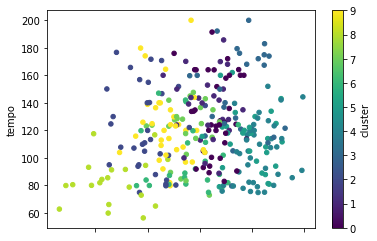

In [45]:
df[df["cluster"] < 10].plot.scatter(x="1", y="tempo", c="cluster", colormap="viridis")

<Axes: xlabel='2', ylabel='12'>

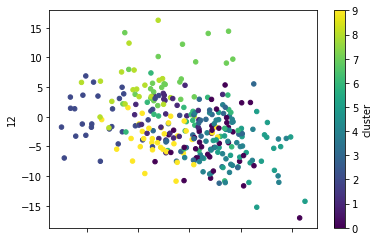

In [51]:
df[df["cluster"] < 10].plot.scatter(x="2", y="12", c="cluster", colormap="viridis")

<Axes: xlabel='acousticness', ylabel='valence'>

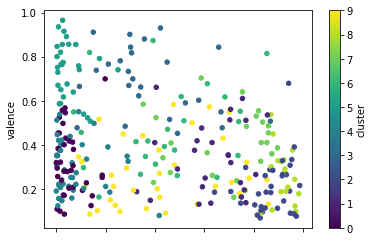

In [38]:
df[df["cluster"] < 10].plot.scatter(x="acousticness", y="valence", c="cluster", colormap="viridis")

<Axes: xlabel='duration_ms', ylabel='loudness'>

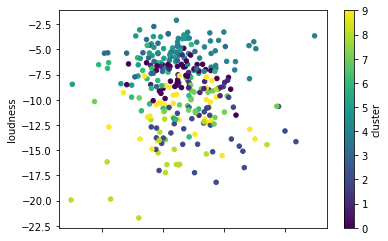

In [39]:
df[df["cluster"] < 10].plot.scatter(x="duration_ms", y="loudness", c="cluster", colormap="viridis")